# A Playground for Conv Nets with LAPPDs+PMT Images

1. Imports

2. Load Data

3. Suffle Data

4. Show Data

5. Models

    5.1 Sequential
     
    5.2 Functional 
     
    5.3 Node
     
    5.4 Inception
     
    5.5 Experiments
     

6. Tensorboard

7. Evaluate on a Testset
    
    7.1 Confusion Matrix

8. Visualize

# 1) Import

In [1]:

#  CSV erkennen by David Maksimovic 24.06.2019
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf
#import keras

#from keras import regularizers
from tensorflow import keras
from tensorflow.keras import regularizers, layers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Dropout,LeakyReLU, Activation,ZeroPadding2D, Flatten, Conv2D, MaxPooling2D, BatchNormalization,Concatenate, Reshape, AveragePooling2D, GlobalAveragePooling2D
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
import time
import pickle
from sklearn.metrics import confusion_matrix
import itertools
import matplotlib.pyplot as plt
import pydot_ng as pydot
import numpy as np
import glob
import os
import random
from mpl_toolkits.axes_grid1 import make_axes_locatable, axes_size

import matplotlib.colors as colors
import matplotlib.cbook as cbook
from matplotlib.colors import DivergingNorm
from matplotlib import ticker, cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap


if keras.backend.backend() == 'tensorflow':
    from keras import backend as K
    import tensorflow as tf
    from keras.utils.conv_utils import convert_kernel
    
    
########### Normalisieren ###########

#Ist schon normalisiert

Using TensorFlow backend.


# 2) Load Data

-Time und LAPPD_Time muss neu berechent werden (ok)



-PMT-Bild erzeugen       (ok)
-LAPPD Bild 1x1 erzeugen (ok)
-LAPPD Bild 5x5 erzeugen (ok)
-LAPPD Bild 10x10 erzeugen (ok)
-PMT 24 Bild erzeugen    (ok)
-PMT+LAPPD 1x1 erzeugen (ok)
-PMT+LAPPD 5x5 erezugen (ok)
-PMT+LAPPD 10x10 erezugen (ok)

CNN
-PMT Charge + PMT Time laden (ok)
-aufteielen (ok)
-nacheinader rechenen lassen (ok)
-PMT Charge + PMT Time rechen lassen (ok)
Perceptron
-C und T nacheinader rechenen lassen
-PMT Charge + PMT Time rechen lassen


-LAPPD 1x1 laden (ok)
-rechene lassen (ok)
-24 PMT laden (ok)
-rechnen lassen (ok)
-LAPPD 5x5 laden (ok)
rechene lassen (ok)

-ausprobieren, vieleicht 10x10 (ok)
Zwischen billanz aus LAPPDs, nächster schritt überdenken




- 



Y 110544 1x1
N 110441 5x5 ?
N 110441 10x10 ?

# PMT CNN

In [5]:
X= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/X_RC_PMT_110k_Files_gn_tf.pickle","rb"))
Y= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/Y_RC_PMT_110k_Files_gn_tf.pickle","rb"))


In [6]:
XTraining = X[:80000]
XVal = X[80000:100000]
XTest = X[100000:]

In [7]:
XTrainingT= XTraining[:,:,:,1].reshape(XTraining.shape[0],XTraining.shape[1],XTraining.shape[2],1)
XTestT = XTest[:,:,:,1].reshape(XTest.shape[0],XTest.shape[1],XTest.shape[2],1)
XValT = XVal[:,:,:,1].reshape(XVal.shape[0],XVal.shape[1],XVal.shape[2],1)

XTrainingC= XTraining[:,:,:,0].reshape(XTraining.shape[0],XTraining.shape[1],XTraining.shape[2],1)
XTestC = XTest[:,:,:,0].reshape(XTest.shape[0],XTest.shape[1],XTest.shape[2],1)
XValC = XVal[:,:,:,0].reshape(XVal.shape[0],XVal.shape[1],XVal.shape[2],1)

Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 83us/sample - loss: 0.5507 - acc: 0.7385 - val_loss: 0.4966 - val_acc: 0.7778
Epoch 2/30
80000/80000 [==============================] - 6s 77us/sample - loss: 0.4885 - acc: 0.7782 - val_loss: 0.8922 - val_acc: 0.4938
Epoch 3/30
80000/80000 [==============================] - 6s 75us/sample - loss: 0.4784 - acc: 0.7844 - val_loss: 0.6186 - val_acc: 0.6601
Epoch 4/30
80000/80000 [==============================] - 6s 75us/sample - loss: 0.4707 - acc: 0.7889 - val_loss: 0.5320 - val_acc: 0.7367
Epoch 5/30
80000/80000 [==============================] - 6s 75us/sample - loss: 0.4661 - acc: 0.7905 - val_loss: 0.4907 - val_acc: 0.7789
Epoch 6/30
80000/80000 [==============================] - 6s 74us/sample - loss: 0.4597 - acc: 0.7951 - val_loss: 0.6667 - val_acc: 0.6025
Epoch 7/30
80000/80000 [==============================] - 6s 75us/sample - loss: 0.4586 - acc: 0.7956 - val_loss: 0.

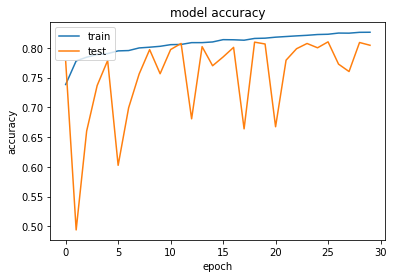

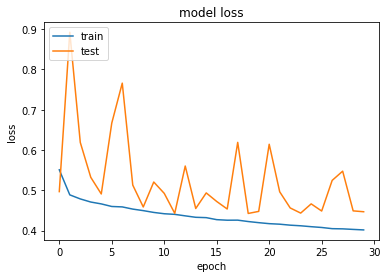

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 88us/sample - loss: 0.5815 - acc: 0.7247 - val_loss: 1.0248 - val_acc: 0.6027
Epoch 2/30
80000/80000 [==============================] - 6s 78us/sample - loss: 0.4984 - acc: 0.7704 - val_loss: 0.6198 - val_acc: 0.6758
Epoch 3/30
80000/80000 [==============================] - 6s 78us/sample - loss: 0.4830 - acc: 0.7801 - val_loss: 0.6000 - val_acc: 0.6744
Epoch 4/30
80000/80000 [==============================] - 6s 78us/sample - loss: 0.4739 - acc: 0.7861 - val_loss: 0.4847 - val_acc: 0.7775
Epoch 5/30
80000/80000 [==============================] - 6s 79us/sample - loss: 0.4694 - acc: 0.7890 - val_loss: 1.7743 - val_acc: 0.4146
Epoch 6/30
80000/80000 [==============================] - 6s 78us/sample - loss: 0.4633 - acc: 0.7934 - val_loss: 0.4788 - val_acc: 0.7861
Epoch 7/30
80000/80000 [==============================] - 6s 78us/sample - loss: 0.4590 - acc: 0

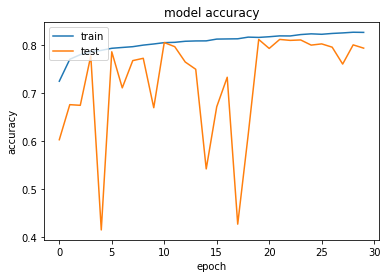

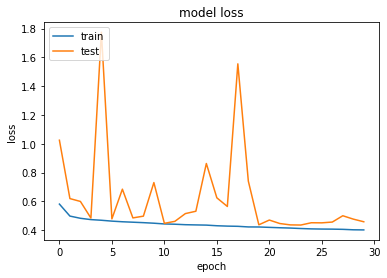

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.5504 - acc: 0.7376 - val_loss: 0.4933 - val_acc: 0.7762
Epoch 2/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.4855 - acc: 0.7794 - val_loss: 0.6615 - val_acc: 0.6151
Epoch 3/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.4750 - acc: 0.7848 - val_loss: 0.5677 - val_acc: 0.7547
Epoch 4/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.4683 - acc: 0.7899 - val_loss: 0.5561 - val_acc: 0.7360
Epoch 5/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.4623 - acc: 0.7921 - val_loss: 0.4979 - val_acc: 0.7788
Epoch 6/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.4593 - acc: 0.7969 - val_loss: 0.8072 - val_acc: 0.6188
Epoch 7/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.4531 - acc: 0

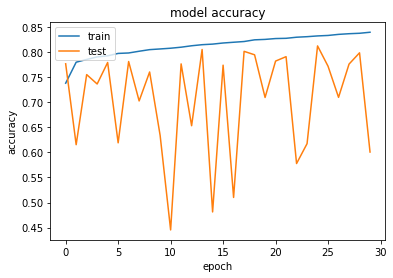

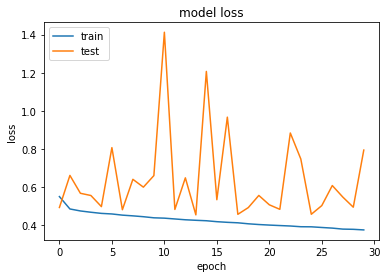

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5531 - acc: 0.7385 - val_loss: 1.6150 - val_acc: 0.4146
Epoch 2/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.4890 - acc: 0.7777 - val_loss: 0.9560 - val_acc: 0.6662
Epoch 3/30
80000/80000 [==============================] - 7s 90us/sample - loss: 0.4752 - acc: 0.7862 - val_loss: 0.4782 - val_acc: 0.7887
Epoch 4/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.4683 - acc: 0.7894 - val_loss: 0.6454 - val_acc: 0.6003
Epoch 5/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.4618 - acc: 0.7939 - val_loss: 0.5165 - val_acc: 0.7783
Epoch 6/30
80000/80000 [==============================] - 7s 90us/sample - loss: 0.4568 - acc: 0.7963 - val_loss: 0.4841 - val_acc: 0.7769
Epoch 7/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.4521 - acc: 

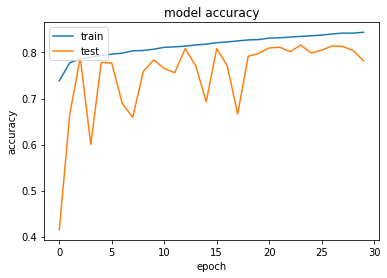

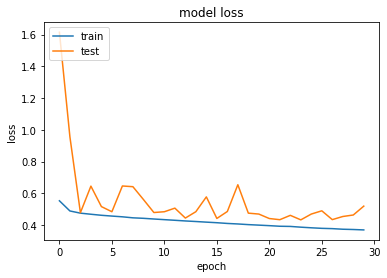

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 108us/sample - loss: 0.5572 - acc: 0.7388 - val_loss: 1.0991 - val_acc: 0.4231
Epoch 2/30
80000/80000 [==============================] - 8s 96us/sample - loss: 0.4863 - acc: 0.7788 - val_loss: 0.5152 - val_acc: 0.7518
Epoch 3/30
80000/80000 [==============================] - 8s 96us/sample - loss: 0.4741 - acc: 0.7871 - val_loss: 1.4084 - val_acc: 0.4233
Epoch 4/30
80000/80000 [==============================] - 8s 96us/sample - loss: 0.4677 - acc: 0.7896 - val_loss: 0.7662 - val_acc: 0.5882
Epoch 5/30
80000/80000 [==============================] - 8s 96us/sample - loss: 0.4612 - acc: 0.7951 - val_loss: 0.4609 - val_acc: 0.7975
Epoch 6/30
80000/80000 [==============================] - 8s 96us/sample - loss: 0.4556 - acc: 0.7966 - val_loss: 0.4695 - val_acc: 0.7962
Epoch 7/30
80000/80000 [==============================] - 8s 96us/sample - loss: 0.4501 - acc: 

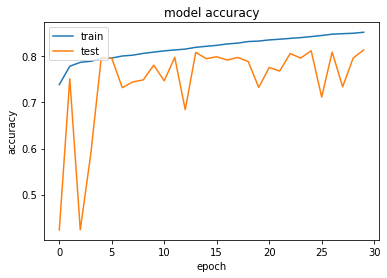

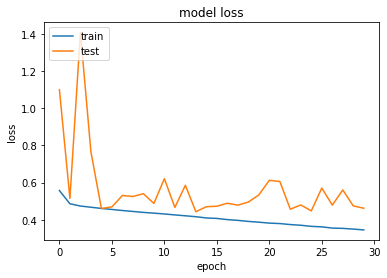

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 117us/sample - loss: 0.5655 - acc: 0.7336 - val_loss: 0.6205 - val_acc: 0.7059
Epoch 2/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.4886 - acc: 0.7771 - val_loss: 0.4888 - val_acc: 0.7873
Epoch 3/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.4735 - acc: 0.7850 - val_loss: 0.5411 - val_acc: 0.7154
Epoch 4/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.4660 - acc: 0.7910 - val_loss: 0.4785 - val_acc: 0.7880
Epoch 5/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.4582 - acc: 0.7953 - val_loss: 0.4675 - val_acc: 0.7972
Epoch 6/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.4536 - acc: 0.7997 - val_loss: 0.4832 - val_acc: 0.7908
Epoch 7/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.4469 -

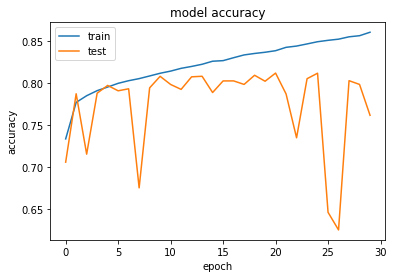

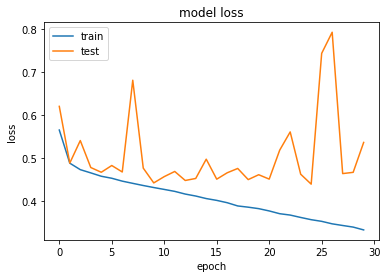

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 187us/sample - loss: 0.5580 - acc: 0.7376 - val_loss: 2.1679 - val_acc: 0.6097
Epoch 2/30
80000/80000 [==============================] - 14s 172us/sample - loss: 0.4834 - acc: 0.7814 - val_loss: 0.5426 - val_acc: 0.7653
Epoch 3/30
80000/80000 [==============================] - 14s 172us/sample - loss: 0.4702 - acc: 0.7887 - val_loss: 0.6310 - val_acc: 0.6688
Epoch 4/30
80000/80000 [==============================] - 14s 172us/sample - loss: 0.4624 - acc: 0.7945 - val_loss: 1.1068 - val_acc: 0.4462
Epoch 5/30
80000/80000 [==============================] - 14s 172us/sample - loss: 0.4549 - acc: 0.7983 - val_loss: 0.4879 - val_acc: 0.7778
Epoch 6/30
80000/80000 [==============================] - 14s 172us/sample - loss: 0.4487 - acc: 0.8016 - val_loss: 0.6306 - val_acc: 0.6317
Epoch 7/30
80000/80000 [==============================] - 14s 171us/sample - loss: 0

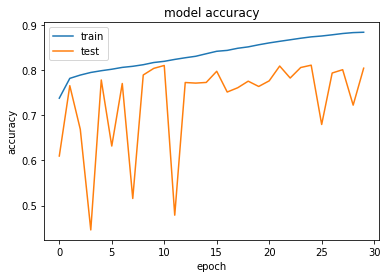

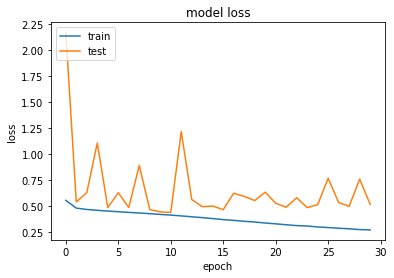

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 16s 205us/sample - loss: 0.5572 - acc: 0.7391 - val_loss: 0.5300 - val_acc: 0.7480
Epoch 2/30
80000/80000 [==============================] - 15s 189us/sample - loss: 0.4835 - acc: 0.7810 - val_loss: 0.8539 - val_acc: 0.5369
Epoch 3/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0.4704 - acc: 0.7875 - val_loss: 0.4812 - val_acc: 0.7900
Epoch 4/30
80000/80000 [==============================] - 15s 189us/sample - loss: 0.4598 - acc: 0.7935 - val_loss: 0.5685 - val_acc: 0.7375
Epoch 5/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0.4531 - acc: 0.8000 - val_loss: 0.4829 - val_acc: 0.7785
Epoch 6/30
80000/80000 [==============================] - 15s 189us/sample - loss: 0.4457 - acc: 0.8029 - val_loss: 0.4437 - val_acc: 0.8046
Epoch 7/30
80000/80000 [==============================] - 15s 189us/sample - loss: 0

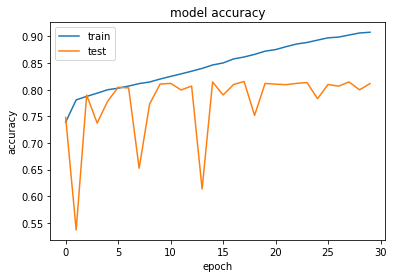

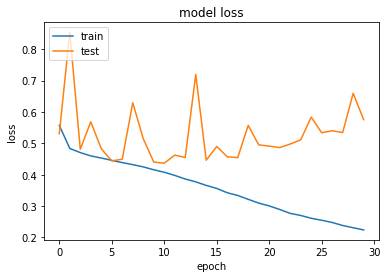

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 110us/sample - loss: 0.5500 - acc: 0.7404 - val_loss: 0.9819 - val_acc: 0.4841
Epoch 2/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.4817 - acc: 0.7814 - val_loss: 0.5070 - val_acc: 0.7546
Epoch 3/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.4689 - acc: 0.7886 - val_loss: 0.5851 - val_acc: 0.6579
Epoch 4/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.4613 - acc: 0.7926 - val_loss: 1.1941 - val_acc: 0.4681
Epoch 5/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.4547 - acc: 0.7978 - val_loss: 0.4749 - val_acc: 0.7793
Epoch 6/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.4493 - acc: 0.8010 - val_loss: 0.5096 - val_acc: 0.7673
Epoch 7/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.4445 - acc: 

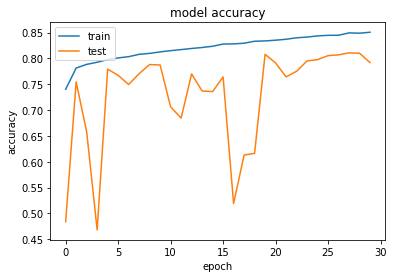

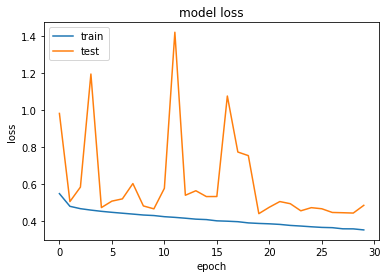

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 119us/sample - loss: 0.5673 - acc: 0.7260 - val_loss: 0.5078 - val_acc: 0.7650
Epoch 2/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.4927 - acc: 0.7742 - val_loss: 1.3855 - val_acc: 0.4369
Epoch 3/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.4789 - acc: 0.7836 - val_loss: 1.9174 - val_acc: 0.4120
Epoch 4/30
80000/80000 [==============================] - 8s 101us/sample - loss: 0.4690 - acc: 0.7894 - val_loss: 2.1611 - val_acc: 0.4133
Epoch 5/30
80000/80000 [==============================] - 8s 101us/sample - loss: 0.4622 - acc: 0.7931 - val_loss: 0.4788 - val_acc: 0.7910
Epoch 6/30
80000/80000 [==============================] - 8s 101us/sample - loss: 0.4578 - acc: 0.7972 - val_loss: 0.5684 - val_acc: 0.6913
Epoch 7/30
80000/80000 [==============================] - 8s 101us/sample - loss: 0.4528 

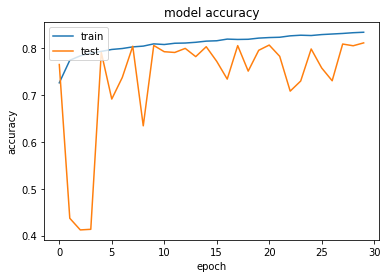

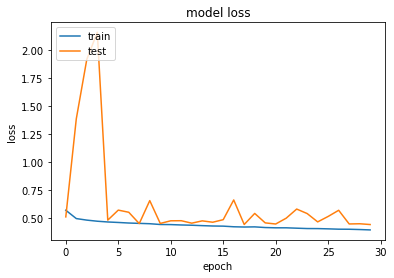

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5387 - acc: 0.7466 - val_loss: 0.5272 - val_acc: 0.7286
Epoch 2/30
80000/80000 [==============================] - 9s 110us/sample - loss: 0.4775 - acc: 0.7843 - val_loss: 1.1218 - val_acc: 0.4633
Epoch 3/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.4653 - acc: 0.7912 - val_loss: 0.7684 - val_acc: 0.6086
Epoch 4/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.4574 - acc: 0.7968 - val_loss: 0.5144 - val_acc: 0.7530
Epoch 5/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.4508 - acc: 0.8011 - val_loss: 0.4674 - val_acc: 0.7925
Epoch 6/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.4434 - acc: 0.8051 - val_loss: 0.8165 - val_acc: 0.5734
Epoch 7/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.4390 

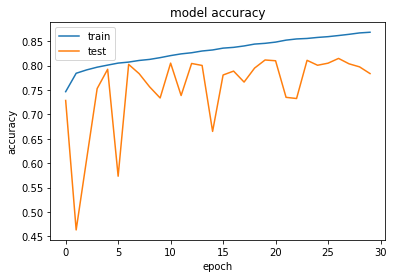

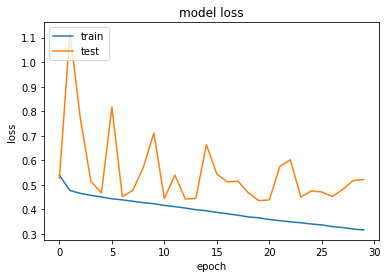

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.5686 - acc: 0.7293 - val_loss: 1.0596 - val_acc: 0.4630
Epoch 2/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.4887 - acc: 0.7776 - val_loss: 0.9811 - val_acc: 0.6584
Epoch 3/30
80000/80000 [==============================] - 10s 119us/sample - loss: 0.4762 - acc: 0.7841 - val_loss: 0.5790 - val_acc: 0.7424
Epoch 4/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.4678 - acc: 0.7911 - val_loss: 0.7064 - val_acc: 0.6479
Epoch 5/30
80000/80000 [==============================] - 10s 119us/sample - loss: 0.4597 - acc: 0.7961 - val_loss: 0.5377 - val_acc: 0.7199
Epoch 6/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.4542 - acc: 0.7981 - val_loss: 0.9118 - val_acc: 0.5087
Epoch 7/30
80000/80000 [==============================] - 10s 119us/sample - loss: 0

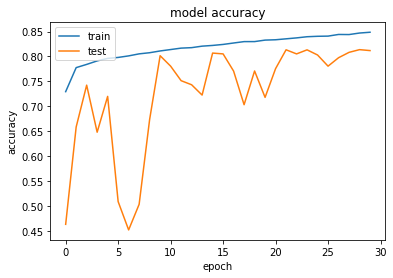

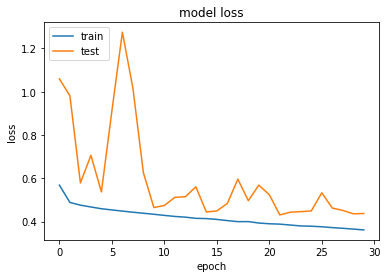

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.5449 - acc: 0.7440 - val_loss: 0.4759 - val_acc: 0.7817
Epoch 2/30
80000/80000 [==============================] - 10s 126us/sample - loss: 0.4776 - acc: 0.7842 - val_loss: 0.6923 - val_acc: 0.5910
Epoch 3/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0.4653 - acc: 0.7917 - val_loss: 0.6503 - val_acc: 0.6441
Epoch 4/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0.4575 - acc: 0.7964 - val_loss: 0.5040 - val_acc: 0.7547
Epoch 5/30
80000/80000 [==============================] - 10s 126us/sample - loss: 0.4501 - acc: 0.8015 - val_loss: 1.0534 - val_acc: 0.5031
Epoch 6/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0.4439 - acc: 0.8038 - val_loss: 0.7185 - val_acc: 0.6557
Epoch 7/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0

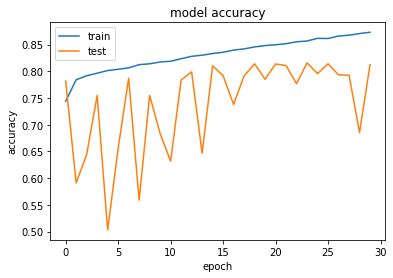

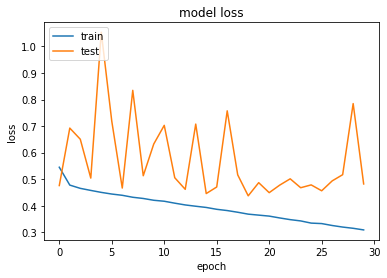

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.5589 - acc: 0.7354 - val_loss: 0.5058 - val_acc: 0.7770
Epoch 2/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0.4858 - acc: 0.7783 - val_loss: 0.6280 - val_acc: 0.6668
Epoch 3/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0.4708 - acc: 0.7865 - val_loss: 0.4686 - val_acc: 0.7879
Epoch 4/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0.4634 - acc: 0.7928 - val_loss: 0.5149 - val_acc: 0.7411
Epoch 5/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0.4568 - acc: 0.7960 - val_loss: 0.5577 - val_acc: 0.6946
Epoch 6/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0.4497 - acc: 0.8018 - val_loss: 1.6390 - val_acc: 0.4241
Epoch 7/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0

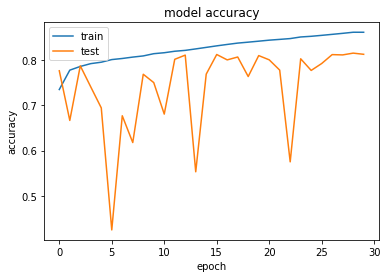

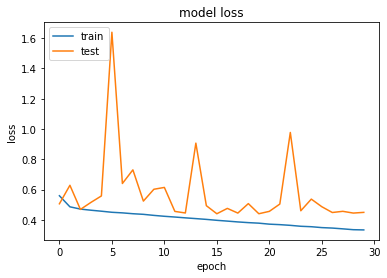

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 19s 243us/sample - loss: 0.5426 - acc: 0.7442 - val_loss: 0.4779 - val_acc: 0.7833
Epoch 2/30
80000/80000 [==============================] - 18s 221us/sample - loss: 0.4760 - acc: 0.7847 - val_loss: 0.9297 - val_acc: 0.5142
Epoch 3/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4623 - acc: 0.7940 - val_loss: 0.5297 - val_acc: 0.7442
Epoch 4/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4540 - acc: 0.7975 - val_loss: 0.4682 - val_acc: 0.7856
Epoch 5/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4455 - acc: 0.8025 - val_loss: 0.6121 - val_acc: 0.6412
Epoch 6/30
80000/80000 [==============================] - 18s 221us/sample - loss: 0.4400 - acc: 0.8072 - val_loss: 0.6715 - val_acc: 0.7520
Epoch 7/30
80000/80000 [==============================] - 18s 221us/sample - loss: 0

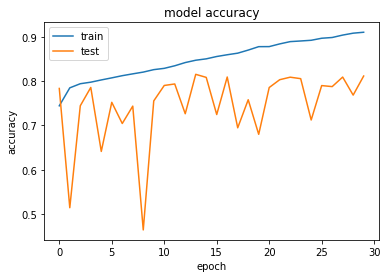

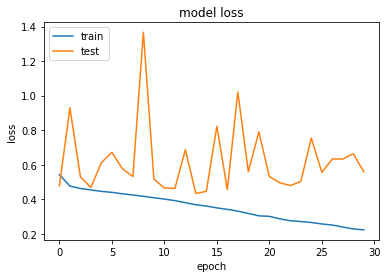

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.5476 - acc: 0.7412 - val_loss: 0.6105 - val_acc: 0.6576
Epoch 2/30
80000/80000 [==============================] - 19s 239us/sample - loss: 0.4826 - acc: 0.7807 - val_loss: 1.5196 - val_acc: 0.4349
Epoch 3/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.4676 - acc: 0.7889 - val_loss: 0.9945 - val_acc: 0.4588
Epoch 4/30
80000/80000 [==============================] - 19s 239us/sample - loss: 0.4588 - acc: 0.7967 - val_loss: 0.6605 - val_acc: 0.6321
Epoch 5/30
80000/80000 [==============================] - 19s 239us/sample - loss: 0.4520 - acc: 0.7992 - val_loss: 0.5796 - val_acc: 0.7413
Epoch 6/30
80000/80000 [==============================] - 19s 239us/sample - loss: 0.4445 - acc: 0.8043 - val_loss: 0.5862 - val_acc: 0.6850
Epoch 7/30
80000/80000 [==============================] - 19s 239us/sample - loss: 0

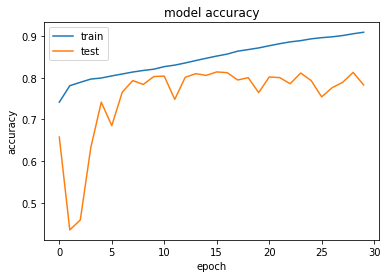

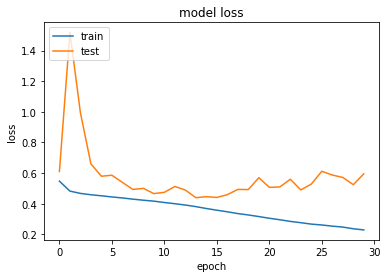

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.5495 - acc: 0.7392 - val_loss: 1.6336 - val_acc: 0.4148
Epoch 2/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.4831 - acc: 0.7814 - val_loss: 1.4932 - val_acc: 0.4370
Epoch 3/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.4701 - acc: 0.7891 - val_loss: 0.4609 - val_acc: 0.7947
Epoch 4/30
80000/80000 [==============================] - 9s 116us/sample - loss: 0.4624 - acc: 0.7927 - val_loss: 0.5092 - val_acc: 0.7776
Epoch 5/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.4562 - acc: 0.7973 - val_loss: 0.8025 - val_acc: 0.5659
Epoch 6/30
80000/80000 [==============================] - 9s 116us/sample - loss: 0.4501 - acc: 0.8007 - val_loss: 0.5511 - val_acc: 0.7125
Epoch 7/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.4450 

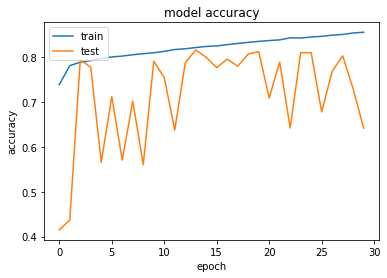

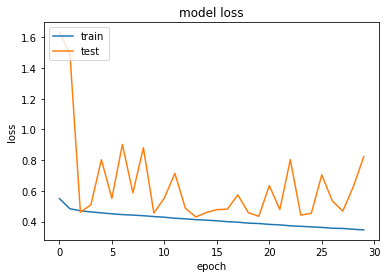

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 153us/sample - loss: 0.5789 - acc: 0.7200 - val_loss: 1.4260 - val_acc: 0.4153
Epoch 2/30
80000/80000 [==============================] - 10s 124us/sample - loss: 0.5001 - acc: 0.7699 - val_loss: 1.8005 - val_acc: 0.4115
Epoch 3/30
80000/80000 [==============================] - 10s 124us/sample - loss: 0.4829 - acc: 0.7810 - val_loss: 0.5245 - val_acc: 0.7370
Epoch 4/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4751 - acc: 0.7849 - val_loss: 0.6229 - val_acc: 0.7011
Epoch 5/30
80000/80000 [==============================] - 10s 124us/sample - loss: 0.4666 - acc: 0.7912 - val_loss: 0.9741 - val_acc: 0.5033
Epoch 6/30
80000/80000 [==============================] - 10s 125us/sample - loss: 0.4626 - acc: 0.7935 - val_loss: 0.4755 - val_acc: 0.7817
Epoch 7/30
80000/80000 [==============================] - 10s 124us/sample - loss: 0

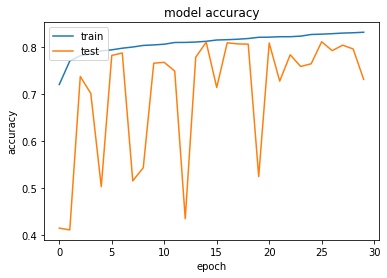

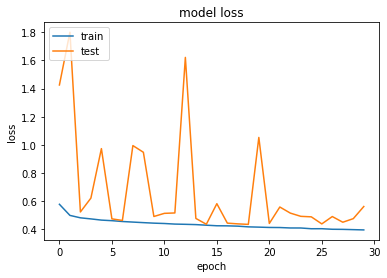

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 159us/sample - loss: 0.5491 - acc: 0.7412 - val_loss: 0.4727 - val_acc: 0.7872
Epoch 2/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.4788 - acc: 0.7833 - val_loss: 0.5856 - val_acc: 0.7188
Epoch 3/30
80000/80000 [==============================] - 10s 131us/sample - loss: 0.4644 - acc: 0.7909 - val_loss: 0.4784 - val_acc: 0.7837
Epoch 4/30
80000/80000 [==============================] - 10s 131us/sample - loss: 0.4579 - acc: 0.7976 - val_loss: 0.4970 - val_acc: 0.7570
Epoch 5/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.4518 - acc: 0.7998 - val_loss: 0.4819 - val_acc: 0.7815
Epoch 6/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.4455 - acc: 0.8035 - val_loss: 0.4468 - val_acc: 0.8038
Epoch 7/30
80000/80000 [==============================] - 11s 133us/sample - loss: 0

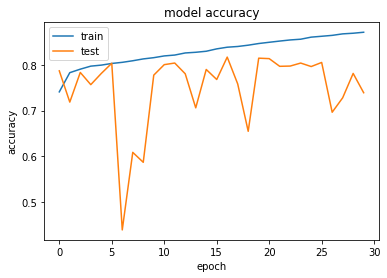

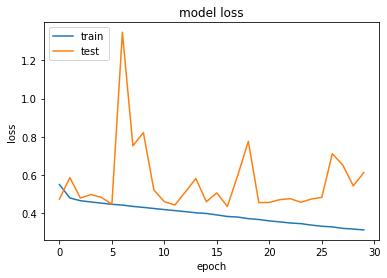

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 171us/sample - loss: 0.5822 - acc: 0.7203 - val_loss: 0.5825 - val_acc: 0.6785
Epoch 2/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.4919 - acc: 0.7752 - val_loss: 0.9707 - val_acc: 0.5660
Epoch 3/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.4776 - acc: 0.7846 - val_loss: 2.2049 - val_acc: 0.4112
Epoch 4/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.4685 - acc: 0.7885 - val_loss: 0.6166 - val_acc: 0.7378
Epoch 5/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.4633 - acc: 0.7930 - val_loss: 0.5953 - val_acc: 0.7081
Epoch 6/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.4547 - acc: 0.7989 - val_loss: 0.6205 - val_acc: 0.7408
Epoch 7/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0

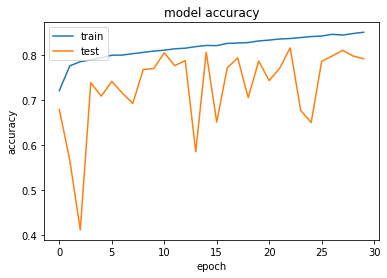

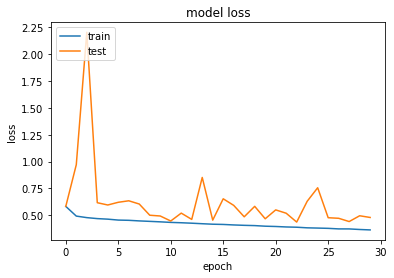

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 188us/sample - loss: 0.5432 - acc: 0.7443 - val_loss: 0.9461 - val_acc: 0.4746
Epoch 2/30
80000/80000 [==============================] - 12s 156us/sample - loss: 0.4756 - acc: 0.7846 - val_loss: 0.4812 - val_acc: 0.7778
Epoch 3/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.4647 - acc: 0.7919 - val_loss: 0.5219 - val_acc: 0.7497
Epoch 4/30
80000/80000 [==============================] - 12s 154us/sample - loss: 0.4579 - acc: 0.7969 - val_loss: 0.5118 - val_acc: 0.7524
Epoch 5/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4510 - acc: 0.7996 - val_loss: 0.5256 - val_acc: 0.7715
Epoch 6/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4460 - acc: 0.8030 - val_loss: 0.5296 - val_acc: 0.7807
Epoch 7/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0

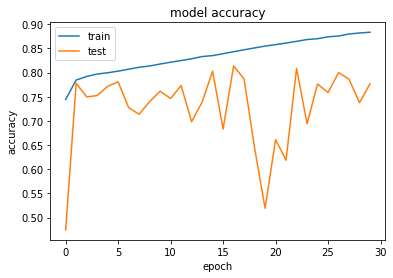

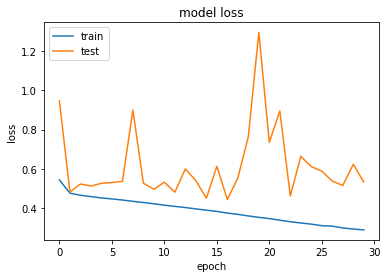

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 194us/sample - loss: 0.5734 - acc: 0.7273 - val_loss: 1.8515 - val_acc: 0.4115
Epoch 2/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4907 - acc: 0.7752 - val_loss: 0.6581 - val_acc: 0.6541
Epoch 3/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4738 - acc: 0.7866 - val_loss: 0.9561 - val_acc: 0.5361
Epoch 4/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4643 - acc: 0.7918 - val_loss: 0.6732 - val_acc: 0.6691
Epoch 5/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4579 - acc: 0.7959 - val_loss: 0.4559 - val_acc: 0.8000
Epoch 6/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4529 - acc: 0.8001 - val_loss: 0.5940 - val_acc: 0.6884
Epoch 7/30
80000/80000 [==============================] - 13s 161us/sample - loss: 0

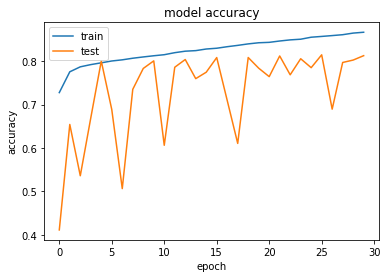

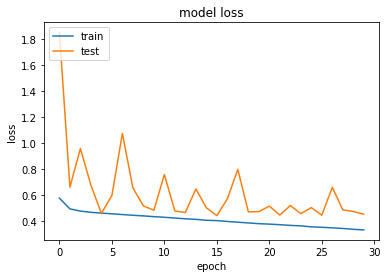

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 22s 279us/sample - loss: 0.5554 - acc: 0.7384 - val_loss: 0.5094 - val_acc: 0.7563
Epoch 2/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0.4777 - acc: 0.7828 - val_loss: 0.9158 - val_acc: 0.5861
Epoch 3/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0.4644 - acc: 0.7914 - val_loss: 0.8399 - val_acc: 0.5094
Epoch 4/30
80000/80000 [==============================] - 20s 246us/sample - loss: 0.4558 - acc: 0.7976 - val_loss: 0.5322 - val_acc: 0.7172
Epoch 5/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0.4491 - acc: 0.8013 - val_loss: 0.7919 - val_acc: 0.6069
Epoch 6/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0.4417 - acc: 0.8071 - val_loss: 0.4501 - val_acc: 0.8001
Epoch 7/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0

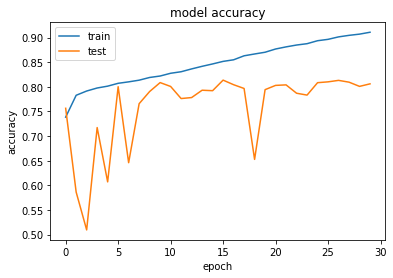

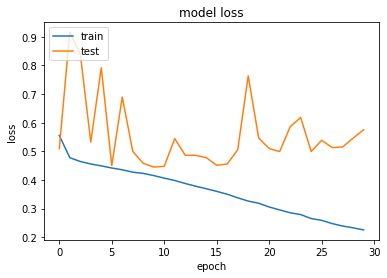

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 24s 299us/sample - loss: 0.5559 - acc: 0.7352 - val_loss: 0.5036 - val_acc: 0.7605
Epoch 2/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.4841 - acc: 0.7807 - val_loss: 1.6995 - val_acc: 0.4137
Epoch 3/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.4704 - acc: 0.7889 - val_loss: 0.4866 - val_acc: 0.7753
Epoch 4/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.4621 - acc: 0.7949 - val_loss: 0.4581 - val_acc: 0.7954
Epoch 5/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.4537 - acc: 0.7990 - val_loss: 1.0368 - val_acc: 0.4913
Epoch 6/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.4475 - acc: 0.8021 - val_loss: 0.7608 - val_acc: 0.6700
Epoch 7/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0

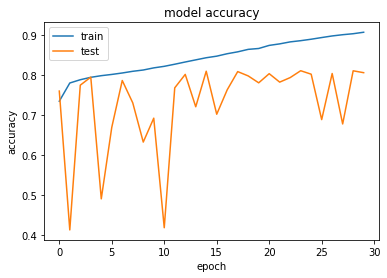

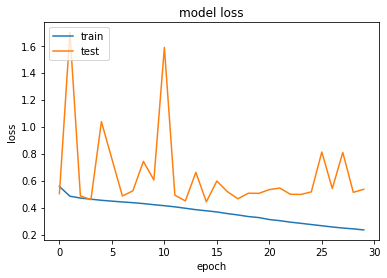

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.5482 - acc: 0.7430 - val_loss: 0.4857 - val_acc: 0.7866
Epoch 2/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.4824 - acc: 0.7815 - val_loss: 0.7541 - val_acc: 0.5566
Epoch 3/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.4668 - acc: 0.7916 - val_loss: 0.4568 - val_acc: 0.8001
Epoch 4/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.4593 - acc: 0.7967 - val_loss: 0.4591 - val_acc: 0.7960
Epoch 5/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.4512 - acc: 0.8004 - val_loss: 0.4591 - val_acc: 0.8015
Epoch 6/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.4456 - acc: 0.8037 - val_loss: 0.4914 - val_acc: 0.7880
Epoch 7/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.4397 - acc:

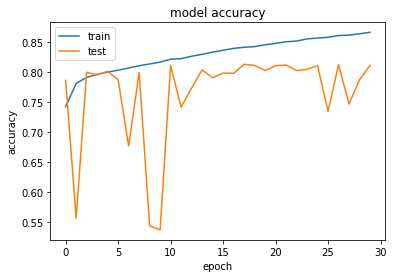

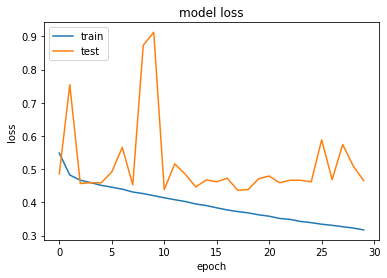

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.5705 - acc: 0.7305 - val_loss: 0.5940 - val_acc: 0.6759
Epoch 2/30
80000/80000 [==============================] - 8s 105us/sample - loss: 0.4851 - acc: 0.7796 - val_loss: 0.4897 - val_acc: 0.7727
Epoch 3/30
80000/80000 [==============================] - 8s 105us/sample - loss: 0.4691 - acc: 0.7899 - val_loss: 0.4936 - val_acc: 0.7802
Epoch 4/30
80000/80000 [==============================] - 8s 105us/sample - loss: 0.4597 - acc: 0.7951 - val_loss: 0.5324 - val_acc: 0.7287
Epoch 5/30
80000/80000 [==============================] - 8s 105us/sample - loss: 0.4509 - acc: 0.8014 - val_loss: 0.5930 - val_acc: 0.6799
Epoch 6/30
80000/80000 [==============================] - 8s 105us/sample - loss: 0.4439 - acc: 0.8050 - val_loss: 0.5368 - val_acc: 0.7610
Epoch 7/30
80000/80000 [==============================] - 8s 106us/sample - loss: 0.4365 

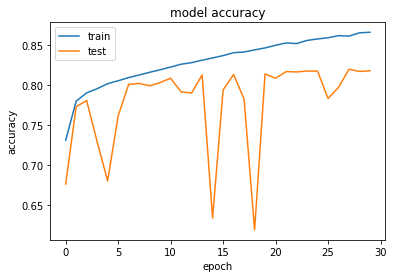

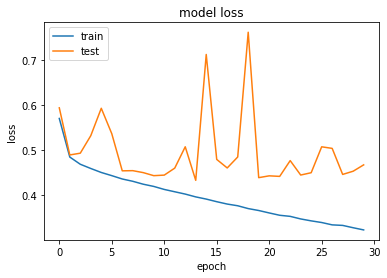

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 147us/sample - loss: 0.5410 - acc: 0.7445 - val_loss: 0.6368 - val_acc: 0.7119
Epoch 2/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.4799 - acc: 0.7843 - val_loss: 0.8482 - val_acc: 0.5148
Epoch 3/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.4667 - acc: 0.7920 - val_loss: 0.5568 - val_acc: 0.7576
Epoch 4/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.4552 - acc: 0.7978 - val_loss: 0.5175 - val_acc: 0.7778
Epoch 5/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.4478 - acc: 0.8021 - val_loss: 0.5265 - val_acc: 0.7286
Epoch 6/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.4396 - acc: 0.8068 - val_loss: 0.4463 - val_acc: 0.8062
Epoch 7/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.4325 

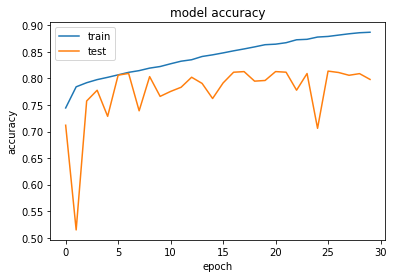

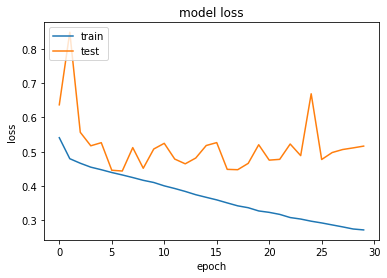

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 159us/sample - loss: 0.5344 - acc: 0.7473 - val_loss: 0.7398 - val_acc: 0.5630
Epoch 2/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.4784 - acc: 0.7851 - val_loss: 0.5509 - val_acc: 0.7542
Epoch 3/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.4609 - acc: 0.7948 - val_loss: 0.5001 - val_acc: 0.7819
Epoch 4/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.4525 - acc: 0.7999 - val_loss: 0.6095 - val_acc: 0.6422
Epoch 5/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.4428 - acc: 0.8052 - val_loss: 0.7796 - val_acc: 0.7260
Epoch 6/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.4355 - acc: 0.8103 - val_loss: 0.5578 - val_acc: 0.7811
Epoch 7/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0

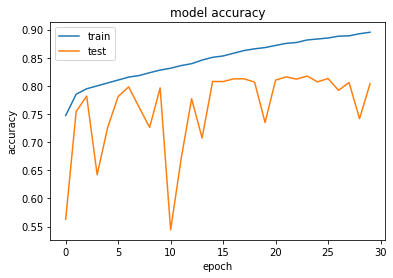

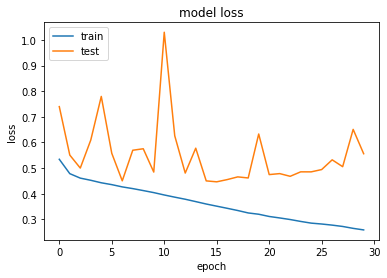

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 165us/sample - loss: 0.5429 - acc: 0.7454 - val_loss: 0.5259 - val_acc: 0.7451
Epoch 2/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4793 - acc: 0.7842 - val_loss: 0.9697 - val_acc: 0.4713
Epoch 3/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4670 - acc: 0.7914 - val_loss: 1.1696 - val_acc: 0.4399
Epoch 4/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4575 - acc: 0.7969 - val_loss: 0.5466 - val_acc: 0.7139
Epoch 5/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4476 - acc: 0.8041 - val_loss: 0.4610 - val_acc: 0.7993
Epoch 6/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4393 - acc: 0.8073 - val_loss: 0.6752 - val_acc: 0.7349
Epoch 7/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0

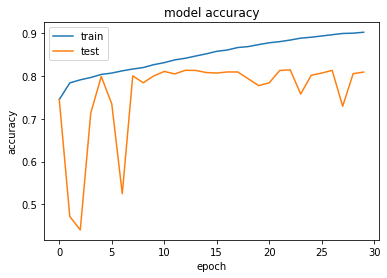

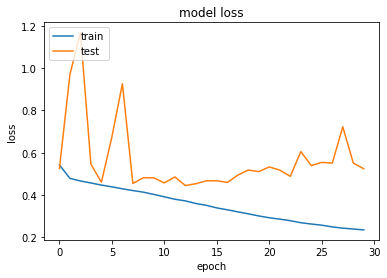

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 179us/sample - loss: 0.5617 - acc: 0.7377 - val_loss: 0.4909 - val_acc: 0.7731
Epoch 2/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.4797 - acc: 0.7825 - val_loss: 1.6360 - val_acc: 0.4171
Epoch 3/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.4616 - acc: 0.7937 - val_loss: 0.4873 - val_acc: 0.7699
Epoch 4/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.4528 - acc: 0.8000 - val_loss: 0.5624 - val_acc: 0.6899
Epoch 5/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.4432 - acc: 0.8061 - val_loss: 0.9429 - val_acc: 0.4929
Epoch 6/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.4333 - acc: 0.8115 - val_loss: 0.5436 - val_acc: 0.7374
Epoch 7/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0

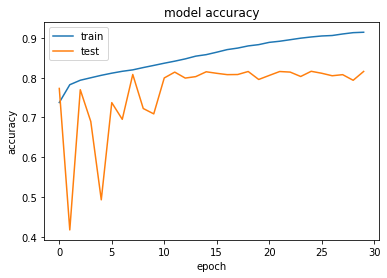

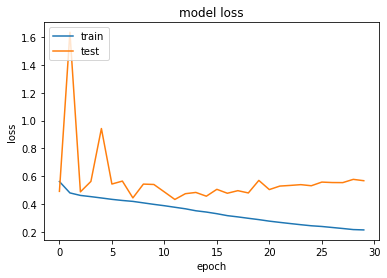

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 20s 253us/sample - loss: 0.5627 - acc: 0.7368 - val_loss: 0.5658 - val_acc: 0.7529
Epoch 2/30
80000/80000 [==============================] - 17s 210us/sample - loss: 0.4800 - acc: 0.7843 - val_loss: 0.7957 - val_acc: 0.7078
Epoch 3/30
80000/80000 [==============================] - 17s 210us/sample - loss: 0.4635 - acc: 0.7931 - val_loss: 0.4889 - val_acc: 0.7849
Epoch 4/30
80000/80000 [==============================] - 17s 209us/sample - loss: 0.4532 - acc: 0.8004 - val_loss: 0.7191 - val_acc: 0.7478
Epoch 5/30
80000/80000 [==============================] - 17s 210us/sample - loss: 0.4441 - acc: 0.8052 - val_loss: 0.5123 - val_acc: 0.7514
Epoch 6/30
80000/80000 [==============================] - 17s 210us/sample - loss: 0.4324 - acc: 0.8121 - val_loss: 0.4400 - val_acc: 0.8123
Epoch 7/30
80000/80000 [==============================] - 17s 210us/sample - loss: 0

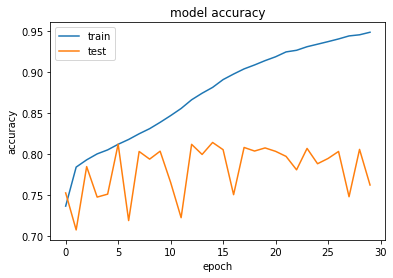

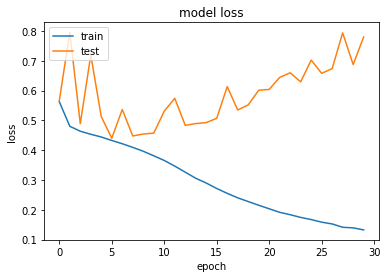

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 22s 276us/sample - loss: 0.5504 - acc: 0.7400 - val_loss: 0.5265 - val_acc: 0.7487
Epoch 2/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.4758 - acc: 0.7860 - val_loss: 0.5026 - val_acc: 0.7652
Epoch 3/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.4586 - acc: 0.7977 - val_loss: 0.4708 - val_acc: 0.7865
Epoch 4/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.4454 - acc: 0.8055 - val_loss: 1.0273 - val_acc: 0.4794
Epoch 5/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.4363 - acc: 0.8099 - val_loss: 0.6060 - val_acc: 0.7560
Epoch 6/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.4271 - acc: 0.8143 - val_loss: 0.4770 - val_acc: 0.7815
Epoch 7/30
80000/80000 [==============================] - 19s 234us/sample - loss: 0

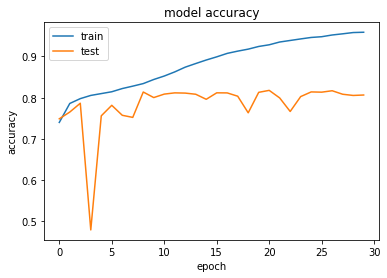

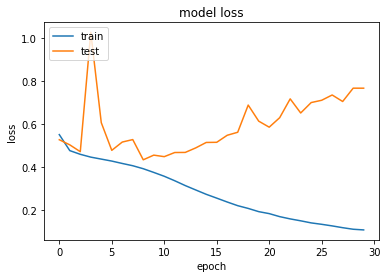

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.5643 - acc: 0.7341 - val_loss: 0.8143 - val_acc: 0.5278
Epoch 2/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.4808 - acc: 0.7825 - val_loss: 0.6865 - val_acc: 0.6148
Epoch 3/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.4636 - acc: 0.7930 - val_loss: 0.5804 - val_acc: 0.6978
Epoch 4/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.4555 - acc: 0.7969 - val_loss: 0.7006 - val_acc: 0.7391
Epoch 5/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.4467 - acc: 0.8033 - val_loss: 0.4455 - val_acc: 0.8065
Epoch 6/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.4409 - acc: 0.8068 - val_loss: 0.4609 - val_acc: 0.7990
Epoch 7/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.4339 

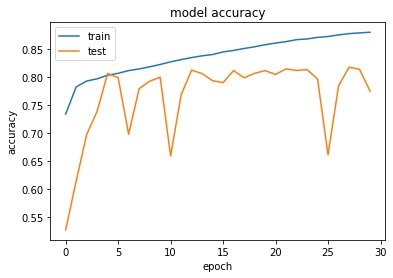

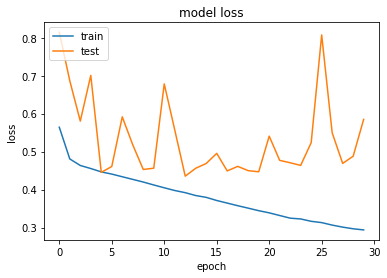

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 173us/sample - loss: 0.5529 - acc: 0.7375 - val_loss: 0.4965 - val_acc: 0.7722
Epoch 2/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4793 - acc: 0.7839 - val_loss: 0.5141 - val_acc: 0.7492
Epoch 3/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0.4649 - acc: 0.7930 - val_loss: 0.6031 - val_acc: 0.7474
Epoch 4/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4556 - acc: 0.7978 - val_loss: 0.9768 - val_acc: 0.6811
Epoch 5/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4470 - acc: 0.8023 - val_loss: 0.5924 - val_acc: 0.6888
Epoch 6/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.4424 - acc: 0.8054 - val_loss: 0.8666 - val_acc: 0.6726
Epoch 7/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0

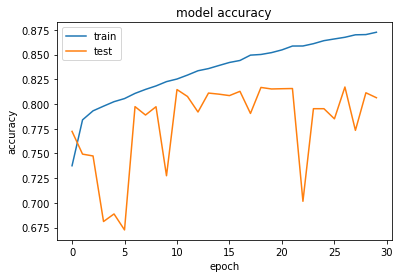

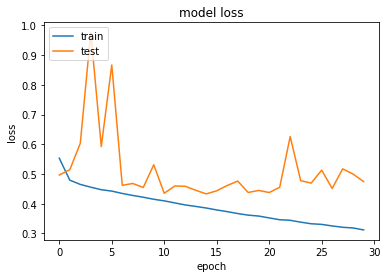

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 180us/sample - loss: 0.5328 - acc: 0.7475 - val_loss: 0.6475 - val_acc: 0.6151
Epoch 2/30
80000/80000 [==============================] - 11s 135us/sample - loss: 0.4720 - acc: 0.7869 - val_loss: 0.5108 - val_acc: 0.7546
Epoch 3/30
80000/80000 [==============================] - 11s 135us/sample - loss: 0.4590 - acc: 0.7961 - val_loss: 0.6282 - val_acc: 0.6600
Epoch 4/30
80000/80000 [==============================] - 11s 135us/sample - loss: 0.4488 - acc: 0.8021 - val_loss: 0.5065 - val_acc: 0.7922
Epoch 5/30
80000/80000 [==============================] - 11s 135us/sample - loss: 0.4398 - acc: 0.8075 - val_loss: 0.7378 - val_acc: 0.6123
Epoch 6/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.4324 - acc: 0.8125 - val_loss: 0.4453 - val_acc: 0.8023
Epoch 7/30
80000/80000 [==============================] - 11s 135us/sample - loss: 0

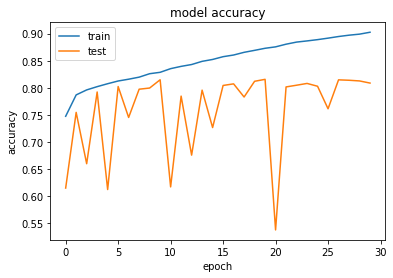

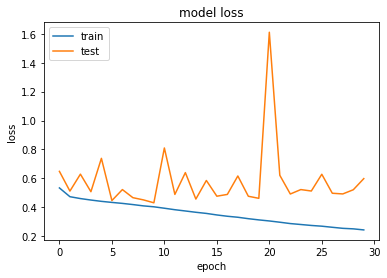

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 193us/sample - loss: 0.5613 - acc: 0.7347 - val_loss: 0.8839 - val_acc: 0.5101
Epoch 2/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.4800 - acc: 0.7836 - val_loss: 0.9931 - val_acc: 0.6562
Epoch 3/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.4631 - acc: 0.7933 - val_loss: 0.4846 - val_acc: 0.7797
Epoch 4/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.4524 - acc: 0.8012 - val_loss: 0.7826 - val_acc: 0.5817
Epoch 5/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.4459 - acc: 0.8047 - val_loss: 0.4673 - val_acc: 0.7893
Epoch 6/30
80000/80000 [==============================] - 12s 145us/sample - loss: 0.4376 - acc: 0.8086 - val_loss: 0.4448 - val_acc: 0.8080
Epoch 7/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0

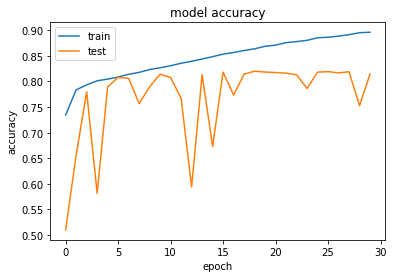

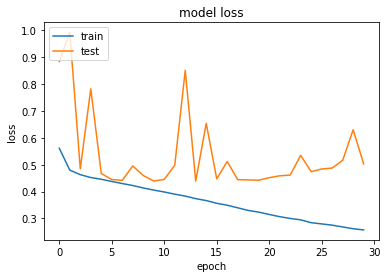

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 16s 200us/sample - loss: 0.5356 - acc: 0.7472 - val_loss: 0.4977 - val_acc: 0.7713
Epoch 2/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4748 - acc: 0.7865 - val_loss: 0.5390 - val_acc: 0.7458
Epoch 3/30
80000/80000 [==============================] - 12s 155us/sample - loss: 0.4600 - acc: 0.7943 - val_loss: 1.1734 - val_acc: 0.6829
Epoch 4/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4474 - acc: 0.8029 - val_loss: 0.4535 - val_acc: 0.8004
Epoch 5/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4386 - acc: 0.8084 - val_loss: 1.3373 - val_acc: 0.4654
Epoch 6/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4314 - acc: 0.8123 - val_loss: 0.6576 - val_acc: 0.7691
Epoch 7/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0

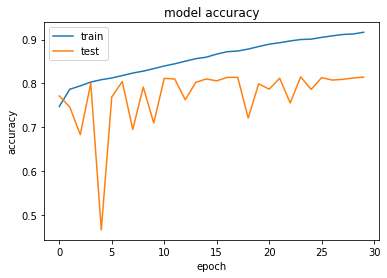

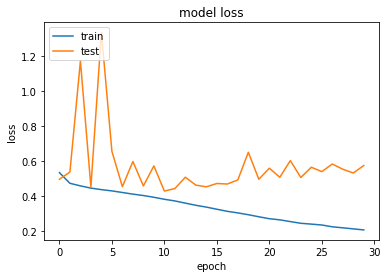

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 17s 215us/sample - loss: 0.5709 - acc: 0.7329 - val_loss: 0.4856 - val_acc: 0.7795
Epoch 2/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.4797 - acc: 0.7845 - val_loss: 0.5206 - val_acc: 0.7738
Epoch 3/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.4619 - acc: 0.7939 - val_loss: 0.6514 - val_acc: 0.6292
Epoch 4/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.4521 - acc: 0.8009 - val_loss: 0.5149 - val_acc: 0.7566
Epoch 5/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.4426 - acc: 0.8065 - val_loss: 0.6226 - val_acc: 0.7515
Epoch 6/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.4351 - acc: 0.8102 - val_loss: 0.4827 - val_acc: 0.7870
Epoch 7/30
80000/80000 [==============================] - 13s 163us/sample - loss: 0

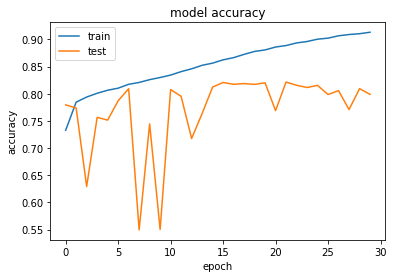

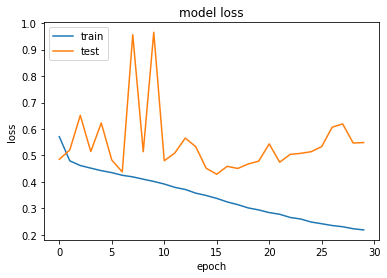

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5394 - acc: 0.7473 - val_loss: 0.4930 - val_acc: 0.7735
Epoch 2/30
80000/80000 [==============================] - 19s 236us/sample - loss: 0.4716 - acc: 0.7879 - val_loss: 1.1032 - val_acc: 0.4640
Epoch 3/30
80000/80000 [==============================] - 19s 237us/sample - loss: 0.4562 - acc: 0.7987 - val_loss: 0.4726 - val_acc: 0.7872
Epoch 4/30
80000/80000 [==============================] - 19s 237us/sample - loss: 0.4456 - acc: 0.8040 - val_loss: 0.7026 - val_acc: 0.6056
Epoch 5/30
80000/80000 [==============================] - 19s 237us/sample - loss: 0.4352 - acc: 0.8109 - val_loss: 0.4393 - val_acc: 0.8067
Epoch 6/30
80000/80000 [==============================] - 19s 237us/sample - loss: 0.4263 - acc: 0.8153 - val_loss: 0.6359 - val_acc: 0.7495
Epoch 7/30
80000/80000 [==============================] - 19s 237us/sample - loss: 0

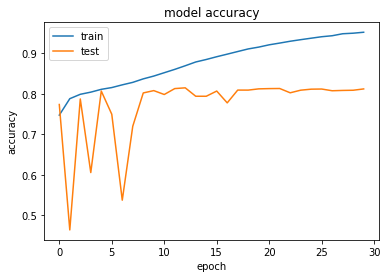

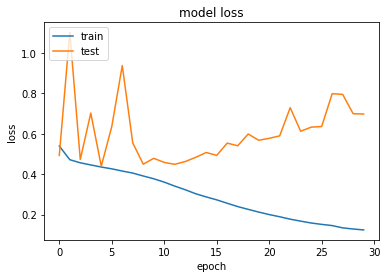

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 25s 310us/sample - loss: 0.5751 - acc: 0.7304 - val_loss: 0.5513 - val_acc: 0.7544
Epoch 2/30
80000/80000 [==============================] - 21s 257us/sample - loss: 0.4807 - acc: 0.7832 - val_loss: 0.5796 - val_acc: 0.7358
Epoch 3/30
80000/80000 [==============================] - 21s 256us/sample - loss: 0.4592 - acc: 0.7968 - val_loss: 1.0892 - val_acc: 0.4971
Epoch 4/30
80000/80000 [==============================] - 21s 256us/sample - loss: 0.4498 - acc: 0.8017 - val_loss: 1.0976 - val_acc: 0.5042
Epoch 5/30
80000/80000 [==============================] - 21s 257us/sample - loss: 0.4397 - acc: 0.8079 - val_loss: 0.8321 - val_acc: 0.5572
Epoch 6/30
80000/80000 [==============================] - 20s 256us/sample - loss: 0.4316 - acc: 0.8122 - val_loss: 0.5765 - val_acc: 0.7315
Epoch 7/30
80000/80000 [==============================] - 21s 256us/sample - loss: 0

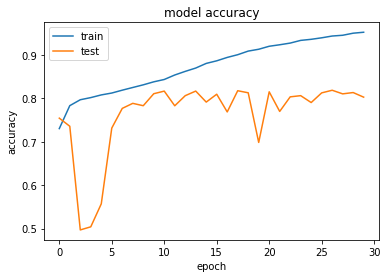

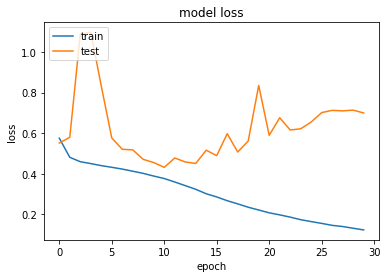

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 16s 197us/sample - loss: 0.5457 - acc: 0.7406 - val_loss: 1.0654 - val_acc: 0.4664
Epoch 2/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.4776 - acc: 0.7839 - val_loss: 0.6471 - val_acc: 0.7391
Epoch 3/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.4634 - acc: 0.7924 - val_loss: 0.4993 - val_acc: 0.7645
Epoch 4/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.4541 - acc: 0.7982 - val_loss: 0.4877 - val_acc: 0.7757
Epoch 5/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.4456 - acc: 0.8030 - val_loss: 0.7340 - val_acc: 0.6340
Epoch 6/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0.4411 - acc: 0.8071 - val_loss: 0.4978 - val_acc: 0.7875
Epoch 7/30
80000/80000 [==============================] - 11s 141us/sample - loss: 0

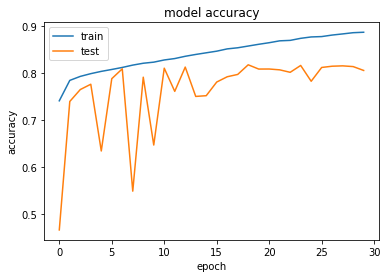

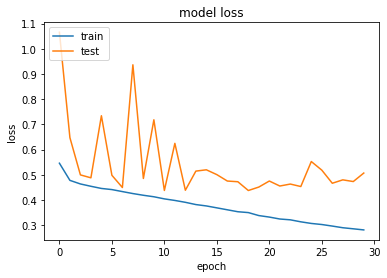

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 17s 210us/sample - loss: 0.5500 - acc: 0.7383 - val_loss: 0.4833 - val_acc: 0.7873
Epoch 2/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4815 - acc: 0.7812 - val_loss: 0.8623 - val_acc: 0.6931
Epoch 3/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4643 - acc: 0.7936 - val_loss: 0.7352 - val_acc: 0.6543
Epoch 4/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4575 - acc: 0.7977 - val_loss: 0.5006 - val_acc: 0.7783
Epoch 5/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4482 - acc: 0.8035 - val_loss: 0.6198 - val_acc: 0.6451
Epoch 6/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.4406 - acc: 0.8081 - val_loss: 0.4495 - val_acc: 0.8041
Epoch 7/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0

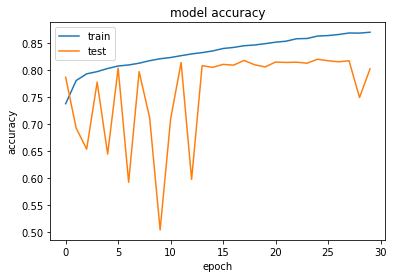

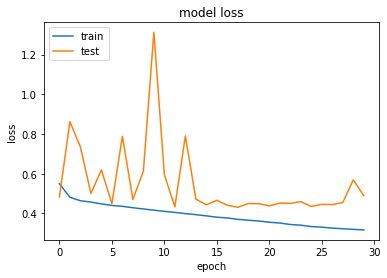

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.5559 - acc: 0.7386 - val_loss: 0.6589 - val_acc: 0.6266
Epoch 2/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4805 - acc: 0.7824 - val_loss: 0.5359 - val_acc: 0.7613
Epoch 3/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4638 - acc: 0.7945 - val_loss: 0.4667 - val_acc: 0.7900
Epoch 4/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4545 - acc: 0.7983 - val_loss: 0.9506 - val_acc: 0.4889
Epoch 5/30
80000/80000 [==============================] - 13s 161us/sample - loss: 0.4462 - acc: 0.8040 - val_loss: 0.6554 - val_acc: 0.7383
Epoch 6/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.4379 - acc: 0.8082 - val_loss: 0.4460 - val_acc: 0.8025
Epoch 7/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0

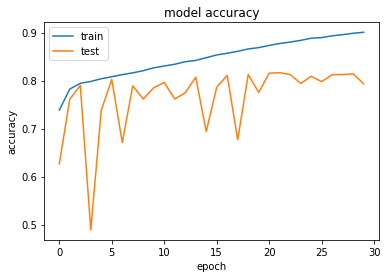

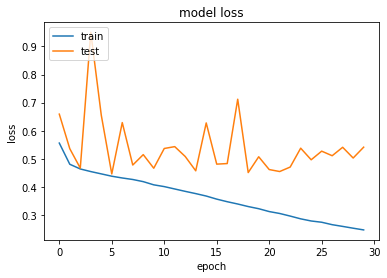

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 18s 230us/sample - loss: 0.5463 - acc: 0.7423 - val_loss: 0.5758 - val_acc: 0.7097
Epoch 2/30
80000/80000 [==============================] - 14s 169us/sample - loss: 0.4768 - acc: 0.7854 - val_loss: 0.5461 - val_acc: 0.7447
Epoch 3/30
80000/80000 [==============================] - 14s 169us/sample - loss: 0.4638 - acc: 0.7939 - val_loss: 0.6876 - val_acc: 0.7443
Epoch 4/30
80000/80000 [==============================] - 14s 169us/sample - loss: 0.4528 - acc: 0.7992 - val_loss: 0.6159 - val_acc: 0.7189
Epoch 5/30
80000/80000 [==============================] - 14s 169us/sample - loss: 0.4437 - acc: 0.8046 - val_loss: 0.5026 - val_acc: 0.7601
Epoch 6/30
80000/80000 [==============================] - 13s 169us/sample - loss: 0.4371 - acc: 0.8094 - val_loss: 0.4896 - val_acc: 0.7886
Epoch 7/30
80000/80000 [==============================] - 13s 169us/sample - loss: 0

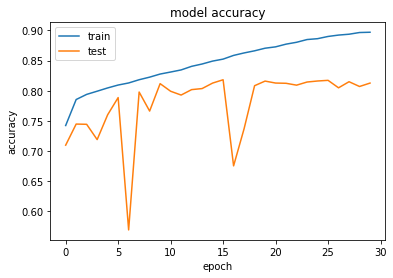

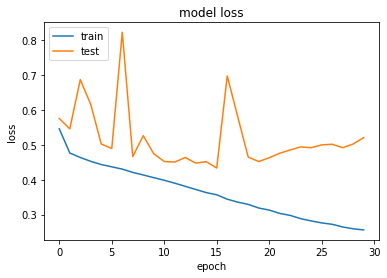

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 19s 239us/sample - loss: 0.5425 - acc: 0.7438 - val_loss: 1.1234 - val_acc: 0.4207
Epoch 2/30
80000/80000 [==============================] - 14s 181us/sample - loss: 0.4735 - acc: 0.7867 - val_loss: 0.4740 - val_acc: 0.7885
Epoch 3/30
80000/80000 [==============================] - 14s 178us/sample - loss: 0.4578 - acc: 0.7968 - val_loss: 0.6266 - val_acc: 0.7516
Epoch 4/30
80000/80000 [==============================] - 14s 178us/sample - loss: 0.4490 - acc: 0.8021 - val_loss: 0.8208 - val_acc: 0.5911
Epoch 5/30
80000/80000 [==============================] - 14s 178us/sample - loss: 0.4399 - acc: 0.8087 - val_loss: 0.6428 - val_acc: 0.7591
Epoch 6/30
80000/80000 [==============================] - 14s 178us/sample - loss: 0.4316 - acc: 0.8120 - val_loss: 0.5113 - val_acc: 0.7618
Epoch 7/30
80000/80000 [==============================] - 14s 178us/sample - loss: 0

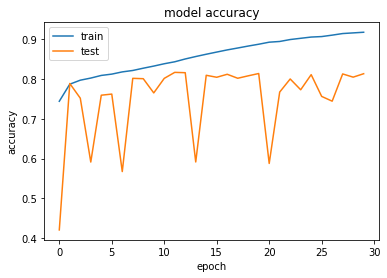

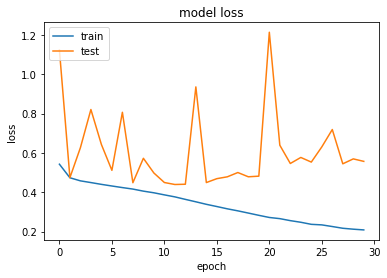

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5560 - acc: 0.7394 - val_loss: 1.2233 - val_acc: 0.4200
Epoch 2/30
80000/80000 [==============================] - 15s 188us/sample - loss: 0.4777 - acc: 0.7842 - val_loss: 0.5893 - val_acc: 0.7477
Epoch 3/30
80000/80000 [==============================] - 15s 188us/sample - loss: 0.4645 - acc: 0.7922 - val_loss: 0.4678 - val_acc: 0.7887
Epoch 4/30
80000/80000 [==============================] - 15s 188us/sample - loss: 0.4530 - acc: 0.7992 - val_loss: 0.6671 - val_acc: 0.7547
Epoch 5/30
80000/80000 [==============================] - 15s 188us/sample - loss: 0.4452 - acc: 0.8051 - val_loss: 0.5550 - val_acc: 0.7369
Epoch 6/30
80000/80000 [==============================] - 15s 189us/sample - loss: 0.4364 - acc: 0.8087 - val_loss: 0.5725 - val_acc: 0.7768
Epoch 7/30
80000/80000 [==============================] - 15s 188us/sample - loss: 0

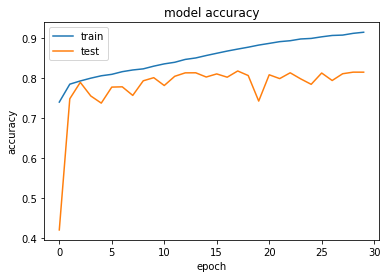

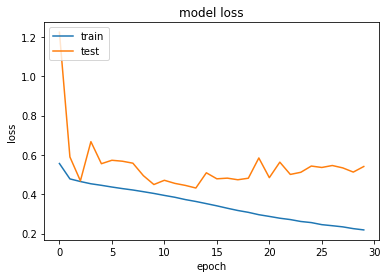

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 26s 327us/sample - loss: 0.5609 - acc: 0.7358 - val_loss: 0.5521 - val_acc: 0.7541
Epoch 2/30
80000/80000 [==============================] - 21s 261us/sample - loss: 0.4784 - acc: 0.7850 - val_loss: 1.3350 - val_acc: 0.6696
Epoch 3/30
80000/80000 [==============================] - 21s 261us/sample - loss: 0.4618 - acc: 0.7943 - val_loss: 0.5152 - val_acc: 0.7701
Epoch 4/30
80000/80000 [==============================] - 21s 261us/sample - loss: 0.4505 - acc: 0.8008 - val_loss: 0.8129 - val_acc: 0.6045
Epoch 5/30
80000/80000 [==============================] - 21s 260us/sample - loss: 0.4420 - acc: 0.8079 - val_loss: 0.4638 - val_acc: 0.7969
Epoch 6/30
80000/80000 [==============================] - 21s 261us/sample - loss: 0.4341 - acc: 0.8128 - val_loss: 0.8635 - val_acc: 0.7465
Epoch 7/30
80000/80000 [==============================] - 21s 261us/sample - loss: 0

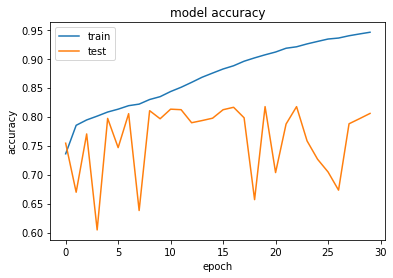

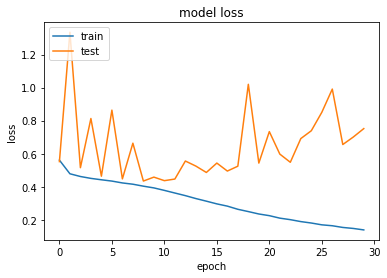

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 28s 351us/sample - loss: 0.5705 - acc: 0.7308 - val_loss: 0.9985 - val_acc: 0.4764
Epoch 2/30
80000/80000 [==============================] - 23s 281us/sample - loss: 0.4801 - acc: 0.7836 - val_loss: 0.9540 - val_acc: 0.4974
Epoch 3/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0.4621 - acc: 0.7955 - val_loss: 1.0740 - val_acc: 0.4512
Epoch 4/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0.4511 - acc: 0.8013 - val_loss: 0.4418 - val_acc: 0.8062
Epoch 5/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0.4427 - acc: 0.8064 - val_loss: 0.6534 - val_acc: 0.7342
Epoch 6/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0.4335 - acc: 0.8112 - val_loss: 0.4822 - val_acc: 0.7728
Epoch 7/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0

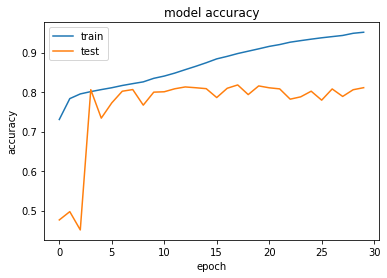

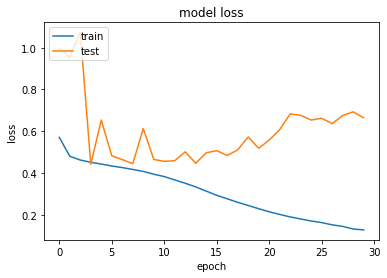

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 17s 213us/sample - loss: 0.5583 - acc: 0.7353 - val_loss: 1.0893 - val_acc: 0.4433
Epoch 2/30
80000/80000 [==============================] - 12s 145us/sample - loss: 0.4837 - acc: 0.7818 - val_loss: 0.5022 - val_acc: 0.7778
Epoch 3/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.4652 - acc: 0.7926 - val_loss: 0.8272 - val_acc: 0.5318
Epoch 4/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.4554 - acc: 0.8000 - val_loss: 1.4182 - val_acc: 0.4618
Epoch 5/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.4453 - acc: 0.8046 - val_loss: 0.4549 - val_acc: 0.7998
Epoch 6/30
80000/80000 [==============================] - 12s 145us/sample - loss: 0.4389 - acc: 0.8080 - val_loss: 0.4715 - val_acc: 0.7858
Epoch 7/30
80000/80000 [==============================] - 12s 145us/sample - loss: 0

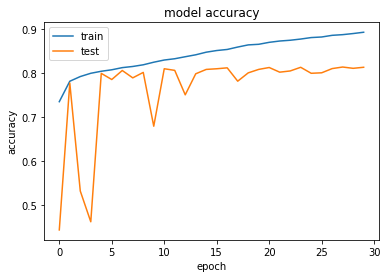

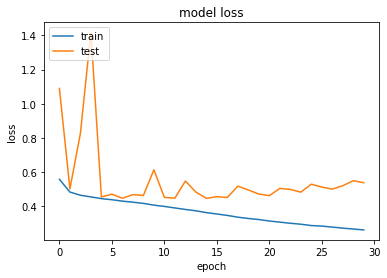

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 18s 228us/sample - loss: 0.5643 - acc: 0.7355 - val_loss: 0.7241 - val_acc: 0.5724
Epoch 2/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.4828 - acc: 0.7812 - val_loss: 0.5838 - val_acc: 0.7334
Epoch 3/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.4624 - acc: 0.7945 - val_loss: 1.0733 - val_acc: 0.4953
Epoch 4/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0.4516 - acc: 0.8012 - val_loss: 0.4579 - val_acc: 0.7998
Epoch 5/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.4444 - acc: 0.8055 - val_loss: 0.4897 - val_acc: 0.7656
Epoch 6/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0.4360 - acc: 0.8112 - val_loss: 0.4885 - val_acc: 0.7898
Epoch 7/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0

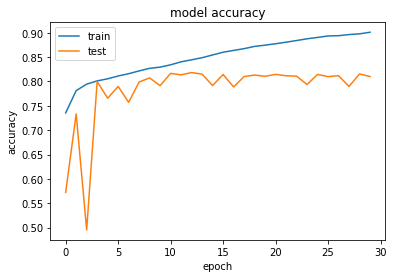

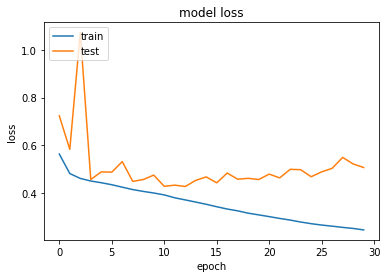

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 20s 253us/sample - loss: 0.5637 - acc: 0.7336 - val_loss: 1.6323 - val_acc: 0.4138
Epoch 2/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.4821 - acc: 0.7840 - val_loss: 0.6632 - val_acc: 0.7478
Epoch 3/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.4632 - acc: 0.7936 - val_loss: 0.4658 - val_acc: 0.8006
Epoch 4/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.4527 - acc: 0.8016 - val_loss: 0.5915 - val_acc: 0.7817
Epoch 5/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.4426 - acc: 0.8067 - val_loss: 0.4439 - val_acc: 0.8084
Epoch 6/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.4341 - acc: 0.8122 - val_loss: 0.4600 - val_acc: 0.7976
Epoch 7/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0

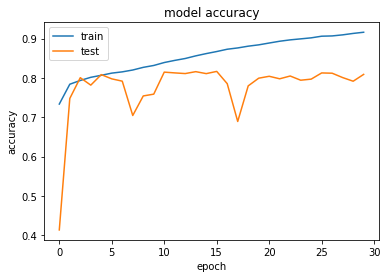

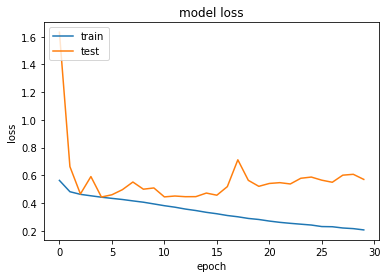

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 22s 272us/sample - loss: 0.5664 - acc: 0.7330 - val_loss: 0.6364 - val_acc: 0.6150
Epoch 2/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.4784 - acc: 0.7836 - val_loss: 0.5089 - val_acc: 0.7828
Epoch 3/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.4586 - acc: 0.7964 - val_loss: 0.6500 - val_acc: 0.7163
Epoch 4/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.4482 - acc: 0.8031 - val_loss: 0.8734 - val_acc: 0.7006
Epoch 5/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.4391 - acc: 0.8085 - val_loss: 0.7152 - val_acc: 0.6122
Epoch 6/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.4306 - acc: 0.8132 - val_loss: 0.5016 - val_acc: 0.7563
Epoch 7/30
80000/80000 [==============================] - 16s 201us/sample - loss: 0

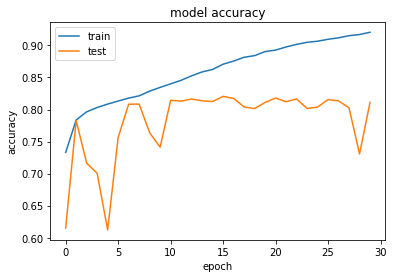

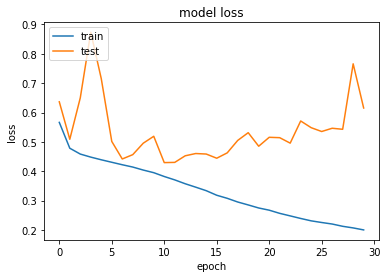

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 25s 309us/sample - loss: 0.5625 - acc: 0.7348 - val_loss: 0.6158 - val_acc: 0.7319
Epoch 2/30
80000/80000 [==============================] - 19s 235us/sample - loss: 0.4786 - acc: 0.7844 - val_loss: 0.5208 - val_acc: 0.7829
Epoch 3/30
80000/80000 [==============================] - 19s 235us/sample - loss: 0.4607 - acc: 0.7955 - val_loss: 0.5101 - val_acc: 0.7804
Epoch 4/30
80000/80000 [==============================] - 19s 235us/sample - loss: 0.4491 - acc: 0.8031 - val_loss: 0.5288 - val_acc: 0.7345
Epoch 5/30
80000/80000 [==============================] - 19s 235us/sample - loss: 0.4391 - acc: 0.8089 - val_loss: 0.5660 - val_acc: 0.7695
Epoch 6/30
80000/80000 [==============================] - 19s 235us/sample - loss: 0.4274 - acc: 0.8154 - val_loss: 0.4411 - val_acc: 0.8140
Epoch 7/30
80000/80000 [==============================] - 19s 235us/sample - loss: 0

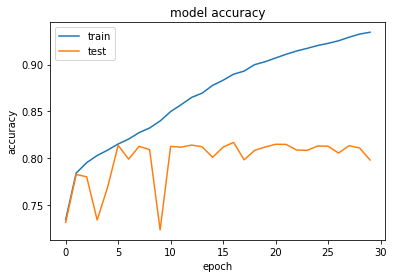

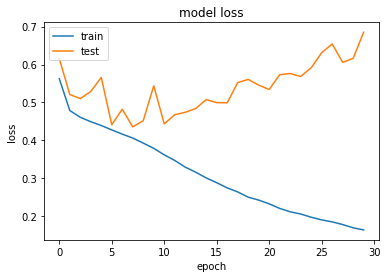

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0.5500 - acc: 0.7394 - val_loss: 0.5114 - val_acc: 0.7595
Epoch 2/30
80000/80000 [==============================] - 20s 255us/sample - loss: 0.4760 - acc: 0.7855 - val_loss: 0.4742 - val_acc: 0.7903
Epoch 3/30
80000/80000 [==============================] - 20s 255us/sample - loss: 0.4583 - acc: 0.7966 - val_loss: 0.7225 - val_acc: 0.6091
Epoch 4/30
80000/80000 [==============================] - 20s 255us/sample - loss: 0.4478 - acc: 0.8016 - val_loss: 0.4744 - val_acc: 0.7790
Epoch 5/30
80000/80000 [==============================] - 20s 255us/sample - loss: 0.4367 - acc: 0.8097 - val_loss: 0.5462 - val_acc: 0.7149
Epoch 6/30
80000/80000 [==============================] - 20s 255us/sample - loss: 0.4278 - acc: 0.8156 - val_loss: 0.4693 - val_acc: 0.7989
Epoch 7/30
80000/80000 [==============================] - 20s 255us/sample - loss: 0

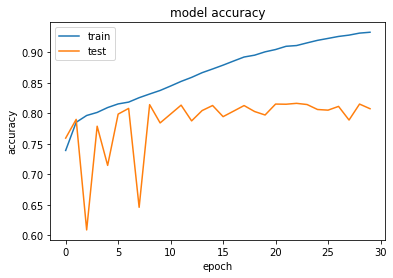

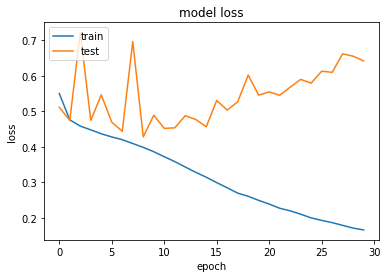

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 51s 637us/sample - loss: 0.5538 - acc: 0.7379 - val_loss: 0.8039 - val_acc: 0.7052
Epoch 2/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.4789 - acc: 0.7857 - val_loss: 0.6670 - val_acc: 0.7206
Epoch 3/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.4585 - acc: 0.7973 - val_loss: 0.4940 - val_acc: 0.7713
Epoch 4/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.4467 - acc: 0.8034 - val_loss: 0.5401 - val_acc: 0.7326
Epoch 5/30
80000/80000 [==============================] - 44s 556us/sample - loss: 0.4362 - acc: 0.8096 - val_loss: 0.4582 - val_acc: 0.7998
Epoch 6/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.4246 - acc: 0.8168 - val_loss: 0.5164 - val_acc: 0.7409
Epoch 7/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0

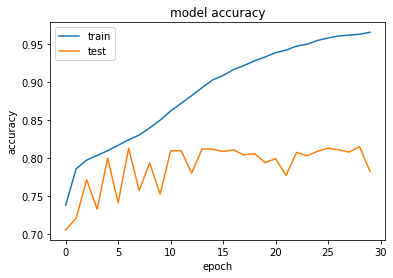

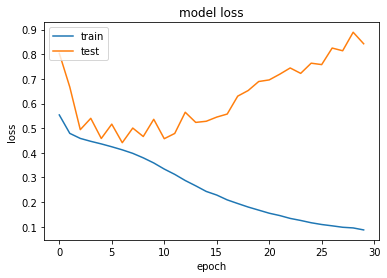

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 55s 693us/sample - loss: 0.5588 - acc: 0.7343 - val_loss: 1.4777 - val_acc: 0.6331
Epoch 2/30
80000/80000 [==============================] - 49s 614us/sample - loss: 0.4783 - acc: 0.7853 - val_loss: 0.7266 - val_acc: 0.6083
Epoch 3/30
80000/80000 [==============================] - 49s 614us/sample - loss: 0.4558 - acc: 0.7982 - val_loss: 0.6991 - val_acc: 0.6305
Epoch 4/30
80000/80000 [==============================] - 49s 614us/sample - loss: 0.4443 - acc: 0.8062 - val_loss: 0.5079 - val_acc: 0.7860
Epoch 5/30
80000/80000 [==============================] - 49s 614us/sample - loss: 0.4333 - acc: 0.8122 - val_loss: 0.7314 - val_acc: 0.6159
Epoch 6/30
80000/80000 [==============================] - 49s 614us/sample - loss: 0.4233 - acc: 0.8180 - val_loss: 0.7514 - val_acc: 0.5874
Epoch 7/30
80000/80000 [==============================] - 49s 613us/sample - loss: 0

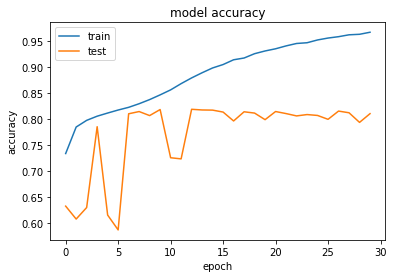

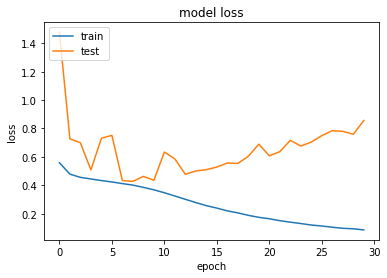

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 20s 249us/sample - loss: 0.5552 - acc: 0.7371 - val_loss: 0.5262 - val_acc: 0.7628
Epoch 2/30
80000/80000 [==============================] - 14s 169us/sample - loss: 0.4783 - acc: 0.7854 - val_loss: 0.4714 - val_acc: 0.7873
Epoch 3/30
80000/80000 [==============================] - 13s 168us/sample - loss: 0.4624 - acc: 0.7931 - val_loss: 0.4605 - val_acc: 0.7934
Epoch 4/30
80000/80000 [==============================] - 14s 169us/sample - loss: 0.4517 - acc: 0.8023 - val_loss: 0.5410 - val_acc: 0.7769
Epoch 5/30
80000/80000 [==============================] - 13s 168us/sample - loss: 0.4431 - acc: 0.8053 - val_loss: 0.7615 - val_acc: 0.7182
Epoch 6/30
80000/80000 [==============================] - 13s 168us/sample - loss: 0.4356 - acc: 0.8104 - val_loss: 0.4452 - val_acc: 0.8037
Epoch 7/30
80000/80000 [==============================] - 13s 168us/sample - loss: 0

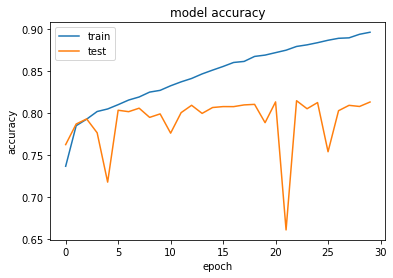

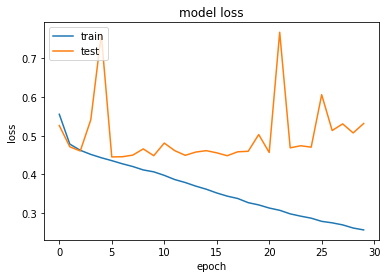

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.5592 - acc: 0.7351 - val_loss: 0.5881 - val_acc: 0.6726
Epoch 2/30
80000/80000 [==============================] - 14s 180us/sample - loss: 0.4813 - acc: 0.7832 - val_loss: 0.4663 - val_acc: 0.7893
Epoch 3/30
80000/80000 [==============================] - 14s 180us/sample - loss: 0.4632 - acc: 0.7941 - val_loss: 0.4871 - val_acc: 0.7894
Epoch 4/30
80000/80000 [==============================] - 14s 180us/sample - loss: 0.4515 - acc: 0.7994 - val_loss: 0.6104 - val_acc: 0.6942
Epoch 5/30
80000/80000 [==============================] - 14s 180us/sample - loss: 0.4436 - acc: 0.8069 - val_loss: 0.4978 - val_acc: 0.7688
Epoch 6/30
80000/80000 [==============================] - 14s 179us/sample - loss: 0.4357 - acc: 0.8116 - val_loss: 0.4752 - val_acc: 0.7940
Epoch 7/30
80000/80000 [==============================] - 14s 180us/sample - loss: 0

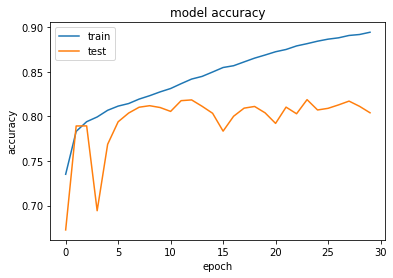

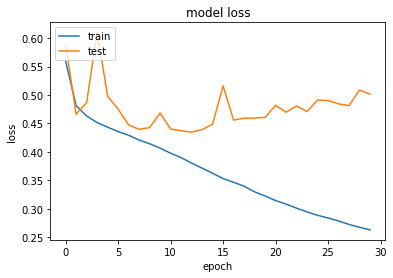

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 23s 291us/sample - loss: 0.5690 - acc: 0.7337 - val_loss: 1.0573 - val_acc: 0.6727
Epoch 2/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.4793 - acc: 0.7858 - val_loss: 0.5304 - val_acc: 0.7600
Epoch 3/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.4604 - acc: 0.7958 - val_loss: 0.4824 - val_acc: 0.7934
Epoch 4/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.4482 - acc: 0.8029 - val_loss: 0.6901 - val_acc: 0.7196
Epoch 5/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.4386 - acc: 0.8083 - val_loss: 0.5137 - val_acc: 0.7755
Epoch 6/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.4292 - acc: 0.8149 - val_loss: 0.4729 - val_acc: 0.7898
Epoch 7/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0

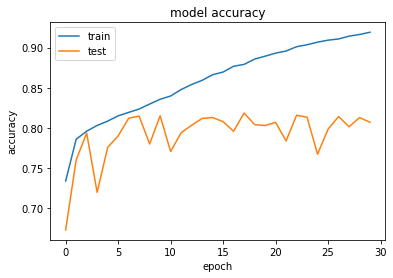

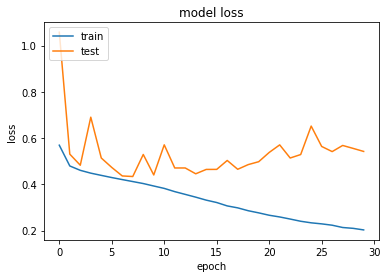

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 25s 310us/sample - loss: 0.5634 - acc: 0.7318 - val_loss: 0.8119 - val_acc: 0.5541
Epoch 2/30
80000/80000 [==============================] - 18s 223us/sample - loss: 0.4788 - acc: 0.7839 - val_loss: 0.4522 - val_acc: 0.7983
Epoch 3/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4625 - acc: 0.7942 - val_loss: 0.5427 - val_acc: 0.7433
Epoch 4/30
80000/80000 [==============================] - 18s 223us/sample - loss: 0.4497 - acc: 0.8023 - val_loss: 0.4648 - val_acc: 0.7947
Epoch 5/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4422 - acc: 0.8060 - val_loss: 0.4588 - val_acc: 0.7974
Epoch 6/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4352 - acc: 0.8102 - val_loss: 0.4527 - val_acc: 0.8029
Epoch 7/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0

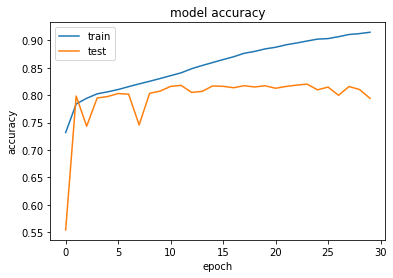

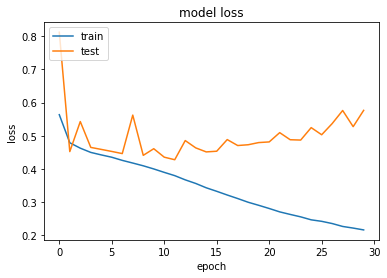

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 28s 349us/sample - loss: 0.5699 - acc: 0.7312 - val_loss: 0.7139 - val_acc: 0.6918
Epoch 2/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4796 - acc: 0.7848 - val_loss: 0.4720 - val_acc: 0.7848
Epoch 3/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4598 - acc: 0.7965 - val_loss: 0.4967 - val_acc: 0.7722
Epoch 4/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4479 - acc: 0.8027 - val_loss: 0.4627 - val_acc: 0.7916
Epoch 5/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4400 - acc: 0.8084 - val_loss: 0.5873 - val_acc: 0.6913
Epoch 6/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4292 - acc: 0.8144 - val_loss: 0.4412 - val_acc: 0.8044
Epoch 7/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0

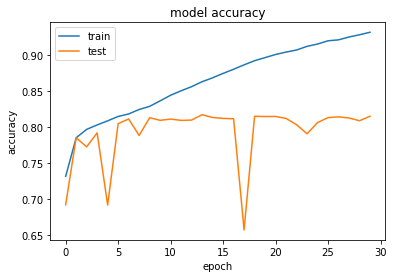

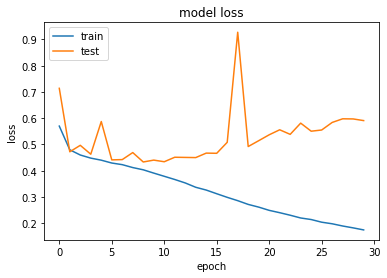

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 372us/sample - loss: 0.5490 - acc: 0.7394 - val_loss: 0.7467 - val_acc: 0.6819
Epoch 2/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0.4750 - acc: 0.7870 - val_loss: 0.9114 - val_acc: 0.6660
Epoch 3/30
80000/80000 [==============================] - 22s 280us/sample - loss: 0.4572 - acc: 0.7976 - val_loss: 0.5422 - val_acc: 0.7204
Epoch 4/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0.4454 - acc: 0.8042 - val_loss: 0.4444 - val_acc: 0.8048
Epoch 5/30
80000/80000 [==============================] - 22s 280us/sample - loss: 0.4370 - acc: 0.8091 - val_loss: 0.4575 - val_acc: 0.7946
Epoch 6/30
80000/80000 [==============================] - 22s 280us/sample - loss: 0.4287 - acc: 0.8138 - val_loss: 0.6759 - val_acc: 0.6528
Epoch 7/30
80000/80000 [==============================] - 22s 280us/sample - loss: 0

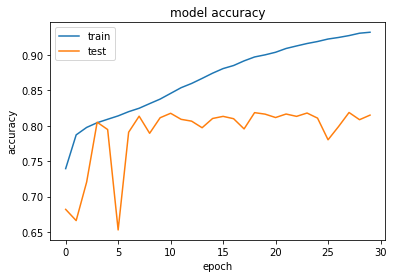

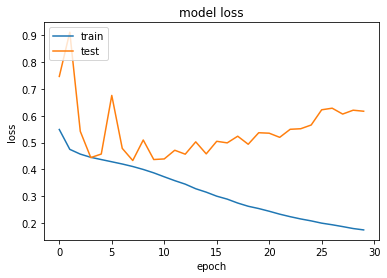

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 54s 673us/sample - loss: 0.5560 - acc: 0.7392 - val_loss: 1.0417 - val_acc: 0.4633
Epoch 2/30
80000/80000 [==============================] - 46s 579us/sample - loss: 0.4744 - acc: 0.7883 - val_loss: 0.4913 - val_acc: 0.7773
Epoch 3/30
80000/80000 [==============================] - 46s 579us/sample - loss: 0.4567 - acc: 0.7972 - val_loss: 0.6583 - val_acc: 0.7523
Epoch 4/30
80000/80000 [==============================] - 46s 580us/sample - loss: 0.4464 - acc: 0.8043 - val_loss: 0.4762 - val_acc: 0.7771
Epoch 5/30
80000/80000 [==============================] - 46s 580us/sample - loss: 0.4362 - acc: 0.8101 - val_loss: 0.4383 - val_acc: 0.8077
Epoch 6/30
80000/80000 [==============================] - 46s 580us/sample - loss: 0.4261 - acc: 0.8166 - val_loss: 0.5987 - val_acc: 0.6921
Epoch 7/30
80000/80000 [==============================] - 46s 580us/sample - loss: 0

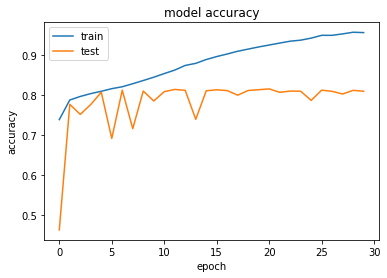

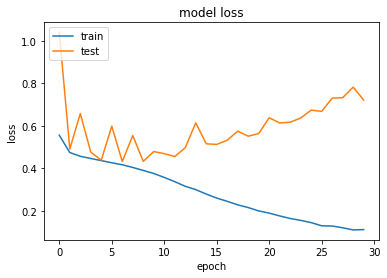

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 58s 725us/sample - loss: 0.5645 - acc: 0.7346 - val_loss: 0.4948 - val_acc: 0.7750
Epoch 2/30
80000/80000 [==============================] - 50s 630us/sample - loss: 0.4777 - acc: 0.7850 - val_loss: 0.5039 - val_acc: 0.7702
Epoch 3/30
80000/80000 [==============================] - 50s 630us/sample - loss: 0.4581 - acc: 0.7981 - val_loss: 0.5427 - val_acc: 0.7492
Epoch 4/30
80000/80000 [==============================] - 50s 630us/sample - loss: 0.4478 - acc: 0.8029 - val_loss: 0.5414 - val_acc: 0.7697
Epoch 5/30
80000/80000 [==============================] - 50s 630us/sample - loss: 0.4368 - acc: 0.8103 - val_loss: 0.4616 - val_acc: 0.7921
Epoch 6/30
80000/80000 [==============================] - 50s 630us/sample - loss: 0.4271 - acc: 0.8160 - val_loss: 0.4381 - val_acc: 0.8079
Epoch 7/30
80000/80000 [==============================] - 50s 630us/sample - loss: 0

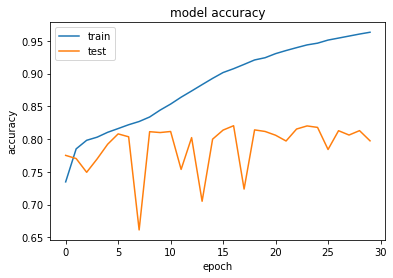

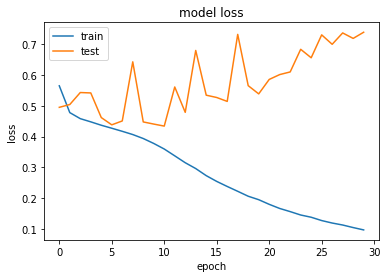

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 24s 297us/sample - loss: 0.5562 - acc: 0.7358 - val_loss: 0.4898 - val_acc: 0.7769
Epoch 2/30
80000/80000 [==============================] - 15s 194us/sample - loss: 0.4821 - acc: 0.7827 - val_loss: 0.7299 - val_acc: 0.5990
Epoch 3/30
80000/80000 [==============================] - 16s 194us/sample - loss: 0.4638 - acc: 0.7936 - val_loss: 0.5488 - val_acc: 0.7687
Epoch 4/30
80000/80000 [==============================] - 15s 194us/sample - loss: 0.4520 - acc: 0.8014 - val_loss: 0.4866 - val_acc: 0.7832
Epoch 5/30
80000/80000 [==============================] - 15s 193us/sample - loss: 0.4452 - acc: 0.8053 - val_loss: 0.4572 - val_acc: 0.7990
Epoch 6/30
80000/80000 [==============================] - 15s 194us/sample - loss: 0.4366 - acc: 0.8107 - val_loss: 0.4435 - val_acc: 0.8033
Epoch 7/30
80000/80000 [==============================] - 15s 193us/sample - loss: 0

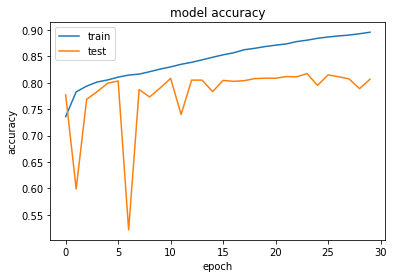

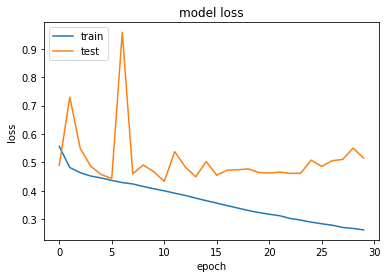

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 25s 311us/sample - loss: 0.5631 - acc: 0.7314 - val_loss: 0.5175 - val_acc: 0.7636
Epoch 2/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0.4839 - acc: 0.7809 - val_loss: 0.8940 - val_acc: 0.6841
Epoch 3/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0.4654 - acc: 0.7934 - val_loss: 0.5128 - val_acc: 0.7782
Epoch 4/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0.4549 - acc: 0.7990 - val_loss: 0.4583 - val_acc: 0.7934
Epoch 5/30
80000/80000 [==============================] - 16s 205us/sample - loss: 0.4459 - acc: 0.8043 - val_loss: 0.5459 - val_acc: 0.7239
Epoch 6/30
80000/80000 [==============================] - 16s 205us/sample - loss: 0.4390 - acc: 0.8077 - val_loss: 0.4527 - val_acc: 0.7990
Epoch 7/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0

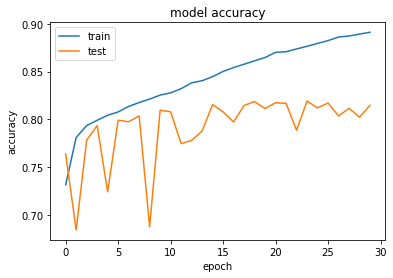

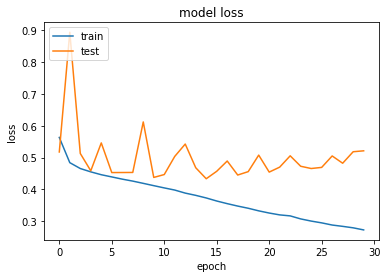

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 27s 339us/sample - loss: 0.5674 - acc: 0.7326 - val_loss: 0.8019 - val_acc: 0.6533
Epoch 2/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.4803 - acc: 0.7836 - val_loss: 0.8827 - val_acc: 0.5491
Epoch 3/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.4622 - acc: 0.7947 - val_loss: 0.4738 - val_acc: 0.7913
Epoch 4/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.4524 - acc: 0.8014 - val_loss: 0.4590 - val_acc: 0.7959
Epoch 5/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.4431 - acc: 0.8062 - val_loss: 0.5193 - val_acc: 0.7439
Epoch 6/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.4347 - acc: 0.8117 - val_loss: 0.4549 - val_acc: 0.8051
Epoch 7/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0

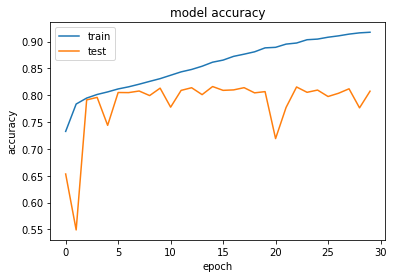

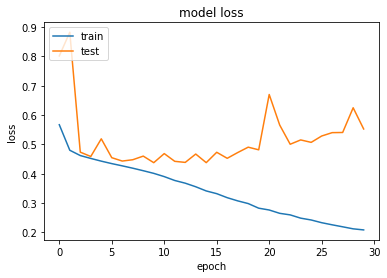

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 29s 359us/sample - loss: 0.5633 - acc: 0.7311 - val_loss: 0.5634 - val_acc: 0.7096
Epoch 2/30
80000/80000 [==============================] - 20s 247us/sample - loss: 0.4814 - acc: 0.7815 - val_loss: 0.5109 - val_acc: 0.7582
Epoch 3/30
80000/80000 [==============================] - 20s 247us/sample - loss: 0.4615 - acc: 0.7950 - val_loss: 0.6571 - val_acc: 0.7484
Epoch 4/30
80000/80000 [==============================] - 20s 247us/sample - loss: 0.4511 - acc: 0.8028 - val_loss: 0.5230 - val_acc: 0.7780
Epoch 5/30
80000/80000 [==============================] - 20s 248us/sample - loss: 0.4414 - acc: 0.8058 - val_loss: 0.6079 - val_acc: 0.6736
Epoch 6/30
80000/80000 [==============================] - 20s 247us/sample - loss: 0.4352 - acc: 0.8112 - val_loss: 0.4830 - val_acc: 0.7839
Epoch 7/30
80000/80000 [==============================] - 20s 247us/sample - loss: 0

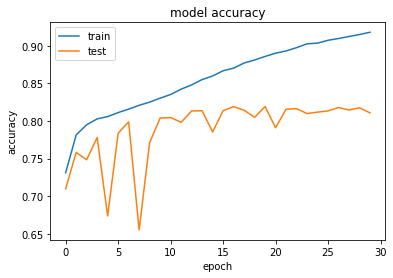

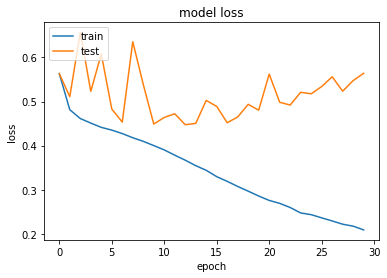

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 32s 396us/sample - loss: 0.5623 - acc: 0.7362 - val_loss: 0.9355 - val_acc: 0.5092
Epoch 2/30
80000/80000 [==============================] - 23s 284us/sample - loss: 0.4759 - acc: 0.7855 - val_loss: 0.5978 - val_acc: 0.7426
Epoch 3/30
80000/80000 [==============================] - 23s 285us/sample - loss: 0.4603 - acc: 0.7967 - val_loss: 0.4728 - val_acc: 0.7876
Epoch 4/30
80000/80000 [==============================] - 23s 284us/sample - loss: 0.4486 - acc: 0.8030 - val_loss: 0.4601 - val_acc: 0.7980
Epoch 5/30
80000/80000 [==============================] - 23s 285us/sample - loss: 0.4404 - acc: 0.8084 - val_loss: 0.7173 - val_acc: 0.6141
Epoch 6/30
80000/80000 [==============================] - 23s 285us/sample - loss: 0.4337 - acc: 0.8104 - val_loss: 0.4502 - val_acc: 0.8011
Epoch 7/30
80000/80000 [==============================] - 23s 285us/sample - loss: 0

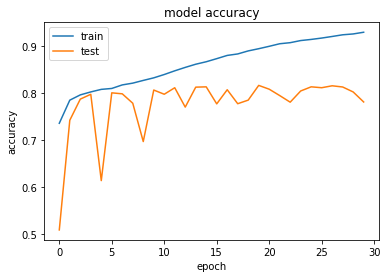

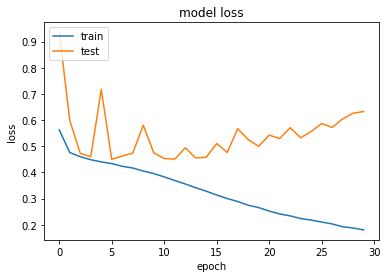

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 420us/sample - loss: 0.5551 - acc: 0.7358 - val_loss: 0.5641 - val_acc: 0.7472
Epoch 2/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.4797 - acc: 0.7834 - val_loss: 0.5276 - val_acc: 0.7583
Epoch 3/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.4602 - acc: 0.7952 - val_loss: 0.7179 - val_acc: 0.6428
Epoch 4/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.4503 - acc: 0.8028 - val_loss: 0.4598 - val_acc: 0.7950
Epoch 5/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.4417 - acc: 0.8078 - val_loss: 0.4518 - val_acc: 0.7991
Epoch 6/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.4331 - acc: 0.8125 - val_loss: 0.4570 - val_acc: 0.8027
Epoch 7/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0

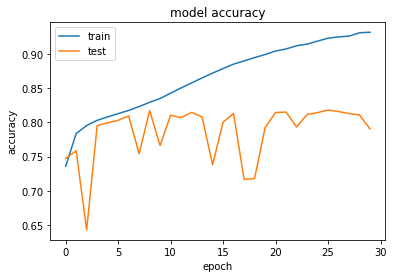

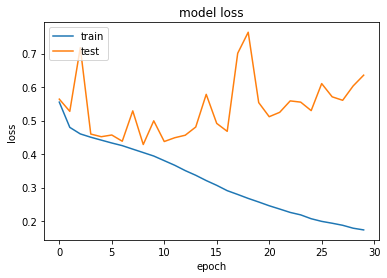

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 58s 719us/sample - loss: 0.5513 - acc: 0.7405 - val_loss: 0.6282 - val_acc: 0.6505
Epoch 2/30
80000/80000 [==============================] - 48s 603us/sample - loss: 0.4779 - acc: 0.7842 - val_loss: 0.9562 - val_acc: 0.5285
Epoch 3/30
80000/80000 [==============================] - 48s 600us/sample - loss: 0.4591 - acc: 0.7962 - val_loss: 0.6282 - val_acc: 0.7595
Epoch 4/30
80000/80000 [==============================] - 48s 600us/sample - loss: 0.4474 - acc: 0.8048 - val_loss: 0.4687 - val_acc: 0.7857
Epoch 5/30
80000/80000 [==============================] - 48s 600us/sample - loss: 0.4383 - acc: 0.8088 - val_loss: 0.4612 - val_acc: 0.7885
Epoch 6/30
80000/80000 [==============================] - 48s 601us/sample - loss: 0.4300 - acc: 0.8147 - val_loss: 0.5595 - val_acc: 0.7792
Epoch 7/30
80000/80000 [==============================] - 48s 600us/sample - loss: 0

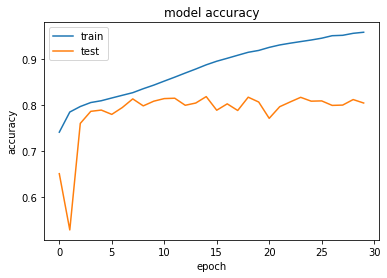

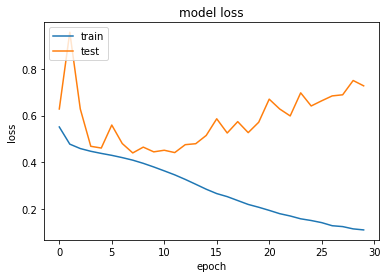

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 63s 784us/sample - loss: 0.5703 - acc: 0.7340 - val_loss: 0.5586 - val_acc: 0.7251
Epoch 2/30
80000/80000 [==============================] - 53s 659us/sample - loss: 0.4840 - acc: 0.7822 - val_loss: 0.9990 - val_acc: 0.5072
Epoch 3/30
80000/80000 [==============================] - 53s 660us/sample - loss: 0.4609 - acc: 0.7961 - val_loss: 0.6615 - val_acc: 0.7476
Epoch 4/30
80000/80000 [==============================] - 52s 656us/sample - loss: 0.4504 - acc: 0.8027 - val_loss: 0.4495 - val_acc: 0.8037
Epoch 5/30
80000/80000 [==============================] - 53s 656us/sample - loss: 0.4411 - acc: 0.8074 - val_loss: 0.4798 - val_acc: 0.7993
Epoch 6/30
80000/80000 [==============================] - 53s 656us/sample - loss: 0.4329 - acc: 0.8123 - val_loss: 0.4625 - val_acc: 0.7906
Epoch 7/30
80000/80000 [==============================] - 52s 655us/sample - loss: 0

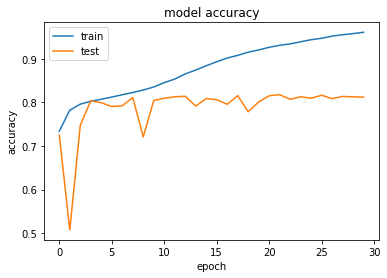

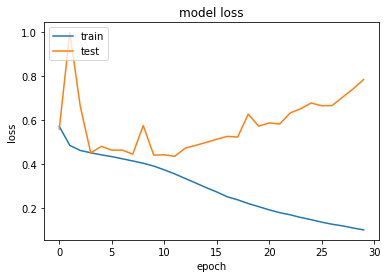

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 22s 271us/sample - loss: 0.6003 - acc: 0.6970 - val_loss: 0.5626 - val_acc: 0.7150
Epoch 2/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5534 - acc: 0.7261 - val_loss: 0.6043 - val_acc: 0.6850
Epoch 3/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5406 - acc: 0.7367 - val_loss: 0.5470 - val_acc: 0.7336
Epoch 4/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5294 - acc: 0.7448 - val_loss: 0.5650 - val_acc: 0.7177
Epoch 5/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5199 - acc: 0.7528 - val_loss: 0.5412 - val_acc: 0.7389
Epoch 6/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5115 - acc: 0.7589 - val_loss: 0.5014 - val_acc: 0.7674
Epoch 7/30
80000/80000 [==============================] - 12s 153us/sample - loss: 0

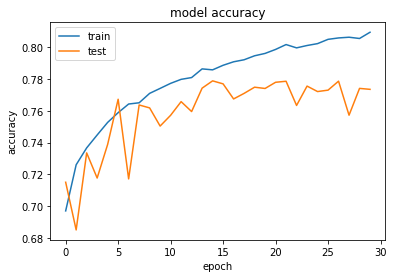

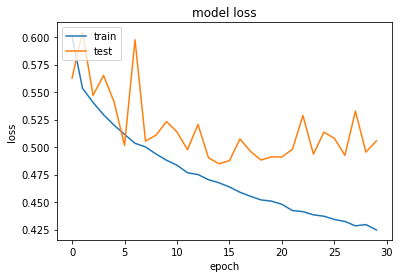

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 23s 285us/sample - loss: 0.6117 - acc: 0.6850 - val_loss: 0.5733 - val_acc: 0.7059
Epoch 2/30
80000/80000 [==============================] - 13s 159us/sample - loss: 0.5554 - acc: 0.7239 - val_loss: 0.5793 - val_acc: 0.7049
Epoch 3/30
80000/80000 [==============================] - 13s 160us/sample - loss: 0.5391 - acc: 0.7372 - val_loss: 0.5241 - val_acc: 0.7483
Epoch 4/30
80000/80000 [==============================] - 13s 159us/sample - loss: 0.5249 - acc: 0.7476 - val_loss: 0.5228 - val_acc: 0.7531
Epoch 5/30
80000/80000 [==============================] - 13s 159us/sample - loss: 0.5157 - acc: 0.7557 - val_loss: 0.5268 - val_acc: 0.7444
Epoch 6/30
80000/80000 [==============================] - 13s 159us/sample - loss: 0.5084 - acc: 0.7598 - val_loss: 0.5324 - val_acc: 0.7411
Epoch 7/30
80000/80000 [==============================] - 13s 159us/sample - loss: 0

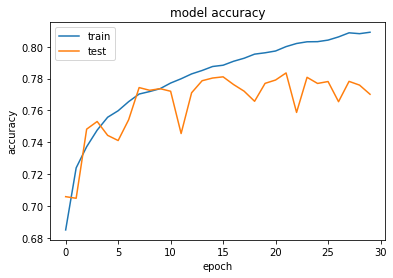

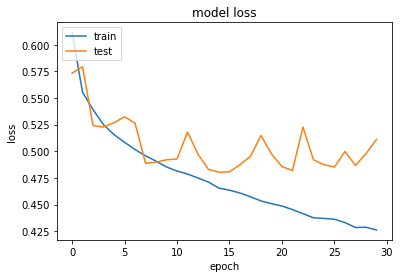

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 23s 286us/sample - loss: 0.5917 - acc: 0.6999 - val_loss: 0.5461 - val_acc: 0.7294
Epoch 2/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.5468 - acc: 0.7305 - val_loss: 0.5439 - val_acc: 0.7356
Epoch 3/30
80000/80000 [==============================] - 13s 165us/sample - loss: 0.5296 - acc: 0.7463 - val_loss: 0.6275 - val_acc: 0.6957
Epoch 4/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.5165 - acc: 0.7546 - val_loss: 0.5685 - val_acc: 0.7081
Epoch 5/30
80000/80000 [==============================] - 13s 165us/sample - loss: 0.5070 - acc: 0.7614 - val_loss: 0.5838 - val_acc: 0.7189
Epoch 6/30
80000/80000 [==============================] - 13s 165us/sample - loss: 0.5004 - acc: 0.7648 - val_loss: 0.5145 - val_acc: 0.7522
Epoch 7/30
80000/80000 [==============================] - 13s 165us/sample - loss: 0

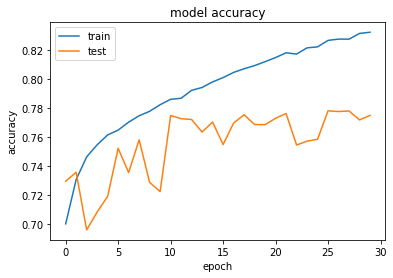

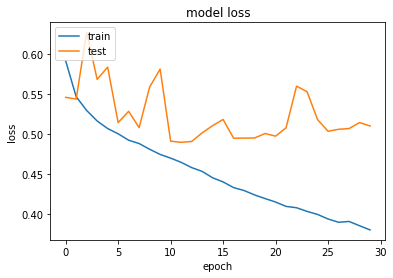

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 24s 306us/sample - loss: 0.6108 - acc: 0.6887 - val_loss: 0.5543 - val_acc: 0.7232
Epoch 2/30
80000/80000 [==============================] - 14s 176us/sample - loss: 0.5510 - acc: 0.7283 - val_loss: 0.5734 - val_acc: 0.7129
Epoch 3/30
80000/80000 [==============================] - 14s 176us/sample - loss: 0.5324 - acc: 0.7427 - val_loss: 0.5959 - val_acc: 0.7144
Epoch 4/30
80000/80000 [==============================] - 14s 176us/sample - loss: 0.5205 - acc: 0.7520 - val_loss: 0.8245 - val_acc: 0.6000
Epoch 5/30
80000/80000 [==============================] - 14s 177us/sample - loss: 0.5107 - acc: 0.7603 - val_loss: 0.5204 - val_acc: 0.7528
Epoch 6/30
80000/80000 [==============================] - 14s 176us/sample - loss: 0.5022 - acc: 0.7658 - val_loss: 0.4974 - val_acc: 0.7680
Epoch 7/30
80000/80000 [==============================] - 14s 176us/sample - loss: 0

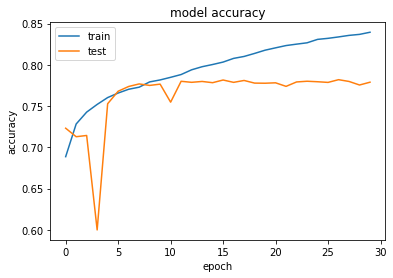

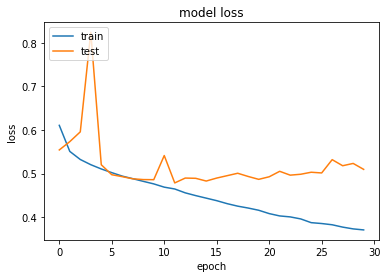

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 25s 311us/sample - loss: 0.5925 - acc: 0.7008 - val_loss: 0.5671 - val_acc: 0.7099
Epoch 2/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.5440 - acc: 0.7340 - val_loss: 0.5705 - val_acc: 0.7057
Epoch 3/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.5251 - acc: 0.7489 - val_loss: 0.5525 - val_acc: 0.7295
Epoch 4/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.5111 - acc: 0.7593 - val_loss: 0.5134 - val_acc: 0.7556
Epoch 5/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.5006 - acc: 0.7664 - val_loss: 0.4999 - val_acc: 0.7689
Epoch 6/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.4925 - acc: 0.7716 - val_loss: 0.5308 - val_acc: 0.7363
Epoch 7/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0

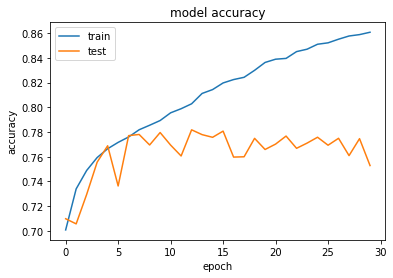

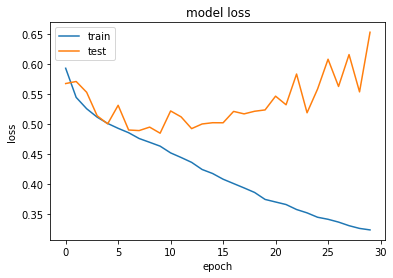

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 26s 329us/sample - loss: 0.5955 - acc: 0.6988 - val_loss: 0.6112 - val_acc: 0.6801
Epoch 2/30
80000/80000 [==============================] - 16s 196us/sample - loss: 0.5421 - acc: 0.7351 - val_loss: 0.5880 - val_acc: 0.7022
Epoch 3/30
80000/80000 [==============================] - 16s 196us/sample - loss: 0.5216 - acc: 0.7507 - val_loss: 0.5625 - val_acc: 0.7224
Epoch 4/30
80000/80000 [==============================] - 16s 196us/sample - loss: 0.5090 - acc: 0.7598 - val_loss: 0.5104 - val_acc: 0.7585
Epoch 5/30
80000/80000 [==============================] - 16s 196us/sample - loss: 0.5007 - acc: 0.7667 - val_loss: 0.5032 - val_acc: 0.7613
Epoch 6/30
80000/80000 [==============================] - 16s 196us/sample - loss: 0.4925 - acc: 0.7693 - val_loss: 0.5071 - val_acc: 0.7638
Epoch 7/30
80000/80000 [==============================] - 16s 196us/sample - loss: 0

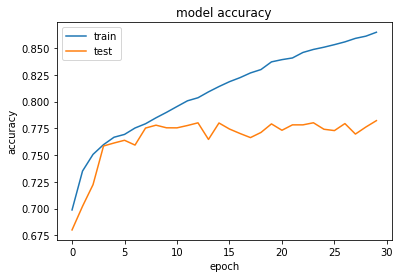

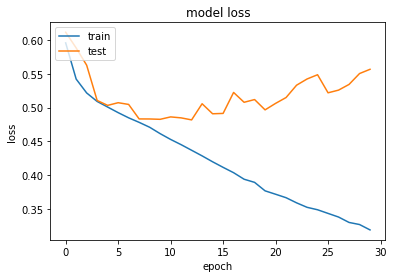

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 33s 409us/sample - loss: 0.5937 - acc: 0.6988 - val_loss: 0.7270 - val_acc: 0.6210
Epoch 2/30
80000/80000 [==============================] - 22s 278us/sample - loss: 0.5482 - acc: 0.7306 - val_loss: 0.5799 - val_acc: 0.7057
Epoch 3/30
80000/80000 [==============================] - 22s 278us/sample - loss: 0.5299 - acc: 0.7440 - val_loss: 0.5778 - val_acc: 0.7038
Epoch 4/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.5148 - acc: 0.7577 - val_loss: 0.5027 - val_acc: 0.7644
Epoch 5/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.5058 - acc: 0.7634 - val_loss: 0.5026 - val_acc: 0.7660
Epoch 6/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.4971 - acc: 0.7679 - val_loss: 0.5073 - val_acc: 0.7591
Epoch 7/30
80000/80000 [==============================] - 22s 278us/sample - loss: 0

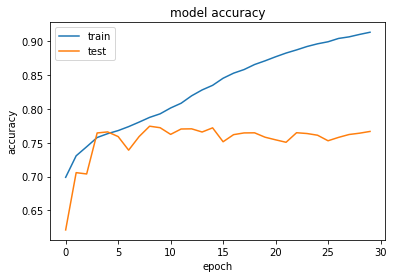

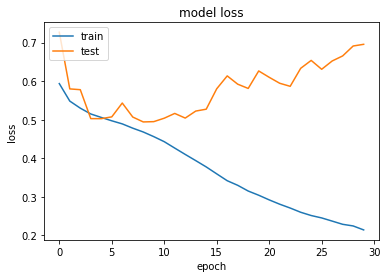

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 35s 433us/sample - loss: 0.5955 - acc: 0.6998 - val_loss: 0.6043 - val_acc: 0.6891
Epoch 2/30
80000/80000 [==============================] - 24s 298us/sample - loss: 0.5388 - acc: 0.7371 - val_loss: 0.5300 - val_acc: 0.7452
Epoch 3/30
80000/80000 [==============================] - 24s 297us/sample - loss: 0.5186 - acc: 0.7537 - val_loss: 0.5283 - val_acc: 0.7387
Epoch 4/30
80000/80000 [==============================] - 24s 297us/sample - loss: 0.5056 - acc: 0.7628 - val_loss: 0.5126 - val_acc: 0.7549
Epoch 5/30
80000/80000 [==============================] - 24s 298us/sample - loss: 0.4959 - acc: 0.7692 - val_loss: 0.5022 - val_acc: 0.7675
Epoch 6/30
80000/80000 [==============================] - 24s 297us/sample - loss: 0.4848 - acc: 0.7755 - val_loss: 0.4858 - val_acc: 0.7757
Epoch 7/30
80000/80000 [==============================] - 24s 298us/sample - loss: 0

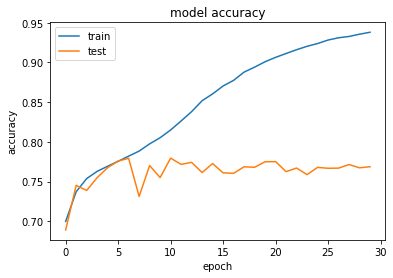

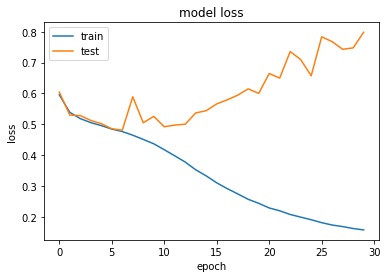

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 25s 313us/sample - loss: 0.5812 - acc: 0.7063 - val_loss: 0.5387 - val_acc: 0.7366
Epoch 2/30
80000/80000 [==============================] - 14s 174us/sample - loss: 0.5416 - acc: 0.7370 - val_loss: 0.5242 - val_acc: 0.7497
Epoch 3/30
80000/80000 [==============================] - 14s 173us/sample - loss: 0.5241 - acc: 0.7501 - val_loss: 0.5683 - val_acc: 0.7060
Epoch 4/30
80000/80000 [==============================] - 14s 173us/sample - loss: 0.5129 - acc: 0.7574 - val_loss: 0.5590 - val_acc: 0.7204
Epoch 5/30
80000/80000 [==============================] - 14s 174us/sample - loss: 0.5014 - acc: 0.7642 - val_loss: 0.4934 - val_acc: 0.7704
Epoch 6/30
80000/80000 [==============================] - 14s 173us/sample - loss: 0.4933 - acc: 0.7711 - val_loss: 0.5496 - val_acc: 0.7278
Epoch 7/30
80000/80000 [==============================] - 14s 173us/sample - loss: 0

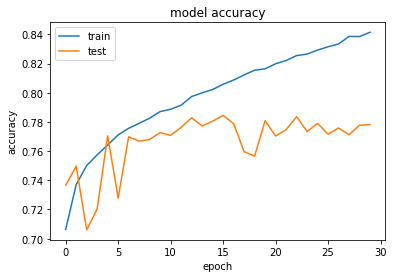

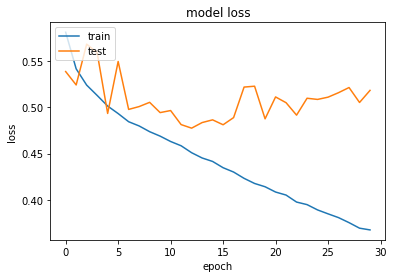

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.6142 - acc: 0.6860 - val_loss: 0.5658 - val_acc: 0.7115
Epoch 2/30
80000/80000 [==============================] - 15s 185us/sample - loss: 0.5535 - acc: 0.7276 - val_loss: 0.5354 - val_acc: 0.7411
Epoch 3/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.5368 - acc: 0.7381 - val_loss: 0.5330 - val_acc: 0.7470
Epoch 4/30
80000/80000 [==============================] - 15s 187us/sample - loss: 0.5227 - acc: 0.7507 - val_loss: 0.6498 - val_acc: 0.6485
Epoch 5/30
80000/80000 [==============================] - 15s 185us/sample - loss: 0.5133 - acc: 0.7567 - val_loss: 0.5469 - val_acc: 0.7293
Epoch 6/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.5060 - acc: 0.7614 - val_loss: 0.5064 - val_acc: 0.7574
Epoch 7/30
80000/80000 [==============================] - 15s 185us/sample - loss: 0

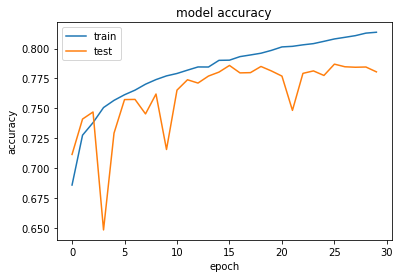

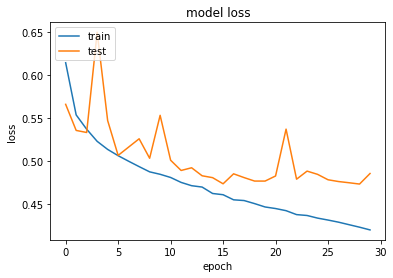

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 27s 334us/sample - loss: 0.5832 - acc: 0.7071 - val_loss: 0.5592 - val_acc: 0.7204
Epoch 2/30
80000/80000 [==============================] - 15s 191us/sample - loss: 0.5386 - acc: 0.7372 - val_loss: 0.5267 - val_acc: 0.7495
Epoch 3/30
80000/80000 [==============================] - 15s 191us/sample - loss: 0.5210 - acc: 0.7533 - val_loss: 0.5224 - val_acc: 0.7454
Epoch 4/30
80000/80000 [==============================] - 15s 191us/sample - loss: 0.5063 - acc: 0.7601 - val_loss: 0.5645 - val_acc: 0.7204
Epoch 5/30
80000/80000 [==============================] - 15s 191us/sample - loss: 0.4992 - acc: 0.7670 - val_loss: 0.5166 - val_acc: 0.7490
Epoch 6/30
80000/80000 [==============================] - 15s 191us/sample - loss: 0.4890 - acc: 0.7725 - val_loss: 0.5127 - val_acc: 0.7642
Epoch 7/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0

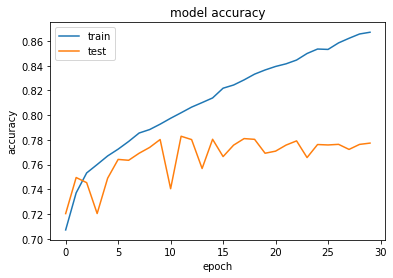

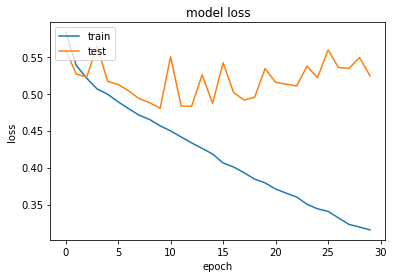

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 28s 349us/sample - loss: 0.6012 - acc: 0.6928 - val_loss: 0.5855 - val_acc: 0.7177
Epoch 2/30
80000/80000 [==============================] - 16s 199us/sample - loss: 0.5478 - acc: 0.7315 - val_loss: 0.6140 - val_acc: 0.6793
Epoch 3/30
80000/80000 [==============================] - 16s 199us/sample - loss: 0.5274 - acc: 0.7473 - val_loss: 0.5128 - val_acc: 0.7560
Epoch 4/30
80000/80000 [==============================] - 16s 199us/sample - loss: 0.5155 - acc: 0.7551 - val_loss: 0.5185 - val_acc: 0.7471
Epoch 5/30
80000/80000 [==============================] - 16s 199us/sample - loss: 0.5037 - acc: 0.7640 - val_loss: 0.5698 - val_acc: 0.7264
Epoch 6/30
80000/80000 [==============================] - 16s 200us/sample - loss: 0.4959 - acc: 0.7689 - val_loss: 0.4851 - val_acc: 0.7764
Epoch 7/30
80000/80000 [==============================] - 16s 199us/sample - loss: 0

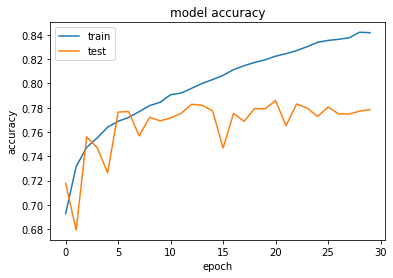

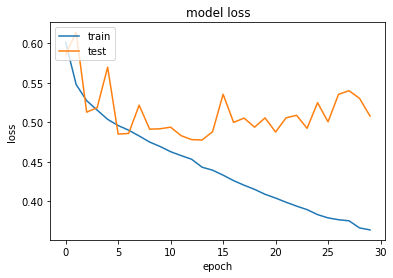

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0.5935 - acc: 0.7029 - val_loss: 0.5516 - val_acc: 0.7292
Epoch 2/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0.5366 - acc: 0.7405 - val_loss: 0.8143 - val_acc: 0.5965
Epoch 3/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0.5195 - acc: 0.7526 - val_loss: 0.5170 - val_acc: 0.7514
Epoch 4/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0.5060 - acc: 0.7617 - val_loss: 0.4990 - val_acc: 0.7693
Epoch 5/30
80000/80000 [==============================] - 17s 209us/sample - loss: 0.4944 - acc: 0.7700 - val_loss: 0.5630 - val_acc: 0.7154
Epoch 6/30
80000/80000 [==============================] - 17s 209us/sample - loss: 0.4865 - acc: 0.7755 - val_loss: 0.5272 - val_acc: 0.7462
Epoch 7/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0

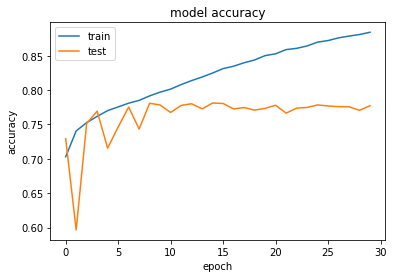

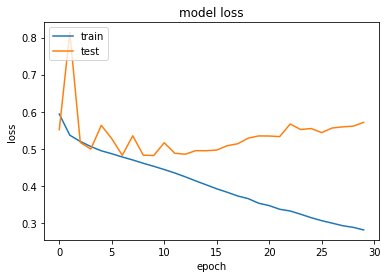

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 372us/sample - loss: 0.5873 - acc: 0.7023 - val_loss: 0.5886 - val_acc: 0.7012
Epoch 2/30
80000/80000 [==============================] - 18s 220us/sample - loss: 0.5381 - acc: 0.7382 - val_loss: 0.5546 - val_acc: 0.7247
Epoch 3/30
80000/80000 [==============================] - 18s 220us/sample - loss: 0.5183 - acc: 0.7540 - val_loss: 0.8509 - val_acc: 0.5969
Epoch 4/30
80000/80000 [==============================] - 18s 220us/sample - loss: 0.5072 - acc: 0.7615 - val_loss: 0.5936 - val_acc: 0.6884
Epoch 5/30
80000/80000 [==============================] - 18s 221us/sample - loss: 0.4973 - acc: 0.7666 - val_loss: 0.5362 - val_acc: 0.7412
Epoch 6/30
80000/80000 [==============================] - 18s 220us/sample - loss: 0.4888 - acc: 0.7726 - val_loss: 0.5092 - val_acc: 0.7551
Epoch 7/30
80000/80000 [==============================] - 18s 220us/sample - loss: 0

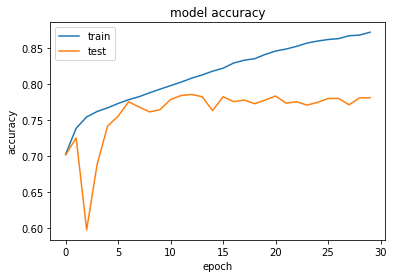

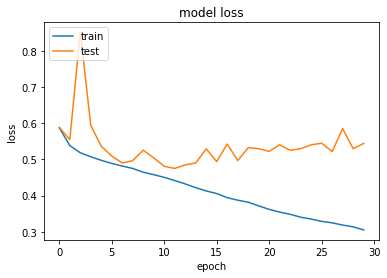

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 37s 459us/sample - loss: 0.5852 - acc: 0.7058 - val_loss: 0.5713 - val_acc: 0.7144
Epoch 2/30
80000/80000 [==============================] - 25s 308us/sample - loss: 0.5318 - acc: 0.7441 - val_loss: 0.5136 - val_acc: 0.7548
Epoch 3/30
80000/80000 [==============================] - 24s 306us/sample - loss: 0.5098 - acc: 0.7595 - val_loss: 0.4963 - val_acc: 0.7700
Epoch 4/30
80000/80000 [==============================] - 24s 306us/sample - loss: 0.4978 - acc: 0.7669 - val_loss: 0.5078 - val_acc: 0.7674
Epoch 5/30
80000/80000 [==============================] - 25s 306us/sample - loss: 0.4880 - acc: 0.7739 - val_loss: 0.4908 - val_acc: 0.7712
Epoch 6/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0.4774 - acc: 0.7806 - val_loss: 0.4896 - val_acc: 0.7727
Epoch 7/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0

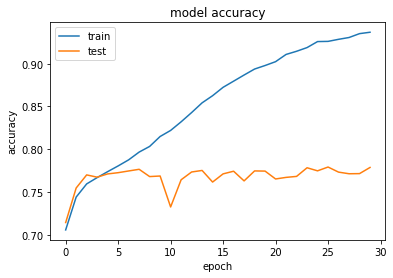

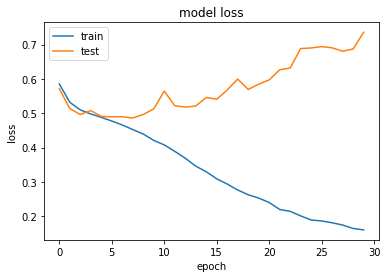

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 38s 479us/sample - loss: 0.5953 - acc: 0.7002 - val_loss: 0.5725 - val_acc: 0.7093
Epoch 2/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5331 - acc: 0.7430 - val_loss: 0.5591 - val_acc: 0.7230
Epoch 3/30
80000/80000 [==============================] - 26s 320us/sample - loss: 0.5142 - acc: 0.7568 - val_loss: 0.5542 - val_acc: 0.7193
Epoch 4/30
80000/80000 [==============================] - 26s 320us/sample - loss: 0.5024 - acc: 0.7636 - val_loss: 0.5053 - val_acc: 0.7643
Epoch 5/30
80000/80000 [==============================] - 26s 320us/sample - loss: 0.4920 - acc: 0.7724 - val_loss: 0.5701 - val_acc: 0.7000
Epoch 6/30
80000/80000 [==============================] - 26s 320us/sample - loss: 0.4840 - acc: 0.7766 - val_loss: 0.4857 - val_acc: 0.7758
Epoch 7/30
80000/80000 [==============================] - 26s 320us/sample - loss: 0

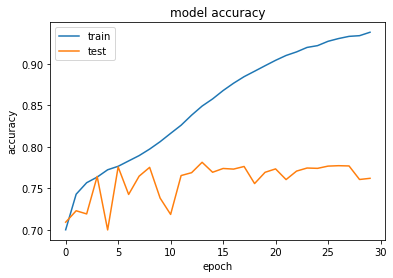

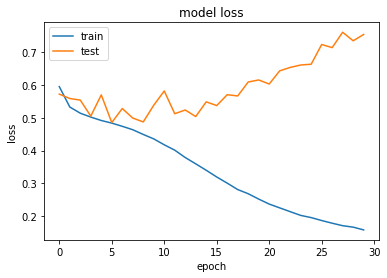

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 29s 360us/sample - loss: 0.5994 - acc: 0.6977 - val_loss: 0.5437 - val_acc: 0.7311
Epoch 2/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.5427 - acc: 0.7366 - val_loss: 0.5183 - val_acc: 0.7546
Epoch 3/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.5255 - acc: 0.7489 - val_loss: 0.6705 - val_acc: 0.6772
Epoch 4/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.5124 - acc: 0.7575 - val_loss: 0.5397 - val_acc: 0.7391
Epoch 5/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.5038 - acc: 0.7635 - val_loss: 0.4956 - val_acc: 0.7675
Epoch 6/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0.4950 - acc: 0.7688 - val_loss: 0.6024 - val_acc: 0.7157
Epoch 7/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0

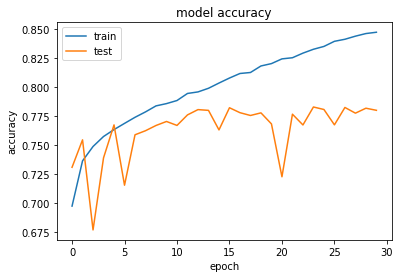

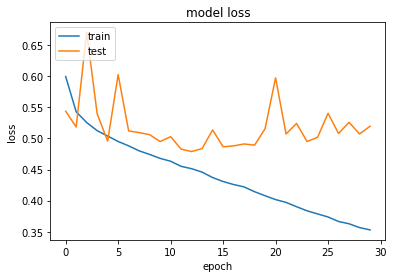

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 371us/sample - loss: 0.6175 - acc: 0.6845 - val_loss: 0.5793 - val_acc: 0.7054
Epoch 2/30
80000/80000 [==============================] - 17s 206us/sample - loss: 0.5555 - acc: 0.7254 - val_loss: 0.5435 - val_acc: 0.7315
Epoch 3/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.5376 - acc: 0.7394 - val_loss: 0.5770 - val_acc: 0.7171
Epoch 4/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.5250 - acc: 0.7476 - val_loss: 0.5313 - val_acc: 0.7492
Epoch 5/30
80000/80000 [==============================] - 16s 206us/sample - loss: 0.5143 - acc: 0.7561 - val_loss: 0.5180 - val_acc: 0.7458
Epoch 6/30
80000/80000 [==============================] - 17s 206us/sample - loss: 0.5072 - acc: 0.7609 - val_loss: 0.4895 - val_acc: 0.7718
Epoch 7/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0

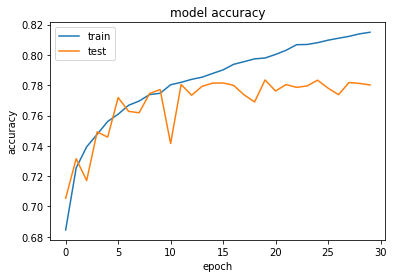

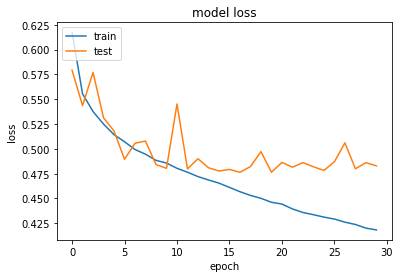

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 380us/sample - loss: 0.5906 - acc: 0.7024 - val_loss: 0.5399 - val_acc: 0.7366
Epoch 2/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0.5381 - acc: 0.7398 - val_loss: 0.5450 - val_acc: 0.7333
Epoch 3/30
80000/80000 [==============================] - 17s 215us/sample - loss: 0.5196 - acc: 0.7524 - val_loss: 0.5106 - val_acc: 0.7611
Epoch 4/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0.5072 - acc: 0.7610 - val_loss: 0.5635 - val_acc: 0.7239
Epoch 5/30
80000/80000 [==============================] - 17s 215us/sample - loss: 0.4965 - acc: 0.7683 - val_loss: 0.5105 - val_acc: 0.7632
Epoch 6/30
80000/80000 [==============================] - 17s 215us/sample - loss: 0.4886 - acc: 0.7746 - val_loss: 0.6250 - val_acc: 0.7121
Epoch 7/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0

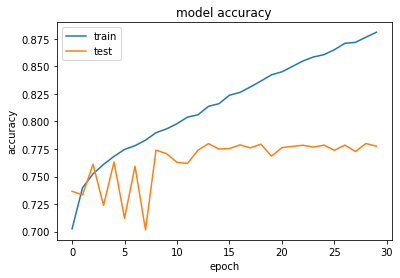

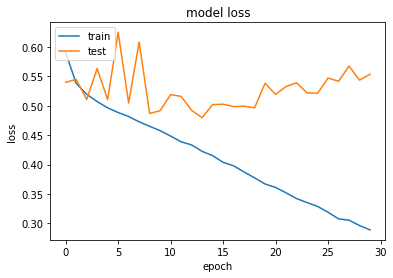

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 32s 402us/sample - loss: 0.6085 - acc: 0.6914 - val_loss: 0.5499 - val_acc: 0.7248
Epoch 2/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5477 - acc: 0.7293 - val_loss: 0.5415 - val_acc: 0.7321
Epoch 3/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5290 - acc: 0.7446 - val_loss: 0.5250 - val_acc: 0.7411
Epoch 4/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5157 - acc: 0.7558 - val_loss: 0.5692 - val_acc: 0.7266
Epoch 5/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5071 - acc: 0.7609 - val_loss: 0.5337 - val_acc: 0.7505
Epoch 6/30
80000/80000 [==============================] - 18s 225us/sample - loss: 0.5005 - acc: 0.7648 - val_loss: 0.5263 - val_acc: 0.7533
Epoch 7/30
80000/80000 [==============================] - 18s 227us/sample - loss: 0

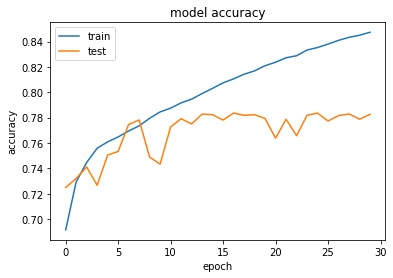

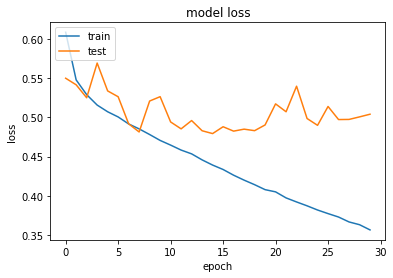

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 32s 405us/sample - loss: 0.6087 - acc: 0.6966 - val_loss: 0.5465 - val_acc: 0.7328
Epoch 2/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.5416 - acc: 0.7368 - val_loss: 0.5372 - val_acc: 0.7419
Epoch 3/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0.5218 - acc: 0.7513 - val_loss: 0.5132 - val_acc: 0.7569
Epoch 4/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.5092 - acc: 0.7594 - val_loss: 0.6416 - val_acc: 0.6520
Epoch 5/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.4986 - acc: 0.7671 - val_loss: 0.5258 - val_acc: 0.7464
Epoch 6/30
80000/80000 [==============================] - 19s 235us/sample - loss: 0.4892 - acc: 0.7753 - val_loss: 0.5247 - val_acc: 0.7548
Epoch 7/30
80000/80000 [==============================] - 19s 233us/sample - loss: 0

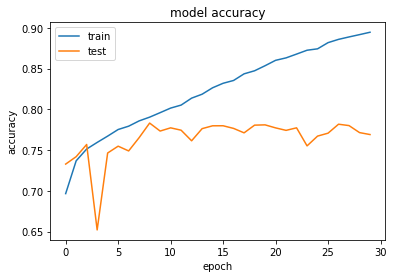

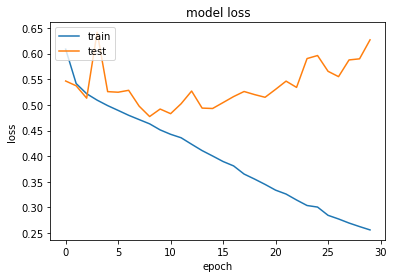

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.6076 - acc: 0.6922 - val_loss: 0.5484 - val_acc: 0.7306
Epoch 2/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0.5429 - acc: 0.7354 - val_loss: 0.5954 - val_acc: 0.7006
Epoch 3/30
80000/80000 [==============================] - 19s 244us/sample - loss: 0.5243 - acc: 0.7494 - val_loss: 0.5091 - val_acc: 0.7619
Epoch 4/30
80000/80000 [==============================] - 19s 244us/sample - loss: 0.5114 - acc: 0.7586 - val_loss: 0.5044 - val_acc: 0.7635
Epoch 5/30
80000/80000 [==============================] - 20s 244us/sample - loss: 0.5014 - acc: 0.7639 - val_loss: 0.6349 - val_acc: 0.6769
Epoch 6/30
80000/80000 [==============================] - 19s 244us/sample - loss: 0.4949 - acc: 0.7701 - val_loss: 0.5815 - val_acc: 0.7192
Epoch 7/30
80000/80000 [==============================] - 20s 244us/sample - loss: 0

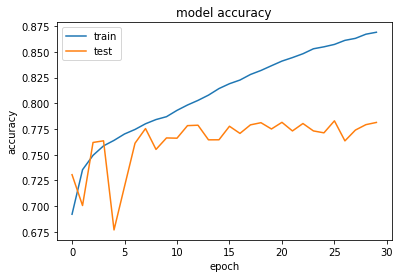

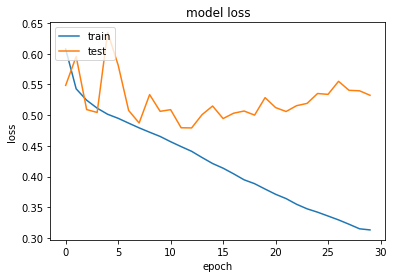

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 41s 513us/sample - loss: 0.5812 - acc: 0.7084 - val_loss: 0.5653 - val_acc: 0.7218
Epoch 2/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.5299 - acc: 0.7459 - val_loss: 0.5326 - val_acc: 0.7480
Epoch 3/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.5108 - acc: 0.7594 - val_loss: 0.6257 - val_acc: 0.6708
Epoch 4/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.4990 - acc: 0.7660 - val_loss: 0.5228 - val_acc: 0.7587
Epoch 5/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.4906 - acc: 0.7735 - val_loss: 0.5108 - val_acc: 0.7634
Epoch 6/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.4785 - acc: 0.7800 - val_loss: 0.5522 - val_acc: 0.7229
Epoch 7/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0

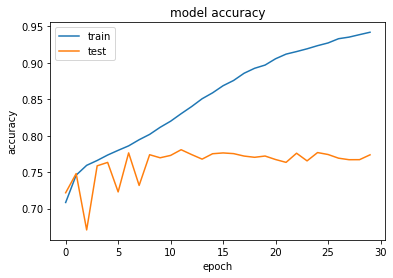

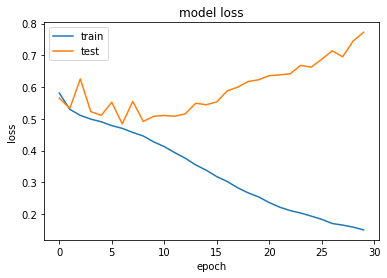

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 41s 509us/sample - loss: 0.6117 - acc: 0.6920 - val_loss: 0.5644 - val_acc: 0.7218
Epoch 2/30
80000/80000 [==============================] - 26s 322us/sample - loss: 0.5388 - acc: 0.7382 - val_loss: 0.5592 - val_acc: 0.7328
Epoch 3/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5193 - acc: 0.7545 - val_loss: 0.5439 - val_acc: 0.7404
Epoch 4/30
80000/80000 [==============================] - 26s 322us/sample - loss: 0.5065 - acc: 0.7626 - val_loss: 0.5034 - val_acc: 0.7632
Epoch 5/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.4959 - acc: 0.7692 - val_loss: 0.5316 - val_acc: 0.7440
Epoch 6/30
80000/80000 [==============================] - 26s 325us/sample - loss: 0.4879 - acc: 0.7736 - val_loss: 0.6198 - val_acc: 0.6720
Epoch 7/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0

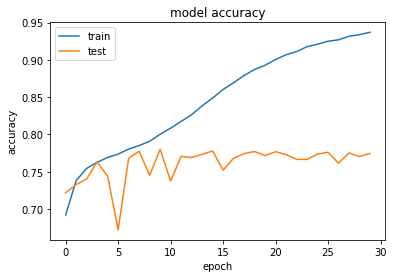

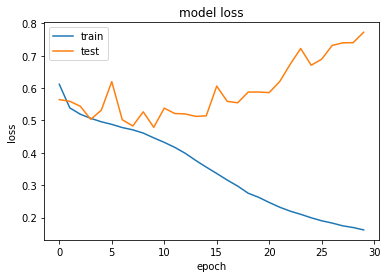

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 29s 368us/sample - loss: 0.5988 - acc: 0.6990 - val_loss: 0.6065 - val_acc: 0.6678
Epoch 2/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.5449 - acc: 0.7318 - val_loss: 0.5295 - val_acc: 0.7450
Epoch 3/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.5298 - acc: 0.7451 - val_loss: 0.5296 - val_acc: 0.7465
Epoch 4/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.5202 - acc: 0.7527 - val_loss: 0.5127 - val_acc: 0.7588
Epoch 5/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.5096 - acc: 0.7599 - val_loss: 0.5283 - val_acc: 0.7399
Epoch 6/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0.4999 - acc: 0.7647 - val_loss: 0.5838 - val_acc: 0.7247
Epoch 7/30
80000/80000 [==============================] - 15s 183us/sample - loss: 0

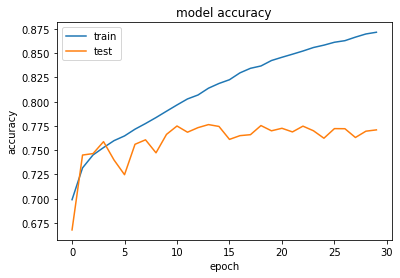

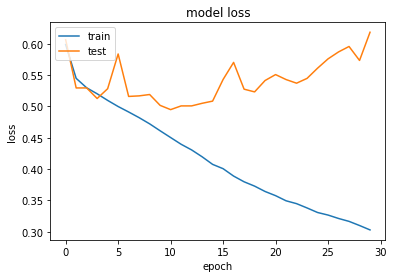

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 379us/sample - loss: 0.5897 - acc: 0.7022 - val_loss: 0.5813 - val_acc: 0.7065
Epoch 2/30
80000/80000 [==============================] - 15s 191us/sample - loss: 0.5371 - acc: 0.7416 - val_loss: 0.5171 - val_acc: 0.7546
Epoch 3/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0.5232 - acc: 0.7497 - val_loss: 0.5252 - val_acc: 0.7435
Epoch 4/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0.5134 - acc: 0.7561 - val_loss: 0.5098 - val_acc: 0.7604
Epoch 5/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0.5025 - acc: 0.7643 - val_loss: 0.5031 - val_acc: 0.7626
Epoch 6/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0.4936 - acc: 0.7689 - val_loss: 0.5016 - val_acc: 0.7684
Epoch 7/30
80000/80000 [==============================] - 15s 190us/sample - loss: 0

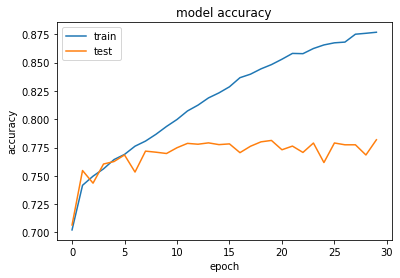

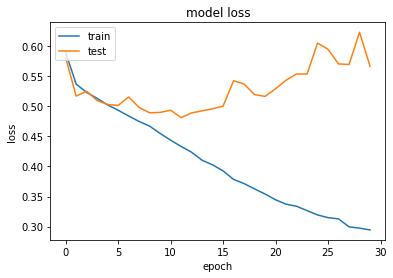

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 31s 384us/sample - loss: 0.6065 - acc: 0.6978 - val_loss: 0.5765 - val_acc: 0.7019
Epoch 2/30
80000/80000 [==============================] - 16s 197us/sample - loss: 0.5424 - acc: 0.7348 - val_loss: 0.5336 - val_acc: 0.7408
Epoch 3/30
80000/80000 [==============================] - 16s 197us/sample - loss: 0.5304 - acc: 0.7437 - val_loss: 0.5398 - val_acc: 0.7390
Epoch 4/30
80000/80000 [==============================] - 16s 197us/sample - loss: 0.5181 - acc: 0.7537 - val_loss: 0.5428 - val_acc: 0.7301
Epoch 5/30
80000/80000 [==============================] - 16s 197us/sample - loss: 0.5075 - acc: 0.7623 - val_loss: 0.5150 - val_acc: 0.7578
Epoch 6/30
80000/80000 [==============================] - 16s 197us/sample - loss: 0.4949 - acc: 0.7684 - val_loss: 0.5065 - val_acc: 0.7581
Epoch 7/30
80000/80000 [==============================] - 16s 198us/sample - loss: 0

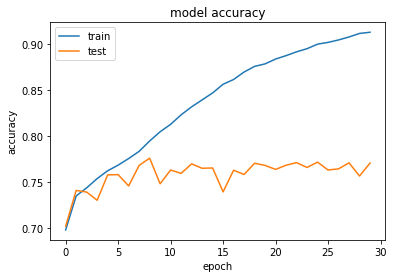

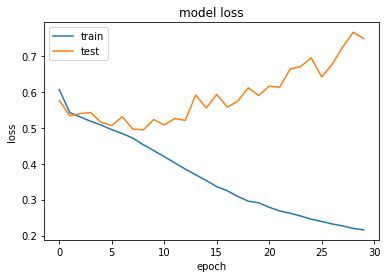

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 32s 401us/sample - loss: 0.5999 - acc: 0.7011 - val_loss: 0.5417 - val_acc: 0.7369
Epoch 2/30
80000/80000 [==============================] - 17s 209us/sample - loss: 0.5371 - acc: 0.7399 - val_loss: 0.5453 - val_acc: 0.7315
Epoch 3/30
80000/80000 [==============================] - 17s 209us/sample - loss: 0.5184 - acc: 0.7541 - val_loss: 0.5074 - val_acc: 0.7617
Epoch 4/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0.5076 - acc: 0.7598 - val_loss: 0.5891 - val_acc: 0.6793
Epoch 5/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0.4955 - acc: 0.7702 - val_loss: 0.4930 - val_acc: 0.7711
Epoch 6/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0.4852 - acc: 0.7761 - val_loss: 0.5029 - val_acc: 0.7708
Epoch 7/30
80000/80000 [==============================] - 17s 208us/sample - loss: 0

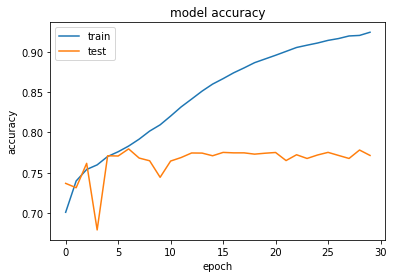

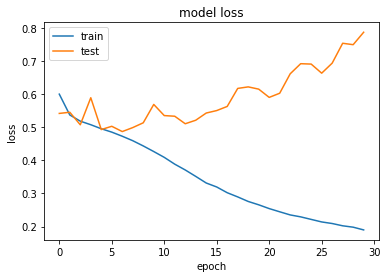

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 32s 405us/sample - loss: 0.5978 - acc: 0.7008 - val_loss: 0.5418 - val_acc: 0.7314
Epoch 2/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0.5403 - acc: 0.7358 - val_loss: 0.5861 - val_acc: 0.7048
Epoch 3/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0.5238 - acc: 0.7480 - val_loss: 0.5300 - val_acc: 0.7469
Epoch 4/30
80000/80000 [==============================] - 17s 213us/sample - loss: 0.5109 - acc: 0.7581 - val_loss: 0.5118 - val_acc: 0.7583
Epoch 5/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0.4980 - acc: 0.7664 - val_loss: 0.5000 - val_acc: 0.7673
Epoch 6/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0.4851 - acc: 0.7734 - val_loss: 0.5051 - val_acc: 0.7632
Epoch 7/30
80000/80000 [==============================] - 17s 214us/sample - loss: 0

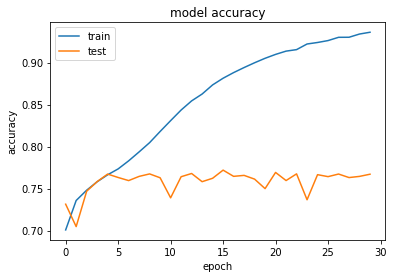

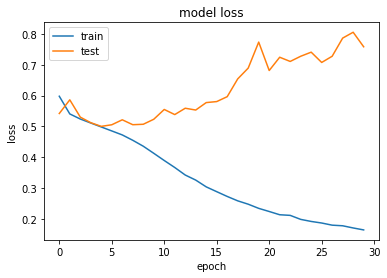

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.5883 - acc: 0.7063 - val_loss: 0.5599 - val_acc: 0.7274
Epoch 2/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5341 - acc: 0.7416 - val_loss: 0.5244 - val_acc: 0.7528
Epoch 3/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5235 - acc: 0.7502 - val_loss: 0.5535 - val_acc: 0.7363
Epoch 4/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5101 - acc: 0.7586 - val_loss: 0.5063 - val_acc: 0.7630
Epoch 5/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.4997 - acc: 0.7665 - val_loss: 0.5466 - val_acc: 0.7196
Epoch 6/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.4879 - acc: 0.7744 - val_loss: 0.7202 - val_acc: 0.6006
Epoch 7/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0

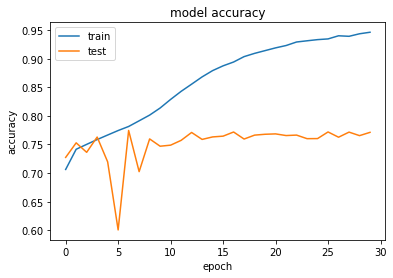

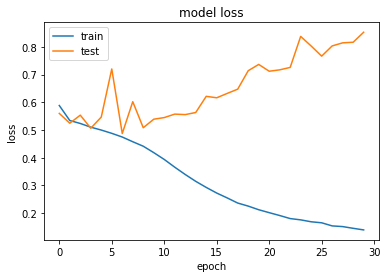

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 39s 491us/sample - loss: 0.5870 - acc: 0.7038 - val_loss: 0.6088 - val_acc: 0.6822
Epoch 2/30
80000/80000 [==============================] - 24s 295us/sample - loss: 0.5381 - acc: 0.7384 - val_loss: 0.5711 - val_acc: 0.7179
Epoch 3/30
80000/80000 [==============================] - 24s 295us/sample - loss: 0.5244 - acc: 0.7500 - val_loss: 0.7201 - val_acc: 0.6352
Epoch 4/30
80000/80000 [==============================] - 24s 295us/sample - loss: 0.5182 - acc: 0.7533 - val_loss: 0.5481 - val_acc: 0.7333
Epoch 5/30
80000/80000 [==============================] - 24s 295us/sample - loss: 0.5047 - acc: 0.7624 - val_loss: 0.5175 - val_acc: 0.7559
Epoch 6/30
80000/80000 [==============================] - 24s 295us/sample - loss: 0.4878 - acc: 0.7724 - val_loss: 0.5391 - val_acc: 0.7523
Epoch 7/30
80000/80000 [==============================] - 24s 295us/sample - loss: 0

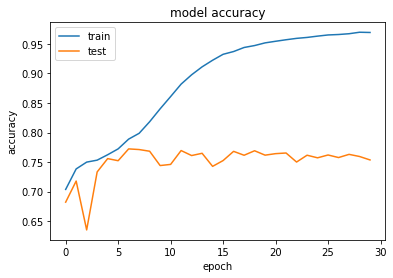

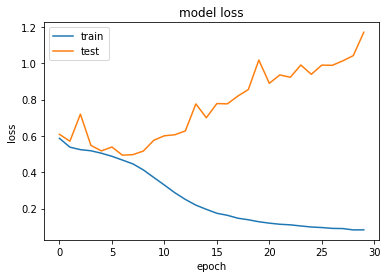

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 41s 518us/sample - loss: 0.5710 - acc: 0.7173 - val_loss: 0.5364 - val_acc: 0.7448
Epoch 2/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.5264 - acc: 0.7470 - val_loss: 0.5948 - val_acc: 0.7168
Epoch 3/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.5095 - acc: 0.7599 - val_loss: 0.5187 - val_acc: 0.7531
Epoch 4/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.4956 - acc: 0.7691 - val_loss: 0.7311 - val_acc: 0.6710
Epoch 5/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.4812 - acc: 0.7782 - val_loss: 0.4945 - val_acc: 0.7688
Epoch 6/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.4639 - acc: 0.7884 - val_loss: 0.6051 - val_acc: 0.7098
Epoch 7/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0

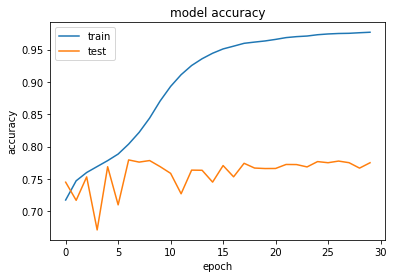

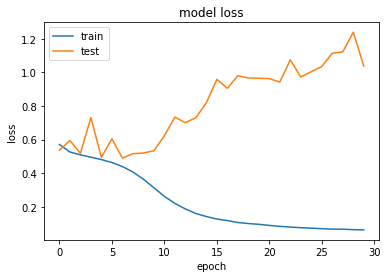

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 33s 408us/sample - loss: 0.6011 - acc: 0.7008 - val_loss: 0.5919 - val_acc: 0.6936
Epoch 2/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0.5389 - acc: 0.7391 - val_loss: 0.5565 - val_acc: 0.7347
Epoch 3/30
80000/80000 [==============================] - 16s 203us/sample - loss: 0.5235 - acc: 0.7502 - val_loss: 0.5308 - val_acc: 0.7477
Epoch 4/30
80000/80000 [==============================] - 16s 203us/sample - loss: 0.5126 - acc: 0.7582 - val_loss: 0.5468 - val_acc: 0.7264
Epoch 5/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0.5036 - acc: 0.7629 - val_loss: 0.5473 - val_acc: 0.7365
Epoch 6/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0.4940 - acc: 0.7696 - val_loss: 0.5003 - val_acc: 0.7683
Epoch 7/30
80000/80000 [==============================] - 16s 204us/sample - loss: 0

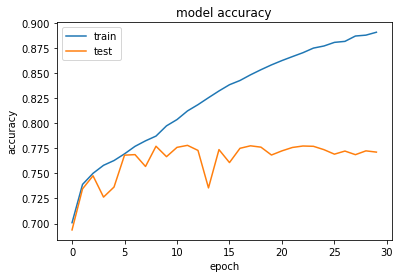

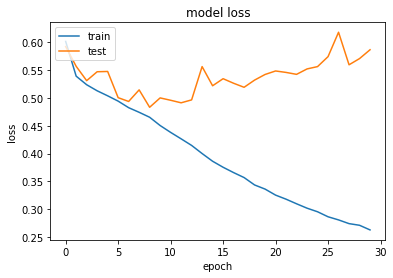

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 33s 415us/sample - loss: 0.5929 - acc: 0.7023 - val_loss: 0.5398 - val_acc: 0.7375
Epoch 2/30
80000/80000 [==============================] - 17s 211us/sample - loss: 0.5373 - acc: 0.7399 - val_loss: 0.5548 - val_acc: 0.7305
Epoch 3/30
80000/80000 [==============================] - 17s 211us/sample - loss: 0.5201 - acc: 0.7526 - val_loss: 0.5175 - val_acc: 0.7577
Epoch 4/30
80000/80000 [==============================] - 17s 212us/sample - loss: 0.5094 - acc: 0.7610 - val_loss: 0.5072 - val_acc: 0.7609
Epoch 5/30
80000/80000 [==============================] - 17s 211us/sample - loss: 0.5005 - acc: 0.7663 - val_loss: 0.5211 - val_acc: 0.7441
Epoch 6/30
80000/80000 [==============================] - 17s 211us/sample - loss: 0.4903 - acc: 0.7717 - val_loss: 0.5425 - val_acc: 0.7279
Epoch 7/30
80000/80000 [==============================] - 17s 211us/sample - loss: 0

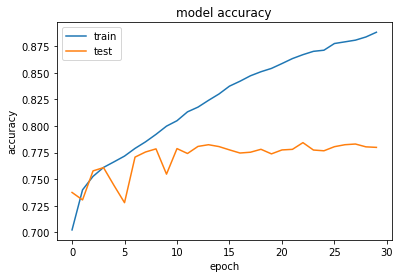

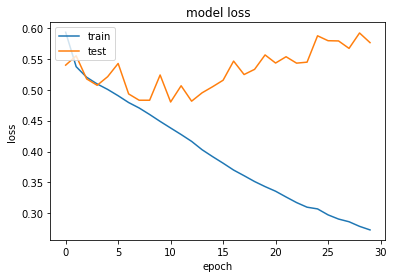

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 429us/sample - loss: 0.5763 - acc: 0.7114 - val_loss: 0.5893 - val_acc: 0.7025
Epoch 2/30
80000/80000 [==============================] - 18s 221us/sample - loss: 0.5325 - acc: 0.7440 - val_loss: 0.5488 - val_acc: 0.7315
Epoch 3/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.5171 - acc: 0.7554 - val_loss: 0.5329 - val_acc: 0.7430
Epoch 4/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.5049 - acc: 0.7621 - val_loss: 0.5537 - val_acc: 0.7247
Epoch 5/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4933 - acc: 0.7708 - val_loss: 0.5136 - val_acc: 0.7607
Epoch 6/30
80000/80000 [==============================] - 18s 221us/sample - loss: 0.4821 - acc: 0.7780 - val_loss: 0.5661 - val_acc: 0.7309
Epoch 7/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0

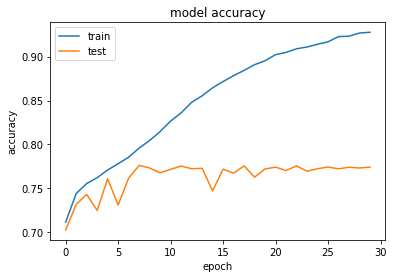

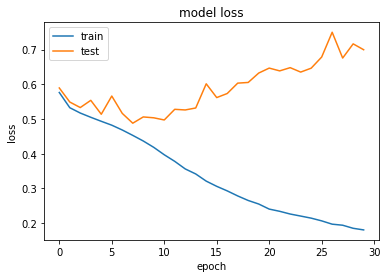

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 36s 445us/sample - loss: 0.5921 - acc: 0.7042 - val_loss: 0.5316 - val_acc: 0.7459
Epoch 2/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.5303 - acc: 0.7458 - val_loss: 0.5475 - val_acc: 0.7357
Epoch 3/30
80000/80000 [==============================] - 19s 231us/sample - loss: 0.5149 - acc: 0.7549 - val_loss: 0.5946 - val_acc: 0.7114
Epoch 4/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.5057 - acc: 0.7607 - val_loss: 0.5280 - val_acc: 0.7504
Epoch 5/30
80000/80000 [==============================] - 18s 231us/sample - loss: 0.4941 - acc: 0.7682 - val_loss: 0.5575 - val_acc: 0.7399
Epoch 6/30
80000/80000 [==============================] - 19s 231us/sample - loss: 0.4816 - acc: 0.7780 - val_loss: 0.5037 - val_acc: 0.7659
Epoch 7/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0

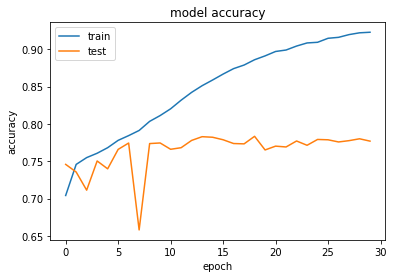

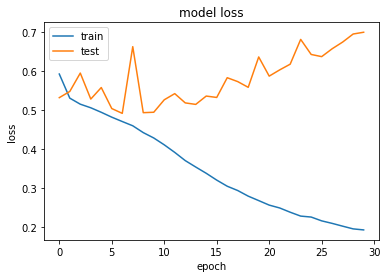

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 36s 451us/sample - loss: 0.5907 - acc: 0.7095 - val_loss: 0.5418 - val_acc: 0.7355
Epoch 2/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.5320 - acc: 0.7431 - val_loss: 0.7772 - val_acc: 0.6212
Epoch 3/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.5166 - acc: 0.7546 - val_loss: 0.5288 - val_acc: 0.7432
Epoch 4/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.5052 - acc: 0.7627 - val_loss: 0.6425 - val_acc: 0.6625
Epoch 5/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.4925 - acc: 0.7698 - val_loss: 0.4980 - val_acc: 0.7692
Epoch 6/30
80000/80000 [==============================] - 19s 239us/sample - loss: 0.4786 - acc: 0.7798 - val_loss: 0.5006 - val_acc: 0.7673
Epoch 7/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0

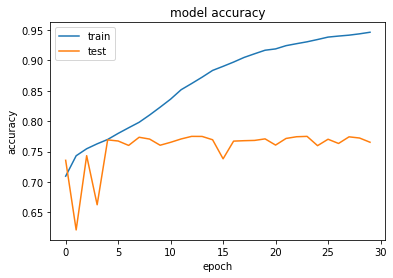

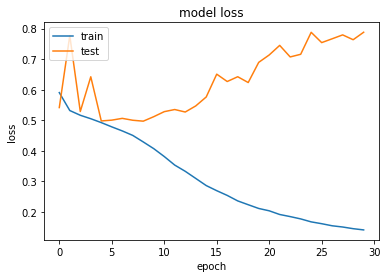

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 37s 465us/sample - loss: 0.5978 - acc: 0.7047 - val_loss: 0.5644 - val_acc: 0.7151
Epoch 2/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.5320 - acc: 0.7442 - val_loss: 0.6487 - val_acc: 0.6963
Epoch 3/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.5157 - acc: 0.7559 - val_loss: 0.5324 - val_acc: 0.7419
Epoch 4/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.5040 - acc: 0.7632 - val_loss: 0.5243 - val_acc: 0.7551
Epoch 5/30
80000/80000 [==============================] - 20s 249us/sample - loss: 0.4927 - acc: 0.7698 - val_loss: 0.5197 - val_acc: 0.7474
Epoch 6/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.4814 - acc: 0.7772 - val_loss: 0.6367 - val_acc: 0.6791
Epoch 7/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0

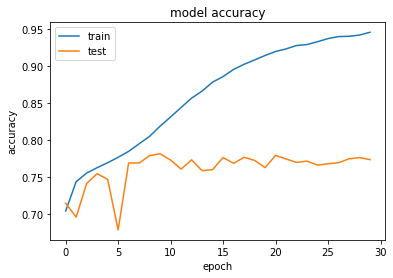

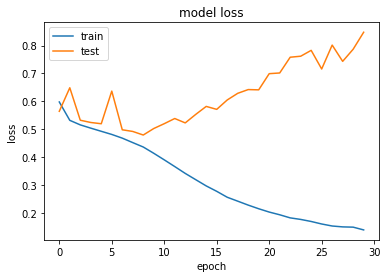

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 44s 545us/sample - loss: 0.6047 - acc: 0.7042 - val_loss: 0.5510 - val_acc: 0.7351
Epoch 2/30
80000/80000 [==============================] - 26s 324us/sample - loss: 0.5349 - acc: 0.7430 - val_loss: 0.5245 - val_acc: 0.7495
Epoch 3/30
80000/80000 [==============================] - 26s 324us/sample - loss: 0.5180 - acc: 0.7540 - val_loss: 0.6957 - val_acc: 0.6421
Epoch 4/30
80000/80000 [==============================] - 26s 324us/sample - loss: 0.5049 - acc: 0.7627 - val_loss: 0.5299 - val_acc: 0.7426
Epoch 5/30
80000/80000 [==============================] - 26s 324us/sample - loss: 0.4934 - acc: 0.7697 - val_loss: 0.5015 - val_acc: 0.7631
Epoch 6/30
80000/80000 [==============================] - 26s 324us/sample - loss: 0.4770 - acc: 0.7809 - val_loss: 0.5543 - val_acc: 0.7331
Epoch 7/30
80000/80000 [==============================] - 26s 324us/sample - loss: 0

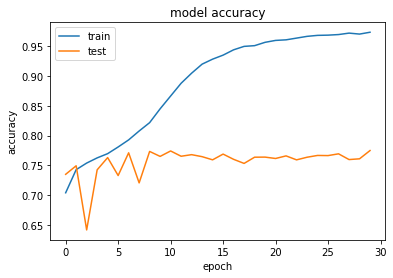

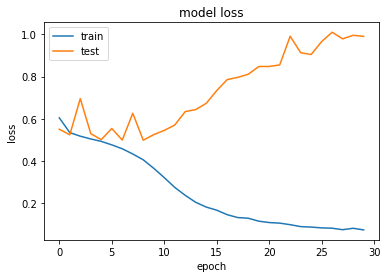

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 45s 568us/sample - loss: 0.5929 - acc: 0.7061 - val_loss: 0.5357 - val_acc: 0.7455
Epoch 2/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.5242 - acc: 0.7500 - val_loss: 0.5238 - val_acc: 0.7483
Epoch 3/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.5098 - acc: 0.7577 - val_loss: 0.6156 - val_acc: 0.7068
Epoch 4/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0.4981 - acc: 0.7682 - val_loss: 0.5079 - val_acc: 0.7637
Epoch 5/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0.4823 - acc: 0.7776 - val_loss: 0.4898 - val_acc: 0.7758
Epoch 6/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.4669 - acc: 0.7871 - val_loss: 0.5267 - val_acc: 0.7573
Epoch 7/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0

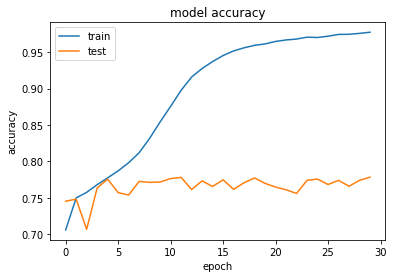

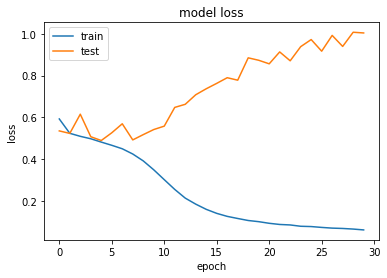

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 36s 455us/sample - loss: 0.6026 - acc: 0.7033 - val_loss: 0.5694 - val_acc: 0.7205
Epoch 2/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5403 - acc: 0.7397 - val_loss: 0.5320 - val_acc: 0.7474
Epoch 3/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5236 - acc: 0.7501 - val_loss: 0.5122 - val_acc: 0.7592
Epoch 4/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0.5139 - acc: 0.7560 - val_loss: 0.5244 - val_acc: 0.7493
Epoch 5/30
80000/80000 [==============================] - 18s 227us/sample - loss: 0.5048 - acc: 0.7620 - val_loss: 0.5063 - val_acc: 0.7638
Epoch 6/30
80000/80000 [==============================] - 18s 227us/sample - loss: 0.4945 - acc: 0.7685 - val_loss: 0.5446 - val_acc: 0.7411
Epoch 7/30
80000/80000 [==============================] - 18s 226us/sample - loss: 0

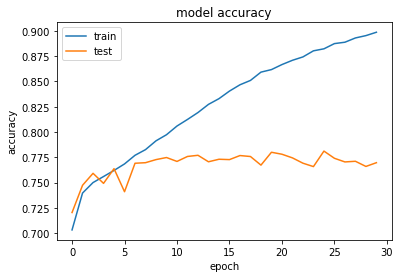

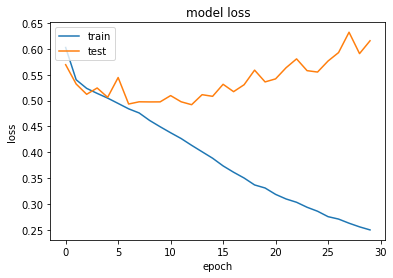

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 38s 474us/sample - loss: 0.6042 - acc: 0.6978 - val_loss: 0.5385 - val_acc: 0.7311
Epoch 2/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.5400 - acc: 0.7367 - val_loss: 0.5455 - val_acc: 0.7366
Epoch 3/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.5252 - acc: 0.7476 - val_loss: 0.5363 - val_acc: 0.7454
Epoch 4/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.5144 - acc: 0.7568 - val_loss: 0.5240 - val_acc: 0.7502
Epoch 5/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0.5078 - acc: 0.7599 - val_loss: 0.5200 - val_acc: 0.7505
Epoch 6/30
80000/80000 [==============================] - 19s 237us/sample - loss: 0.4982 - acc: 0.7676 - val_loss: 0.4945 - val_acc: 0.7713
Epoch 7/30
80000/80000 [==============================] - 19s 238us/sample - loss: 0

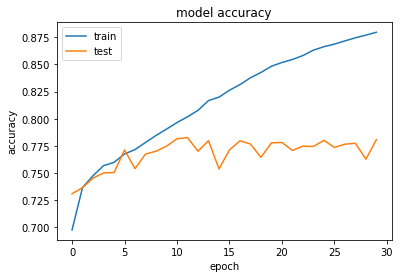

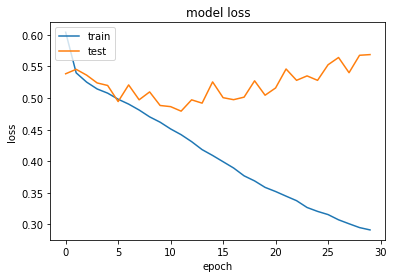

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 39s 489us/sample - loss: 0.5884 - acc: 0.7046 - val_loss: 0.5403 - val_acc: 0.7351
Epoch 2/30
80000/80000 [==============================] - 20s 246us/sample - loss: 0.5341 - acc: 0.7431 - val_loss: 0.5576 - val_acc: 0.7239
Epoch 3/30
80000/80000 [==============================] - 20s 247us/sample - loss: 0.5176 - acc: 0.7543 - val_loss: 0.6371 - val_acc: 0.6873
Epoch 4/30
80000/80000 [==============================] - 20s 246us/sample - loss: 0.5069 - acc: 0.7616 - val_loss: 0.5028 - val_acc: 0.7650
Epoch 5/30
80000/80000 [==============================] - 20s 246us/sample - loss: 0.4952 - acc: 0.7693 - val_loss: 0.6467 - val_acc: 0.6486
Epoch 6/30
80000/80000 [==============================] - 20s 246us/sample - loss: 0.4833 - acc: 0.7765 - val_loss: 0.5054 - val_acc: 0.7541
Epoch 7/30
80000/80000 [==============================] - 20s 246us/sample - loss: 0

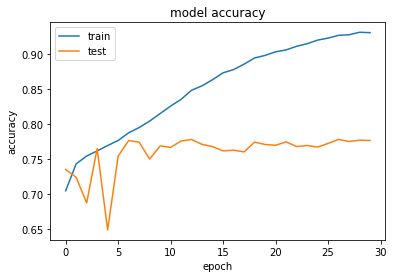

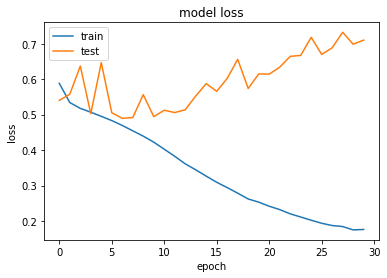

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 43s 537us/sample - loss: 0.5847 - acc: 0.7083 - val_loss: 0.5548 - val_acc: 0.7259
Epoch 2/30
80000/80000 [==============================] - 21s 264us/sample - loss: 0.5312 - acc: 0.7436 - val_loss: 0.5726 - val_acc: 0.7269
Epoch 3/30
80000/80000 [==============================] - 21s 267us/sample - loss: 0.5161 - acc: 0.7556 - val_loss: 0.6973 - val_acc: 0.6390
Epoch 4/30
80000/80000 [==============================] - 22s 272us/sample - loss: 0.5065 - acc: 0.7624 - val_loss: 0.5104 - val_acc: 0.7563
Epoch 5/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4946 - acc: 0.7685 - val_loss: 0.4885 - val_acc: 0.7694
Epoch 6/30
80000/80000 [==============================] - 21s 264us/sample - loss: 0.4829 - acc: 0.7773 - val_loss: 0.4936 - val_acc: 0.7703
Epoch 7/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0

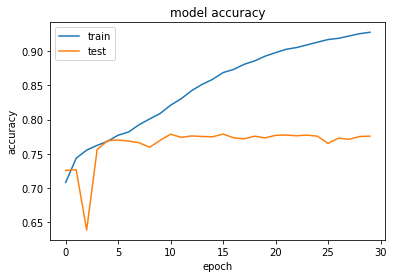

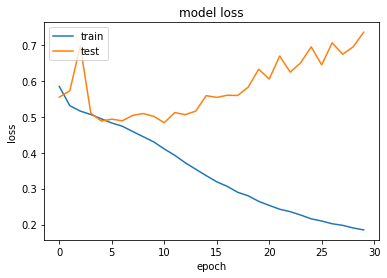

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 41s 512us/sample - loss: 0.5934 - acc: 0.7042 - val_loss: 0.5580 - val_acc: 0.7285
Epoch 2/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.5348 - acc: 0.7438 - val_loss: 0.5113 - val_acc: 0.7591
Epoch 3/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.5192 - acc: 0.7531 - val_loss: 0.5120 - val_acc: 0.7587
Epoch 4/30
80000/80000 [==============================] - 21s 261us/sample - loss: 0.5085 - acc: 0.7610 - val_loss: 0.5064 - val_acc: 0.7610
Epoch 5/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4965 - acc: 0.7692 - val_loss: 0.5866 - val_acc: 0.7150
Epoch 6/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.4839 - acc: 0.7769 - val_loss: 0.5612 - val_acc: 0.7115
Epoch 7/30
80000/80000 [==============================] - 21s 267us/sample - loss: 0

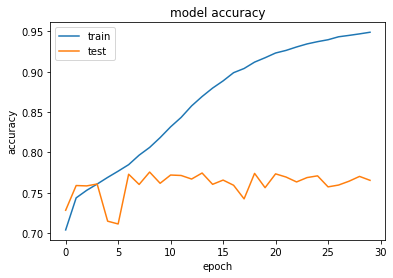

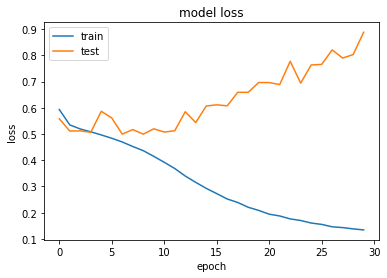

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 42s 530us/sample - loss: 0.5971 - acc: 0.7042 - val_loss: 0.5585 - val_acc: 0.7211
Epoch 2/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.5336 - acc: 0.7445 - val_loss: 0.6214 - val_acc: 0.6935
Epoch 3/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0.5178 - acc: 0.7551 - val_loss: 0.5898 - val_acc: 0.7171
Epoch 4/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0.5065 - acc: 0.7620 - val_loss: 0.5065 - val_acc: 0.7630
Epoch 5/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.4960 - acc: 0.7688 - val_loss: 0.5388 - val_acc: 0.7428
Epoch 6/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0.4844 - acc: 0.7760 - val_loss: 0.4900 - val_acc: 0.7742
Epoch 7/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0

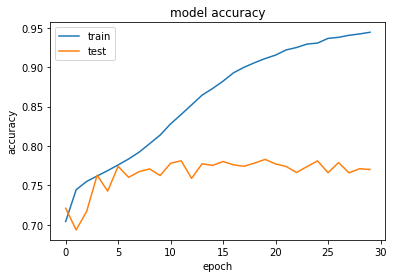

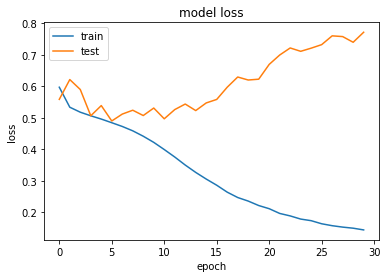

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 48s 603us/sample - loss: 0.5813 - acc: 0.7105 - val_loss: 0.5604 - val_acc: 0.7214
Epoch 2/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.5294 - acc: 0.7460 - val_loss: 0.5312 - val_acc: 0.7445
Epoch 3/30
80000/80000 [==============================] - 28s 351us/sample - loss: 0.5158 - acc: 0.7567 - val_loss: 0.5145 - val_acc: 0.7555
Epoch 4/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.5032 - acc: 0.7653 - val_loss: 0.5835 - val_acc: 0.7146
Epoch 5/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4909 - acc: 0.7720 - val_loss: 0.4986 - val_acc: 0.7645
Epoch 6/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4749 - acc: 0.7816 - val_loss: 0.4901 - val_acc: 0.7758
Epoch 7/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0

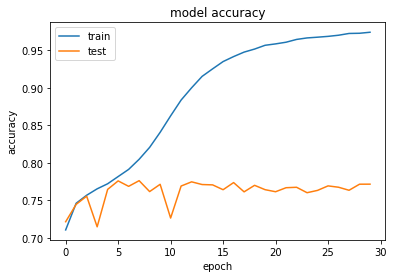

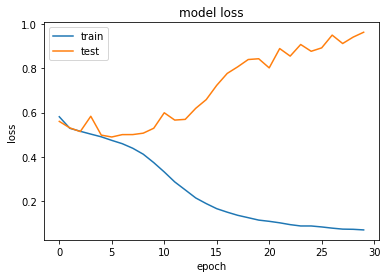

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 50s 631us/sample - loss: 0.5842 - acc: 0.7098 - val_loss: 0.5619 - val_acc: 0.7277
Epoch 2/30
80000/80000 [==============================] - 29s 368us/sample - loss: 0.5273 - acc: 0.7474 - val_loss: 0.6762 - val_acc: 0.6733
Epoch 3/30
80000/80000 [==============================] - 29s 367us/sample - loss: 0.5107 - acc: 0.7597 - val_loss: 0.5151 - val_acc: 0.7548
Epoch 4/30
80000/80000 [==============================] - 29s 368us/sample - loss: 0.5002 - acc: 0.7667 - val_loss: 1.1296 - val_acc: 0.5623
Epoch 5/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4871 - acc: 0.7747 - val_loss: 0.4803 - val_acc: 0.7770
Epoch 6/30
80000/80000 [==============================] - 29s 367us/sample - loss: 0.4712 - acc: 0.7841 - val_loss: 0.4892 - val_acc: 0.7715
Epoch 7/30
80000/80000 [==============================] - 29s 367us/sample - loss: 0

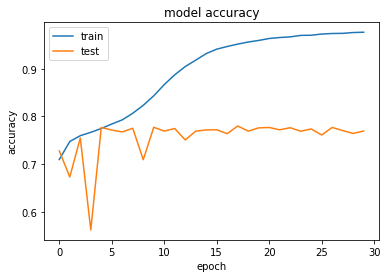

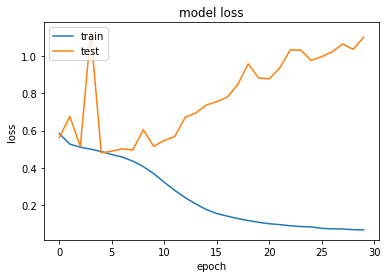

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 39s 492us/sample - loss: 0.5895 - acc: 0.6993 - val_loss: 0.5876 - val_acc: 0.6954
Epoch 2/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.5435 - acc: 0.7335 - val_loss: 0.5381 - val_acc: 0.7402
Epoch 3/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.5295 - acc: 0.7447 - val_loss: 0.5460 - val_acc: 0.7389
Epoch 4/30
80000/80000 [==============================] - 18s 231us/sample - loss: 0.5193 - acc: 0.7542 - val_loss: 0.5827 - val_acc: 0.7063
Epoch 5/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.5094 - acc: 0.7599 - val_loss: 0.5430 - val_acc: 0.7380
Epoch 6/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0.4980 - acc: 0.7672 - val_loss: 0.5238 - val_acc: 0.7538
Epoch 7/30
80000/80000 [==============================] - 19s 232us/sample - loss: 0

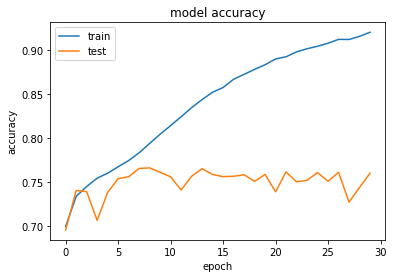

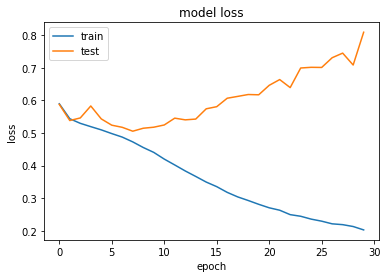

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 41s 512us/sample - loss: 0.5983 - acc: 0.6976 - val_loss: 0.5498 - val_acc: 0.7321
Epoch 2/30
80000/80000 [==============================] - 19s 244us/sample - loss: 0.5426 - acc: 0.7348 - val_loss: 0.5347 - val_acc: 0.7429
Epoch 3/30
80000/80000 [==============================] - 20s 244us/sample - loss: 0.5282 - acc: 0.7468 - val_loss: 0.5600 - val_acc: 0.7234
Epoch 4/30
80000/80000 [==============================] - 20s 244us/sample - loss: 0.5170 - acc: 0.7555 - val_loss: 0.5194 - val_acc: 0.7565
Epoch 5/30
80000/80000 [==============================] - 20s 244us/sample - loss: 0.5073 - acc: 0.7619 - val_loss: 0.5232 - val_acc: 0.7499
Epoch 6/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0.4967 - acc: 0.7677 - val_loss: 0.5458 - val_acc: 0.7426
Epoch 7/30
80000/80000 [==============================] - 20s 244us/sample - loss: 0

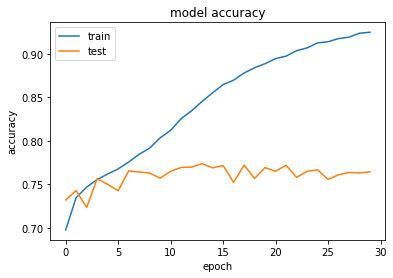

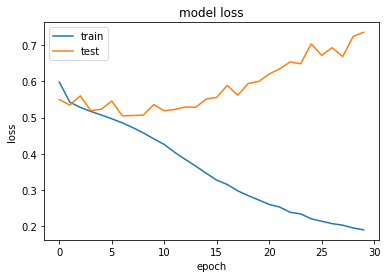

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 43s 534us/sample - loss: 0.6022 - acc: 0.6956 - val_loss: 0.5401 - val_acc: 0.7369
Epoch 2/30
80000/80000 [==============================] - 21s 267us/sample - loss: 0.5419 - acc: 0.7349 - val_loss: 0.7429 - val_acc: 0.6553
Epoch 3/30
80000/80000 [==============================] - 21s 267us/sample - loss: 0.5263 - acc: 0.7475 - val_loss: 0.5226 - val_acc: 0.7490
Epoch 4/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0.5155 - acc: 0.7560 - val_loss: 0.5284 - val_acc: 0.7490
Epoch 5/30
80000/80000 [==============================] - 21s 267us/sample - loss: 0.5045 - acc: 0.7617 - val_loss: 0.5063 - val_acc: 0.7671
Epoch 6/30
80000/80000 [==============================] - 21s 267us/sample - loss: 0.4925 - acc: 0.7705 - val_loss: 0.5433 - val_acc: 0.7285
Epoch 7/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0

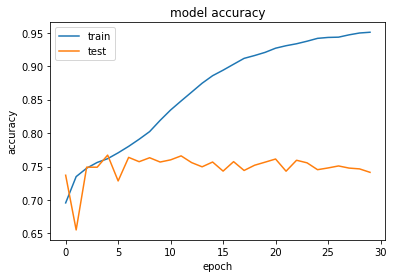

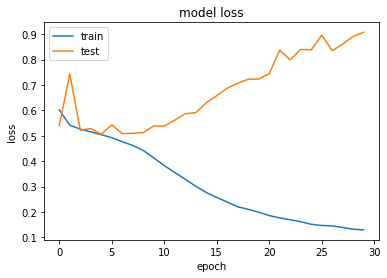

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 44s 551us/sample - loss: 0.5973 - acc: 0.6988 - val_loss: 0.6252 - val_acc: 0.6935
Epoch 2/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.5384 - acc: 0.7400 - val_loss: 0.5235 - val_acc: 0.7515
Epoch 3/30
80000/80000 [==============================] - 22s 276us/sample - loss: 0.5218 - acc: 0.7495 - val_loss: 0.5223 - val_acc: 0.7528
Epoch 4/30
80000/80000 [==============================] - 22s 276us/sample - loss: 0.5092 - acc: 0.7592 - val_loss: 0.5163 - val_acc: 0.7570
Epoch 5/30
80000/80000 [==============================] - 22s 276us/sample - loss: 0.4998 - acc: 0.7656 - val_loss: 0.6627 - val_acc: 0.6577
Epoch 6/30
80000/80000 [==============================] - 22s 276us/sample - loss: 0.4877 - acc: 0.7737 - val_loss: 0.4983 - val_acc: 0.7637
Epoch 7/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0

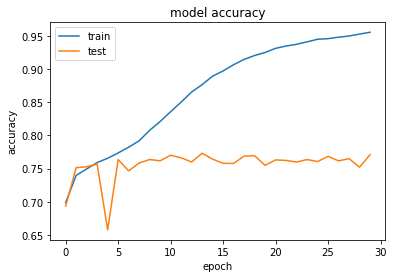

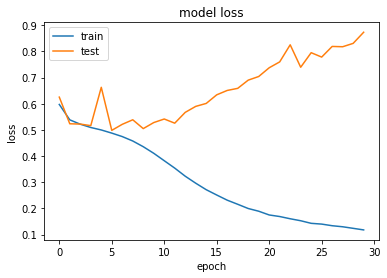

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 45s 560us/sample - loss: 0.5926 - acc: 0.7009 - val_loss: 0.5814 - val_acc: 0.7031
Epoch 2/30
80000/80000 [==============================] - 23s 287us/sample - loss: 0.5434 - acc: 0.7367 - val_loss: 0.5582 - val_acc: 0.7252
Epoch 3/30
80000/80000 [==============================] - 23s 287us/sample - loss: 0.5257 - acc: 0.7478 - val_loss: 0.5229 - val_acc: 0.7441
Epoch 4/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5159 - acc: 0.7546 - val_loss: 0.5846 - val_acc: 0.7104
Epoch 5/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5041 - acc: 0.7624 - val_loss: 0.5348 - val_acc: 0.7463
Epoch 6/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.4907 - acc: 0.7714 - val_loss: 0.5189 - val_acc: 0.7556
Epoch 7/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0

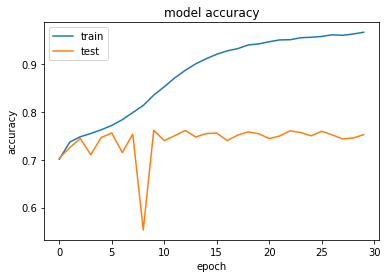

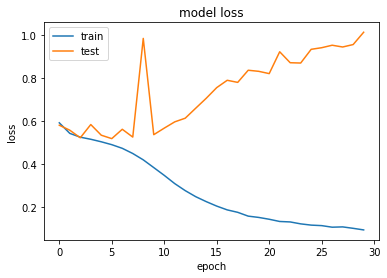

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 47s 582us/sample - loss: 0.6008 - acc: 0.6962 - val_loss: 0.5985 - val_acc: 0.6896
Epoch 2/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0.5346 - acc: 0.7431 - val_loss: 0.5951 - val_acc: 0.7106
Epoch 3/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0.5190 - acc: 0.7521 - val_loss: 0.5294 - val_acc: 0.7463
Epoch 4/30
80000/80000 [==============================] - 25s 306us/sample - loss: 0.5048 - acc: 0.7621 - val_loss: 0.6019 - val_acc: 0.7056
Epoch 5/30
80000/80000 [==============================] - 24s 306us/sample - loss: 0.4923 - acc: 0.7709 - val_loss: 0.5136 - val_acc: 0.7552
Epoch 6/30
80000/80000 [==============================] - 24s 306us/sample - loss: 0.4794 - acc: 0.7796 - val_loss: 0.5040 - val_acc: 0.7578
Epoch 7/30
80000/80000 [==============================] - 25s 306us/sample - loss: 0

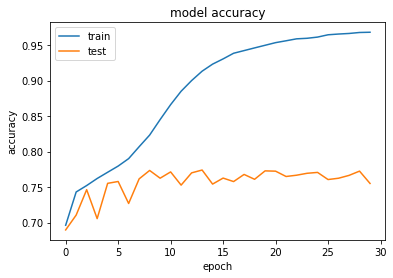

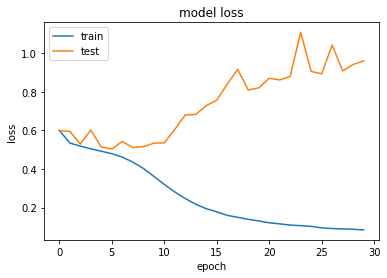

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 66s 821us/sample - loss: 0.6021 - acc: 0.6962 - val_loss: 0.5744 - val_acc: 0.7151
Epoch 2/30
80000/80000 [==============================] - 44s 546us/sample - loss: 0.5419 - acc: 0.7363 - val_loss: 0.6198 - val_acc: 0.7035
Epoch 3/30
80000/80000 [==============================] - 44s 548us/sample - loss: 0.5270 - acc: 0.7466 - val_loss: 0.5460 - val_acc: 0.7342
Epoch 4/30
80000/80000 [==============================] - 44s 549us/sample - loss: 0.5163 - acc: 0.7549 - val_loss: 0.5291 - val_acc: 0.7538
Epoch 5/30
80000/80000 [==============================] - 44s 550us/sample - loss: 0.5024 - acc: 0.7640 - val_loss: 0.5172 - val_acc: 0.7490
Epoch 6/30
80000/80000 [==============================] - 44s 549us/sample - loss: 0.4872 - acc: 0.7748 - val_loss: 0.5118 - val_acc: 0.7650
Epoch 7/30
80000/80000 [==============================] - 44s 550us/sample - loss: 0

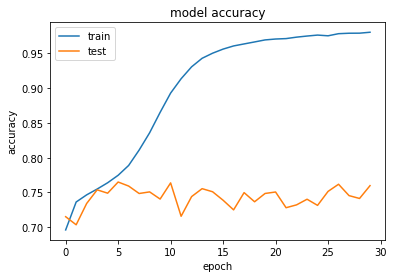

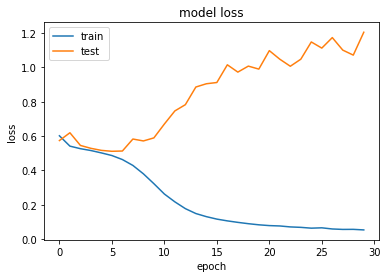

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 69s 864us/sample - loss: 0.5961 - acc: 0.7006 - val_loss: 0.6533 - val_acc: 0.6839
Epoch 2/30
80000/80000 [==============================] - 47s 593us/sample - loss: 0.5329 - acc: 0.7427 - val_loss: 0.5443 - val_acc: 0.7457
Epoch 3/30
80000/80000 [==============================] - 48s 595us/sample - loss: 0.5151 - acc: 0.7567 - val_loss: 0.5786 - val_acc: 0.7119
Epoch 4/30
80000/80000 [==============================] - 48s 596us/sample - loss: 0.5009 - acc: 0.7652 - val_loss: 0.5265 - val_acc: 0.7541
Epoch 5/30
80000/80000 [==============================] - 48s 596us/sample - loss: 0.4874 - acc: 0.7738 - val_loss: 0.7015 - val_acc: 0.6395
Epoch 6/30
80000/80000 [==============================] - 48s 596us/sample - loss: 0.4664 - acc: 0.7866 - val_loss: 0.5571 - val_acc: 0.7462
Epoch 7/30
80000/80000 [==============================] - 48s 598us/sample - loss: 0

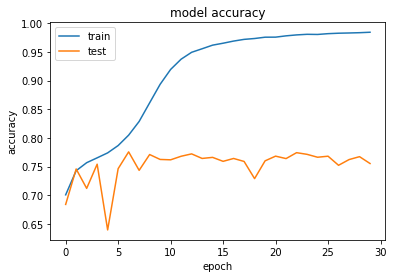

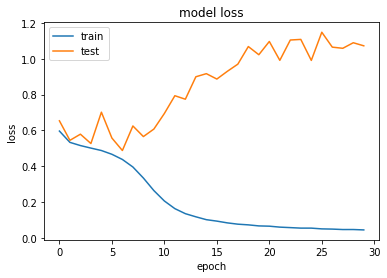

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 43s 536us/sample - loss: 0.5860 - acc: 0.7041 - val_loss: 0.5995 - val_acc: 0.6865
Epoch 2/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5381 - acc: 0.7390 - val_loss: 0.7112 - val_acc: 0.6600
Epoch 3/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5241 - acc: 0.7501 - val_loss: 0.5221 - val_acc: 0.7485
Epoch 4/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5146 - acc: 0.7570 - val_loss: 0.5818 - val_acc: 0.7258
Epoch 5/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5025 - acc: 0.7645 - val_loss: 0.5413 - val_acc: 0.7355
Epoch 6/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.4926 - acc: 0.7710 - val_loss: 0.5365 - val_acc: 0.7374
Epoch 7/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0

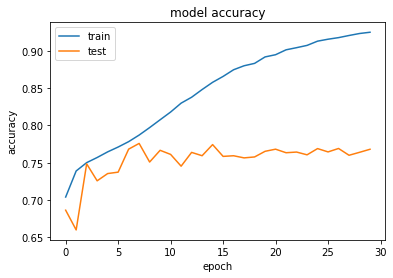

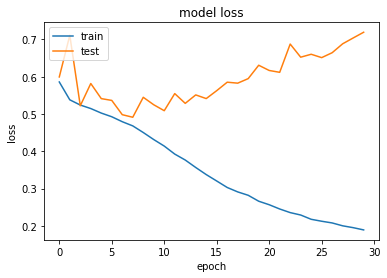

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.6053 - acc: 0.6962 - val_loss: 0.5671 - val_acc: 0.7172
Epoch 2/30
80000/80000 [==============================] - 21s 266us/sample - loss: 0.5389 - acc: 0.7392 - val_loss: 0.5549 - val_acc: 0.7303
Epoch 3/30
80000/80000 [==============================] - 21s 266us/sample - loss: 0.5242 - acc: 0.7485 - val_loss: 0.5243 - val_acc: 0.7527
Epoch 4/30
80000/80000 [==============================] - 21s 266us/sample - loss: 0.5145 - acc: 0.7565 - val_loss: 0.6457 - val_acc: 0.6836
Epoch 5/30
80000/80000 [==============================] - 21s 267us/sample - loss: 0.5040 - acc: 0.7633 - val_loss: 0.5599 - val_acc: 0.7276
Epoch 6/30
80000/80000 [==============================] - 21s 266us/sample - loss: 0.4945 - acc: 0.7700 - val_loss: 0.5151 - val_acc: 0.7599
Epoch 7/30
80000/80000 [==============================] - 21s 265us/sample - loss: 0

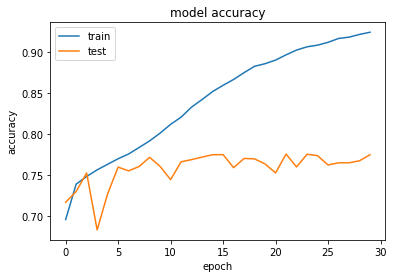

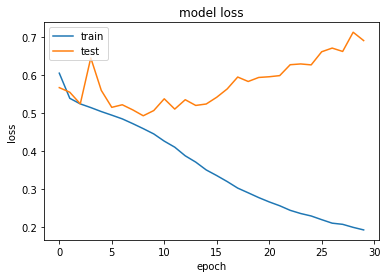

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 46s 580us/sample - loss: 0.5988 - acc: 0.7017 - val_loss: 0.5581 - val_acc: 0.7258
Epoch 2/30
80000/80000 [==============================] - 23s 292us/sample - loss: 0.5395 - acc: 0.7384 - val_loss: 0.6236 - val_acc: 0.6569
Epoch 3/30
80000/80000 [==============================] - 23s 291us/sample - loss: 0.5225 - acc: 0.7503 - val_loss: 0.5828 - val_acc: 0.7143
Epoch 4/30
80000/80000 [==============================] - 24s 296us/sample - loss: 0.5101 - acc: 0.7595 - val_loss: 0.5837 - val_acc: 0.7103
Epoch 5/30
80000/80000 [==============================] - 23s 292us/sample - loss: 0.5018 - acc: 0.7646 - val_loss: 0.5103 - val_acc: 0.7595
Epoch 6/30
80000/80000 [==============================] - 23s 293us/sample - loss: 0.4886 - acc: 0.7735 - val_loss: 0.5068 - val_acc: 0.7635
Epoch 7/30
80000/80000 [==============================] - 23s 292us/sample - loss: 0

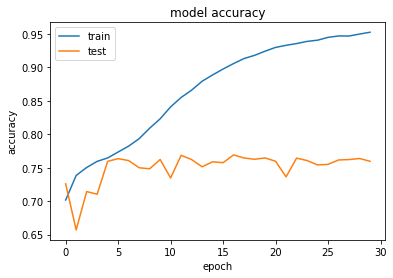

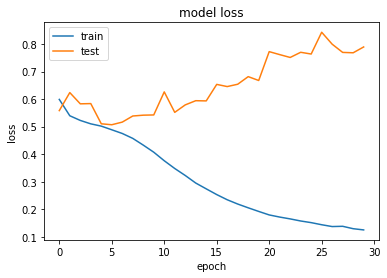

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 49s 608us/sample - loss: 0.5976 - acc: 0.7013 - val_loss: 0.5396 - val_acc: 0.7332
Epoch 2/30
80000/80000 [==============================] - 25s 309us/sample - loss: 0.5369 - acc: 0.7410 - val_loss: 0.5298 - val_acc: 0.7530
Epoch 3/30
80000/80000 [==============================] - 25s 309us/sample - loss: 0.5210 - acc: 0.7518 - val_loss: 0.5360 - val_acc: 0.7413
Epoch 4/30
80000/80000 [==============================] - 25s 308us/sample - loss: 0.5093 - acc: 0.7592 - val_loss: 0.5238 - val_acc: 0.7441
Epoch 5/30
80000/80000 [==============================] - 25s 309us/sample - loss: 0.5000 - acc: 0.7657 - val_loss: 0.5038 - val_acc: 0.7645
Epoch 6/30
80000/80000 [==============================] - 25s 309us/sample - loss: 0.4873 - acc: 0.7761 - val_loss: 0.5222 - val_acc: 0.7533
Epoch 7/30
80000/80000 [==============================] - 25s 310us/sample - loss: 0

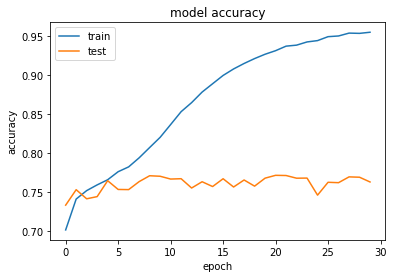

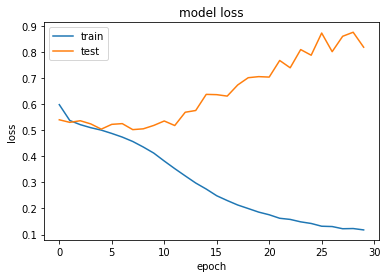

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 50s 622us/sample - loss: 0.6041 - acc: 0.6992 - val_loss: 0.6044 - val_acc: 0.6765
Epoch 2/30
80000/80000 [==============================] - 25s 314us/sample - loss: 0.5375 - acc: 0.7395 - val_loss: 0.6047 - val_acc: 0.7019
Epoch 3/30
80000/80000 [==============================] - 25s 314us/sample - loss: 0.5217 - acc: 0.7515 - val_loss: 0.6899 - val_acc: 0.6618
Epoch 4/30
80000/80000 [==============================] - 25s 315us/sample - loss: 0.5103 - acc: 0.7590 - val_loss: 0.5358 - val_acc: 0.7319
Epoch 5/30
80000/80000 [==============================] - 25s 314us/sample - loss: 0.4987 - acc: 0.7670 - val_loss: 0.5197 - val_acc: 0.7550
Epoch 6/30
80000/80000 [==============================] - 25s 314us/sample - loss: 0.4883 - acc: 0.7751 - val_loss: 0.5818 - val_acc: 0.6969
Epoch 7/30
80000/80000 [==============================] - 25s 315us/sample - loss: 0

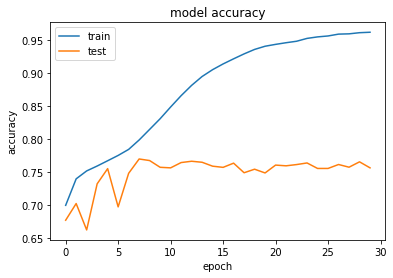

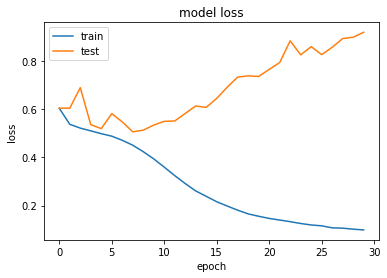

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 51s 641us/sample - loss: 0.5941 - acc: 0.7013 - val_loss: 0.5530 - val_acc: 0.7340
Epoch 2/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0.5341 - acc: 0.7425 - val_loss: 0.5744 - val_acc: 0.7074
Epoch 3/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0.5181 - acc: 0.7540 - val_loss: 0.5440 - val_acc: 0.7445
Epoch 4/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0.5066 - acc: 0.7605 - val_loss: 0.5271 - val_acc: 0.7406
Epoch 5/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0.4950 - acc: 0.7701 - val_loss: 0.5326 - val_acc: 0.7430
Epoch 6/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0.4816 - acc: 0.7786 - val_loss: 0.4981 - val_acc: 0.7678
Epoch 7/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0

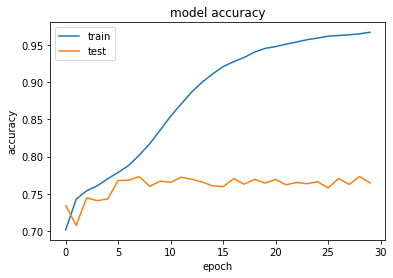

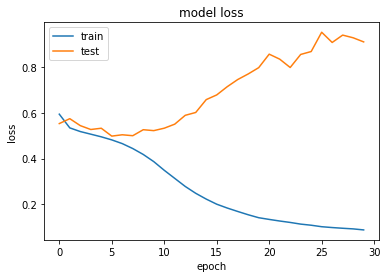

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 69s 867us/sample - loss: 0.5886 - acc: 0.7046 - val_loss: 0.5382 - val_acc: 0.7358
Epoch 2/30
80000/80000 [==============================] - 45s 563us/sample - loss: 0.5354 - acc: 0.7424 - val_loss: 0.5169 - val_acc: 0.7552
Epoch 3/30
80000/80000 [==============================] - 45s 566us/sample - loss: 0.5185 - acc: 0.7531 - val_loss: 0.5981 - val_acc: 0.7196
Epoch 4/30
80000/80000 [==============================] - 45s 566us/sample - loss: 0.5068 - acc: 0.7613 - val_loss: 0.5804 - val_acc: 0.7262
Epoch 5/30
80000/80000 [==============================] - 45s 568us/sample - loss: 0.4929 - acc: 0.7715 - val_loss: 0.5206 - val_acc: 0.7482
Epoch 6/30
80000/80000 [==============================] - 46s 570us/sample - loss: 0.4748 - acc: 0.7826 - val_loss: 0.5115 - val_acc: 0.7620
Epoch 7/30
80000/80000 [==============================] - 45s 568us/sample - loss: 0

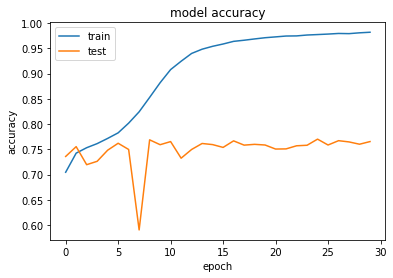

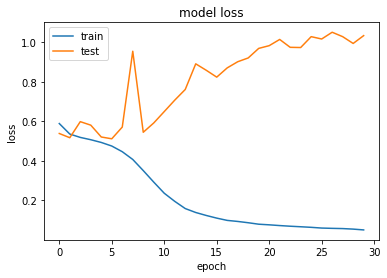

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 74s 930us/sample - loss: 0.5893 - acc: 0.7072 - val_loss: 0.5499 - val_acc: 0.7235
Epoch 2/30
80000/80000 [==============================] - 49s 612us/sample - loss: 0.5352 - acc: 0.7423 - val_loss: 0.5229 - val_acc: 0.7506
Epoch 3/30
80000/80000 [==============================] - 49s 616us/sample - loss: 0.5171 - acc: 0.7542 - val_loss: 0.5486 - val_acc: 0.7207
Epoch 4/30
80000/80000 [==============================] - 49s 615us/sample - loss: 0.5054 - acc: 0.7623 - val_loss: 0.5242 - val_acc: 0.7545
Epoch 5/30
80000/80000 [==============================] - 49s 615us/sample - loss: 0.4922 - acc: 0.7709 - val_loss: 0.4998 - val_acc: 0.7660
Epoch 6/30
80000/80000 [==============================] - 49s 617us/sample - loss: 0.4763 - acc: 0.7824 - val_loss: 0.8742 - val_acc: 0.5570
Epoch 7/30
80000/80000 [==============================] - 49s 617us/sample - loss: 0

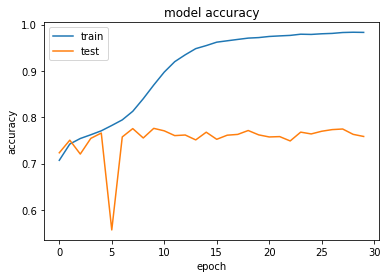

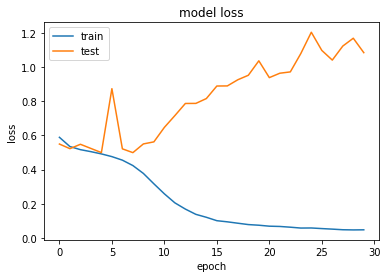

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 47s 592us/sample - loss: 0.5991 - acc: 0.7009 - val_loss: 0.6357 - val_acc: 0.6328
Epoch 2/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.5400 - acc: 0.7387 - val_loss: 0.5384 - val_acc: 0.7416
Epoch 3/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.5240 - acc: 0.7514 - val_loss: 0.5342 - val_acc: 0.7472
Epoch 4/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.5135 - acc: 0.7584 - val_loss: 0.5199 - val_acc: 0.7528
Epoch 5/30
80000/80000 [==============================] - 22s 276us/sample - loss: 0.5060 - acc: 0.7614 - val_loss: 0.5150 - val_acc: 0.7541
Epoch 6/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0.4938 - acc: 0.7704 - val_loss: 0.5217 - val_acc: 0.7481
Epoch 7/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0

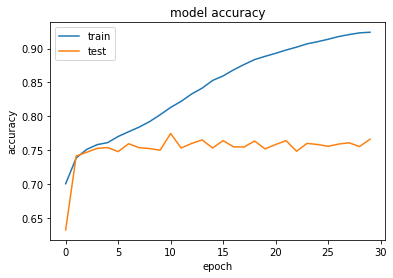

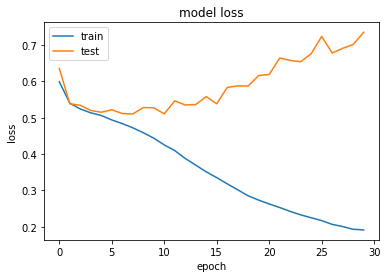

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 50s 626us/sample - loss: 0.6089 - acc: 0.6946 - val_loss: 0.5679 - val_acc: 0.7171
Epoch 2/30
80000/80000 [==============================] - 24s 294us/sample - loss: 0.5424 - acc: 0.7363 - val_loss: 0.5251 - val_acc: 0.7515
Epoch 3/30
80000/80000 [==============================] - 24s 294us/sample - loss: 0.5255 - acc: 0.7486 - val_loss: 0.5275 - val_acc: 0.7477
Epoch 4/30
80000/80000 [==============================] - 24s 294us/sample - loss: 0.5143 - acc: 0.7571 - val_loss: 0.5213 - val_acc: 0.7521
Epoch 5/30
80000/80000 [==============================] - 24s 294us/sample - loss: 0.5071 - acc: 0.7609 - val_loss: 0.5322 - val_acc: 0.7545
Epoch 6/30
80000/80000 [==============================] - 23s 293us/sample - loss: 0.4973 - acc: 0.7674 - val_loss: 0.5068 - val_acc: 0.7606
Epoch 7/30
80000/80000 [==============================] - 24s 294us/sample - loss: 0

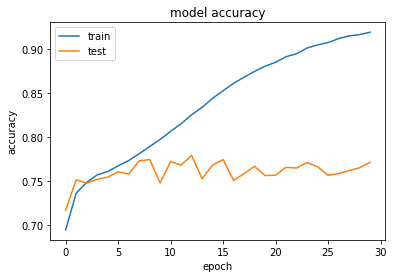

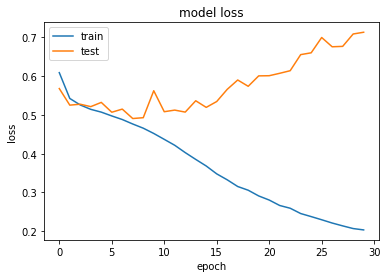

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 52s 647us/sample - loss: 0.5770 - acc: 0.7123 - val_loss: 0.6612 - val_acc: 0.6775
Epoch 2/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5325 - acc: 0.7433 - val_loss: 0.5988 - val_acc: 0.6992
Epoch 3/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5181 - acc: 0.7537 - val_loss: 0.5427 - val_acc: 0.7461
Epoch 4/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5082 - acc: 0.7601 - val_loss: 0.5153 - val_acc: 0.7534
Epoch 5/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.4973 - acc: 0.7678 - val_loss: 0.6037 - val_acc: 0.7053
Epoch 6/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.4855 - acc: 0.7760 - val_loss: 1.0740 - val_acc: 0.5778
Epoch 7/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0

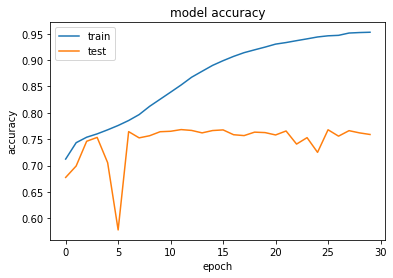

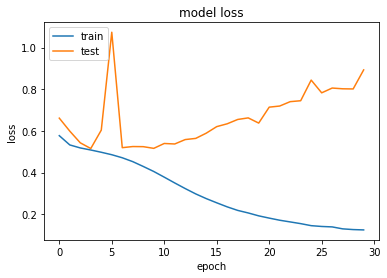

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 54s 671us/sample - loss: 0.5943 - acc: 0.7040 - val_loss: 0.5697 - val_acc: 0.7146
Epoch 2/30
80000/80000 [==============================] - 27s 337us/sample - loss: 0.5382 - acc: 0.7412 - val_loss: 0.5380 - val_acc: 0.7388
Epoch 3/30
80000/80000 [==============================] - 27s 338us/sample - loss: 0.5205 - acc: 0.7519 - val_loss: 0.6980 - val_acc: 0.6572
Epoch 4/30
80000/80000 [==============================] - 27s 337us/sample - loss: 0.5097 - acc: 0.7599 - val_loss: 0.6043 - val_acc: 0.7168
Epoch 5/30
80000/80000 [==============================] - 27s 338us/sample - loss: 0.5010 - acc: 0.7647 - val_loss: 0.5560 - val_acc: 0.7232
Epoch 6/30
80000/80000 [==============================] - 27s 338us/sample - loss: 0.4906 - acc: 0.7718 - val_loss: 0.4975 - val_acc: 0.7670
Epoch 7/30
80000/80000 [==============================] - 27s 338us/sample - loss: 0

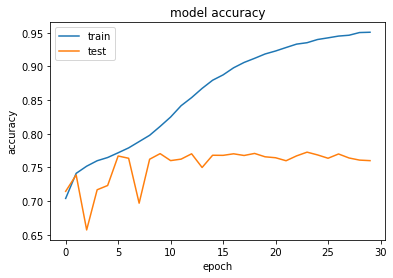

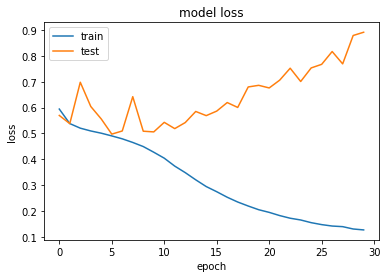

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 55s 686us/sample - loss: 0.5977 - acc: 0.7015 - val_loss: 0.5514 - val_acc: 0.7284
Epoch 2/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.5372 - acc: 0.7412 - val_loss: 0.5259 - val_acc: 0.7487
Epoch 3/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.5224 - acc: 0.7506 - val_loss: 0.5142 - val_acc: 0.7578
Epoch 4/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0.5113 - acc: 0.7594 - val_loss: 0.6394 - val_acc: 0.6714
Epoch 5/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.5019 - acc: 0.7653 - val_loss: 0.5516 - val_acc: 0.7336
Epoch 6/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0.4879 - acc: 0.7738 - val_loss: 0.5278 - val_acc: 0.7383
Epoch 7/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0

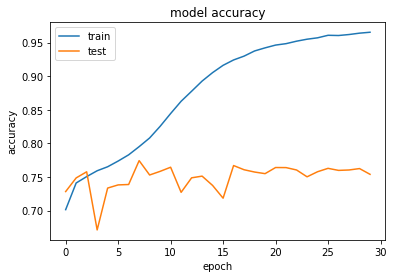

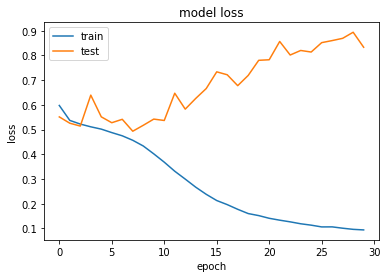

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 57s 714us/sample - loss: 0.5997 - acc: 0.6999 - val_loss: 0.5780 - val_acc: 0.7231
Epoch 2/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0.5392 - acc: 0.7401 - val_loss: 0.6186 - val_acc: 0.7022
Epoch 3/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0.5231 - acc: 0.7502 - val_loss: 0.5200 - val_acc: 0.7553
Epoch 4/30
80000/80000 [==============================] - 29s 359us/sample - loss: 0.5108 - acc: 0.7592 - val_loss: 0.5476 - val_acc: 0.7313
Epoch 5/30
80000/80000 [==============================] - 29s 359us/sample - loss: 0.5009 - acc: 0.7653 - val_loss: 0.4976 - val_acc: 0.7662
Epoch 6/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0.4903 - acc: 0.7723 - val_loss: 0.4979 - val_acc: 0.7684
Epoch 7/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0

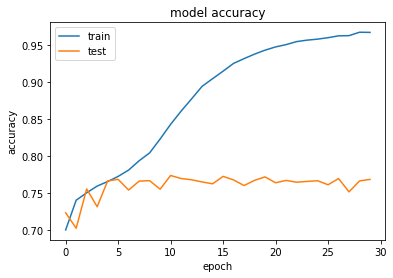

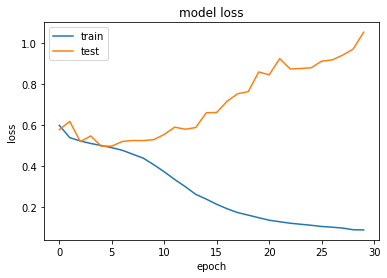

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 75s 942us/sample - loss: 0.5906 - acc: 0.7034 - val_loss: 0.5776 - val_acc: 0.7106
Epoch 2/30
80000/80000 [==============================] - 48s 595us/sample - loss: 0.5352 - acc: 0.7433 - val_loss: 0.5716 - val_acc: 0.7213
Epoch 3/30
80000/80000 [==============================] - 48s 597us/sample - loss: 0.5203 - acc: 0.7530 - val_loss: 0.5348 - val_acc: 0.7401
Epoch 4/30
80000/80000 [==============================] - 48s 597us/sample - loss: 0.5084 - acc: 0.7603 - val_loss: 0.5463 - val_acc: 0.7423
Epoch 5/30
80000/80000 [==============================] - 48s 599us/sample - loss: 0.4971 - acc: 0.7681 - val_loss: 0.5143 - val_acc: 0.7541
Epoch 6/30
80000/80000 [==============================] - 48s 599us/sample - loss: 0.4805 - acc: 0.7797 - val_loss: 0.5008 - val_acc: 0.7677
Epoch 7/30
80000/80000 [==============================] - 48s 598us/sample - loss: 0

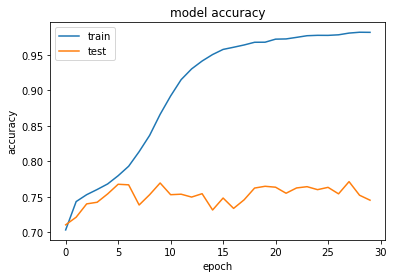

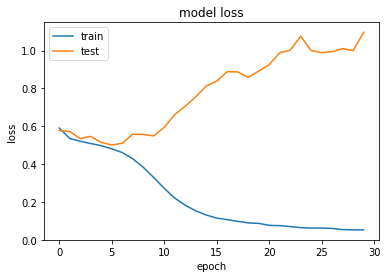

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 80s 1ms/sample - loss: 0.5976 - acc: 0.7027 - val_loss: 0.5848 - val_acc: 0.6980
Epoch 2/30
80000/80000 [==============================] - 51s 639us/sample - loss: 0.5365 - acc: 0.7405 - val_loss: 0.7972 - val_acc: 0.6204
Epoch 3/30
80000/80000 [==============================] - 51s 642us/sample - loss: 0.5204 - acc: 0.7532 - val_loss: 0.5575 - val_acc: 0.7329
Epoch 4/30
80000/80000 [==============================] - 51s 643us/sample - loss: 0.5066 - acc: 0.7610 - val_loss: 0.5366 - val_acc: 0.7297
Epoch 5/30
80000/80000 [==============================] - 51s 643us/sample - loss: 0.4983 - acc: 0.7668 - val_loss: 0.5384 - val_acc: 0.7456
Epoch 6/30
80000/80000 [==============================] - 51s 644us/sample - loss: 0.4837 - acc: 0.7773 - val_loss: 0.5002 - val_acc: 0.7679
Epoch 7/30
80000/80000 [==============================] - 51s 643us/sample - loss: 0.4

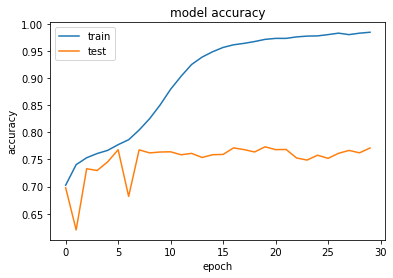

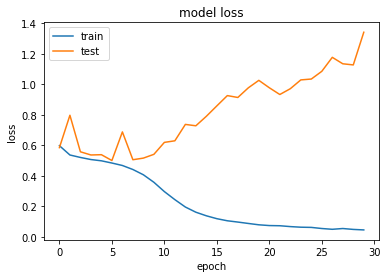

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 50s 630us/sample - loss: 0.5614 - acc: 0.7332 - val_loss: 0.4745 - val_acc: 0.7890
Epoch 2/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0.4793 - acc: 0.7833 - val_loss: 0.4657 - val_acc: 0.7972
Epoch 3/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0.4675 - acc: 0.7919 - val_loss: 0.5158 - val_acc: 0.7578
Epoch 4/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0.4592 - acc: 0.7972 - val_loss: 0.4761 - val_acc: 0.7786
Epoch 5/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.4525 - acc: 0.8007 - val_loss: 0.4609 - val_acc: 0.7944
Epoch 6/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0.4471 - acc: 0.8035 - val_loss: 0.4483 - val_acc: 0.8063
Epoch 7/30
80000/80000 [==============================] - 22s 274us/sample - loss: 0

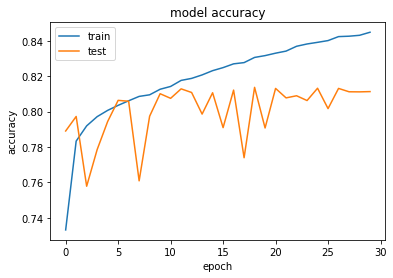

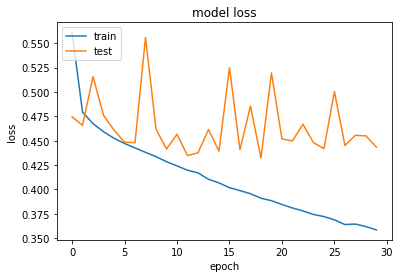

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 52s 647us/sample - loss: 0.5694 - acc: 0.7243 - val_loss: 0.5646 - val_acc: 0.7343
Epoch 2/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0.4870 - acc: 0.7800 - val_loss: 0.5781 - val_acc: 0.6843
Epoch 3/30
80000/80000 [==============================] - 23s 282us/sample - loss: 0.4726 - acc: 0.7889 - val_loss: 0.4639 - val_acc: 0.7972
Epoch 4/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0.4628 - acc: 0.7947 - val_loss: 0.4801 - val_acc: 0.7887
Epoch 5/30
80000/80000 [==============================] - 23s 282us/sample - loss: 0.4549 - acc: 0.7997 - val_loss: 0.4653 - val_acc: 0.7905
Epoch 6/30
80000/80000 [==============================] - 23s 282us/sample - loss: 0.4502 - acc: 0.8013 - val_loss: 0.4475 - val_acc: 0.8019
Epoch 7/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0

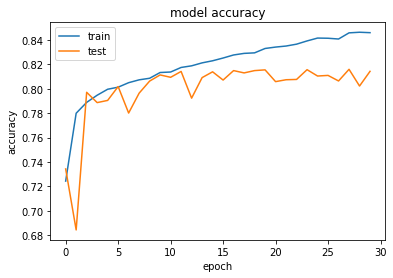

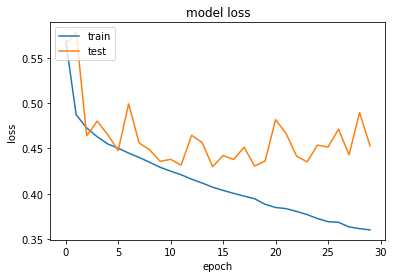

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 53s 660us/sample - loss: 0.5474 - acc: 0.7417 - val_loss: 0.5817 - val_acc: 0.7307
Epoch 2/30
80000/80000 [==============================] - 23s 289us/sample - loss: 0.4768 - acc: 0.7857 - val_loss: 0.4635 - val_acc: 0.7976
Epoch 3/30
80000/80000 [==============================] - 23s 290us/sample - loss: 0.4633 - acc: 0.7944 - val_loss: 0.4966 - val_acc: 0.7864
Epoch 4/30
80000/80000 [==============================] - 25s 308us/sample - loss: 0.4540 - acc: 0.7995 - val_loss: 0.4951 - val_acc: 0.7850
Epoch 5/30
80000/80000 [==============================] - 24s 295us/sample - loss: 0.4485 - acc: 0.8023 - val_loss: 0.4562 - val_acc: 0.8020
Epoch 6/30
80000/80000 [==============================] - 23s 292us/sample - loss: 0.4416 - acc: 0.8068 - val_loss: 0.4720 - val_acc: 0.7986
Epoch 7/30
80000/80000 [==============================] - 23s 293us/sample - loss: 0

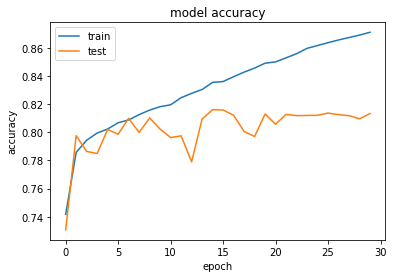

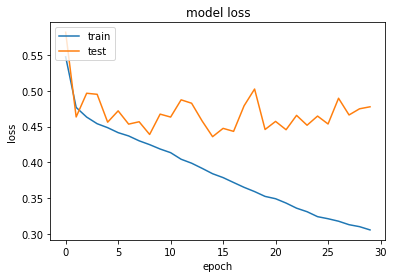

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 55s 682us/sample - loss: 0.5638 - acc: 0.7287 - val_loss: 0.6083 - val_acc: 0.7139
Epoch 2/30
80000/80000 [==============================] - 24s 299us/sample - loss: 0.4821 - acc: 0.7815 - val_loss: 0.5534 - val_acc: 0.7566
Epoch 3/30
80000/80000 [==============================] - 24s 298us/sample - loss: 0.4674 - acc: 0.7919 - val_loss: 0.5258 - val_acc: 0.7725
Epoch 4/30
80000/80000 [==============================] - 24s 299us/sample - loss: 0.4577 - acc: 0.7962 - val_loss: 0.4578 - val_acc: 0.7995
Epoch 5/30
80000/80000 [==============================] - 24s 299us/sample - loss: 0.4514 - acc: 0.8014 - val_loss: 0.4783 - val_acc: 0.7944
Epoch 6/30
80000/80000 [==============================] - 24s 300us/sample - loss: 0.4452 - acc: 0.8049 - val_loss: 0.5009 - val_acc: 0.7746
Epoch 7/30
80000/80000 [==============================] - 24s 300us/sample - loss: 0

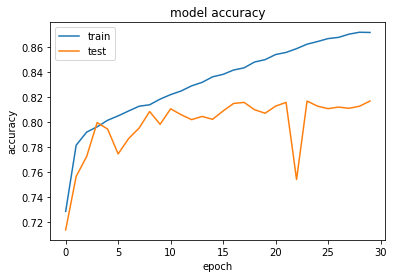

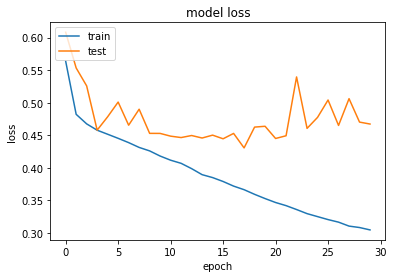

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 54s 672us/sample - loss: 0.5252 - acc: 0.7522 - val_loss: 0.5554 - val_acc: 0.7527
Epoch 2/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0.4701 - acc: 0.7904 - val_loss: 0.4690 - val_acc: 0.7939
Epoch 3/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0.4583 - acc: 0.7960 - val_loss: 0.4598 - val_acc: 0.7954
Epoch 4/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0.4513 - acc: 0.8001 - val_loss: 0.5597 - val_acc: 0.7577
Epoch 5/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0.4450 - acc: 0.8044 - val_loss: 0.4458 - val_acc: 0.8077
Epoch 6/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0.4384 - acc: 0.8074 - val_loss: 0.5041 - val_acc: 0.7650
Epoch 7/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0

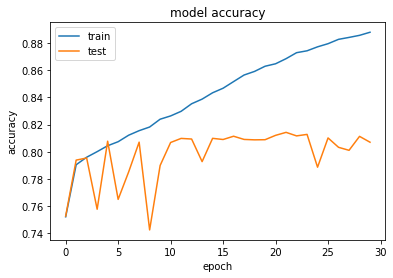

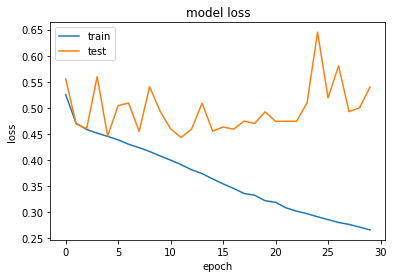

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 56s 699us/sample - loss: 0.5422 - acc: 0.7420 - val_loss: 0.4806 - val_acc: 0.7849
Epoch 2/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.4742 - acc: 0.7880 - val_loss: 0.4576 - val_acc: 0.8018
Epoch 3/30
80000/80000 [==============================] - 25s 317us/sample - loss: 0.4610 - acc: 0.7950 - val_loss: 0.4822 - val_acc: 0.7768
Epoch 4/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.4512 - acc: 0.8001 - val_loss: 0.4983 - val_acc: 0.7835
Epoch 5/30
80000/80000 [==============================] - 25s 318us/sample - loss: 0.4425 - acc: 0.8060 - val_loss: 0.4424 - val_acc: 0.8097
Epoch 6/30
80000/80000 [==============================] - 25s 317us/sample - loss: 0.4339 - acc: 0.8101 - val_loss: 0.5529 - val_acc: 0.7239
Epoch 7/30
80000/80000 [==============================] - 25s 317us/sample - loss: 0

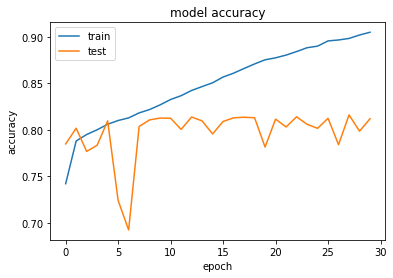

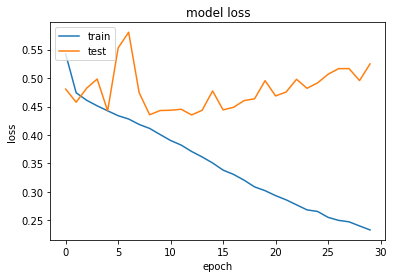

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 61s 759us/sample - loss: 0.5385 - acc: 0.7459 - val_loss: 0.4985 - val_acc: 0.7789
Epoch 2/30
80000/80000 [==============================] - 30s 380us/sample - loss: 0.4680 - acc: 0.7910 - val_loss: 0.4947 - val_acc: 0.7790
Epoch 3/30
80000/80000 [==============================] - 31s 382us/sample - loss: 0.4546 - acc: 0.7995 - val_loss: 0.4605 - val_acc: 0.8005
Epoch 4/30
80000/80000 [==============================] - 31s 382us/sample - loss: 0.4458 - acc: 0.8040 - val_loss: 0.5460 - val_acc: 0.7740
Epoch 5/30
80000/80000 [==============================] - 30s 381us/sample - loss: 0.4389 - acc: 0.8073 - val_loss: 0.4504 - val_acc: 0.8045
Epoch 6/30
80000/80000 [==============================] - 30s 380us/sample - loss: 0.4301 - acc: 0.8120 - val_loss: 0.4467 - val_acc: 0.8038
Epoch 7/30
80000/80000 [==============================] - 31s 383us/sample - loss: 0

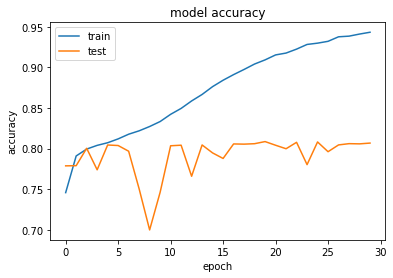

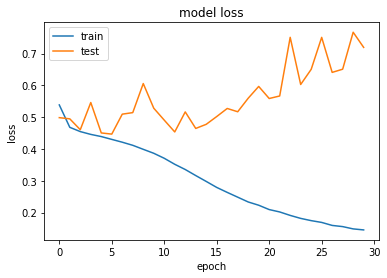

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 63s 787us/sample - loss: 0.5425 - acc: 0.7441 - val_loss: 0.4927 - val_acc: 0.7788
Epoch 2/30
80000/80000 [==============================] - 32s 397us/sample - loss: 0.4684 - acc: 0.7914 - val_loss: 0.5050 - val_acc: 0.7721
Epoch 3/30
80000/80000 [==============================] - 32s 397us/sample - loss: 0.4552 - acc: 0.7980 - val_loss: 0.4639 - val_acc: 0.7942
Epoch 4/30
80000/80000 [==============================] - 32s 397us/sample - loss: 0.4458 - acc: 0.8029 - val_loss: 0.4724 - val_acc: 0.7849
Epoch 5/30
80000/80000 [==============================] - 32s 398us/sample - loss: 0.4372 - acc: 0.8082 - val_loss: 0.4757 - val_acc: 0.7948
Epoch 6/30
80000/80000 [==============================] - 32s 398us/sample - loss: 0.4270 - acc: 0.8144 - val_loss: 0.4954 - val_acc: 0.7893
Epoch 7/30
80000/80000 [==============================] - 32s 397us/sample - loss: 0

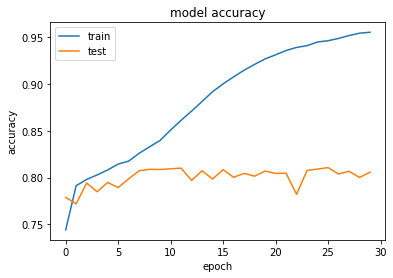

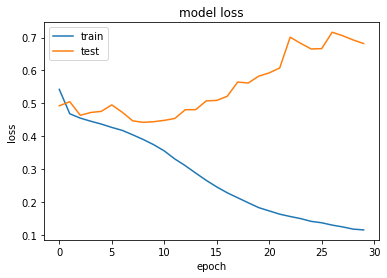

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 57s 708us/sample - loss: 0.5582 - acc: 0.7386 - val_loss: 0.5552 - val_acc: 0.7472
Epoch 2/30
80000/80000 [==============================] - 24s 299us/sample - loss: 0.4763 - acc: 0.7865 - val_loss: 0.4609 - val_acc: 0.7966
Epoch 3/30
80000/80000 [==============================] - 24s 299us/sample - loss: 0.4603 - acc: 0.7958 - val_loss: 0.4518 - val_acc: 0.8002
Epoch 4/30
80000/80000 [==============================] - 24s 300us/sample - loss: 0.4511 - acc: 0.8002 - val_loss: 0.4590 - val_acc: 0.7940
Epoch 5/30
80000/80000 [==============================] - 24s 298us/sample - loss: 0.4438 - acc: 0.8044 - val_loss: 0.4800 - val_acc: 0.7893
Epoch 6/30
80000/80000 [==============================] - 24s 300us/sample - loss: 0.4363 - acc: 0.8084 - val_loss: 0.4840 - val_acc: 0.7824
Epoch 7/30
80000/80000 [==============================] - 24s 299us/sample - loss: 0

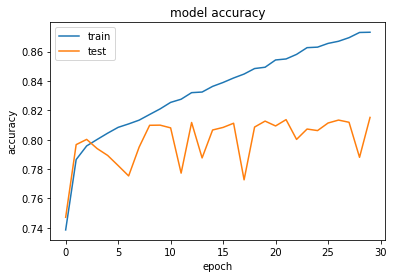

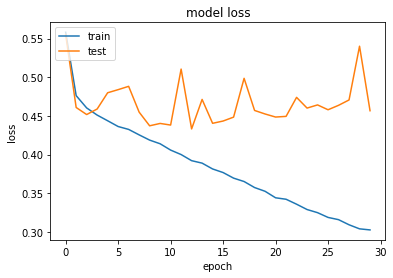

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 56s 704us/sample - loss: 0.5703 - acc: 0.7258 - val_loss: 0.6139 - val_acc: 0.7035
Epoch 2/30
80000/80000 [==============================] - 25s 311us/sample - loss: 0.4850 - acc: 0.7802 - val_loss: 0.4937 - val_acc: 0.7819
Epoch 3/30
80000/80000 [==============================] - 25s 311us/sample - loss: 0.4689 - acc: 0.7899 - val_loss: 0.5063 - val_acc: 0.7612
Epoch 4/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0.4591 - acc: 0.7953 - val_loss: 0.4547 - val_acc: 0.7988
Epoch 5/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0.4530 - acc: 0.7981 - val_loss: 0.4487 - val_acc: 0.8030
Epoch 6/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0.4495 - acc: 0.8017 - val_loss: 0.4813 - val_acc: 0.7836
Epoch 7/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0

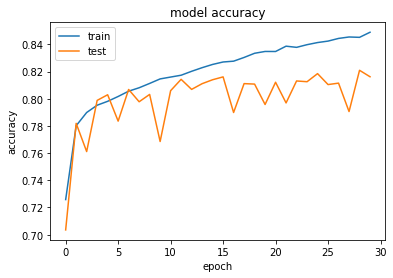

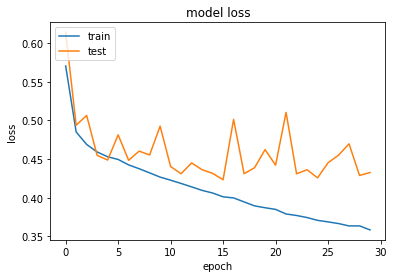

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 56s 705us/sample - loss: 0.5473 - acc: 0.7427 - val_loss: 0.5423 - val_acc: 0.7438
Epoch 2/30
80000/80000 [==============================] - 25s 313us/sample - loss: 0.4715 - acc: 0.7895 - val_loss: 0.4532 - val_acc: 0.8015
Epoch 3/30
80000/80000 [==============================] - 25s 314us/sample - loss: 0.4570 - acc: 0.7967 - val_loss: 0.5269 - val_acc: 0.7382
Epoch 4/30
80000/80000 [==============================] - 25s 313us/sample - loss: 0.4463 - acc: 0.8033 - val_loss: 0.5933 - val_acc: 0.6882
Epoch 5/30
80000/80000 [==============================] - 25s 313us/sample - loss: 0.4398 - acc: 0.8065 - val_loss: 0.4699 - val_acc: 0.7925
Epoch 6/30
80000/80000 [==============================] - 25s 313us/sample - loss: 0.4322 - acc: 0.8108 - val_loss: 0.4388 - val_acc: 0.8077
Epoch 7/30
80000/80000 [==============================] - 25s 313us/sample - loss: 0

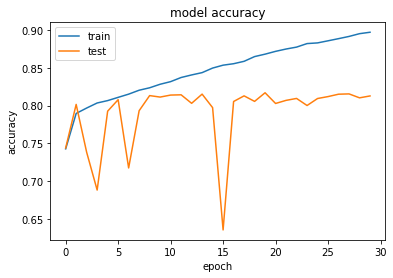

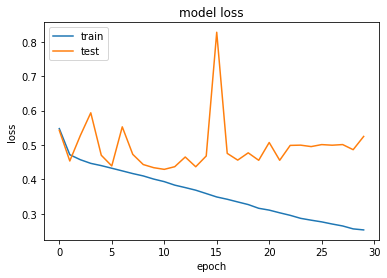

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 58s 726us/sample - loss: 0.5571 - acc: 0.7319 - val_loss: 0.4742 - val_acc: 0.7908
Epoch 2/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.4778 - acc: 0.7839 - val_loss: 0.4849 - val_acc: 0.7755
Epoch 3/30
80000/80000 [==============================] - 26s 327us/sample - loss: 0.4626 - acc: 0.7948 - val_loss: 0.4638 - val_acc: 0.7939
Epoch 4/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.4532 - acc: 0.8006 - val_loss: 0.4653 - val_acc: 0.7959
Epoch 5/30
80000/80000 [==============================] - 26s 327us/sample - loss: 0.4469 - acc: 0.8026 - val_loss: 0.4441 - val_acc: 0.8094
Epoch 6/30
80000/80000 [==============================] - 26s 327us/sample - loss: 0.4399 - acc: 0.8065 - val_loss: 0.4433 - val_acc: 0.8066
Epoch 7/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0

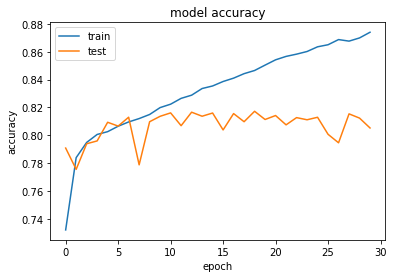

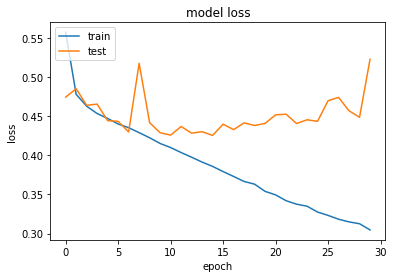

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 59s 740us/sample - loss: 0.5291 - acc: 0.7528 - val_loss: 0.4696 - val_acc: 0.7937
Epoch 2/30
80000/80000 [==============================] - 27s 335us/sample - loss: 0.4661 - acc: 0.7919 - val_loss: 0.4536 - val_acc: 0.8017
Epoch 3/30
80000/80000 [==============================] - 27s 335us/sample - loss: 0.4529 - acc: 0.7985 - val_loss: 0.4543 - val_acc: 0.7994
Epoch 4/30
80000/80000 [==============================] - 27s 335us/sample - loss: 0.4440 - acc: 0.8044 - val_loss: 0.4676 - val_acc: 0.7979
Epoch 5/30
80000/80000 [==============================] - 27s 335us/sample - loss: 0.4348 - acc: 0.8092 - val_loss: 0.5373 - val_acc: 0.7695
Epoch 6/30
80000/80000 [==============================] - 27s 334us/sample - loss: 0.4265 - acc: 0.8145 - val_loss: 0.7839 - val_acc: 0.6028
Epoch 7/30
80000/80000 [==============================] - 27s 335us/sample - loss: 0

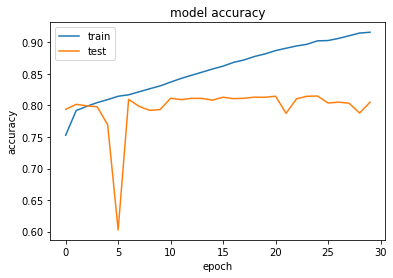

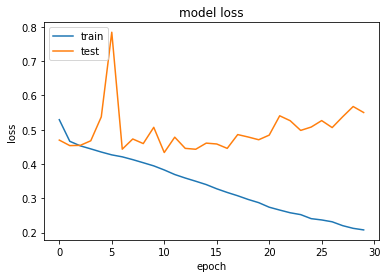

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 61s 764us/sample - loss: 0.5562 - acc: 0.7339 - val_loss: 0.5310 - val_acc: 0.7427
Epoch 2/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4756 - acc: 0.7869 - val_loss: 0.5257 - val_acc: 0.7529
Epoch 3/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4603 - acc: 0.7953 - val_loss: 0.4865 - val_acc: 0.7778
Epoch 4/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4511 - acc: 0.8004 - val_loss: 0.4622 - val_acc: 0.7993
Epoch 5/30
80000/80000 [==============================] - 28s 347us/sample - loss: 0.4437 - acc: 0.8049 - val_loss: 0.4851 - val_acc: 0.7832
Epoch 6/30
80000/80000 [==============================] - 28s 347us/sample - loss: 0.4354 - acc: 0.8092 - val_loss: 0.4451 - val_acc: 0.8062
Epoch 7/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0

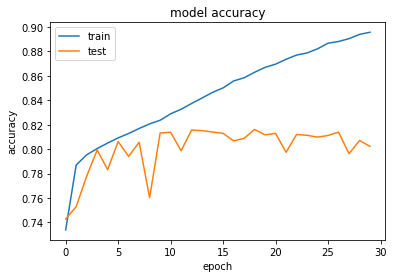

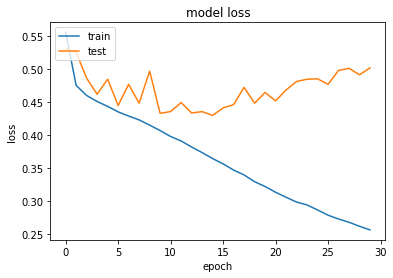

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 66s 821us/sample - loss: 0.5261 - acc: 0.7542 - val_loss: 0.4639 - val_acc: 0.7956
Epoch 2/30
80000/80000 [==============================] - 33s 413us/sample - loss: 0.4634 - acc: 0.7933 - val_loss: 0.4636 - val_acc: 0.7940
Epoch 3/30
80000/80000 [==============================] - 33s 413us/sample - loss: 0.4495 - acc: 0.8006 - val_loss: 0.4582 - val_acc: 0.7940
Epoch 4/30
80000/80000 [==============================] - 33s 414us/sample - loss: 0.4404 - acc: 0.8058 - val_loss: 1.0315 - val_acc: 0.5223
Epoch 5/30
80000/80000 [==============================] - 33s 413us/sample - loss: 0.4322 - acc: 0.8102 - val_loss: 0.4418 - val_acc: 0.8106
Epoch 6/30
80000/80000 [==============================] - 33s 413us/sample - loss: 0.4224 - acc: 0.8169 - val_loss: 0.4607 - val_acc: 0.7915
Epoch 7/30
80000/80000 [==============================] - 33s 412us/sample - loss: 0

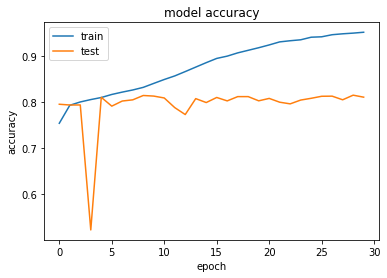

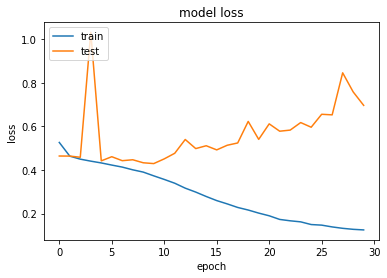

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 68s 855us/sample - loss: 0.5337 - acc: 0.7496 - val_loss: 0.4826 - val_acc: 0.7829
Epoch 2/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.4689 - acc: 0.7901 - val_loss: 0.4657 - val_acc: 0.7954
Epoch 3/30
80000/80000 [==============================] - 34s 423us/sample - loss: 0.4539 - acc: 0.7997 - val_loss: 0.5918 - val_acc: 0.7283
Epoch 4/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.4450 - acc: 0.8036 - val_loss: 0.4412 - val_acc: 0.8080
Epoch 5/30
80000/80000 [==============================] - 34s 423us/sample - loss: 0.4360 - acc: 0.8105 - val_loss: 0.4379 - val_acc: 0.8115
Epoch 6/30
80000/80000 [==============================] - 34s 423us/sample - loss: 0.4279 - acc: 0.8127 - val_loss: 0.4364 - val_acc: 0.8115
Epoch 7/30
80000/80000 [==============================] - 34s 426us/sample - loss: 0

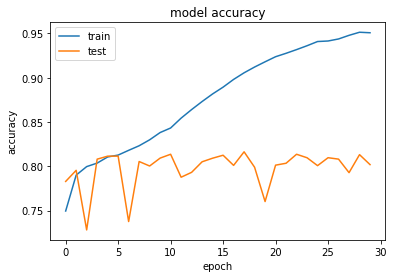

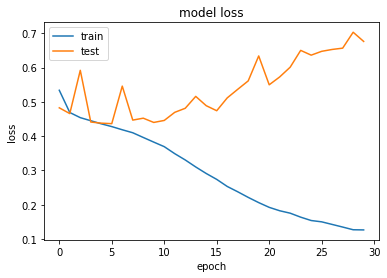

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 60s 754us/sample - loss: 0.5538 - acc: 0.7379 - val_loss: 0.7157 - val_acc: 0.6294
Epoch 2/30
80000/80000 [==============================] - 26s 329us/sample - loss: 0.4782 - acc: 0.7856 - val_loss: 0.4880 - val_acc: 0.7792
Epoch 3/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.4606 - acc: 0.7948 - val_loss: 0.5048 - val_acc: 0.7544
Epoch 4/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.4508 - acc: 0.8013 - val_loss: 0.4552 - val_acc: 0.7974
Epoch 5/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.4444 - acc: 0.8038 - val_loss: 0.5495 - val_acc: 0.7347
Epoch 6/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0.4376 - acc: 0.8072 - val_loss: 0.4985 - val_acc: 0.7731
Epoch 7/30
80000/80000 [==============================] - 26s 328us/sample - loss: 0

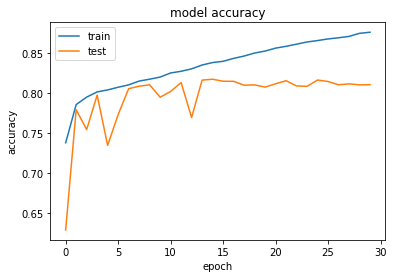

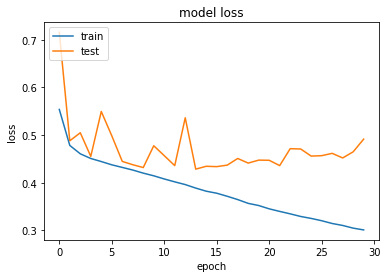

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 63s 785us/sample - loss: 0.5806 - acc: 0.7171 - val_loss: 0.4986 - val_acc: 0.7776
Epoch 2/30
80000/80000 [==============================] - 28s 349us/sample - loss: 0.4911 - acc: 0.7765 - val_loss: 0.5488 - val_acc: 0.7314
Epoch 3/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4721 - acc: 0.7890 - val_loss: 0.4744 - val_acc: 0.7891
Epoch 4/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4632 - acc: 0.7929 - val_loss: 0.4557 - val_acc: 0.8015
Epoch 5/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4539 - acc: 0.7992 - val_loss: 0.4498 - val_acc: 0.8026
Epoch 6/30
80000/80000 [==============================] - 28s 348us/sample - loss: 0.4484 - acc: 0.8015 - val_loss: 0.4858 - val_acc: 0.7731
Epoch 7/30
80000/80000 [==============================] - 28s 349us/sample - loss: 0

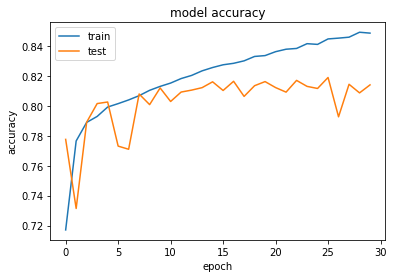

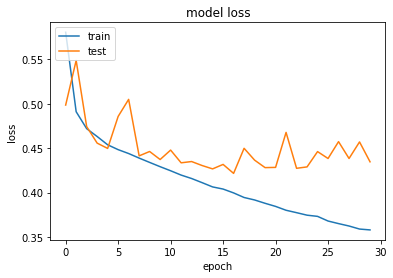

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 62s 780us/sample - loss: 0.5626 - acc: 0.7350 - val_loss: 0.8546 - val_acc: 0.5839
Epoch 2/30
80000/80000 [==============================] - 27s 343us/sample - loss: 0.4716 - acc: 0.7887 - val_loss: 0.5027 - val_acc: 0.7592
Epoch 3/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0.4571 - acc: 0.7975 - val_loss: 0.4583 - val_acc: 0.7957
Epoch 4/30
80000/80000 [==============================] - 27s 343us/sample - loss: 0.4488 - acc: 0.8016 - val_loss: 0.4677 - val_acc: 0.7904
Epoch 5/30
80000/80000 [==============================] - 27s 342us/sample - loss: 0.4407 - acc: 0.8059 - val_loss: 0.4449 - val_acc: 0.8045
Epoch 6/30
80000/80000 [==============================] - 27s 342us/sample - loss: 0.4332 - acc: 0.8118 - val_loss: 0.4585 - val_acc: 0.7987
Epoch 7/30
80000/80000 [==============================] - 27s 343us/sample - loss: 0

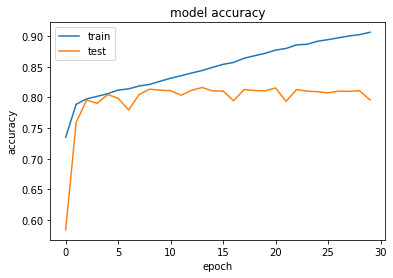

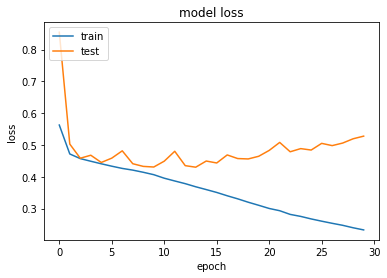

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 64s 806us/sample - loss: 0.5691 - acc: 0.7261 - val_loss: 0.6116 - val_acc: 0.7114
Epoch 2/30
80000/80000 [==============================] - 28s 356us/sample - loss: 0.4823 - acc: 0.7837 - val_loss: 0.4667 - val_acc: 0.7988
Epoch 3/30
80000/80000 [==============================] - 29s 356us/sample - loss: 0.4646 - acc: 0.7934 - val_loss: 0.4820 - val_acc: 0.7872
Epoch 4/30
80000/80000 [==============================] - 28s 356us/sample - loss: 0.4559 - acc: 0.7978 - val_loss: 0.4582 - val_acc: 0.7970
Epoch 5/30
80000/80000 [==============================] - 28s 356us/sample - loss: 0.4503 - acc: 0.8026 - val_loss: 0.4493 - val_acc: 0.8042
Epoch 6/30
80000/80000 [==============================] - 28s 356us/sample - loss: 0.4441 - acc: 0.8046 - val_loss: 0.4584 - val_acc: 0.8039
Epoch 7/30
80000/80000 [==============================] - 28s 356us/sample - loss: 0

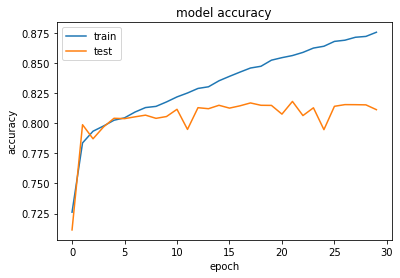

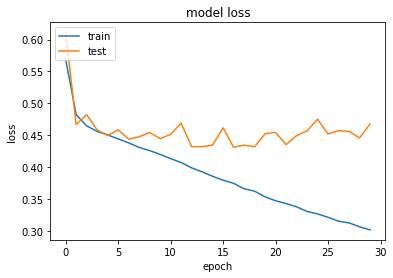

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 65s 816us/sample - loss: 0.5618 - acc: 0.7368 - val_loss: 0.5121 - val_acc: 0.7564
Epoch 2/30
80000/80000 [==============================] - 29s 362us/sample - loss: 0.4723 - acc: 0.7892 - val_loss: 0.4747 - val_acc: 0.7847
Epoch 3/30
80000/80000 [==============================] - 29s 361us/sample - loss: 0.4555 - acc: 0.7975 - val_loss: 0.5010 - val_acc: 0.7592
Epoch 4/30
80000/80000 [==============================] - 29s 362us/sample - loss: 0.4453 - acc: 0.8033 - val_loss: 0.4756 - val_acc: 0.7837
Epoch 5/30
80000/80000 [==============================] - 29s 362us/sample - loss: 0.4381 - acc: 0.8079 - val_loss: 0.5236 - val_acc: 0.7718
Epoch 6/30
80000/80000 [==============================] - 29s 362us/sample - loss: 0.4305 - acc: 0.8117 - val_loss: 0.4617 - val_acc: 0.7935
Epoch 7/30
80000/80000 [==============================] - 29s 362us/sample - loss: 0

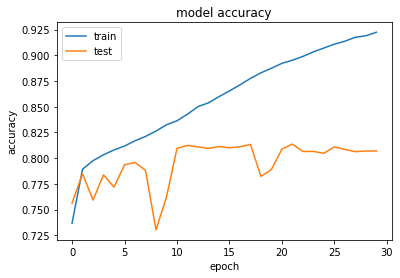

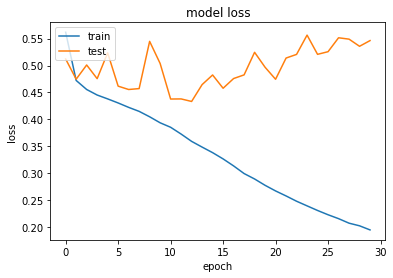

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 67s 837us/sample - loss: 0.5642 - acc: 0.7284 - val_loss: 0.6077 - val_acc: 0.7299
Epoch 2/30
80000/80000 [==============================] - 30s 375us/sample - loss: 0.4794 - acc: 0.7852 - val_loss: 0.5533 - val_acc: 0.7493
Epoch 3/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0.4627 - acc: 0.7938 - val_loss: 0.4629 - val_acc: 0.7926
Epoch 4/30
80000/80000 [==============================] - 30s 375us/sample - loss: 0.4542 - acc: 0.7982 - val_loss: 0.4802 - val_acc: 0.7804
Epoch 5/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0.4467 - acc: 0.8026 - val_loss: 0.4472 - val_acc: 0.8024
Epoch 6/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0.4395 - acc: 0.8080 - val_loss: 0.4537 - val_acc: 0.8044
Epoch 7/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0

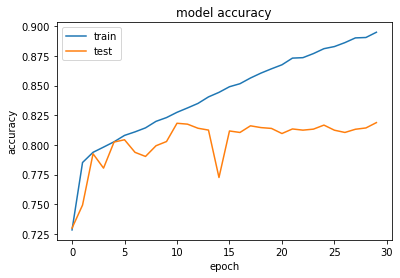

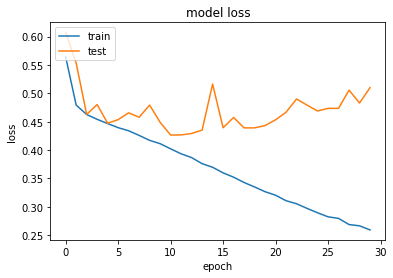

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 73s 917us/sample - loss: 0.5340 - acc: 0.7504 - val_loss: 0.5065 - val_acc: 0.7642
Epoch 2/30
80000/80000 [==============================] - 36s 453us/sample - loss: 0.4640 - acc: 0.7921 - val_loss: 0.4635 - val_acc: 0.7940
Epoch 3/30
80000/80000 [==============================] - 36s 453us/sample - loss: 0.4516 - acc: 0.7997 - val_loss: 0.4718 - val_acc: 0.7915
Epoch 4/30
80000/80000 [==============================] - 36s 454us/sample - loss: 0.4416 - acc: 0.8062 - val_loss: 0.5311 - val_acc: 0.7556
Epoch 5/30
80000/80000 [==============================] - 36s 452us/sample - loss: 0.4330 - acc: 0.8102 - val_loss: 0.4441 - val_acc: 0.8044
Epoch 6/30
80000/80000 [==============================] - 36s 451us/sample - loss: 0.4245 - acc: 0.8156 - val_loss: 0.4423 - val_acc: 0.8063
Epoch 7/30
80000/80000 [==============================] - 36s 452us/sample - loss: 0

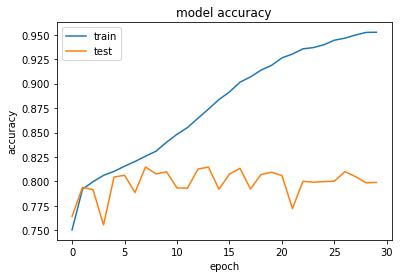

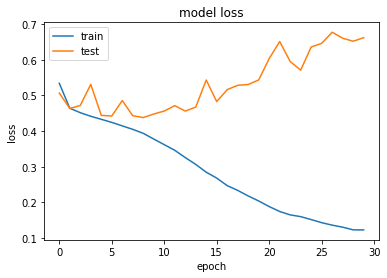

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 76s 953us/sample - loss: 0.5600 - acc: 0.7330 - val_loss: 0.5746 - val_acc: 0.7275
Epoch 2/30
80000/80000 [==============================] - 38s 475us/sample - loss: 0.4720 - acc: 0.7885 - val_loss: 0.6256 - val_acc: 0.7358
Epoch 3/30
80000/80000 [==============================] - 38s 474us/sample - loss: 0.4567 - acc: 0.7975 - val_loss: 0.7375 - val_acc: 0.6446
Epoch 4/30
80000/80000 [==============================] - 38s 474us/sample - loss: 0.4474 - acc: 0.8029 - val_loss: 0.7652 - val_acc: 0.6052
Epoch 5/30
80000/80000 [==============================] - 38s 475us/sample - loss: 0.4400 - acc: 0.8067 - val_loss: 0.4545 - val_acc: 0.7986
Epoch 6/30
80000/80000 [==============================] - 38s 473us/sample - loss: 0.4317 - acc: 0.8122 - val_loss: 0.4514 - val_acc: 0.8052
Epoch 7/30
80000/80000 [==============================] - 38s 474us/sample - loss: 0

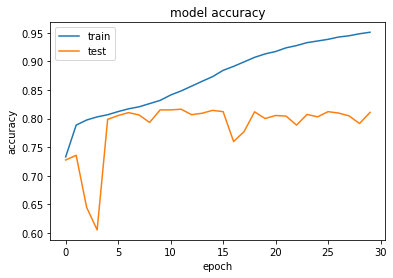

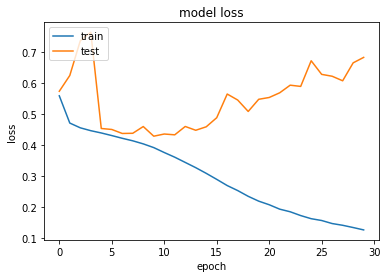

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 63s 788us/sample - loss: 0.5494 - acc: 0.7363 - val_loss: 0.4945 - val_acc: 0.7736
Epoch 2/30
80000/80000 [==============================] - 25s 315us/sample - loss: 0.4767 - acc: 0.7849 - val_loss: 0.5512 - val_acc: 0.7482
Epoch 3/30
80000/80000 [==============================] - 25s 315us/sample - loss: 0.4616 - acc: 0.7952 - val_loss: 0.6714 - val_acc: 0.6463
Epoch 4/30
80000/80000 [==============================] - 25s 315us/sample - loss: 0.4494 - acc: 0.8016 - val_loss: 0.4960 - val_acc: 0.7893
Epoch 5/30
80000/80000 [==============================] - 25s 315us/sample - loss: 0.4422 - acc: 0.8059 - val_loss: 0.5363 - val_acc: 0.7269
Epoch 6/30
80000/80000 [==============================] - 25s 316us/sample - loss: 0.4341 - acc: 0.8111 - val_loss: 0.4489 - val_acc: 0.8017
Epoch 7/30
80000/80000 [==============================] - 25s 315us/sample - loss: 0

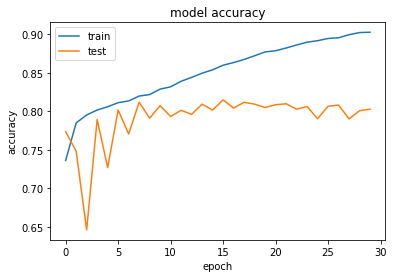

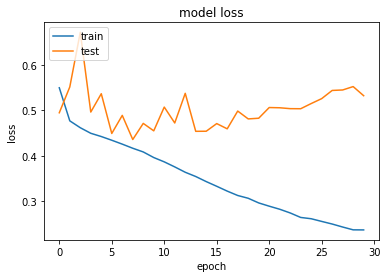

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 66s 829us/sample - loss: 0.5558 - acc: 0.7310 - val_loss: 0.5068 - val_acc: 0.7643
Epoch 2/30
80000/80000 [==============================] - 26s 327us/sample - loss: 0.4773 - acc: 0.7855 - val_loss: 0.6751 - val_acc: 0.6181
Epoch 3/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.4595 - acc: 0.7963 - val_loss: 0.4536 - val_acc: 0.8001
Epoch 4/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.4454 - acc: 0.8043 - val_loss: 0.4683 - val_acc: 0.7883
Epoch 5/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.4381 - acc: 0.8083 - val_loss: 0.4715 - val_acc: 0.7850
Epoch 6/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.4288 - acc: 0.8135 - val_loss: 0.4613 - val_acc: 0.7991
Epoch 7/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0

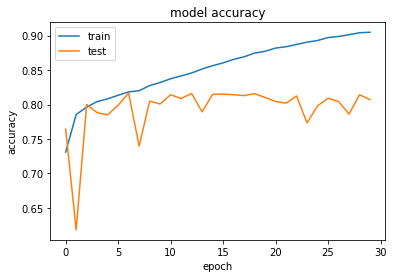

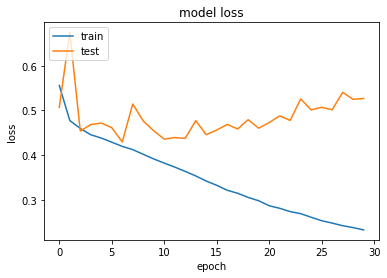

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 64s 805us/sample - loss: 0.5382 - acc: 0.7453 - val_loss: 0.4865 - val_acc: 0.7796
Epoch 2/30
80000/80000 [==============================] - 26s 331us/sample - loss: 0.4729 - acc: 0.7874 - val_loss: 0.4963 - val_acc: 0.7734
Epoch 3/30
80000/80000 [==============================] - 26s 331us/sample - loss: 0.4551 - acc: 0.7982 - val_loss: 0.4649 - val_acc: 0.7987
Epoch 4/30
80000/80000 [==============================] - 27s 331us/sample - loss: 0.4454 - acc: 0.8043 - val_loss: 0.4527 - val_acc: 0.8041
Epoch 5/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0.4354 - acc: 0.8079 - val_loss: 0.4461 - val_acc: 0.8045
Epoch 6/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0.4228 - acc: 0.8149 - val_loss: 0.4923 - val_acc: 0.8040
Epoch 7/30
80000/80000 [==============================] - 27s 332us/sample - loss: 0

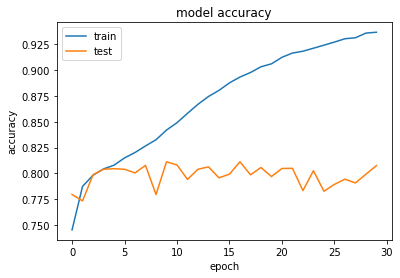

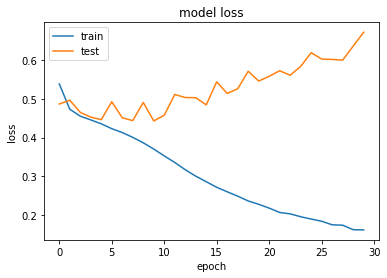

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 65s 818us/sample - loss: 0.5578 - acc: 0.7349 - val_loss: 0.7234 - val_acc: 0.6849
Epoch 2/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.4755 - acc: 0.7867 - val_loss: 0.4696 - val_acc: 0.7921
Epoch 3/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.4559 - acc: 0.7972 - val_loss: 0.4555 - val_acc: 0.7969
Epoch 4/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.4439 - acc: 0.8044 - val_loss: 0.4460 - val_acc: 0.8062
Epoch 5/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.4340 - acc: 0.8098 - val_loss: 0.4927 - val_acc: 0.7602
Epoch 6/30
80000/80000 [==============================] - 27s 340us/sample - loss: 0.4223 - acc: 0.8162 - val_loss: 0.4427 - val_acc: 0.8048
Epoch 7/30
80000/80000 [==============================] - 27s 339us/sample - loss: 0

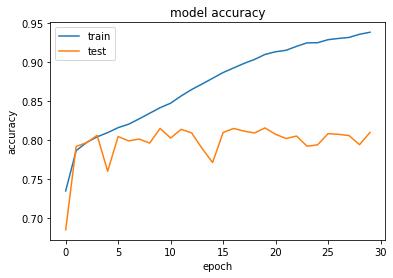

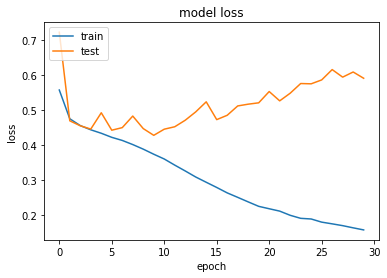

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 66s 825us/sample - loss: 0.5382 - acc: 0.7432 - val_loss: 0.8783 - val_acc: 0.6852
Epoch 2/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.4707 - acc: 0.7894 - val_loss: 0.4549 - val_acc: 0.7998
Epoch 3/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.4555 - acc: 0.7983 - val_loss: 0.4507 - val_acc: 0.8041
Epoch 4/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.4443 - acc: 0.8049 - val_loss: 0.4501 - val_acc: 0.8041
Epoch 5/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0.4309 - acc: 0.8110 - val_loss: 0.4643 - val_acc: 0.8037
Epoch 6/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.4214 - acc: 0.8181 - val_loss: 0.4377 - val_acc: 0.8116
Epoch 7/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0

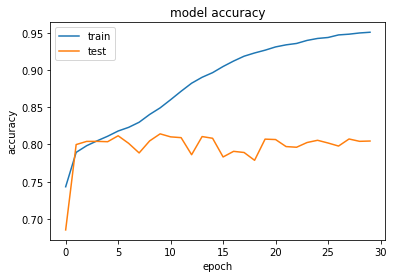

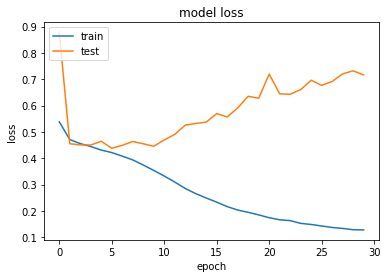

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 67s 837us/sample - loss: 0.5470 - acc: 0.7409 - val_loss: 0.4696 - val_acc: 0.7961
Epoch 2/30
80000/80000 [==============================] - 28s 353us/sample - loss: 0.4696 - acc: 0.7903 - val_loss: 0.5174 - val_acc: 0.7570
Epoch 3/30
80000/80000 [==============================] - 28s 355us/sample - loss: 0.4518 - acc: 0.8003 - val_loss: 0.4465 - val_acc: 0.8051
Epoch 4/30
80000/80000 [==============================] - 28s 354us/sample - loss: 0.4377 - acc: 0.8091 - val_loss: 0.4477 - val_acc: 0.8069
Epoch 5/30
80000/80000 [==============================] - 28s 354us/sample - loss: 0.4273 - acc: 0.8127 - val_loss: 0.4461 - val_acc: 0.8066
Epoch 6/30
80000/80000 [==============================] - 28s 354us/sample - loss: 0.4162 - acc: 0.8191 - val_loss: 0.4677 - val_acc: 0.7824
Epoch 7/30
80000/80000 [==============================] - 28s 354us/sample - loss: 0

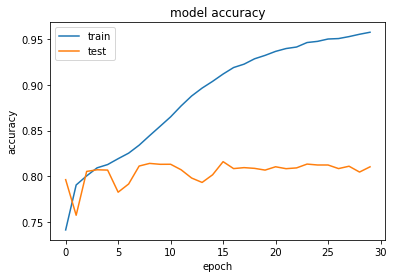

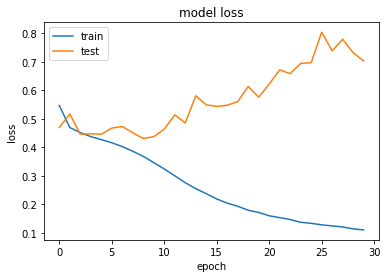

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 74s 922us/sample - loss: 0.5617 - acc: 0.7348 - val_loss: 0.5745 - val_acc: 0.7265
Epoch 2/30
80000/80000 [==============================] - 34s 429us/sample - loss: 0.4707 - acc: 0.7894 - val_loss: 0.4656 - val_acc: 0.7903
Epoch 3/30
80000/80000 [==============================] - 34s 430us/sample - loss: 0.4530 - acc: 0.7998 - val_loss: 0.4510 - val_acc: 0.8038
Epoch 4/30
80000/80000 [==============================] - 34s 429us/sample - loss: 0.4397 - acc: 0.8080 - val_loss: 0.4430 - val_acc: 0.8094
Epoch 5/30
80000/80000 [==============================] - 34s 429us/sample - loss: 0.4280 - acc: 0.8124 - val_loss: 0.6066 - val_acc: 0.6899
Epoch 6/30
80000/80000 [==============================] - 34s 430us/sample - loss: 0.4127 - acc: 0.8210 - val_loss: 0.7558 - val_acc: 0.6282
Epoch 7/30
80000/80000 [==============================] - 34s 431us/sample - loss: 0

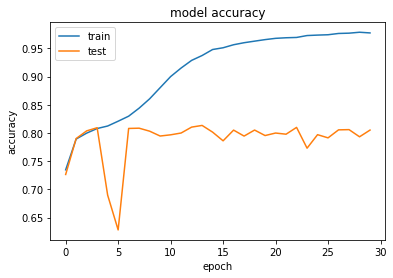

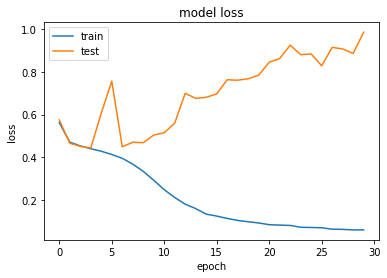

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 74s 930us/sample - loss: 0.5303 - acc: 0.7508 - val_loss: 0.5144 - val_acc: 0.7715
Epoch 2/30
80000/80000 [==============================] - 35s 441us/sample - loss: 0.4660 - acc: 0.7927 - val_loss: 0.5747 - val_acc: 0.6760
Epoch 3/30
80000/80000 [==============================] - 35s 438us/sample - loss: 0.4485 - acc: 0.8023 - val_loss: 0.6774 - val_acc: 0.6146
Epoch 4/30
80000/80000 [==============================] - 35s 442us/sample - loss: 0.4357 - acc: 0.8090 - val_loss: 0.4616 - val_acc: 0.7906
Epoch 5/30
80000/80000 [==============================] - 35s 438us/sample - loss: 0.4224 - acc: 0.8162 - val_loss: 0.4497 - val_acc: 0.8044
Epoch 6/30
80000/80000 [==============================] - 35s 440us/sample - loss: 0.4095 - acc: 0.8240 - val_loss: 0.4269 - val_acc: 0.8176
Epoch 7/30
80000/80000 [==============================] - 35s 440us/sample - loss: 0

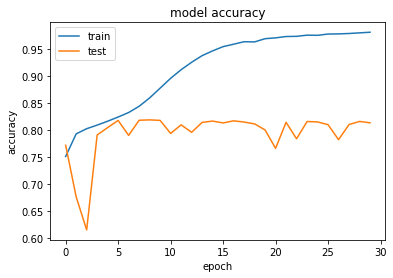

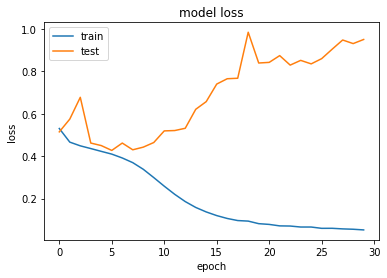

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 68s 845us/sample - loss: 0.5495 - acc: 0.7390 - val_loss: 0.5844 - val_acc: 0.7212
Epoch 2/30
80000/80000 [==============================] - 27s 337us/sample - loss: 0.4700 - acc: 0.7891 - val_loss: 0.4716 - val_acc: 0.7891
Epoch 3/30
80000/80000 [==============================] - 27s 335us/sample - loss: 0.4558 - acc: 0.7979 - val_loss: 0.4487 - val_acc: 0.8054
Epoch 4/30
80000/80000 [==============================] - 27s 336us/sample - loss: 0.4435 - acc: 0.8043 - val_loss: 0.4685 - val_acc: 0.7846
Epoch 5/30
80000/80000 [==============================] - 27s 335us/sample - loss: 0.4362 - acc: 0.8085 - val_loss: 0.4727 - val_acc: 0.7963
Epoch 6/30
80000/80000 [==============================] - 27s 336us/sample - loss: 0.4254 - acc: 0.8150 - val_loss: 0.4806 - val_acc: 0.7757
Epoch 7/30
80000/80000 [==============================] - 27s 336us/sample - loss: 0

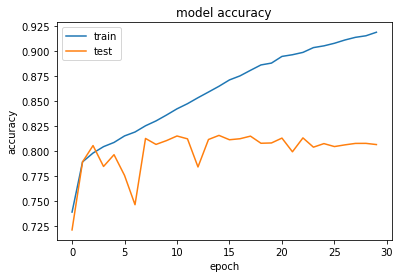

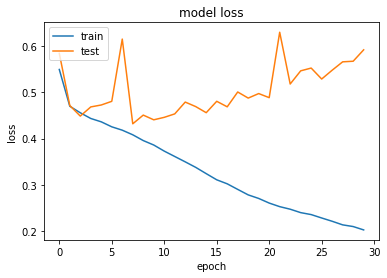

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 69s 862us/sample - loss: 0.5527 - acc: 0.7320 - val_loss: 0.5358 - val_acc: 0.7430
Epoch 2/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0.4821 - acc: 0.7818 - val_loss: 0.6689 - val_acc: 0.6586
Epoch 3/30
80000/80000 [==============================] - 28s 347us/sample - loss: 0.4609 - acc: 0.7947 - val_loss: 0.5410 - val_acc: 0.7631
Epoch 4/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0.4482 - acc: 0.8017 - val_loss: 0.4520 - val_acc: 0.8012
Epoch 5/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0.4393 - acc: 0.8077 - val_loss: 0.4365 - val_acc: 0.8097
Epoch 6/30
80000/80000 [==============================] - 28s 346us/sample - loss: 0.4301 - acc: 0.8125 - val_loss: 0.4444 - val_acc: 0.8087
Epoch 7/30
80000/80000 [==============================] - 28s 345us/sample - loss: 0

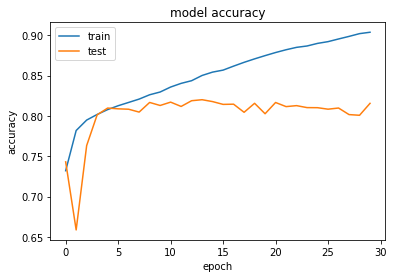

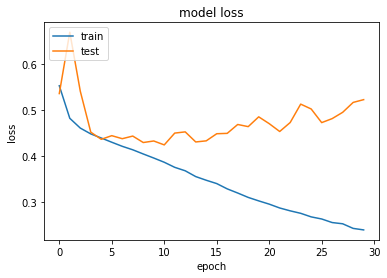

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 71s 893us/sample - loss: 0.5380 - acc: 0.7452 - val_loss: 0.5498 - val_acc: 0.7156
Epoch 2/30
80000/80000 [==============================] - 28s 351us/sample - loss: 0.4661 - acc: 0.7917 - val_loss: 0.6713 - val_acc: 0.6941
Epoch 3/30
80000/80000 [==============================] - 28s 351us/sample - loss: 0.4484 - acc: 0.8018 - val_loss: 0.4794 - val_acc: 0.7867
Epoch 4/30
80000/80000 [==============================] - 28s 352us/sample - loss: 0.4376 - acc: 0.8076 - val_loss: 0.5161 - val_acc: 0.7829
Epoch 5/30
80000/80000 [==============================] - 28s 351us/sample - loss: 0.4280 - acc: 0.8130 - val_loss: 0.4724 - val_acc: 0.7987
Epoch 6/30
80000/80000 [==============================] - 28s 352us/sample - loss: 0.4168 - acc: 0.8184 - val_loss: 0.4983 - val_acc: 0.7844
Epoch 7/30
80000/80000 [==============================] - 28s 351us/sample - loss: 0

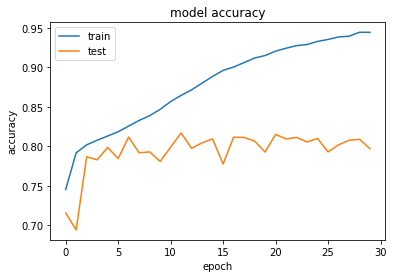

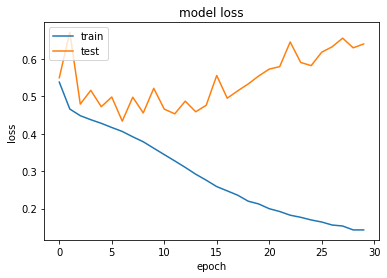

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 70s 881us/sample - loss: 0.5623 - acc: 0.7300 - val_loss: 0.6227 - val_acc: 0.7208
Epoch 2/30
80000/80000 [==============================] - 29s 357us/sample - loss: 0.4804 - acc: 0.7830 - val_loss: 0.5237 - val_acc: 0.7470
Epoch 3/30
80000/80000 [==============================] - 29s 357us/sample - loss: 0.4591 - acc: 0.7960 - val_loss: 0.5917 - val_acc: 0.7140
Epoch 4/30
80000/80000 [==============================] - 29s 357us/sample - loss: 0.4469 - acc: 0.8035 - val_loss: 0.4644 - val_acc: 0.7916
Epoch 5/30
80000/80000 [==============================] - 29s 357us/sample - loss: 0.4364 - acc: 0.8089 - val_loss: 0.4417 - val_acc: 0.8105
Epoch 6/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0.4261 - acc: 0.8138 - val_loss: 0.4689 - val_acc: 0.7793
Epoch 7/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0

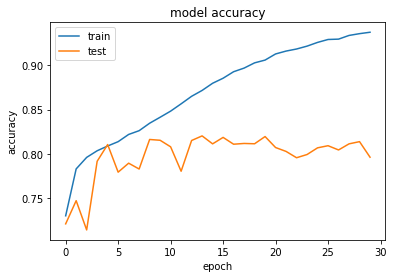

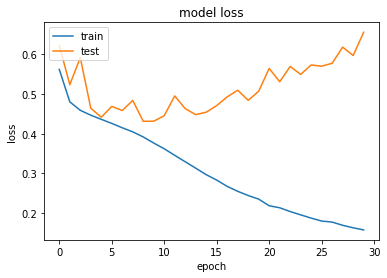

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 71s 893us/sample - loss: 0.5364 - acc: 0.7461 - val_loss: 0.4756 - val_acc: 0.7906
Epoch 2/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4658 - acc: 0.7922 - val_loss: 0.6071 - val_acc: 0.7167
Epoch 3/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4497 - acc: 0.8015 - val_loss: 0.4750 - val_acc: 0.7803
Epoch 4/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4370 - acc: 0.8083 - val_loss: 0.4364 - val_acc: 0.8099
Epoch 5/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4257 - acc: 0.8138 - val_loss: 0.4778 - val_acc: 0.7814
Epoch 6/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4154 - acc: 0.8189 - val_loss: 0.5049 - val_acc: 0.7595
Epoch 7/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0

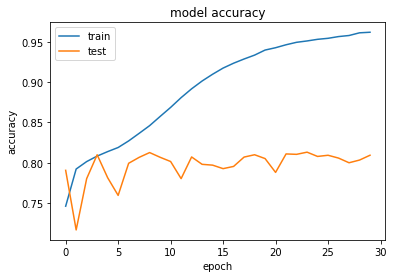

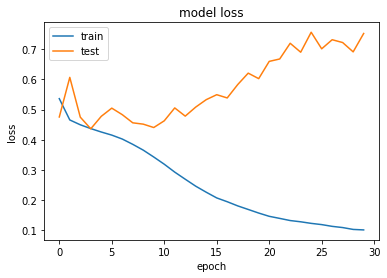

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 74s 926us/sample - loss: 0.5404 - acc: 0.7412 - val_loss: 0.5935 - val_acc: 0.7328
Epoch 2/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0.4711 - acc: 0.7883 - val_loss: 0.6039 - val_acc: 0.6583
Epoch 3/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0.4527 - acc: 0.8012 - val_loss: 0.4788 - val_acc: 0.7919
Epoch 4/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0.4405 - acc: 0.8065 - val_loss: 0.4769 - val_acc: 0.7888
Epoch 5/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0.4305 - acc: 0.8120 - val_loss: 0.5919 - val_acc: 0.7067
Epoch 6/30
80000/80000 [==============================] - 30s 375us/sample - loss: 0.4186 - acc: 0.8195 - val_loss: 0.6433 - val_acc: 0.6857
Epoch 7/30
80000/80000 [==============================] - 30s 376us/sample - loss: 0

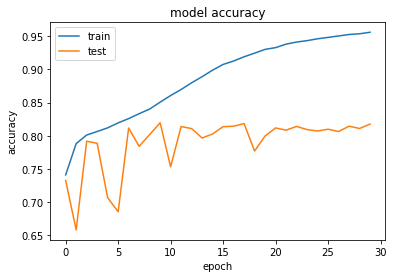

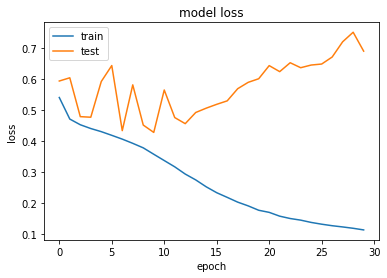

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 79s 993us/sample - loss: 0.5513 - acc: 0.7357 - val_loss: 0.6315 - val_acc: 0.6933
Epoch 2/30
80000/80000 [==============================] - 36s 451us/sample - loss: 0.4653 - acc: 0.7913 - val_loss: 0.5100 - val_acc: 0.7544
Epoch 3/30
80000/80000 [==============================] - 36s 452us/sample - loss: 0.4475 - acc: 0.8025 - val_loss: 0.4465 - val_acc: 0.8041
Epoch 4/30
80000/80000 [==============================] - 36s 450us/sample - loss: 0.4353 - acc: 0.8087 - val_loss: 0.6051 - val_acc: 0.7219
Epoch 5/30
80000/80000 [==============================] - 36s 451us/sample - loss: 0.4243 - acc: 0.8158 - val_loss: 0.4593 - val_acc: 0.8077
Epoch 6/30
80000/80000 [==============================] - 36s 451us/sample - loss: 0.4109 - acc: 0.8218 - val_loss: 0.5603 - val_acc: 0.7162
Epoch 7/30
80000/80000 [==============================] - 36s 450us/sample - loss: 0

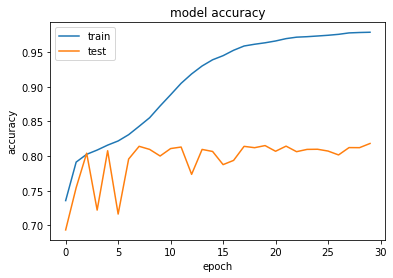

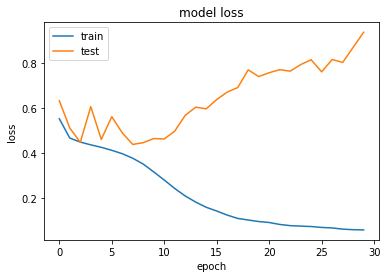

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.5510 - acc: 0.7385 - val_loss: 0.4838 - val_acc: 0.7813
Epoch 2/30
80000/80000 [==============================] - 38s 480us/sample - loss: 0.4744 - acc: 0.7874 - val_loss: 0.4643 - val_acc: 0.7937
Epoch 3/30
80000/80000 [==============================] - 39s 482us/sample - loss: 0.4506 - acc: 0.8002 - val_loss: 0.4954 - val_acc: 0.7648
Epoch 4/30
80000/80000 [==============================] - 38s 480us/sample - loss: 0.4387 - acc: 0.8065 - val_loss: 0.4662 - val_acc: 0.8035
Epoch 5/30
80000/80000 [==============================] - 38s 481us/sample - loss: 0.4285 - acc: 0.8135 - val_loss: 0.4683 - val_acc: 0.7987
Epoch 6/30
80000/80000 [==============================] - 38s 479us/sample - loss: 0.4160 - acc: 0.8210 - val_loss: 0.5037 - val_acc: 0.7789
Epoch 7/30
80000/80000 [==============================] - 38s 479us/sample - loss: 0.4

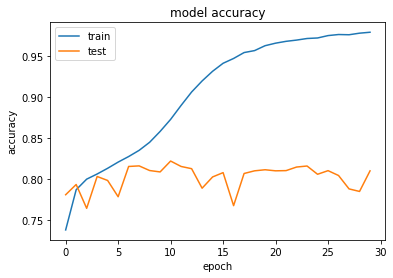

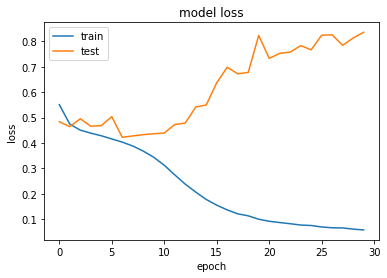

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 73s 914us/sample - loss: 0.5558 - acc: 0.7373 - val_loss: 0.5255 - val_acc: 0.7527
Epoch 2/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4780 - acc: 0.7856 - val_loss: 0.5211 - val_acc: 0.7688
Epoch 3/30
80000/80000 [==============================] - 29s 367us/sample - loss: 0.4596 - acc: 0.7962 - val_loss: 0.6197 - val_acc: 0.6879
Epoch 4/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4477 - acc: 0.8028 - val_loss: 0.5119 - val_acc: 0.7629
Epoch 5/30
80000/80000 [==============================] - 29s 368us/sample - loss: 0.4376 - acc: 0.8080 - val_loss: 0.5008 - val_acc: 0.7805
Epoch 6/30
80000/80000 [==============================] - 29s 366us/sample - loss: 0.4296 - acc: 0.8125 - val_loss: 0.4607 - val_acc: 0.7924
Epoch 7/30
80000/80000 [==============================] - 29s 367us/sample - loss: 0

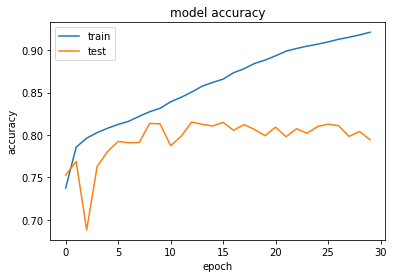

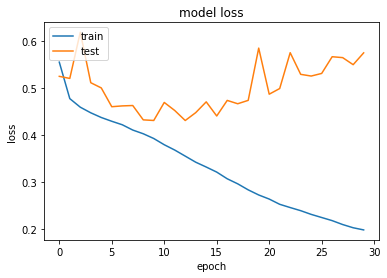

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 77s 958us/sample - loss: 0.5876 - acc: 0.7178 - val_loss: 0.4935 - val_acc: 0.7735
Epoch 2/30
80000/80000 [==============================] - 31s 388us/sample - loss: 0.4923 - acc: 0.7756 - val_loss: 0.7020 - val_acc: 0.6121
Epoch 3/30
80000/80000 [==============================] - 31s 387us/sample - loss: 0.4702 - acc: 0.7875 - val_loss: 0.5288 - val_acc: 0.7330
Epoch 4/30
80000/80000 [==============================] - 31s 388us/sample - loss: 0.4571 - acc: 0.7968 - val_loss: 0.5670 - val_acc: 0.7505
Epoch 5/30
80000/80000 [==============================] - 31s 387us/sample - loss: 0.4487 - acc: 0.8020 - val_loss: 0.4578 - val_acc: 0.7926
Epoch 6/30
80000/80000 [==============================] - 31s 388us/sample - loss: 0.4411 - acc: 0.8063 - val_loss: 0.4814 - val_acc: 0.7832
Epoch 7/30
80000/80000 [==============================] - 31s 393us/sample - loss: 0

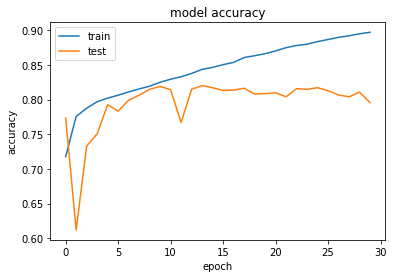

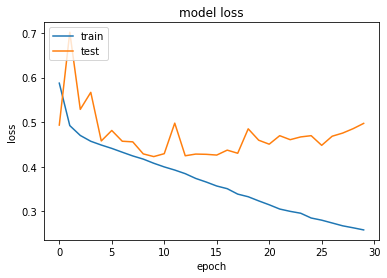

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 77s 964us/sample - loss: 0.5478 - acc: 0.7405 - val_loss: 0.4869 - val_acc: 0.7796
Epoch 2/30
80000/80000 [==============================] - 31s 392us/sample - loss: 0.4722 - acc: 0.7876 - val_loss: 0.5106 - val_acc: 0.7566
Epoch 3/30
80000/80000 [==============================] - 31s 392us/sample - loss: 0.4552 - acc: 0.7983 - val_loss: 0.4819 - val_acc: 0.7873
Epoch 4/30
80000/80000 [==============================] - 31s 393us/sample - loss: 0.4435 - acc: 0.8048 - val_loss: 0.4498 - val_acc: 0.7968
Epoch 5/30
80000/80000 [==============================] - 32s 397us/sample - loss: 0.4329 - acc: 0.8110 - val_loss: 0.4465 - val_acc: 0.8101
Epoch 6/30
80000/80000 [==============================] - 32s 396us/sample - loss: 0.4225 - acc: 0.8157 - val_loss: 0.4555 - val_acc: 0.8068
Epoch 7/30
80000/80000 [==============================] - 32s 398us/sample - loss: 0

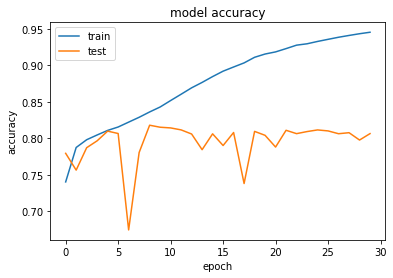

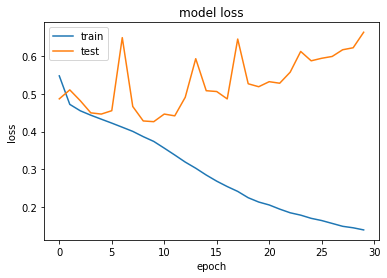

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 77s 967us/sample - loss: 0.5538 - acc: 0.7357 - val_loss: 0.6541 - val_acc: 0.6930
Epoch 2/30
80000/80000 [==============================] - 32s 402us/sample - loss: 0.4793 - acc: 0.7821 - val_loss: 1.2903 - val_acc: 0.4760
Epoch 3/30
80000/80000 [==============================] - 32s 402us/sample - loss: 0.4595 - acc: 0.7953 - val_loss: 0.5193 - val_acc: 0.7722
Epoch 4/30
80000/80000 [==============================] - 32s 402us/sample - loss: 0.4479 - acc: 0.8016 - val_loss: 0.4442 - val_acc: 0.8040
Epoch 5/30
80000/80000 [==============================] - 32s 402us/sample - loss: 0.4381 - acc: 0.8084 - val_loss: 0.4652 - val_acc: 0.7988
Epoch 6/30
80000/80000 [==============================] - 32s 402us/sample - loss: 0.4290 - acc: 0.8132 - val_loss: 0.4766 - val_acc: 0.8019
Epoch 7/30
80000/80000 [==============================] - 32s 401us/sample - loss: 0

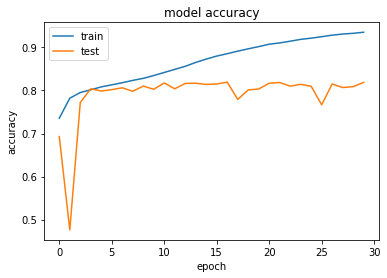

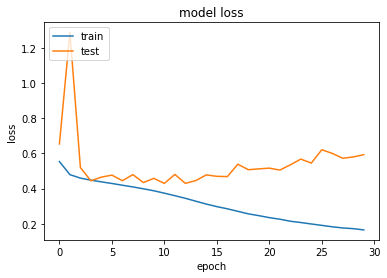

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 79s 987us/sample - loss: 0.5404 - acc: 0.7424 - val_loss: 0.7616 - val_acc: 0.6941
Epoch 2/30
80000/80000 [==============================] - 32s 400us/sample - loss: 0.4710 - acc: 0.7878 - val_loss: 0.5642 - val_acc: 0.7337
Epoch 3/30
80000/80000 [==============================] - 32s 399us/sample - loss: 0.4511 - acc: 0.8006 - val_loss: 0.5182 - val_acc: 0.7631
Epoch 4/30
80000/80000 [==============================] - 32s 401us/sample - loss: 0.4415 - acc: 0.8062 - val_loss: 0.7396 - val_acc: 0.6392
Epoch 5/30
80000/80000 [==============================] - 32s 399us/sample - loss: 0.4292 - acc: 0.8138 - val_loss: 0.4875 - val_acc: 0.7821
Epoch 6/30
80000/80000 [==============================] - 32s 400us/sample - loss: 0.4187 - acc: 0.8189 - val_loss: 0.5297 - val_acc: 0.7757
Epoch 7/30
80000/80000 [==============================] - 32s 400us/sample - loss: 0

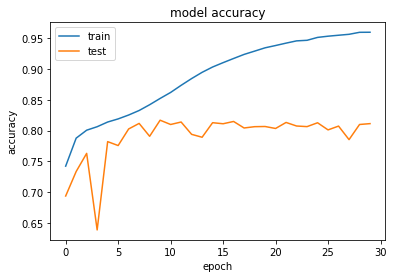

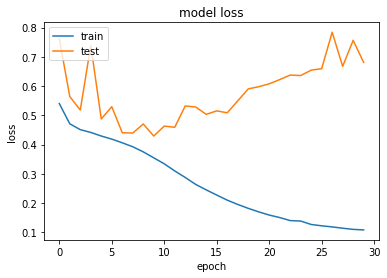

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 81s 1ms/sample - loss: 0.5449 - acc: 0.7405 - val_loss: 0.4842 - val_acc: 0.7828
Epoch 2/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.4737 - acc: 0.7882 - val_loss: 0.6550 - val_acc: 0.7228
Epoch 3/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.4535 - acc: 0.7999 - val_loss: 0.4647 - val_acc: 0.7946
Epoch 4/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.4446 - acc: 0.8051 - val_loss: 0.5511 - val_acc: 0.7340
Epoch 5/30
80000/80000 [==============================] - 34s 426us/sample - loss: 0.4311 - acc: 0.8121 - val_loss: 0.5833 - val_acc: 0.7565
Epoch 6/30
80000/80000 [==============================] - 35s 433us/sample - loss: 0.4201 - acc: 0.8183 - val_loss: 0.4761 - val_acc: 0.7752
Epoch 7/30
80000/80000 [==============================] - 37s 457us/sample - loss: 0.4

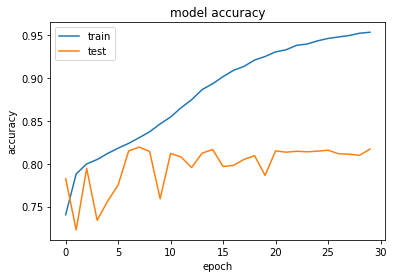

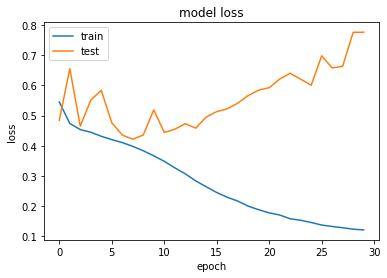

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 87s 1ms/sample - loss: 0.5479 - acc: 0.7373 - val_loss: 0.6664 - val_acc: 0.7072
Epoch 2/30
80000/80000 [==============================] - 38s 481us/sample - loss: 0.4733 - acc: 0.7858 - val_loss: 0.5641 - val_acc: 0.7601
Epoch 3/30
80000/80000 [==============================] - 38s 481us/sample - loss: 0.4518 - acc: 0.7999 - val_loss: 0.4600 - val_acc: 0.8025
Epoch 4/30
80000/80000 [==============================] - 38s 479us/sample - loss: 0.4399 - acc: 0.8068 - val_loss: 0.4613 - val_acc: 0.7956
Epoch 5/30
80000/80000 [==============================] - 38s 480us/sample - loss: 0.4300 - acc: 0.8121 - val_loss: 0.4855 - val_acc: 0.7812
Epoch 6/30
80000/80000 [==============================] - 38s 480us/sample - loss: 0.4178 - acc: 0.8202 - val_loss: 0.4379 - val_acc: 0.8134
Epoch 7/30
80000/80000 [==============================] - 38s 480us/sample - loss: 0.4

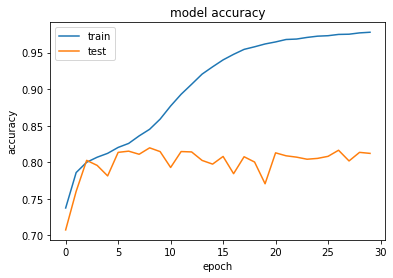

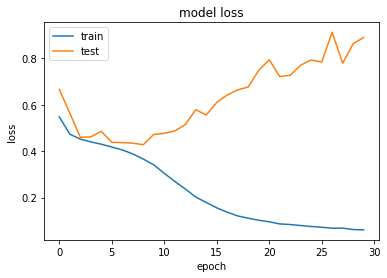

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 89s 1ms/sample - loss: 0.5671 - acc: 0.7331 - val_loss: 0.5428 - val_acc: 0.7492
Epoch 2/30
80000/80000 [==============================] - 41s 515us/sample - loss: 0.4814 - acc: 0.7840 - val_loss: 0.6075 - val_acc: 0.6862
Epoch 3/30
80000/80000 [==============================] - 41s 513us/sample - loss: 0.4576 - acc: 0.7977 - val_loss: 0.5361 - val_acc: 0.7565
Epoch 4/30
80000/80000 [==============================] - 41s 515us/sample - loss: 0.4434 - acc: 0.8045 - val_loss: 0.4582 - val_acc: 0.7946
Epoch 5/30
80000/80000 [==============================] - 41s 514us/sample - loss: 0.4318 - acc: 0.8113 - val_loss: 0.4551 - val_acc: 0.8031
Epoch 6/30
80000/80000 [==============================] - 41s 515us/sample - loss: 0.4212 - acc: 0.8174 - val_loss: 0.4812 - val_acc: 0.7983
Epoch 7/30
80000/80000 [==============================] - 41s 514us/sample - loss: 0.4

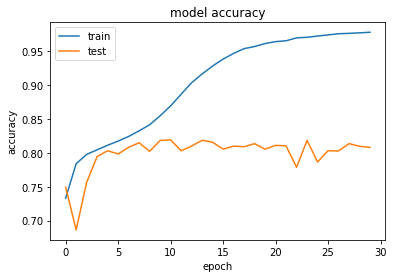

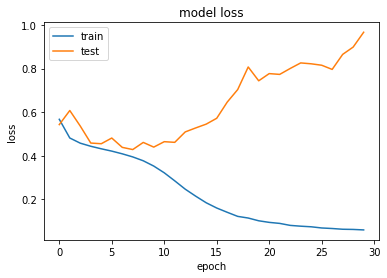

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 78s 980us/sample - loss: 0.5680 - acc: 0.7234 - val_loss: 0.5326 - val_acc: 0.7509
Epoch 2/30
80000/80000 [==============================] - 30s 374us/sample - loss: 0.4831 - acc: 0.7804 - val_loss: 0.5094 - val_acc: 0.7595
Epoch 3/30
80000/80000 [==============================] - 30s 374us/sample - loss: 0.4632 - acc: 0.7922 - val_loss: 0.4830 - val_acc: 0.7915
Epoch 4/30
80000/80000 [==============================] - 30s 374us/sample - loss: 0.4510 - acc: 0.8003 - val_loss: 0.4645 - val_acc: 0.7911
Epoch 5/30
80000/80000 [==============================] - 30s 375us/sample - loss: 0.4385 - acc: 0.8063 - val_loss: 0.4867 - val_acc: 0.7822
Epoch 6/30
80000/80000 [==============================] - 30s 374us/sample - loss: 0.4274 - acc: 0.8110 - val_loss: 0.4602 - val_acc: 0.7899
Epoch 7/30
80000/80000 [==============================] - 30s 374us/sample - loss: 0

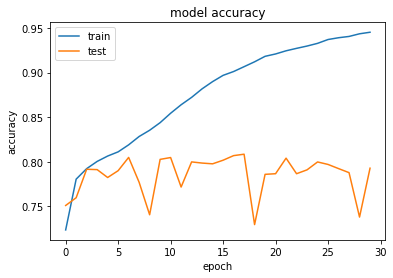

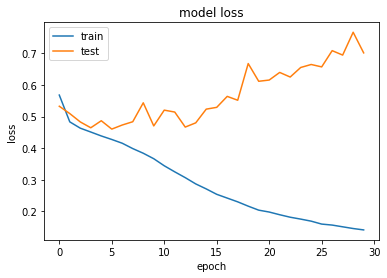

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 79s 991us/sample - loss: 0.5659 - acc: 0.7258 - val_loss: 1.2051 - val_acc: 0.5013
Epoch 2/30
80000/80000 [==============================] - 31s 391us/sample - loss: 0.4835 - acc: 0.7801 - val_loss: 0.6807 - val_acc: 0.6599
Epoch 3/30
80000/80000 [==============================] - 31s 391us/sample - loss: 0.4639 - acc: 0.7923 - val_loss: 0.4608 - val_acc: 0.7964
Epoch 4/30
80000/80000 [==============================] - 31s 393us/sample - loss: 0.4484 - acc: 0.8004 - val_loss: 0.4494 - val_acc: 0.8018
Epoch 5/30
80000/80000 [==============================] - 31s 391us/sample - loss: 0.4363 - acc: 0.8083 - val_loss: 0.4388 - val_acc: 0.8095
Epoch 6/30
80000/80000 [==============================] - 31s 391us/sample - loss: 0.4252 - acc: 0.8147 - val_loss: 0.4646 - val_acc: 0.7979
Epoch 7/30
80000/80000 [==============================] - 31s 391us/sample - loss: 0

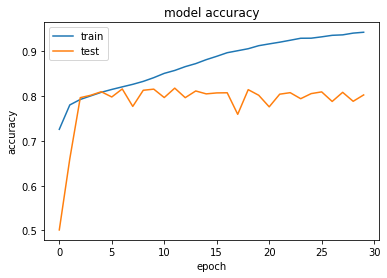

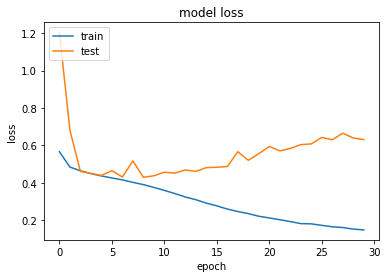

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 83s 1ms/sample - loss: 0.5645 - acc: 0.7264 - val_loss: 0.4981 - val_acc: 0.7699
Epoch 2/30
80000/80000 [==============================] - 32s 406us/sample - loss: 0.4913 - acc: 0.7741 - val_loss: 0.5198 - val_acc: 0.7456
Epoch 3/30
80000/80000 [==============================] - 32s 406us/sample - loss: 0.4653 - acc: 0.7919 - val_loss: 0.5652 - val_acc: 0.7550
Epoch 4/30
80000/80000 [==============================] - 32s 405us/sample - loss: 0.4519 - acc: 0.7996 - val_loss: 0.4613 - val_acc: 0.7976
Epoch 5/30
80000/80000 [==============================] - 32s 406us/sample - loss: 0.4392 - acc: 0.8056 - val_loss: 0.4630 - val_acc: 0.7891
Epoch 6/30
80000/80000 [==============================] - 32s 406us/sample - loss: 0.4279 - acc: 0.8131 - val_loss: 0.5541 - val_acc: 0.7654
Epoch 7/30
80000/80000 [==============================] - 32s 406us/sample - loss: 0.4

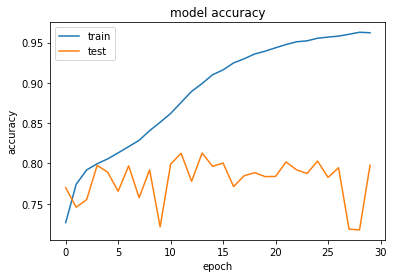

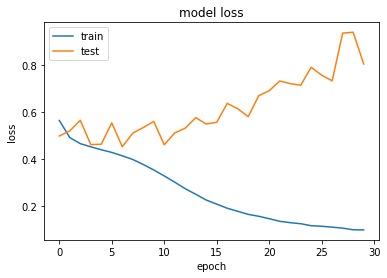

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 87s 1ms/sample - loss: 0.5654 - acc: 0.7278 - val_loss: 0.5402 - val_acc: 0.7391
Epoch 2/30
80000/80000 [==============================] - 35s 433us/sample - loss: 0.4820 - acc: 0.7802 - val_loss: 0.4965 - val_acc: 0.7746
Epoch 3/30
80000/80000 [==============================] - 35s 432us/sample - loss: 0.4584 - acc: 0.7947 - val_loss: 0.5333 - val_acc: 0.7592
Epoch 4/30
80000/80000 [==============================] - 35s 434us/sample - loss: 0.4422 - acc: 0.8052 - val_loss: 0.4669 - val_acc: 0.7984
Epoch 5/30
80000/80000 [==============================] - 35s 433us/sample - loss: 0.4316 - acc: 0.8118 - val_loss: 0.4500 - val_acc: 0.8105
Epoch 6/30
80000/80000 [==============================] - 35s 432us/sample - loss: 0.4190 - acc: 0.8176 - val_loss: 0.4376 - val_acc: 0.8076
Epoch 7/30
80000/80000 [==============================] - 35s 433us/sample - loss: 0.4

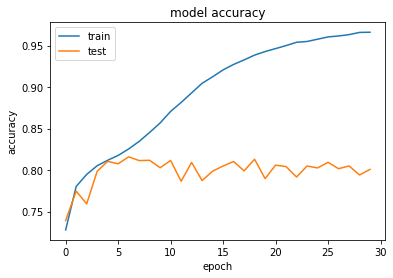

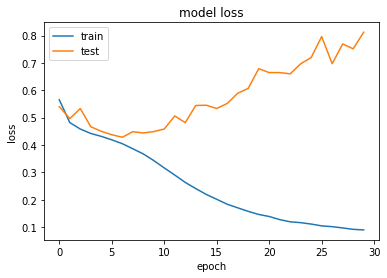

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 86s 1ms/sample - loss: 0.5575 - acc: 0.7330 - val_loss: 0.5182 - val_acc: 0.7544
Epoch 2/30
80000/80000 [==============================] - 37s 462us/sample - loss: 0.4813 - acc: 0.7826 - val_loss: 0.8938 - val_acc: 0.5648
Epoch 3/30
80000/80000 [==============================] - 37s 463us/sample - loss: 0.4588 - acc: 0.7946 - val_loss: 0.4660 - val_acc: 0.7896
Epoch 4/30
80000/80000 [==============================] - 37s 464us/sample - loss: 0.4455 - acc: 0.8033 - val_loss: 0.4550 - val_acc: 0.8049
Epoch 5/30
80000/80000 [==============================] - 37s 462us/sample - loss: 0.4312 - acc: 0.8124 - val_loss: 0.4410 - val_acc: 0.8100
Epoch 6/30
80000/80000 [==============================] - 37s 463us/sample - loss: 0.4180 - acc: 0.8177 - val_loss: 0.4397 - val_acc: 0.8094
Epoch 7/30
80000/80000 [==============================] - 37s 463us/sample - loss: 0.4

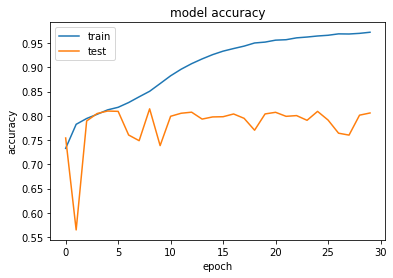

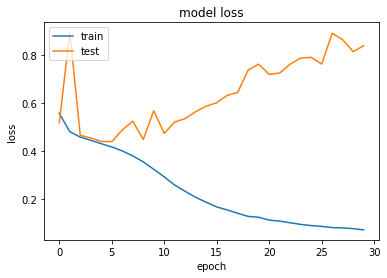

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 88s 1ms/sample - loss: 0.5726 - acc: 0.7262 - val_loss: 0.6021 - val_acc: 0.7319
Epoch 2/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4872 - acc: 0.7789 - val_loss: 0.6389 - val_acc: 0.7284
Epoch 3/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4599 - acc: 0.7951 - val_loss: 0.4950 - val_acc: 0.7656
Epoch 4/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4454 - acc: 0.8046 - val_loss: 0.4567 - val_acc: 0.7965
Epoch 5/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4329 - acc: 0.8105 - val_loss: 0.5024 - val_acc: 0.7752
Epoch 6/30
80000/80000 [==============================] - 39s 488us/sample - loss: 0.4207 - acc: 0.8174 - val_loss: 0.4607 - val_acc: 0.7998
Epoch 7/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4

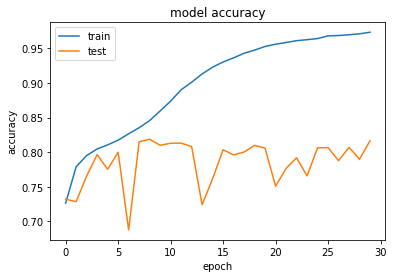

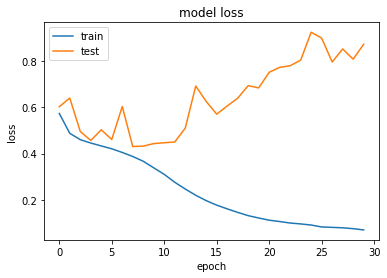

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 107s 1ms/sample - loss: 0.5614 - acc: 0.7284 - val_loss: 0.6576 - val_acc: 0.6507
Epoch 2/30
80000/80000 [==============================] - 56s 698us/sample - loss: 0.4899 - acc: 0.7765 - val_loss: 0.4740 - val_acc: 0.7873
Epoch 3/30
80000/80000 [==============================] - 56s 701us/sample - loss: 0.4631 - acc: 0.7933 - val_loss: 0.5226 - val_acc: 0.7413
Epoch 4/30
80000/80000 [==============================] - 56s 701us/sample - loss: 0.4478 - acc: 0.8025 - val_loss: 0.4807 - val_acc: 0.7804
Epoch 5/30
80000/80000 [==============================] - 56s 702us/sample - loss: 0.4302 - acc: 0.8121 - val_loss: 0.4703 - val_acc: 0.8009
Epoch 6/30
80000/80000 [==============================] - 56s 703us/sample - loss: 0.4156 - acc: 0.8191 - val_loss: 0.4516 - val_acc: 0.8077
Epoch 7/30
80000/80000 [==============================] - 56s 704us/sample - loss: 0.

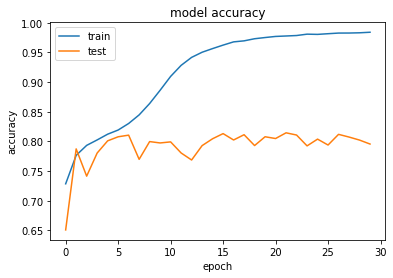

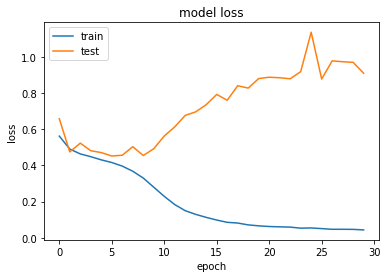

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 112s 1ms/sample - loss: 0.5620 - acc: 0.7285 - val_loss: 0.5039 - val_acc: 0.7691
Epoch 2/30
80000/80000 [==============================] - 62s 771us/sample - loss: 0.4807 - acc: 0.7818 - val_loss: 0.5169 - val_acc: 0.7748
Epoch 3/30
80000/80000 [==============================] - 62s 770us/sample - loss: 0.4576 - acc: 0.7959 - val_loss: 0.6858 - val_acc: 0.7124
Epoch 4/30
80000/80000 [==============================] - 62s 770us/sample - loss: 0.4388 - acc: 0.8067 - val_loss: 0.4461 - val_acc: 0.8044
Epoch 5/30
80000/80000 [==============================] - 62s 771us/sample - loss: 0.4229 - acc: 0.8163 - val_loss: 0.4421 - val_acc: 0.8070
Epoch 6/30
80000/80000 [==============================] - 62s 771us/sample - loss: 0.4064 - acc: 0.8248 - val_loss: 0.4383 - val_acc: 0.8118
Epoch 7/30
80000/80000 [==============================] - 62s 772us/sample - loss: 0.

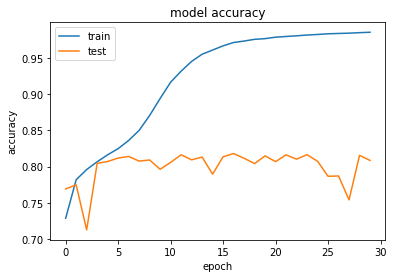

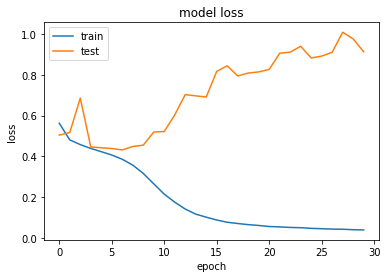

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 84s 1ms/sample - loss: 0.5559 - acc: 0.7322 - val_loss: 0.5251 - val_acc: 0.7557
Epoch 2/30
80000/80000 [==============================] - 32s 405us/sample - loss: 0.4812 - acc: 0.7827 - val_loss: 0.4884 - val_acc: 0.7805
Epoch 3/30
80000/80000 [==============================] - 32s 406us/sample - loss: 0.4621 - acc: 0.7938 - val_loss: 0.4900 - val_acc: 0.7904
Epoch 4/30
80000/80000 [==============================] - 32s 404us/sample - loss: 0.4468 - acc: 0.8028 - val_loss: 0.6699 - val_acc: 0.6566
Epoch 5/30
80000/80000 [==============================] - 32s 405us/sample - loss: 0.4370 - acc: 0.8088 - val_loss: 0.4529 - val_acc: 0.8006
Epoch 6/30
80000/80000 [==============================] - 32s 404us/sample - loss: 0.4249 - acc: 0.8158 - val_loss: 0.4478 - val_acc: 0.8026
Epoch 7/30
80000/80000 [==============================] - 32s 405us/sample - loss: 0.4

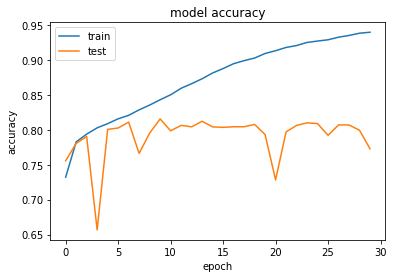

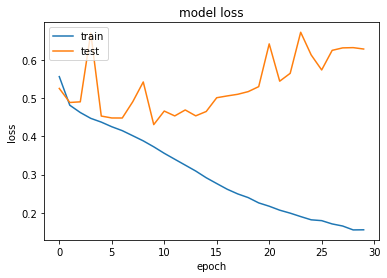

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 85s 1ms/sample - loss: 0.5682 - acc: 0.7250 - val_loss: 0.5261 - val_acc: 0.7521
Epoch 2/30
80000/80000 [==============================] - 34s 419us/sample - loss: 0.4915 - acc: 0.7744 - val_loss: 0.6876 - val_acc: 0.7214
Epoch 3/30
80000/80000 [==============================] - 34s 420us/sample - loss: 0.4698 - acc: 0.7886 - val_loss: 0.5547 - val_acc: 0.7110
Epoch 4/30
80000/80000 [==============================] - 34s 419us/sample - loss: 0.4548 - acc: 0.7970 - val_loss: 0.4545 - val_acc: 0.7990
Epoch 5/30
80000/80000 [==============================] - 34s 420us/sample - loss: 0.4418 - acc: 0.8051 - val_loss: 0.4515 - val_acc: 0.8022
Epoch 6/30
80000/80000 [==============================] - 34s 420us/sample - loss: 0.4314 - acc: 0.8115 - val_loss: 0.4459 - val_acc: 0.8000
Epoch 7/30
80000/80000 [==============================] - 34s 419us/sample - loss: 0.4

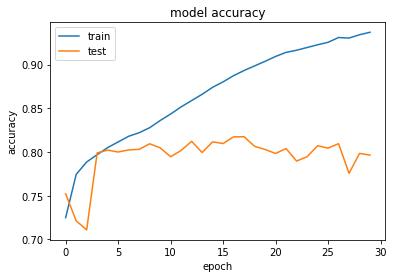

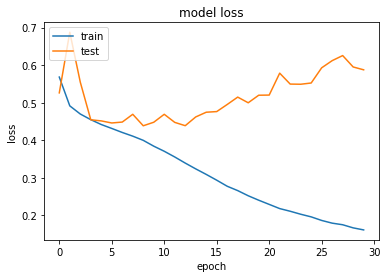

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 88s 1ms/sample - loss: 0.5639 - acc: 0.7264 - val_loss: 0.5108 - val_acc: 0.7605
Epoch 2/30
80000/80000 [==============================] - 35s 439us/sample - loss: 0.4822 - acc: 0.7812 - val_loss: 0.4705 - val_acc: 0.7926
Epoch 3/30
80000/80000 [==============================] - 35s 439us/sample - loss: 0.4587 - acc: 0.7965 - val_loss: 0.4697 - val_acc: 0.7969
Epoch 4/30
80000/80000 [==============================] - 35s 441us/sample - loss: 0.4439 - acc: 0.8052 - val_loss: 0.5904 - val_acc: 0.7031
Epoch 5/30
80000/80000 [==============================] - 35s 439us/sample - loss: 0.4320 - acc: 0.8109 - val_loss: 0.4484 - val_acc: 0.7980
Epoch 6/30
80000/80000 [==============================] - 35s 441us/sample - loss: 0.4193 - acc: 0.8188 - val_loss: 0.5002 - val_acc: 0.7653
Epoch 7/30
80000/80000 [==============================] - 35s 439us/sample - loss: 0.4

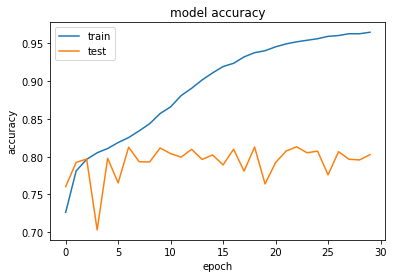

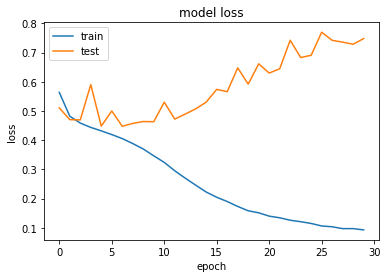

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 89s 1ms/sample - loss: 0.5643 - acc: 0.7289 - val_loss: 0.5237 - val_acc: 0.7418
Epoch 2/30
80000/80000 [==============================] - 37s 460us/sample - loss: 0.4856 - acc: 0.7782 - val_loss: 0.5333 - val_acc: 0.7456
Epoch 3/30
80000/80000 [==============================] - 37s 458us/sample - loss: 0.4617 - acc: 0.7929 - val_loss: 0.5664 - val_acc: 0.7299
Epoch 4/30
80000/80000 [==============================] - 37s 459us/sample - loss: 0.4459 - acc: 0.8029 - val_loss: 0.9048 - val_acc: 0.5973
Epoch 5/30
80000/80000 [==============================] - 37s 459us/sample - loss: 0.4340 - acc: 0.8111 - val_loss: 0.4361 - val_acc: 0.8077
Epoch 6/30
80000/80000 [==============================] - 37s 458us/sample - loss: 0.4226 - acc: 0.8172 - val_loss: 0.4536 - val_acc: 0.7997
Epoch 7/30
80000/80000 [==============================] - 37s 458us/sample - loss: 0.4

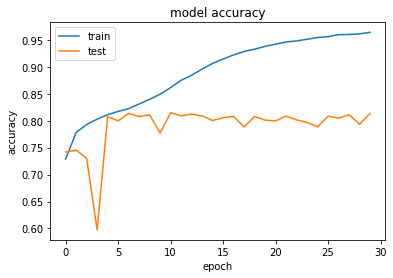

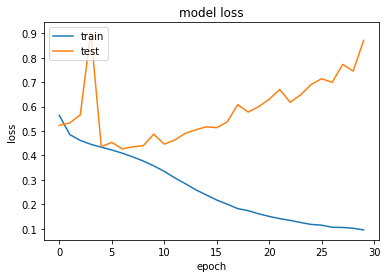

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 92s 1ms/sample - loss: 0.5446 - acc: 0.7372 - val_loss: 0.6617 - val_acc: 0.6910
Epoch 2/30
80000/80000 [==============================] - 39s 493us/sample - loss: 0.4795 - acc: 0.7820 - val_loss: 0.5752 - val_acc: 0.7417
Epoch 3/30
80000/80000 [==============================] - 40s 494us/sample - loss: 0.4565 - acc: 0.7967 - val_loss: 0.4570 - val_acc: 0.7984
Epoch 4/30
80000/80000 [==============================] - 40s 495us/sample - loss: 0.4403 - acc: 0.8063 - val_loss: 0.5359 - val_acc: 0.7405
Epoch 5/30
80000/80000 [==============================] - 40s 494us/sample - loss: 0.4285 - acc: 0.8127 - val_loss: 0.4373 - val_acc: 0.8113
Epoch 6/30
80000/80000 [==============================] - 40s 496us/sample - loss: 0.4146 - acc: 0.8212 - val_loss: 0.4551 - val_acc: 0.8044
Epoch 7/30
80000/80000 [==============================] - 40s 494us/sample - loss: 0.3

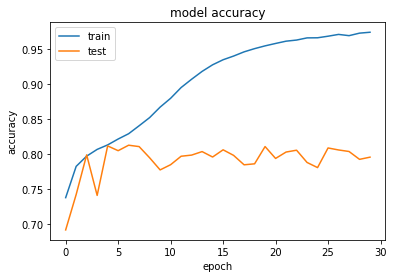

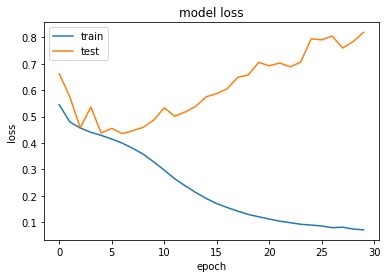

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 94s 1ms/sample - loss: 0.5569 - acc: 0.7321 - val_loss: 0.6685 - val_acc: 0.6962
Epoch 2/30
80000/80000 [==============================] - 41s 509us/sample - loss: 0.4796 - acc: 0.7836 - val_loss: 0.5840 - val_acc: 0.7104
Epoch 3/30
80000/80000 [==============================] - 41s 509us/sample - loss: 0.4586 - acc: 0.7949 - val_loss: 0.4680 - val_acc: 0.7852
Epoch 4/30
80000/80000 [==============================] - 41s 509us/sample - loss: 0.4440 - acc: 0.8046 - val_loss: 0.4523 - val_acc: 0.8007
Epoch 5/30
80000/80000 [==============================] - 41s 511us/sample - loss: 0.4303 - acc: 0.8117 - val_loss: 0.5003 - val_acc: 0.7779
Epoch 6/30
80000/80000 [==============================] - 41s 511us/sample - loss: 0.4189 - acc: 0.8184 - val_loss: 0.5304 - val_acc: 0.7742
Epoch 7/30
80000/80000 [==============================] - 41s 510us/sample - loss: 0.4

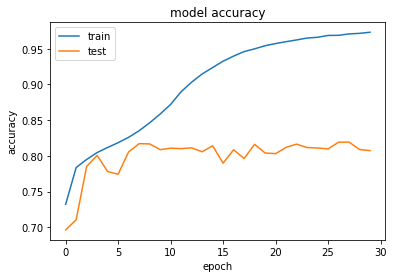

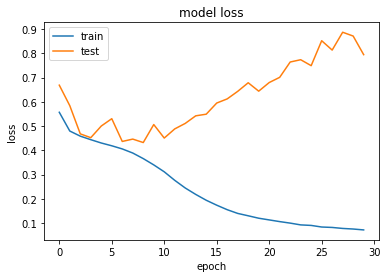

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 113s 1ms/sample - loss: 0.5710 - acc: 0.7255 - val_loss: 0.6093 - val_acc: 0.7064
Epoch 2/30
80000/80000 [==============================] - 59s 732us/sample - loss: 0.4819 - acc: 0.7826 - val_loss: 0.4873 - val_acc: 0.7819
Epoch 3/30
80000/80000 [==============================] - 59s 734us/sample - loss: 0.4558 - acc: 0.7971 - val_loss: 0.4902 - val_acc: 0.7882
Epoch 4/30
80000/80000 [==============================] - 59s 734us/sample - loss: 0.4400 - acc: 0.8068 - val_loss: 0.4719 - val_acc: 0.7891
Epoch 5/30
80000/80000 [==============================] - 59s 735us/sample - loss: 0.4259 - acc: 0.8159 - val_loss: 0.4635 - val_acc: 0.8013
Epoch 6/30
80000/80000 [==============================] - 59s 736us/sample - loss: 0.4108 - acc: 0.8234 - val_loss: 0.4557 - val_acc: 0.7911
Epoch 7/30
80000/80000 [==============================] - 59s 736us/sample - loss: 0.

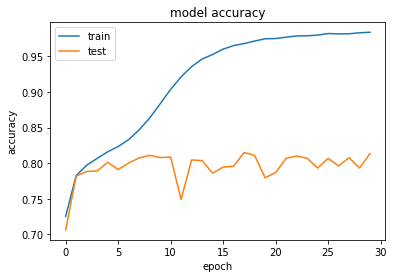

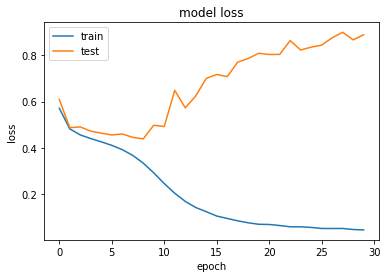

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 117s 1ms/sample - loss: 0.5685 - acc: 0.7266 - val_loss: 0.5058 - val_acc: 0.7679
Epoch 2/30
80000/80000 [==============================] - 62s 776us/sample - loss: 0.4869 - acc: 0.7776 - val_loss: 0.4925 - val_acc: 0.7764
Epoch 3/30
80000/80000 [==============================] - 62s 780us/sample - loss: 0.4605 - acc: 0.7944 - val_loss: 0.4588 - val_acc: 0.7952
Epoch 4/30
80000/80000 [==============================] - 62s 779us/sample - loss: 0.4456 - acc: 0.8037 - val_loss: 0.4556 - val_acc: 0.7984
Epoch 5/30
80000/80000 [==============================] - 62s 781us/sample - loss: 0.4330 - acc: 0.8115 - val_loss: 0.4459 - val_acc: 0.8054
Epoch 6/30
80000/80000 [==============================] - 62s 781us/sample - loss: 0.4186 - acc: 0.8180 - val_loss: 0.4497 - val_acc: 0.8080
Epoch 7/30
80000/80000 [==============================] - 62s 780us/sample - loss: 0.

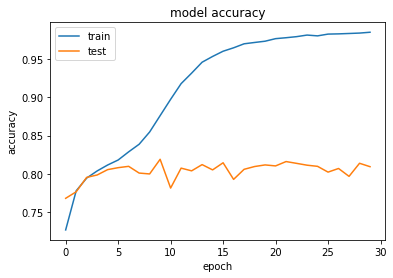

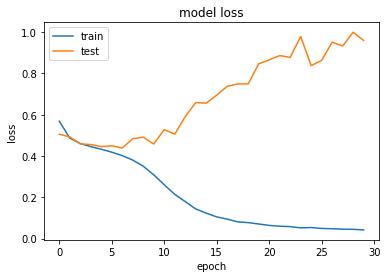

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 90s 1ms/sample - loss: 0.5668 - acc: 0.7244 - val_loss: 0.5369 - val_acc: 0.7534
Epoch 2/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.4839 - acc: 0.7803 - val_loss: 0.6835 - val_acc: 0.6504
Epoch 3/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.4600 - acc: 0.7954 - val_loss: 0.4799 - val_acc: 0.7789
Epoch 4/30
80000/80000 [==============================] - 34s 426us/sample - loss: 0.4488 - acc: 0.8024 - val_loss: 0.4521 - val_acc: 0.7947
Epoch 5/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.4368 - acc: 0.8095 - val_loss: 0.4325 - val_acc: 0.8113
Epoch 6/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.4268 - acc: 0.8146 - val_loss: 0.4457 - val_acc: 0.8019
Epoch 7/30
80000/80000 [==============================] - 34s 424us/sample - loss: 0.4

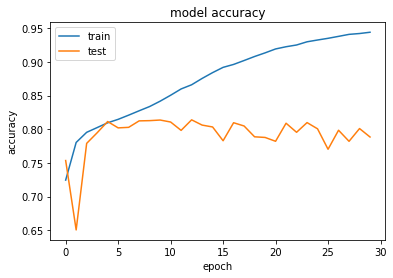

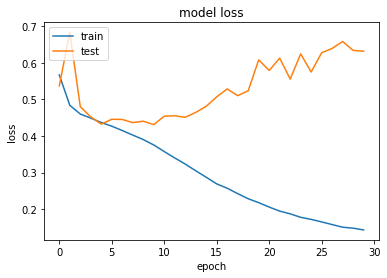

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 93s 1ms/sample - loss: 0.5759 - acc: 0.7202 - val_loss: 0.5138 - val_acc: 0.7597
Epoch 2/30
80000/80000 [==============================] - 35s 444us/sample - loss: 0.4977 - acc: 0.7718 - val_loss: 0.4820 - val_acc: 0.7845
Epoch 3/30
80000/80000 [==============================] - 36s 444us/sample - loss: 0.4732 - acc: 0.7878 - val_loss: 0.4792 - val_acc: 0.7850
Epoch 4/30
80000/80000 [==============================] - 36s 444us/sample - loss: 0.4583 - acc: 0.7961 - val_loss: 0.4863 - val_acc: 0.7838
Epoch 5/30
80000/80000 [==============================] - 35s 443us/sample - loss: 0.4461 - acc: 0.8032 - val_loss: 0.4867 - val_acc: 0.7735
Epoch 6/30
80000/80000 [==============================] - 36s 444us/sample - loss: 0.4364 - acc: 0.8080 - val_loss: 0.4414 - val_acc: 0.8046
Epoch 7/30
80000/80000 [==============================] - 36s 444us/sample - loss: 0.4

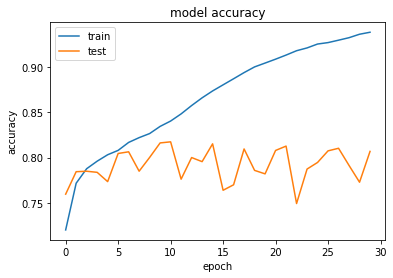

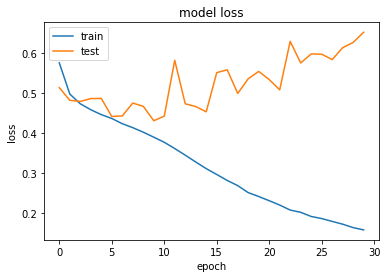

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 93s 1ms/sample - loss: 0.5717 - acc: 0.7235 - val_loss: 0.5377 - val_acc: 0.7400
Epoch 2/30
80000/80000 [==============================] - 38s 474us/sample - loss: 0.4877 - acc: 0.7776 - val_loss: 0.5047 - val_acc: 0.7603
Epoch 3/30
80000/80000 [==============================] - 38s 475us/sample - loss: 0.4629 - acc: 0.7925 - val_loss: 0.4643 - val_acc: 0.7973
Epoch 4/30
80000/80000 [==============================] - 38s 476us/sample - loss: 0.4481 - acc: 0.8018 - val_loss: 0.5058 - val_acc: 0.7776
Epoch 5/30
80000/80000 [==============================] - 38s 476us/sample - loss: 0.4365 - acc: 0.8093 - val_loss: 0.5321 - val_acc: 0.7531
Epoch 6/30
80000/80000 [==============================] - 38s 475us/sample - loss: 0.4236 - acc: 0.8152 - val_loss: 0.5324 - val_acc: 0.7765
Epoch 7/30
80000/80000 [==============================] - 38s 476us/sample - loss: 0.4

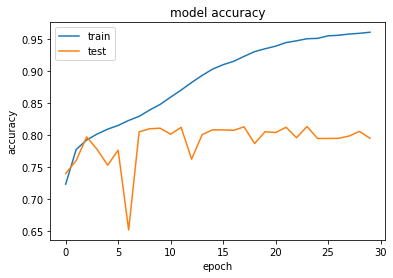

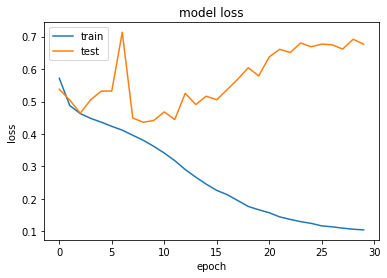

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 97s 1ms/sample - loss: 0.5879 - acc: 0.7156 - val_loss: 0.4975 - val_acc: 0.7730
Epoch 2/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4980 - acc: 0.7713 - val_loss: 0.6264 - val_acc: 0.7151
Epoch 3/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4719 - acc: 0.7873 - val_loss: 0.5170 - val_acc: 0.7449
Epoch 4/30
80000/80000 [==============================] - 39s 488us/sample - loss: 0.4544 - acc: 0.7977 - val_loss: 0.4666 - val_acc: 0.7946
Epoch 5/30
80000/80000 [==============================] - 39s 487us/sample - loss: 0.4411 - acc: 0.8051 - val_loss: 0.6555 - val_acc: 0.6758
Epoch 6/30
80000/80000 [==============================] - 39s 486us/sample - loss: 0.4321 - acc: 0.8113 - val_loss: 0.4621 - val_acc: 0.7851
Epoch 7/30
80000/80000 [==============================] - 39s 488us/sample - loss: 0.4

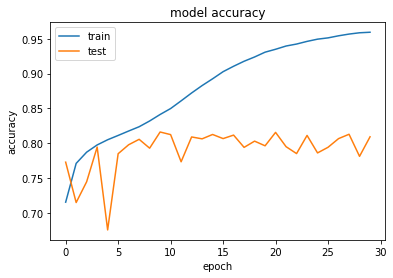

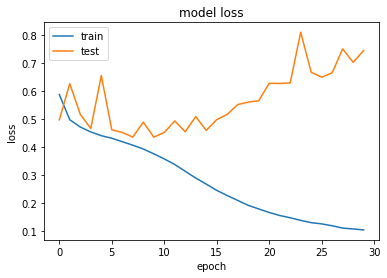

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 102s 1ms/sample - loss: 0.5671 - acc: 0.7261 - val_loss: 0.5057 - val_acc: 0.7653
Epoch 2/30
80000/80000 [==============================] - 42s 530us/sample - loss: 0.4878 - acc: 0.7772 - val_loss: 0.5526 - val_acc: 0.7510
Epoch 3/30
80000/80000 [==============================] - 42s 530us/sample - loss: 0.4621 - acc: 0.7919 - val_loss: 0.4758 - val_acc: 0.7994
Epoch 4/30
80000/80000 [==============================] - 42s 527us/sample - loss: 0.4462 - acc: 0.8022 - val_loss: 0.4628 - val_acc: 0.7921
Epoch 5/30
80000/80000 [==============================] - 42s 528us/sample - loss: 0.4331 - acc: 0.8090 - val_loss: 0.4434 - val_acc: 0.8104
Epoch 6/30
80000/80000 [==============================] - 42s 528us/sample - loss: 0.4220 - acc: 0.8162 - val_loss: 0.4705 - val_acc: 0.7904
Epoch 7/30
80000/80000 [==============================] - 42s 527us/sample - loss: 0.

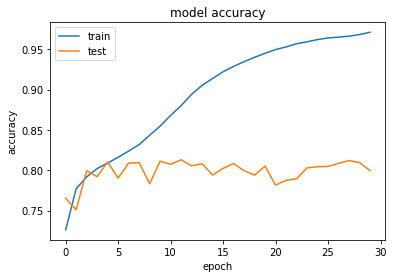

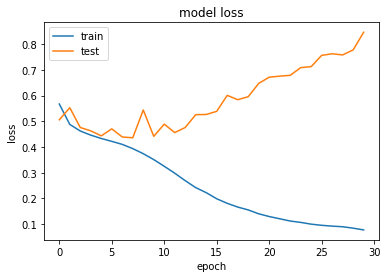

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 104s 1ms/sample - loss: 0.5595 - acc: 0.7310 - val_loss: 0.5074 - val_acc: 0.7650
Epoch 2/30
80000/80000 [==============================] - 44s 551us/sample - loss: 0.4875 - acc: 0.7793 - val_loss: 0.6837 - val_acc: 0.7005
Epoch 3/30
80000/80000 [==============================] - 44s 552us/sample - loss: 0.4645 - acc: 0.7924 - val_loss: 0.4626 - val_acc: 0.7891
Epoch 4/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.4492 - acc: 0.8023 - val_loss: 0.4973 - val_acc: 0.7824
Epoch 5/30
80000/80000 [==============================] - 44s 554us/sample - loss: 0.4355 - acc: 0.8092 - val_loss: 0.4611 - val_acc: 0.7948
Epoch 6/30
80000/80000 [==============================] - 44s 553us/sample - loss: 0.4227 - acc: 0.8165 - val_loss: 0.4542 - val_acc: 0.7982
Epoch 7/30
80000/80000 [==============================] - 44s 551us/sample - loss: 0.

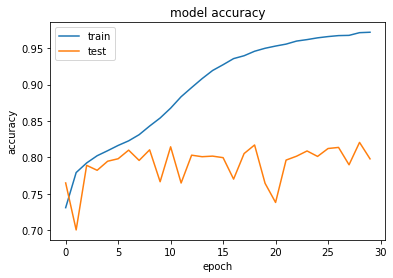

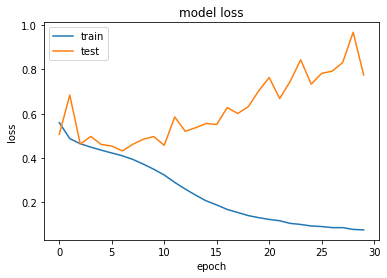

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 123s 2ms/sample - loss: 0.5730 - acc: 0.7234 - val_loss: 0.6016 - val_acc: 0.7273
Epoch 2/30
80000/80000 [==============================] - 60s 752us/sample - loss: 0.4876 - acc: 0.7783 - val_loss: 0.5042 - val_acc: 0.7648
Epoch 3/30
80000/80000 [==============================] - 60s 754us/sample - loss: 0.4621 - acc: 0.7932 - val_loss: 0.5298 - val_acc: 0.7613
Epoch 4/30
80000/80000 [==============================] - 60s 755us/sample - loss: 0.4460 - acc: 0.8029 - val_loss: 0.5087 - val_acc: 0.7851
Epoch 5/30
80000/80000 [==============================] - 60s 755us/sample - loss: 0.4340 - acc: 0.8108 - val_loss: 0.4713 - val_acc: 0.8013
Epoch 6/30
80000/80000 [==============================] - 60s 755us/sample - loss: 0.4208 - acc: 0.8170 - val_loss: 0.5543 - val_acc: 0.7594
Epoch 7/30
80000/80000 [==============================] - 60s 755us/sample - loss: 0.

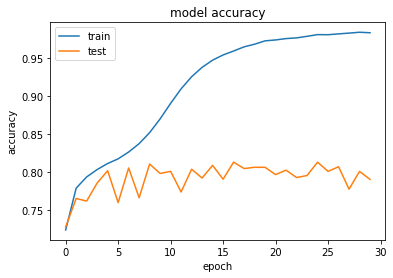

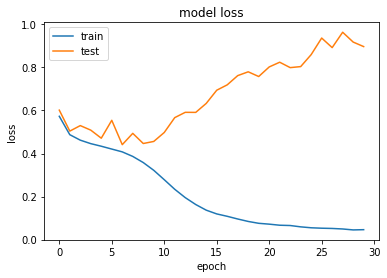

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 126s 2ms/sample - loss: 0.5720 - acc: 0.7227 - val_loss: 0.6329 - val_acc: 0.7074
Epoch 2/30
80000/80000 [==============================] - 63s 785us/sample - loss: 0.4977 - acc: 0.7725 - val_loss: 0.5005 - val_acc: 0.7742
Epoch 3/30
80000/80000 [==============================] - 63s 788us/sample - loss: 0.4697 - acc: 0.7886 - val_loss: 0.4623 - val_acc: 0.7947
Epoch 4/30
80000/80000 [==============================] - 63s 788us/sample - loss: 0.4505 - acc: 0.8014 - val_loss: 0.4867 - val_acc: 0.7748
Epoch 5/30
80000/80000 [==============================] - 63s 789us/sample - loss: 0.4364 - acc: 0.8071 - val_loss: 0.4473 - val_acc: 0.8091
Epoch 6/30
80000/80000 [==============================] - 63s 789us/sample - loss: 0.4210 - acc: 0.8181 - val_loss: 0.5508 - val_acc: 0.7212
Epoch 7/30
80000/80000 [==============================] - 63s 789us/sample - loss: 0.

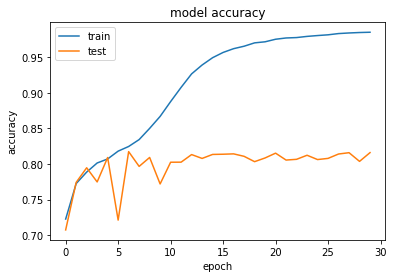

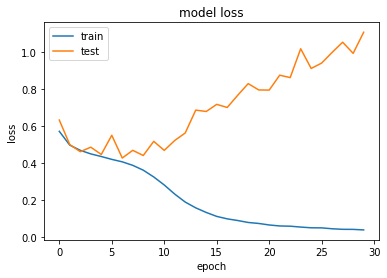

Ende des Versuchs: 


In [9]:
dense_layers = [1,2,3]
layer_sizes = [100,150,200,400]
conv_layers = [2,3]
kernal_size = [(2,2),(3,3),(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="PMTC-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\PMT_C_CNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= XTrainingC.shape[1:],activation="relu", padding='same'))
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(
                            loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
                #model.summary()


            

                history = model.fit(
                                XTrainingC,Y[:80000],
                                #XTraining,YTraining,
                                validation_data=(XValC,Y[80000:100000]),
                                #validation_split=0.2,
                                #validation_data=(XVal,YVal),
                                batch_size=100,
                                epochs= 30,
                                shuffle=True,
                                class_weight='balanced',
                                callbacks=[
                                            #monitor,
                                            #checkpoint,
                                            tensorboard 
                                ],
                                verbose=1)


                # list all data in history
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                print("Ende des Versuchs: ")
                # list all data in history

            
            
dense_layers = [1,2,3]
layer_sizes = [100,150,200,400]
conv_layers = [2,3]
kernal_size = [(2,2),(3,3),(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="PMTT-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\PMT_T_CNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= XTrainingT.shape[1:],activation="relu", padding='same'))
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(
                            loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
                #model.summary()


            

                history = model.fit(
                                XTrainingT,Y[:80000],
                                #XTraining,YTraining,
                                validation_data=(XValT,Y[80000:100000]),
                                #validation_split=0.2,
                                #validation_data=(XVal,YVal),
                                batch_size=100,
                                epochs= 30,
                                shuffle=True,
                                class_weight='balanced',
                                callbacks=[
                                            #monitor,
                                            #checkpoint,
                                            tensorboard 
                                ],
                                verbose=1)


            # list all data in history
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                print("Ende des Versuchs: ")
            # list all data in history
dense_layers = [1,2,3]
layer_sizes = [100,150,200,400]
conv_layers = [2,3]
kernal_size = [(2,2),(3,3),(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="PMT-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\PMT_C+T_CNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= X.shape[1:],activation="relu", padding='same'))
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(
                            loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
               # model.summary()


            

                history = model.fit(
                                X[:80000],Y[:80000],
                                #XTraining,YTraining,
                                validation_data=(X[80000:100000],Y[80000:100000]),
                                #validation_split=0.2,
                                #validation_data=(XVal,YVal),
                                batch_size=100,
                                epochs= 30,
                                shuffle=True,
                                class_weight='balanced',
                                callbacks=[
                                            #monitor,
                                            #checkpoint,
                                            tensorboard 
                                ],
                                verbose=1)


                # list all data in history
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                print("Ende des Versuchs: ")
                # list all data in history

In [3]:
#X2= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/X_Beamlike_RC_PMT160andLAPPD5x5_110k_Files_mitTopBottom.pickle","rb"))


# LAPPD

In [13]:
del X,Y

In [2]:
#24 PMTs
X= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/X_RC_24PMTs_110k_Files_gn_tf.pickle","rb"))
Y= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/Y_RC_24PMTs_110k_Files_gn_tf.pickle","rb"))
##1x1
X2= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/X_RC_LAPPD(1x1)_110k_Files_gn_tf.pickle","rb"))
Y2= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/Y_RC_LAPPD(1x1)_110k_Files_gn_tf.pickle","rb"))
##5x5
X3= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/X_RC_LAPPD(5x5)_110k_Files_gn_tf.pickle","rb"))
Y3= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/Y_RC_LAPPD(5x5)_110k_Files_gn_tf.pickle","rb"))
##10x10
X4= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/X_RC_LAPPD(10x10)_110k_Files_gn_tf.pickle","rb"))
Y4= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Final/Y_RC_LAPPD(10x10)_110k_Files_gn_tf.pickle","rb"))



In [3]:
print(X.shape,Y.shape)
print(X2.shape,Y2.shape)
print(X3.shape,Y3.shape)
print(X4.shape,Y4.shape)

(110544, 3, 8, 2) (110544, 2)
(110544, 3, 8, 2) (110544, 2)
(110441, 15, 40, 2) (110441, 2)
(110441, 30, 80, 2) (110441, 2)


Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 6s 70us/sample - loss: 0.6029 - acc: 0.6952 - val_loss: 0.5447 - val_acc: 0.7372
Epoch 2/30
80000/80000 [==============================] - 5s 65us/sample - loss: 0.5441 - acc: 0.7351 - val_loss: 0.5660 - val_acc: 0.7219
Epoch 3/30
80000/80000 [==============================] - 5s 64us/sample - loss: 0.5343 - acc: 0.7411 - val_loss: 0.6039 - val_acc: 0.6922
Epoch 4/30
80000/80000 [==============================] - 5s 64us/sample - loss: 0.5308 - acc: 0.7438 - val_loss: 0.5215 - val_acc: 0.7521
Epoch 5/30
80000/80000 [==============================] - 5s 66us/sample - loss: 0.5252 - acc: 0.7491 - val_loss: 0.5228 - val_acc: 0.7505
Epoch 6/30
80000/80000 [==============================] - 5s 65us/sample - loss: 0.5219 - acc: 0.7498 - val_loss: 0.5219 - val_acc: 0.7538
Epoch 7/30
80000/80000 [==============================] - 5s 66us/sample - loss: 0.5185 - acc: 0.7530 - val_loss: 0.

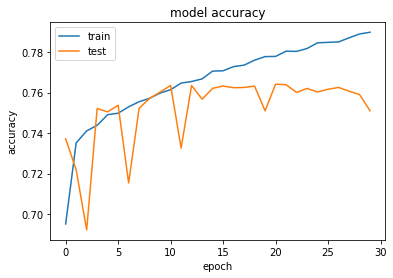

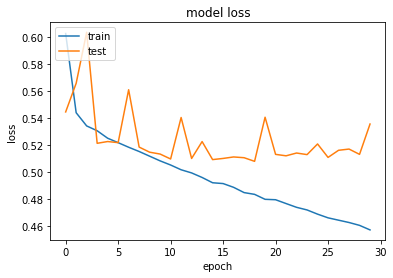

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 6s 79us/sample - loss: 0.6020 - acc: 0.6913 - val_loss: 0.5414 - val_acc: 0.7365
Epoch 2/30
80000/80000 [==============================] - 6s 71us/sample - loss: 0.5453 - acc: 0.7346 - val_loss: 0.5678 - val_acc: 0.7209
Epoch 3/30
80000/80000 [==============================] - 6s 70us/sample - loss: 0.5358 - acc: 0.7417 - val_loss: 0.5298 - val_acc: 0.7458
Epoch 4/30
80000/80000 [==============================] - 6s 70us/sample - loss: 0.5291 - acc: 0.7476 - val_loss: 0.6007 - val_acc: 0.7164
Epoch 5/30
80000/80000 [==============================] - 6s 70us/sample - loss: 0.5238 - acc: 0.7509 - val_loss: 0.5392 - val_acc: 0.7439
Epoch 6/30
80000/80000 [==============================] - 6s 71us/sample - loss: 0.5183 - acc: 0.7537 - val_loss: 0.5885 - val_acc: 0.7214
Epoch 7/30
80000/80000 [==============================] - 6s 70us/sample - loss: 0.5132 - acc: 0

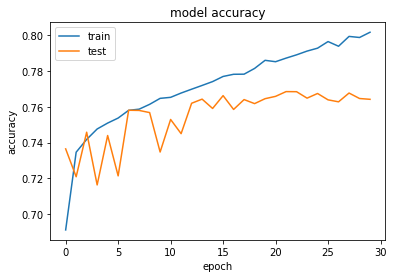

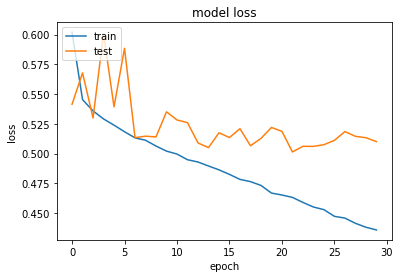

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 90us/sample - loss: 0.6058 - acc: 0.6905 - val_loss: 0.5738 - val_acc: 0.7095
Epoch 2/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5467 - acc: 0.7344 - val_loss: 0.5323 - val_acc: 0.7376
Epoch 3/30
80000/80000 [==============================] - 6s 79us/sample - loss: 0.5354 - acc: 0.7425 - val_loss: 0.5194 - val_acc: 0.7555
Epoch 4/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5294 - acc: 0.7461 - val_loss: 0.5435 - val_acc: 0.7362
Epoch 5/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5243 - acc: 0.7505 - val_loss: 0.5147 - val_acc: 0.7588
Epoch 6/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5200 - acc: 0.7530 - val_loss: 0.5236 - val_acc: 0.7537
Epoch 7/30
80000/80000 [==============================] - 6s 79us/sample - loss: 0.5137 - acc: 0

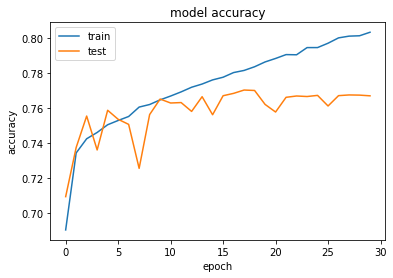

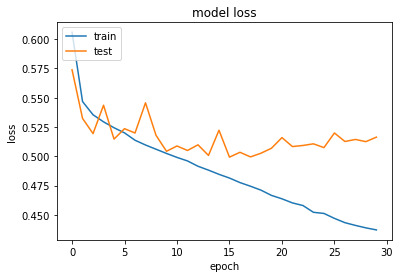

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 6s 72us/sample - loss: 0.5958 - acc: 0.6989 - val_loss: 0.5444 - val_acc: 0.7297
Epoch 2/30
80000/80000 [==============================] - 5s 63us/sample - loss: 0.5430 - acc: 0.7358 - val_loss: 0.5619 - val_acc: 0.7146
Epoch 3/30
80000/80000 [==============================] - 5s 63us/sample - loss: 0.5332 - acc: 0.7433 - val_loss: 0.5289 - val_acc: 0.7495
Epoch 4/30
80000/80000 [==============================] - 5s 63us/sample - loss: 0.5274 - acc: 0.7466 - val_loss: 0.5391 - val_acc: 0.7430
Epoch 5/30
80000/80000 [==============================] - 5s 63us/sample - loss: 0.5232 - acc: 0.7510 - val_loss: 0.5243 - val_acc: 0.7547
Epoch 6/30
80000/80000 [==============================] - 5s 64us/sample - loss: 0.5186 - acc: 0.7537 - val_loss: 0.5367 - val_acc: 0.7314
Epoch 7/30
80000/80000 [==============================] - 5s 64us/sample - loss: 0.5152 - acc: 0

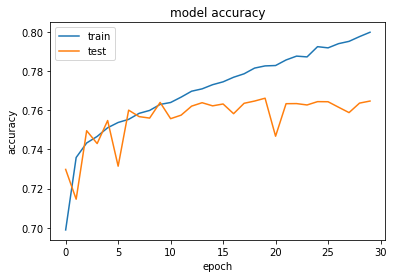

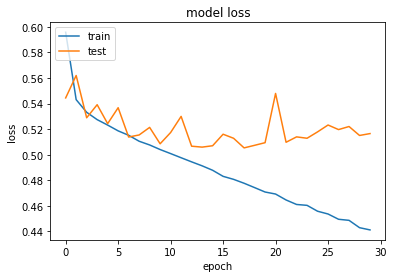

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.6168 - acc: 0.6895 - val_loss: 0.6058 - val_acc: 0.6841
Epoch 2/30
80000/80000 [==============================] - 6s 74us/sample - loss: 0.5466 - acc: 0.7347 - val_loss: 0.5520 - val_acc: 0.7319
Epoch 3/30
80000/80000 [==============================] - 6s 74us/sample - loss: 0.5340 - acc: 0.7433 - val_loss: 0.5908 - val_acc: 0.6934
Epoch 4/30
80000/80000 [==============================] - 6s 75us/sample - loss: 0.5270 - acc: 0.7472 - val_loss: 0.5197 - val_acc: 0.7531
Epoch 5/30
80000/80000 [==============================] - 6s 74us/sample - loss: 0.5223 - acc: 0.7509 - val_loss: 0.5309 - val_acc: 0.7418
Epoch 6/30
80000/80000 [==============================] - 6s 74us/sample - loss: 0.5175 - acc: 0.7548 - val_loss: 0.5601 - val_acc: 0.7105
Epoch 7/30
80000/80000 [==============================] - 6s 74us/sample - loss: 0.5138 - acc: 0

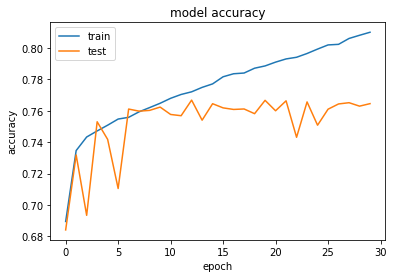

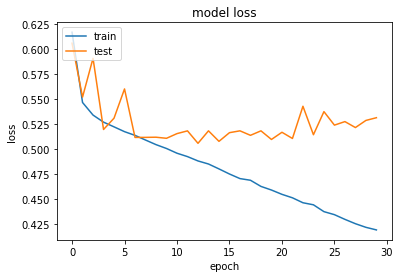

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.6106 - acc: 0.6904 - val_loss: 0.5506 - val_acc: 0.7289
Epoch 2/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5458 - acc: 0.7347 - val_loss: 0.5512 - val_acc: 0.7276
Epoch 3/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5323 - acc: 0.7441 - val_loss: 0.5285 - val_acc: 0.7440
Epoch 4/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5252 - acc: 0.7490 - val_loss: 0.5521 - val_acc: 0.7360
Epoch 5/30
80000/80000 [==============================] - 7s 84us/sample - loss: 0.5217 - acc: 0.7504 - val_loss: 0.5447 - val_acc: 0.7321
Epoch 6/30
80000/80000 [==============================] - 7s 84us/sample - loss: 0.5150 - acc: 0.7549 - val_loss: 0.5213 - val_acc: 0.7500
Epoch 7/30
80000/80000 [==============================] - 7s 84us/sample - loss: 0.5116 - acc: 0

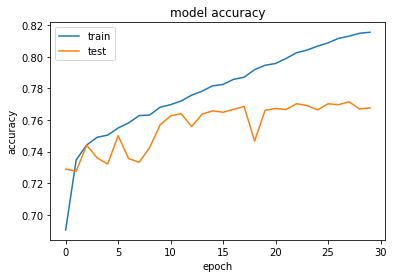

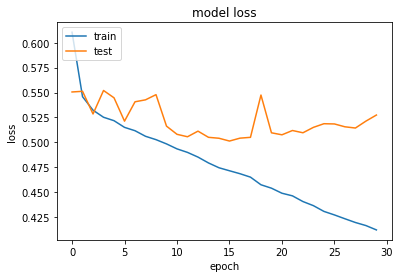

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.6123 - acc: 0.6912 - val_loss: 0.6607 - val_acc: 0.6388
Epoch 2/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5446 - acc: 0.7349 - val_loss: 0.5404 - val_acc: 0.7380
Epoch 3/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5323 - acc: 0.7441 - val_loss: 0.5445 - val_acc: 0.7314
Epoch 4/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5254 - acc: 0.7494 - val_loss: 0.5159 - val_acc: 0.7544
Epoch 5/30
80000/80000 [==============================] - 6s 79us/sample - loss: 0.5193 - acc: 0.7536 - val_loss: 0.5463 - val_acc: 0.7373
Epoch 6/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5136 - acc: 0.7567 - val_loss: 0.5368 - val_acc: 0.7424
Epoch 7/30
80000/80000 [==============================] - 6s 80us/sample - loss: 0.5096 - acc: 0

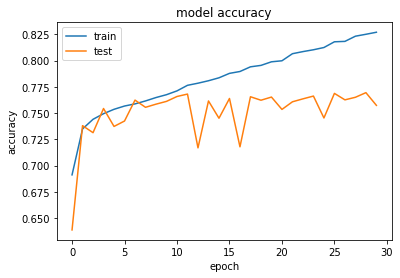

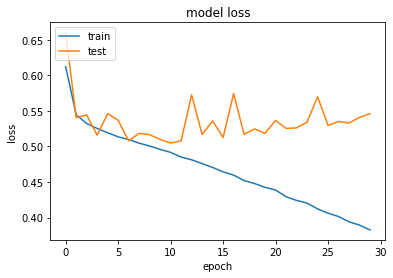

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.6095 - acc: 0.6877 - val_loss: 0.5451 - val_acc: 0.7320
Epoch 2/30
80000/80000 [==============================] - 7s 89us/sample - loss: 0.5453 - acc: 0.7352 - val_loss: 0.5676 - val_acc: 0.7186
Epoch 3/30
80000/80000 [==============================] - 7s 88us/sample - loss: 0.5335 - acc: 0.7433 - val_loss: 0.5217 - val_acc: 0.7537
Epoch 4/30
80000/80000 [==============================] - 7s 88us/sample - loss: 0.5279 - acc: 0.7470 - val_loss: 0.5622 - val_acc: 0.7290
Epoch 5/30
80000/80000 [==============================] - 7s 88us/sample - loss: 0.5217 - acc: 0.7517 - val_loss: 0.5133 - val_acc: 0.7595
Epoch 6/30
80000/80000 [==============================] - 7s 89us/sample - loss: 0.5162 - acc: 0.7560 - val_loss: 0.5170 - val_acc: 0.7581
Epoch 7/30
80000/80000 [==============================] - 7s 88us/sample - loss: 0.5126 - acc: 

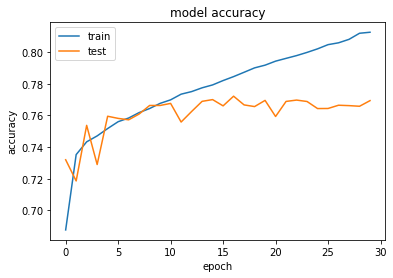

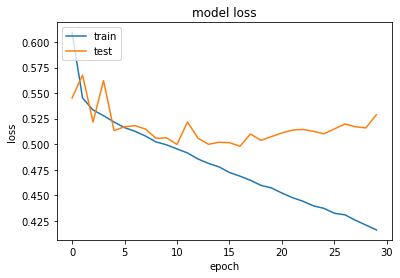

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.6179 - acc: 0.6842 - val_loss: 0.5546 - val_acc: 0.7276
Epoch 2/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5501 - acc: 0.7317 - val_loss: 0.5422 - val_acc: 0.7395
Epoch 3/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5366 - acc: 0.7412 - val_loss: 0.5695 - val_acc: 0.7165
Epoch 4/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5304 - acc: 0.7457 - val_loss: 0.5221 - val_acc: 0.7520
Epoch 5/30
80000/80000 [==============================] - 8s 99us/sample - loss: 0.5236 - acc: 0.7503 - val_loss: 0.5443 - val_acc: 0.7297
Epoch 6/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5197 - acc: 0.7531 - val_loss: 0.5142 - val_acc: 0.7574
Epoch 7/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5150 - acc: 

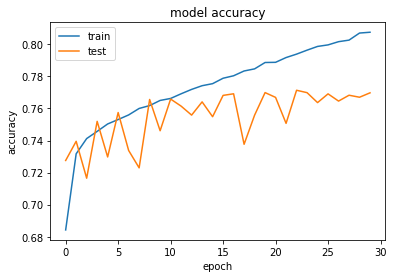

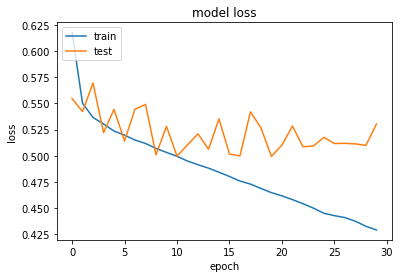

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 8s 99us/sample - loss: 0.5886 - acc: 0.7039 - val_loss: 0.5614 - val_acc: 0.7161
Epoch 2/30
80000/80000 [==============================] - 7s 83us/sample - loss: 0.5389 - acc: 0.7399 - val_loss: 0.6424 - val_acc: 0.6520
Epoch 3/30
80000/80000 [==============================] - 7s 83us/sample - loss: 0.5295 - acc: 0.7451 - val_loss: 0.5423 - val_acc: 0.7344
Epoch 4/30
80000/80000 [==============================] - 7s 84us/sample - loss: 0.5227 - acc: 0.7501 - val_loss: 0.5227 - val_acc: 0.7501
Epoch 5/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5167 - acc: 0.7540 - val_loss: 0.5255 - val_acc: 0.7466
Epoch 6/30
80000/80000 [==============================] - 7s 83us/sample - loss: 0.5109 - acc: 0.7580 - val_loss: 0.5086 - val_acc: 0.7578
Epoch 7/30
80000/80000 [==============================] - 7s 84us/sample - loss: 0.5069 - acc: 0

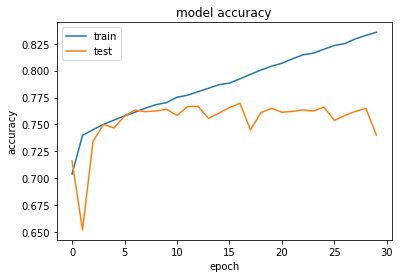

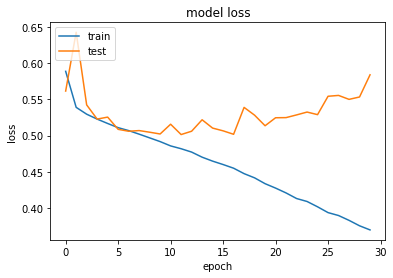

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.6062 - acc: 0.6944 - val_loss: 0.5509 - val_acc: 0.7311
Epoch 2/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5425 - acc: 0.7370 - val_loss: 0.5247 - val_acc: 0.7497
Epoch 3/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5309 - acc: 0.7436 - val_loss: 0.5609 - val_acc: 0.7150
Epoch 4/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5233 - acc: 0.7503 - val_loss: 0.5203 - val_acc: 0.7513
Epoch 5/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5197 - acc: 0.7522 - val_loss: 0.5793 - val_acc: 0.6987
Epoch 6/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5138 - acc: 0.7557 - val_loss: 0.5142 - val_acc: 0.7599
Epoch 7/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5097 - acc: 

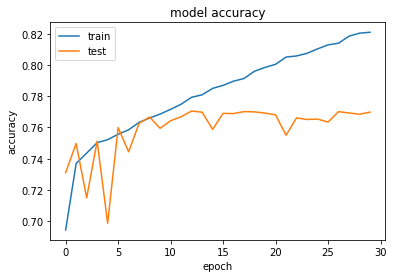

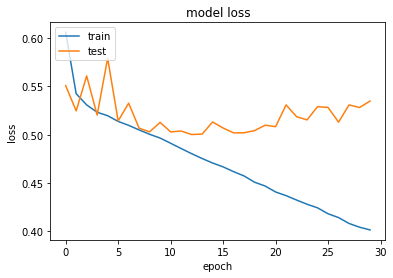

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.6090 - acc: 0.6888 - val_loss: 0.5384 - val_acc: 0.7334
Epoch 2/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5472 - acc: 0.7334 - val_loss: 0.5511 - val_acc: 0.7348
Epoch 3/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5348 - acc: 0.7413 - val_loss: 0.5372 - val_acc: 0.7409
Epoch 4/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5276 - acc: 0.7482 - val_loss: 0.5263 - val_acc: 0.7473
Epoch 5/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5231 - acc: 0.7503 - val_loss: 0.5245 - val_acc: 0.7501
Epoch 6/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5174 - acc: 0.7538 - val_loss: 0.5177 - val_acc: 0.7563
Epoch 7/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5135 

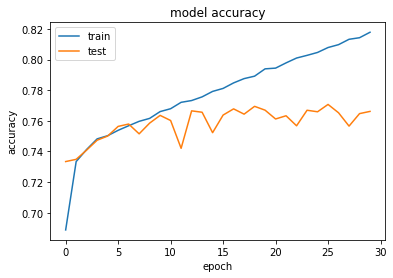

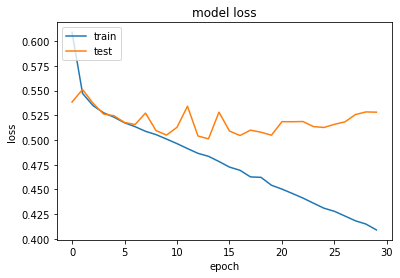

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 83us/sample - loss: 0.6061 - acc: 0.6897 - val_loss: 0.5488 - val_acc: 0.7278
Epoch 2/30
80000/80000 [==============================] - 5s 66us/sample - loss: 0.5460 - acc: 0.7320 - val_loss: 0.5365 - val_acc: 0.7383
Epoch 3/30
80000/80000 [==============================] - 5s 66us/sample - loss: 0.5328 - acc: 0.7441 - val_loss: 0.5599 - val_acc: 0.7143
Epoch 4/30
80000/80000 [==============================] - 5s 66us/sample - loss: 0.5258 - acc: 0.7466 - val_loss: 0.5510 - val_acc: 0.7333
Epoch 5/30
80000/80000 [==============================] - 5s 66us/sample - loss: 0.5212 - acc: 0.7519 - val_loss: 0.5238 - val_acc: 0.7520
Epoch 6/30
80000/80000 [==============================] - 5s 67us/sample - loss: 0.5146 - acc: 0.7556 - val_loss: 0.5258 - val_acc: 0.7462
Epoch 7/30
80000/80000 [==============================] - 5s 66us/sample - loss: 0.5102 - acc: 0

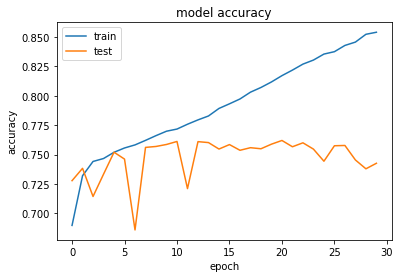

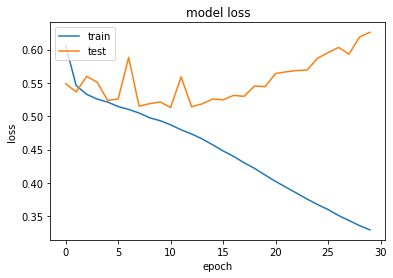

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 8s 96us/sample - loss: 0.6092 - acc: 0.6894 - val_loss: 0.5374 - val_acc: 0.7387
Epoch 2/30
80000/80000 [==============================] - 6s 78us/sample - loss: 0.5434 - acc: 0.7341 - val_loss: 0.5292 - val_acc: 0.7452
Epoch 3/30
80000/80000 [==============================] - 6s 77us/sample - loss: 0.5319 - acc: 0.7441 - val_loss: 0.5652 - val_acc: 0.7176
Epoch 4/30
80000/80000 [==============================] - 6s 77us/sample - loss: 0.5225 - acc: 0.7507 - val_loss: 0.5426 - val_acc: 0.7310
Epoch 5/30
80000/80000 [==============================] - 6s 77us/sample - loss: 0.5144 - acc: 0.7556 - val_loss: 0.5199 - val_acc: 0.7527
Epoch 6/30
80000/80000 [==============================] - 6s 78us/sample - loss: 0.5086 - acc: 0.7598 - val_loss: 0.5514 - val_acc: 0.7260
Epoch 7/30
80000/80000 [==============================] - 6s 77us/sample - loss: 0.5026 - acc: 0

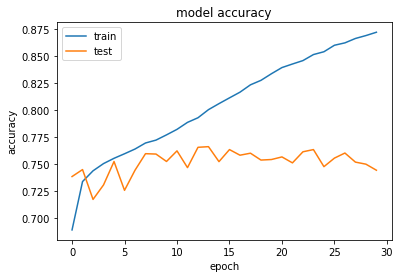

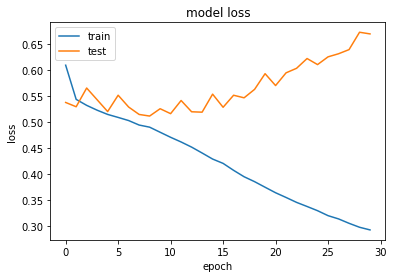

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 106us/sample - loss: 0.5983 - acc: 0.6982 - val_loss: 0.5722 - val_acc: 0.7158
Epoch 2/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5432 - acc: 0.7341 - val_loss: 0.6823 - val_acc: 0.6571
Epoch 3/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5315 - acc: 0.7430 - val_loss: 0.5443 - val_acc: 0.7334
Epoch 4/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5225 - acc: 0.7502 - val_loss: 0.5334 - val_acc: 0.7376
Epoch 5/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5142 - acc: 0.7546 - val_loss: 0.5189 - val_acc: 0.7555
Epoch 6/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5082 - acc: 0.7609 - val_loss: 0.5363 - val_acc: 0.7332
Epoch 7/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5017 - acc: 

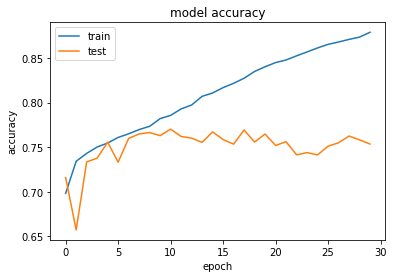

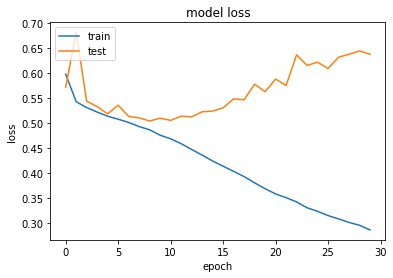

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 7s 88us/sample - loss: 0.6194 - acc: 0.6820 - val_loss: 0.6110 - val_acc: 0.6856
Epoch 2/30
80000/80000 [==============================] - 5s 68us/sample - loss: 0.5493 - acc: 0.7304 - val_loss: 0.5303 - val_acc: 0.7444
Epoch 3/30
80000/80000 [==============================] - 5s 68us/sample - loss: 0.5365 - acc: 0.7412 - val_loss: 0.5556 - val_acc: 0.7246
Epoch 4/30
80000/80000 [==============================] - 5s 68us/sample - loss: 0.5285 - acc: 0.7467 - val_loss: 0.5233 - val_acc: 0.7505
Epoch 5/30
80000/80000 [==============================] - 5s 69us/sample - loss: 0.5217 - acc: 0.7508 - val_loss: 0.5433 - val_acc: 0.7356
Epoch 6/30
80000/80000 [==============================] - 5s 68us/sample - loss: 0.5155 - acc: 0.7564 - val_loss: 0.5244 - val_acc: 0.7501
Epoch 7/30
80000/80000 [==============================] - 5s 68us/sample - loss: 0.5116 - acc: 0

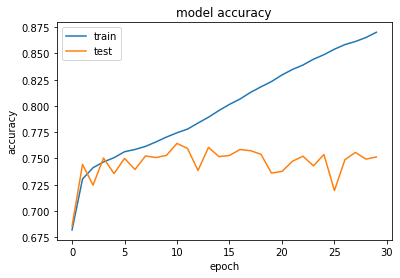

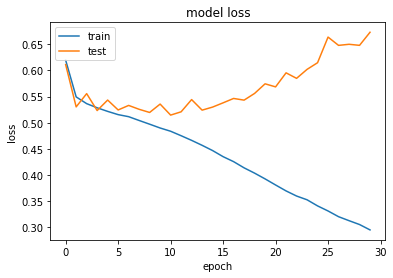

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.6130 - acc: 0.6906 - val_loss: 0.5742 - val_acc: 0.7031
Epoch 2/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.5438 - acc: 0.7345 - val_loss: 0.5423 - val_acc: 0.7365
Epoch 3/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5301 - acc: 0.7446 - val_loss: 0.5276 - val_acc: 0.7462
Epoch 4/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5227 - acc: 0.7506 - val_loss: 0.5207 - val_acc: 0.7538
Epoch 5/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.5152 - acc: 0.7557 - val_loss: 0.5600 - val_acc: 0.7221
Epoch 6/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.5093 - acc: 0.7587 - val_loss: 0.5100 - val_acc: 0.7621
Epoch 7/30
80000/80000 [==============================] - 6s 81us/sample - loss: 0.5030 - acc: 

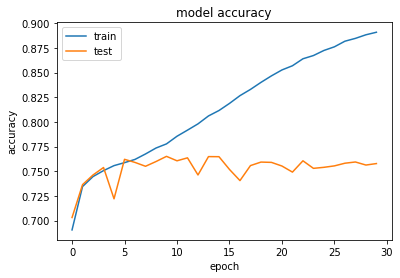

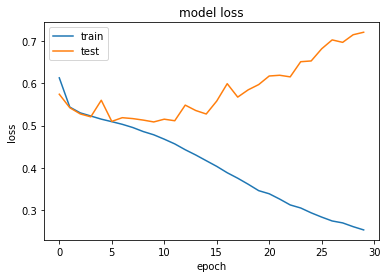

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 116us/sample - loss: 0.6174 - acc: 0.6898 - val_loss: 0.5473 - val_acc: 0.7373
Epoch 2/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.5454 - acc: 0.7343 - val_loss: 0.5417 - val_acc: 0.7411
Epoch 3/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5299 - acc: 0.7448 - val_loss: 0.5809 - val_acc: 0.7197
Epoch 4/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5223 - acc: 0.7484 - val_loss: 0.5197 - val_acc: 0.7541
Epoch 5/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5171 - acc: 0.7537 - val_loss: 0.5233 - val_acc: 0.7504
Epoch 6/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5103 - acc: 0.7589 - val_loss: 0.5322 - val_acc: 0.7525
Epoch 7/30
80000/80000 [==============================] - 7s 94us/sample - loss: 0.5030 - acc: 

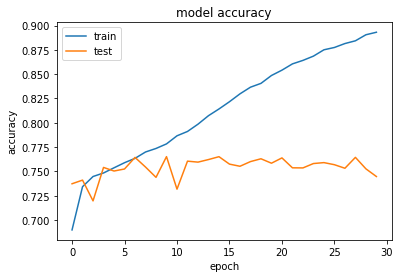

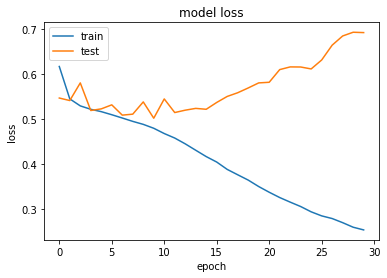

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.6025 - acc: 0.6953 - val_loss: 0.5536 - val_acc: 0.7216
Epoch 2/30
80000/80000 [==============================] - 7s 84us/sample - loss: 0.5416 - acc: 0.7350 - val_loss: 0.6725 - val_acc: 0.6406
Epoch 3/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5299 - acc: 0.7440 - val_loss: 0.5269 - val_acc: 0.7487
Epoch 4/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5217 - acc: 0.7495 - val_loss: 0.5450 - val_acc: 0.7369
Epoch 5/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5155 - acc: 0.7556 - val_loss: 0.5138 - val_acc: 0.7577
Epoch 6/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5075 - acc: 0.7619 - val_loss: 0.5408 - val_acc: 0.7307
Epoch 7/30
80000/80000 [==============================] - 7s 84us/sample - loss: 0.5017 - acc: 

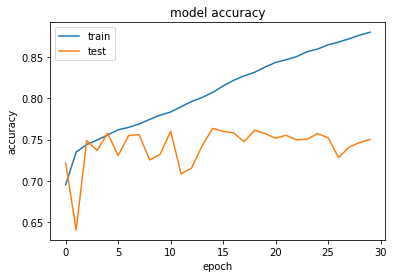

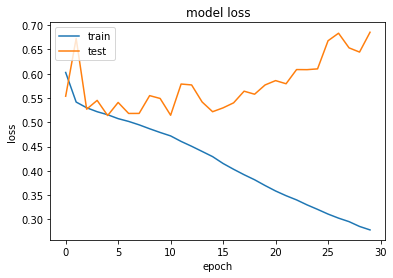

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.6080 - acc: 0.6918 - val_loss: 0.5427 - val_acc: 0.7337
Epoch 2/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.5451 - acc: 0.7342 - val_loss: 0.5249 - val_acc: 0.7487
Epoch 3/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.5314 - acc: 0.7438 - val_loss: 0.5749 - val_acc: 0.7042
Epoch 4/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.5243 - acc: 0.7491 - val_loss: 0.6179 - val_acc: 0.7016
Epoch 5/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.5161 - acc: 0.7537 - val_loss: 0.5267 - val_acc: 0.7505
Epoch 6/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.5108 - acc: 0.7578 - val_loss: 0.5484 - val_acc: 0.7290
Epoch 7/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.5035 - acc:

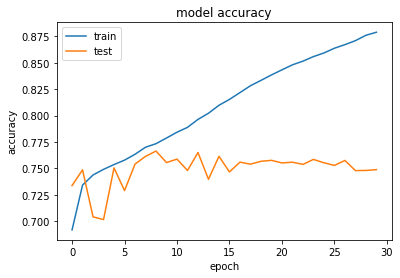

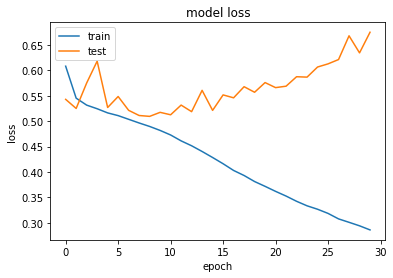

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 133us/sample - loss: 0.6081 - acc: 0.6954 - val_loss: 0.5595 - val_acc: 0.7218
Epoch 2/30
80000/80000 [==============================] - 8s 106us/sample - loss: 0.5461 - acc: 0.7345 - val_loss: 0.5851 - val_acc: 0.7060
Epoch 3/30
80000/80000 [==============================] - 8s 106us/sample - loss: 0.5331 - acc: 0.7424 - val_loss: 0.5308 - val_acc: 0.7448
Epoch 4/30
80000/80000 [==============================] - 8s 106us/sample - loss: 0.5251 - acc: 0.7478 - val_loss: 0.5208 - val_acc: 0.7513
Epoch 5/30
80000/80000 [==============================] - 8s 106us/sample - loss: 0.5189 - acc: 0.7536 - val_loss: 0.5449 - val_acc: 0.7422
Epoch 6/30
80000/80000 [==============================] - 9s 106us/sample - loss: 0.5129 - acc: 0.7574 - val_loss: 0.5098 - val_acc: 0.7611
Epoch 7/30
80000/80000 [==============================] - 8s 106us/sample - loss: 0.5061 

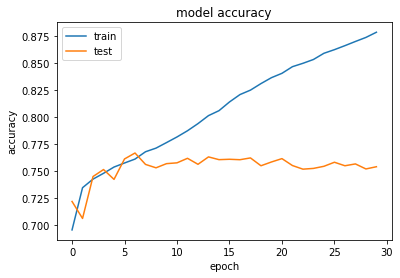

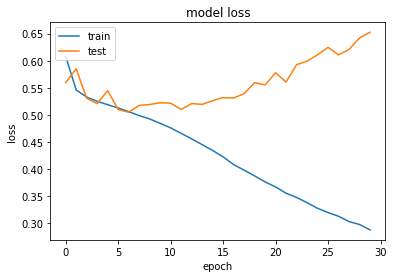

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.6053 - acc: 0.6925 - val_loss: 0.7182 - val_acc: 0.6306
Epoch 2/30
80000/80000 [==============================] - 7s 89us/sample - loss: 0.5423 - acc: 0.7365 - val_loss: 0.5344 - val_acc: 0.7416
Epoch 3/30
80000/80000 [==============================] - 7s 90us/sample - loss: 0.5302 - acc: 0.7455 - val_loss: 0.5304 - val_acc: 0.7412
Epoch 4/30
80000/80000 [==============================] - 7s 89us/sample - loss: 0.5219 - acc: 0.7519 - val_loss: 0.5493 - val_acc: 0.7239
Epoch 5/30
80000/80000 [==============================] - 7s 89us/sample - loss: 0.5149 - acc: 0.7555 - val_loss: 0.5758 - val_acc: 0.7079
Epoch 6/30
80000/80000 [==============================] - 7s 89us/sample - loss: 0.5090 - acc: 0.7599 - val_loss: 0.5117 - val_acc: 0.7613
Epoch 7/30
80000/80000 [==============================] - 7s 89us/sample - loss: 0.5015 - acc: 

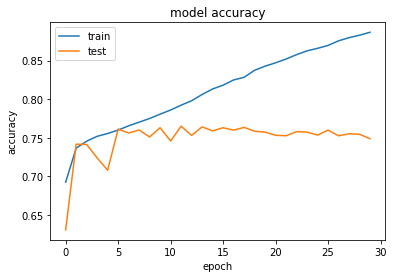

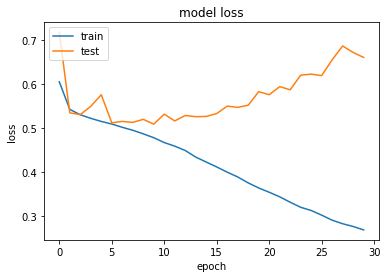

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.6125 - acc: 0.6902 - val_loss: 0.5408 - val_acc: 0.7362
Epoch 2/30
80000/80000 [==============================] - 8s 100us/sample - loss: 0.5429 - acc: 0.7355 - val_loss: 0.5445 - val_acc: 0.7311
Epoch 3/30
80000/80000 [==============================] - 8s 100us/sample - loss: 0.5305 - acc: 0.7436 - val_loss: 0.5245 - val_acc: 0.7503
Epoch 4/30
80000/80000 [==============================] - 8s 100us/sample - loss: 0.5219 - acc: 0.7516 - val_loss: 0.5280 - val_acc: 0.7505
Epoch 5/30
80000/80000 [==============================] - 8s 101us/sample - loss: 0.5152 - acc: 0.7556 - val_loss: 0.5207 - val_acc: 0.7536
Epoch 6/30
80000/80000 [==============================] - 8s 100us/sample - loss: 0.5086 - acc: 0.7600 - val_loss: 0.5577 - val_acc: 0.7253
Epoch 7/30
80000/80000 [==============================] - 8s 100us/sample - loss: 0.5016 

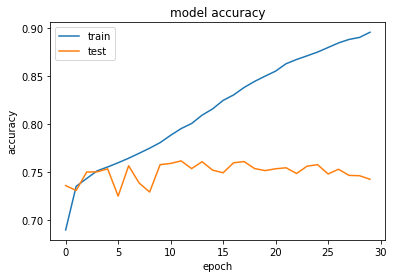

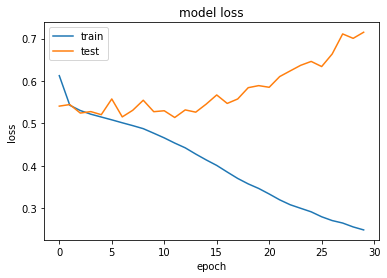

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.6222 - acc: 0.6894 - val_loss: 0.6081 - val_acc: 0.6801
Epoch 2/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5455 - acc: 0.7349 - val_loss: 0.5534 - val_acc: 0.7253
Epoch 3/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5327 - acc: 0.7432 - val_loss: 0.5680 - val_acc: 0.7094
Epoch 4/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5240 - acc: 0.7502 - val_loss: 0.5807 - val_acc: 0.7264
Epoch 5/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5169 - acc: 0.7552 - val_loss: 0.5147 - val_acc: 0.7584
Epoch 6/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5107 - acc: 0.7580 - val_loss: 0.5533 - val_acc: 0.7359
Epoch 7/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5051 

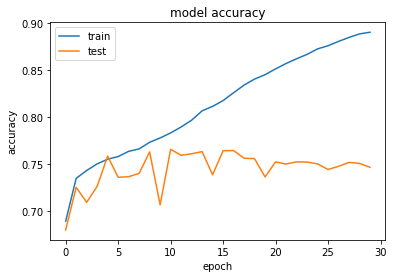

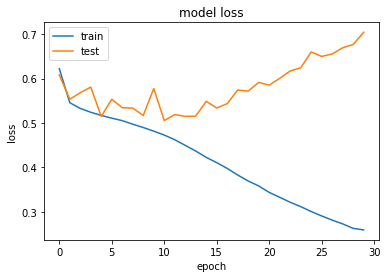

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5935 - acc: 0.6957 - val_loss: 0.5865 - val_acc: 0.7043
Epoch 2/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5446 - acc: 0.7341 - val_loss: 0.5266 - val_acc: 0.7465
Epoch 3/30
80000/80000 [==============================] - 6s 81us/sample - loss: 0.5344 - acc: 0.7413 - val_loss: 0.5575 - val_acc: 0.7276
Epoch 4/30
80000/80000 [==============================] - 6s 81us/sample - loss: 0.5267 - acc: 0.7470 - val_loss: 0.5407 - val_acc: 0.7382
Epoch 5/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.5208 - acc: 0.7519 - val_loss: 0.5225 - val_acc: 0.7480
Epoch 6/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5126 - acc: 0.7566 - val_loss: 0.5200 - val_acc: 0.7518
Epoch 7/30
80000/80000 [==============================] - 7s 83us/sample - loss: 0.5074 - acc: 

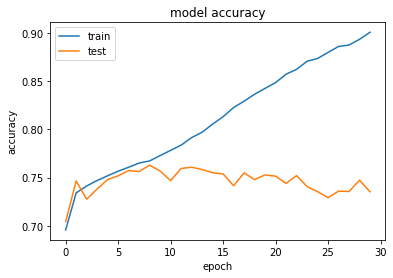

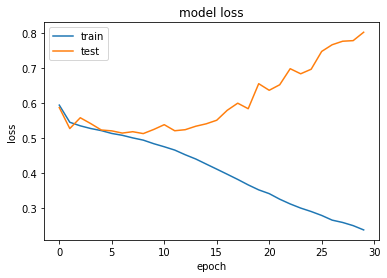

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.6118 - acc: 0.6893 - val_loss: 0.5737 - val_acc: 0.7218
Epoch 2/30
80000/80000 [==============================] - 8s 99us/sample - loss: 0.5457 - acc: 0.7325 - val_loss: 0.5847 - val_acc: 0.6962
Epoch 3/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5329 - acc: 0.7419 - val_loss: 0.5389 - val_acc: 0.7391
Epoch 4/30
80000/80000 [==============================] - 8s 99us/sample - loss: 0.5242 - acc: 0.7493 - val_loss: 0.5813 - val_acc: 0.7027
Epoch 5/30
80000/80000 [==============================] - 8s 99us/sample - loss: 0.5170 - acc: 0.7534 - val_loss: 0.5380 - val_acc: 0.7372
Epoch 6/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5102 - acc: 0.7596 - val_loss: 0.5263 - val_acc: 0.7452
Epoch 7/30
80000/80000 [==============================] - 8s 98us/sample - loss: 0.5015 - acc:

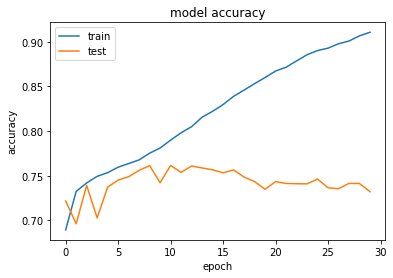

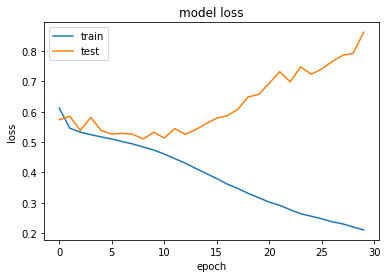

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.6204 - acc: 0.6866 - val_loss: 0.5528 - val_acc: 0.7266
Epoch 2/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5471 - acc: 0.7331 - val_loss: 0.6279 - val_acc: 0.6682
Epoch 3/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5330 - acc: 0.7426 - val_loss: 0.5250 - val_acc: 0.7507
Epoch 4/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5246 - acc: 0.7471 - val_loss: 0.5317 - val_acc: 0.7426
Epoch 5/30
80000/80000 [==============================] - 9s 106us/sample - loss: 0.5186 - acc: 0.7526 - val_loss: 0.5182 - val_acc: 0.7538
Epoch 6/30
80000/80000 [==============================] - 9s 106us/sample - loss: 0.5118 - acc: 0.7593 - val_loss: 0.5441 - val_acc: 0.7380
Epoch 7/30
80000/80000 [==============================] - 9s 106us/sample - loss: 0.5039 

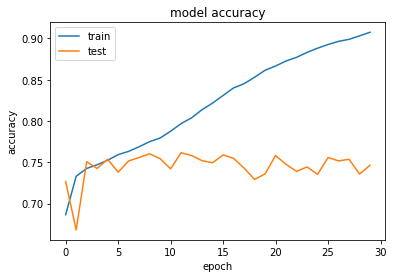

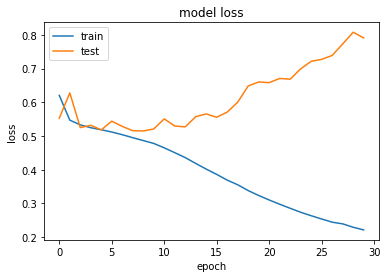

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 122us/sample - loss: 0.5959 - acc: 0.6938 - val_loss: 0.5861 - val_acc: 0.7020
Epoch 2/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5453 - acc: 0.7324 - val_loss: 0.5380 - val_acc: 0.7386
Epoch 3/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5335 - acc: 0.7420 - val_loss: 0.5316 - val_acc: 0.7426
Epoch 4/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5274 - acc: 0.7442 - val_loss: 0.5239 - val_acc: 0.7506
Epoch 5/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5208 - acc: 0.7509 - val_loss: 0.5258 - val_acc: 0.7455
Epoch 6/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5134 - acc: 0.7555 - val_loss: 0.5178 - val_acc: 0.7539
Epoch 7/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5063 - acc:

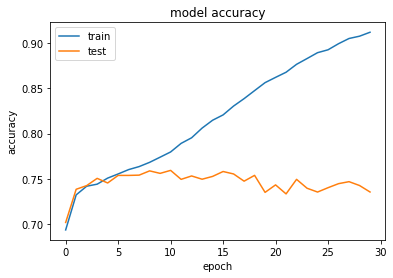

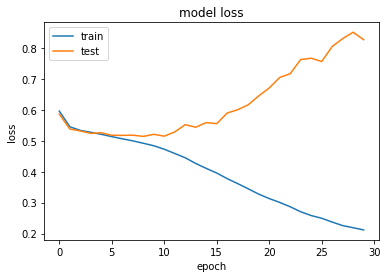

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 137us/sample - loss: 0.6040 - acc: 0.6948 - val_loss: 0.6359 - val_acc: 0.6759
Epoch 2/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5421 - acc: 0.7365 - val_loss: 0.5407 - val_acc: 0.7402
Epoch 3/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5311 - acc: 0.7426 - val_loss: 0.5407 - val_acc: 0.7398
Epoch 4/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5216 - acc: 0.7497 - val_loss: 0.5287 - val_acc: 0.7497
Epoch 5/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5134 - acc: 0.7563 - val_loss: 0.5309 - val_acc: 0.7388
Epoch 6/30
80000/80000 [==============================] - 8s 105us/sample - loss: 0.5066 - acc: 0.7599 - val_loss: 0.5179 - val_acc: 0.7533
Epoch 7/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.4982 

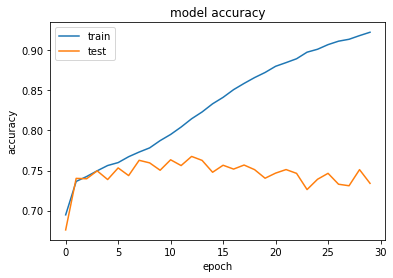

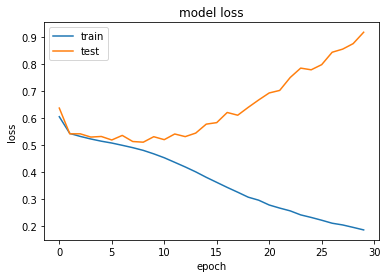

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.6034 - acc: 0.6919 - val_loss: 0.5666 - val_acc: 0.7151
Epoch 2/30
80000/80000 [==============================] - 9s 116us/sample - loss: 0.5451 - acc: 0.7348 - val_loss: 0.6894 - val_acc: 0.6424
Epoch 3/30
80000/80000 [==============================] - 9s 116us/sample - loss: 0.5320 - acc: 0.7430 - val_loss: 0.6085 - val_acc: 0.7034
Epoch 4/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.5241 - acc: 0.7501 - val_loss: 0.5227 - val_acc: 0.7514
Epoch 5/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.5179 - acc: 0.7546 - val_loss: 0.5197 - val_acc: 0.7548
Epoch 6/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.5108 - acc: 0.7586 - val_loss: 0.5206 - val_acc: 0.7530
Epoch 7/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.5026 

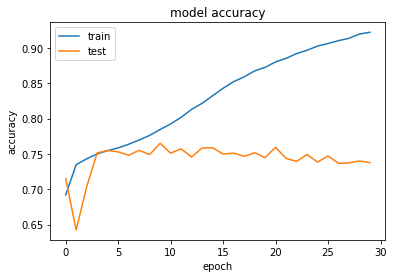

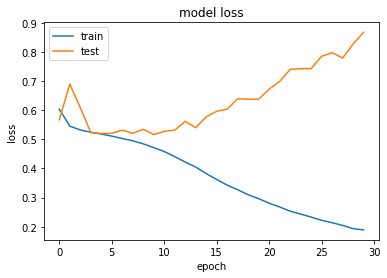

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0.6239 - acc: 0.6821 - val_loss: 0.5568 - val_acc: 0.7250
Epoch 2/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5518 - acc: 0.7296 - val_loss: 0.5356 - val_acc: 0.7434
Epoch 3/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5340 - acc: 0.7425 - val_loss: 0.5291 - val_acc: 0.7483
Epoch 4/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5265 - acc: 0.7474 - val_loss: 0.5423 - val_acc: 0.7322
Epoch 5/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5185 - acc: 0.7527 - val_loss: 0.5216 - val_acc: 0.7527
Epoch 6/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5123 - acc: 0.7582 - val_loss: 0.5219 - val_acc: 0.7520
Epoch 7/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5039 

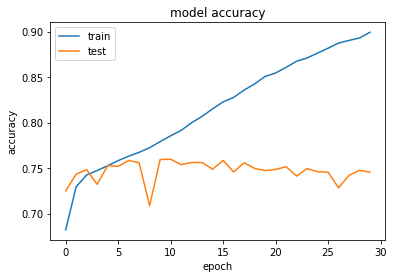

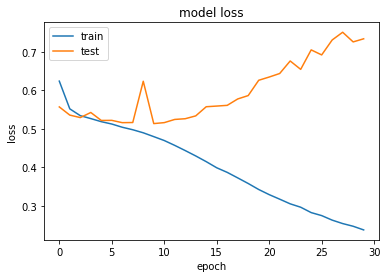

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 156us/sample - loss: 0.6105 - acc: 0.6888 - val_loss: 0.5474 - val_acc: 0.7332
Epoch 2/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.5458 - acc: 0.7338 - val_loss: 0.6250 - val_acc: 0.6647
Epoch 3/30
80000/80000 [==============================] - 10s 119us/sample - loss: 0.5327 - acc: 0.7417 - val_loss: 0.6722 - val_acc: 0.6428
Epoch 4/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.5255 - acc: 0.7478 - val_loss: 0.5466 - val_acc: 0.7364
Epoch 5/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.5177 - acc: 0.7520 - val_loss: 0.5195 - val_acc: 0.7567
Epoch 6/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.5107 - acc: 0.7579 - val_loss: 0.5153 - val_acc: 0.7595
Epoch 7/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0

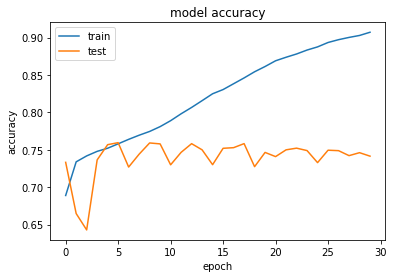

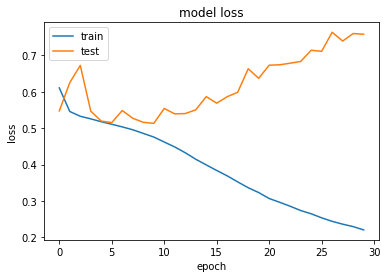

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 169us/sample - loss: 0.6156 - acc: 0.6886 - val_loss: 0.5414 - val_acc: 0.7345
Epoch 2/30
80000/80000 [==============================] - 11s 131us/sample - loss: 0.5469 - acc: 0.7316 - val_loss: 0.5422 - val_acc: 0.7371
Epoch 3/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5334 - acc: 0.7426 - val_loss: 0.6238 - val_acc: 0.6902
Epoch 4/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5260 - acc: 0.7475 - val_loss: 0.5588 - val_acc: 0.7233
Epoch 5/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5200 - acc: 0.7518 - val_loss: 0.5326 - val_acc: 0.7426
Epoch 6/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5143 - acc: 0.7555 - val_loss: 0.5131 - val_acc: 0.7602
Epoch 7/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0

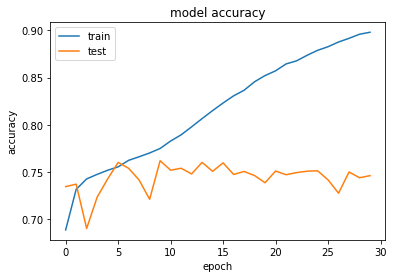

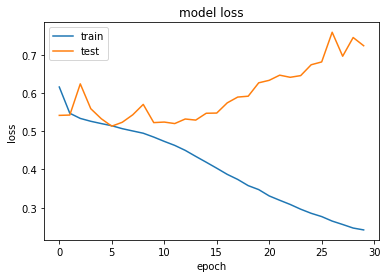

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 148us/sample - loss: 0.6007 - acc: 0.6924 - val_loss: 0.5547 - val_acc: 0.7285
Epoch 2/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5438 - acc: 0.7344 - val_loss: 0.5312 - val_acc: 0.7430
Epoch 3/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.5313 - acc: 0.7434 - val_loss: 0.5464 - val_acc: 0.7336
Epoch 4/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.5252 - acc: 0.7474 - val_loss: 0.5180 - val_acc: 0.7556
Epoch 5/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5172 - acc: 0.7538 - val_loss: 0.5393 - val_acc: 0.7445
Epoch 6/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5110 - acc: 0.7565 - val_loss: 0.5871 - val_acc: 0.6987
Epoch 7/30
80000/80000 [==============================] - 9s 111us/sample - loss: 0.5048 

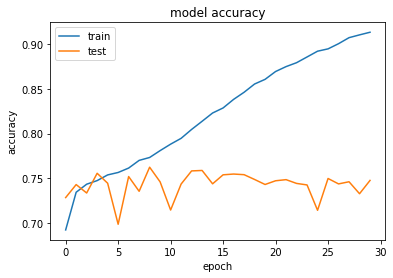

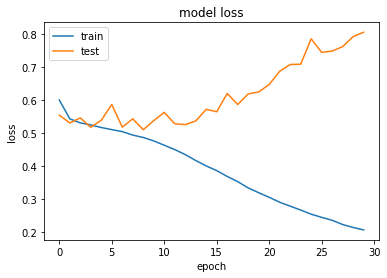

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 168us/sample - loss: 0.5969 - acc: 0.6960 - val_loss: 0.5520 - val_acc: 0.7287
Epoch 2/30
80000/80000 [==============================] - 10s 126us/sample - loss: 0.5427 - acc: 0.7354 - val_loss: 0.5698 - val_acc: 0.7200
Epoch 3/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0.5312 - acc: 0.7433 - val_loss: 0.5249 - val_acc: 0.7444
Epoch 4/30
80000/80000 [==============================] - 10s 126us/sample - loss: 0.5214 - acc: 0.7501 - val_loss: 0.5247 - val_acc: 0.7538
Epoch 5/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0.5147 - acc: 0.7549 - val_loss: 0.5158 - val_acc: 0.7560
Epoch 6/30
80000/80000 [==============================] - 10s 126us/sample - loss: 0.5072 - acc: 0.7600 - val_loss: 0.5322 - val_acc: 0.7423
Epoch 7/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0

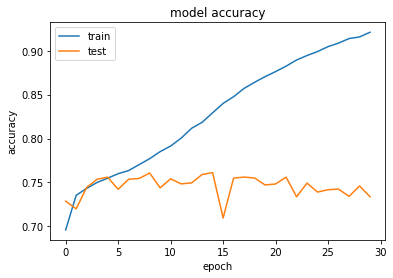

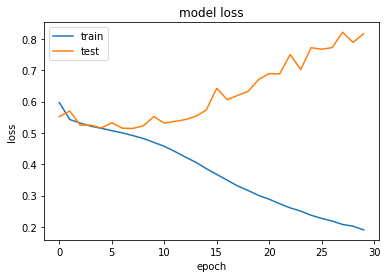

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 181us/sample - loss: 0.6030 - acc: 0.6948 - val_loss: 0.5657 - val_acc: 0.7191
Epoch 2/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.5452 - acc: 0.7348 - val_loss: 0.6272 - val_acc: 0.6931
Epoch 3/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.5321 - acc: 0.7417 - val_loss: 0.5477 - val_acc: 0.7344
Epoch 4/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.5242 - acc: 0.7502 - val_loss: 0.5264 - val_acc: 0.7484
Epoch 5/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0.5173 - acc: 0.7546 - val_loss: 0.5336 - val_acc: 0.7389
Epoch 6/30
80000/80000 [==============================] - 11s 138us/sample - loss: 0.5105 - acc: 0.7592 - val_loss: 0.5322 - val_acc: 0.7440
Epoch 7/30
80000/80000 [==============================] - 11s 139us/sample - loss: 0

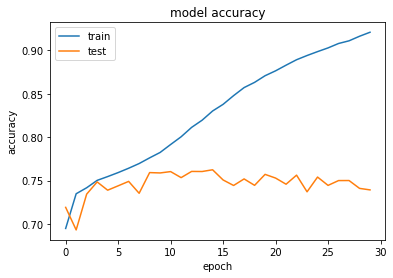

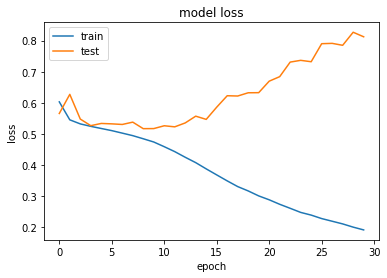

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.5982 - acc: 0.6950 - val_loss: 0.5476 - val_acc: 0.7303
Epoch 2/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5499 - acc: 0.7298 - val_loss: 0.5470 - val_acc: 0.7362
Epoch 3/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.5404 - acc: 0.7372 - val_loss: 0.5366 - val_acc: 0.7484
Epoch 4/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5325 - acc: 0.7431 - val_loss: 0.5304 - val_acc: 0.7467
Epoch 5/30
80000/80000 [==============================] - 7s 82us/sample - loss: 0.5274 - acc: 0.7482 - val_loss: 0.5226 - val_acc: 0.7519
Epoch 6/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5228 - acc: 0.7503 - val_loss: 0.5285 - val_acc: 0.7423
Epoch 7/30
80000/80000 [==============================] - 7s 81us/sample - loss: 0.5190 - acc:

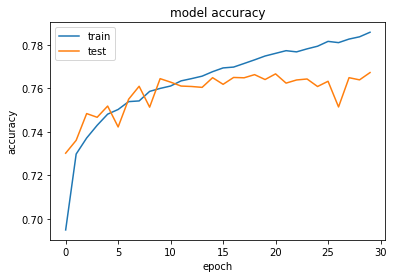

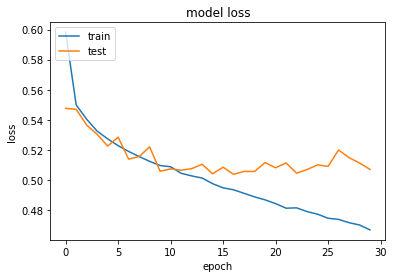

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 133us/sample - loss: 0.6229 - acc: 0.6856 - val_loss: 0.5514 - val_acc: 0.7281
Epoch 2/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5506 - acc: 0.7305 - val_loss: 0.5285 - val_acc: 0.7458
Epoch 3/30
80000/80000 [==============================] - 7s 93us/sample - loss: 0.5353 - acc: 0.7420 - val_loss: 0.5477 - val_acc: 0.7321
Epoch 4/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5286 - acc: 0.7457 - val_loss: 0.5474 - val_acc: 0.7312
Epoch 5/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5244 - acc: 0.7498 - val_loss: 0.5165 - val_acc: 0.7542
Epoch 6/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5192 - acc: 0.7541 - val_loss: 0.5139 - val_acc: 0.7585
Epoch 7/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5163 - acc:

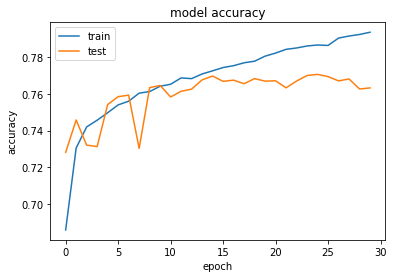

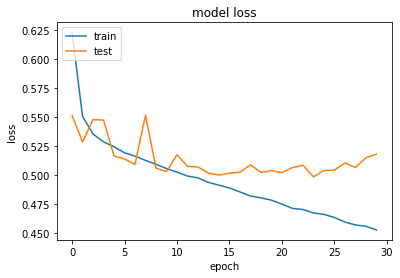

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.5980 - acc: 0.6948 - val_loss: 0.5476 - val_acc: 0.7318
Epoch 2/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5474 - acc: 0.7323 - val_loss: 0.5291 - val_acc: 0.7462
Epoch 3/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5343 - acc: 0.7436 - val_loss: 0.5224 - val_acc: 0.7534
Epoch 4/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5268 - acc: 0.7480 - val_loss: 0.5182 - val_acc: 0.7546
Epoch 5/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5222 - acc: 0.7512 - val_loss: 0.5115 - val_acc: 0.7596
Epoch 6/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5174 - acc: 0.7548 - val_loss: 0.5101 - val_acc: 0.7595
Epoch 7/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5136 

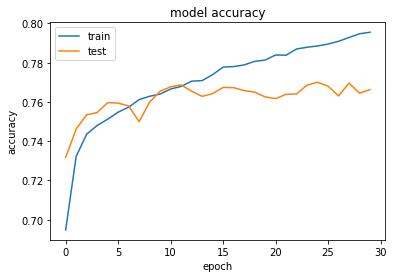

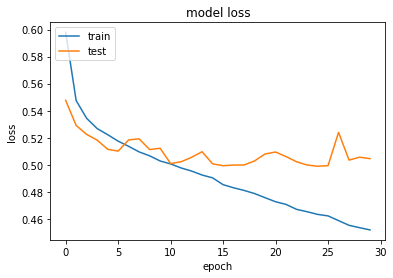

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 10s 126us/sample - loss: 0.5950 - acc: 0.6977 - val_loss: 0.5646 - val_acc: 0.7128
Epoch 2/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5482 - acc: 0.7313 - val_loss: 0.5356 - val_acc: 0.7423
Epoch 3/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5348 - acc: 0.7420 - val_loss: 0.5280 - val_acc: 0.7488
Epoch 4/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5276 - acc: 0.7470 - val_loss: 0.5170 - val_acc: 0.7553
Epoch 5/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5234 - acc: 0.7491 - val_loss: 0.5192 - val_acc: 0.7573
Epoch 6/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5186 - acc: 0.7527 - val_loss: 0.5140 - val_acc: 0.7575
Epoch 7/30
80000/80000 [==============================] - 7s 85us/sample - loss: 0.5139 - acc:

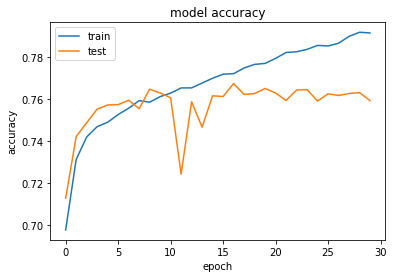

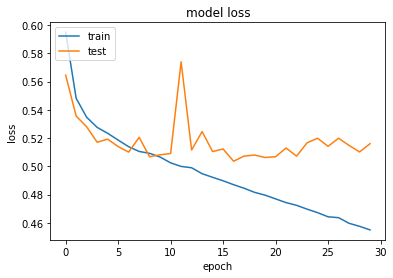

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 140us/sample - loss: 0.6095 - acc: 0.6917 - val_loss: 0.5485 - val_acc: 0.7296
Epoch 2/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.5473 - acc: 0.7333 - val_loss: 0.5375 - val_acc: 0.7386
Epoch 3/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.5350 - acc: 0.7426 - val_loss: 0.5528 - val_acc: 0.7345
Epoch 4/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.5272 - acc: 0.7491 - val_loss: 0.5142 - val_acc: 0.7592
Epoch 5/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.5226 - acc: 0.7518 - val_loss: 0.5164 - val_acc: 0.7565
Epoch 6/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.5176 - acc: 0.7546 - val_loss: 0.5286 - val_acc: 0.7454
Epoch 7/30
80000/80000 [==============================] - 8s 97us/sample - loss: 0.5132 - acc:

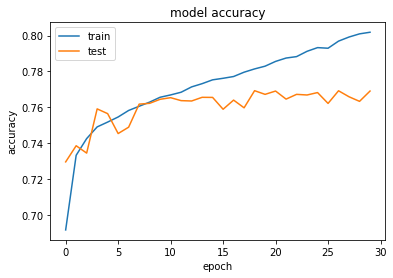

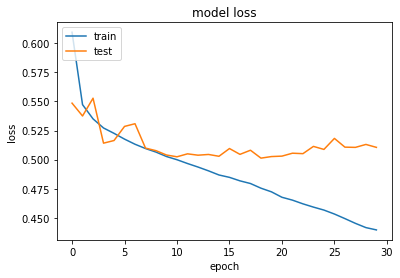

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 155us/sample - loss: 0.5973 - acc: 0.6963 - val_loss: 0.5447 - val_acc: 0.7311
Epoch 2/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5466 - acc: 0.7321 - val_loss: 0.5441 - val_acc: 0.7304
Epoch 3/30
80000/80000 [==============================] - 9s 108us/sample - loss: 0.5327 - acc: 0.7436 - val_loss: 0.5326 - val_acc: 0.7454
Epoch 4/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5256 - acc: 0.7501 - val_loss: 0.5182 - val_acc: 0.7573
Epoch 5/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5217 - acc: 0.7518 - val_loss: 0.5260 - val_acc: 0.7462
Epoch 6/30
80000/80000 [==============================] - 9s 108us/sample - loss: 0.5163 - acc: 0.7562 - val_loss: 0.5316 - val_acc: 0.7441
Epoch 7/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5131 

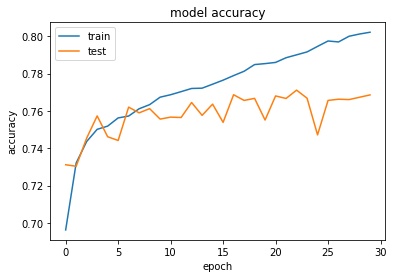

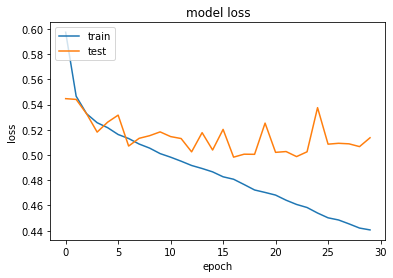

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 149us/sample - loss: 0.6025 - acc: 0.6967 - val_loss: 0.5406 - val_acc: 0.7379
Epoch 2/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5469 - acc: 0.7338 - val_loss: 0.5337 - val_acc: 0.7422
Epoch 3/30
80000/80000 [==============================] - 8s 104us/sample - loss: 0.5340 - acc: 0.7429 - val_loss: 0.5271 - val_acc: 0.7491
Epoch 4/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5271 - acc: 0.7480 - val_loss: 0.5427 - val_acc: 0.7478
Epoch 5/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5218 - acc: 0.7510 - val_loss: 0.5290 - val_acc: 0.7472
Epoch 6/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5162 - acc: 0.7573 - val_loss: 0.5149 - val_acc: 0.7595
Epoch 7/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5118 

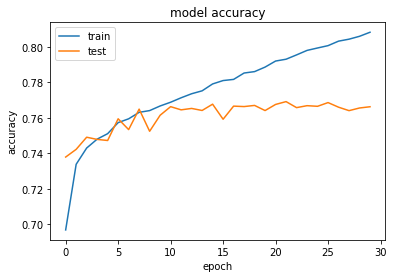

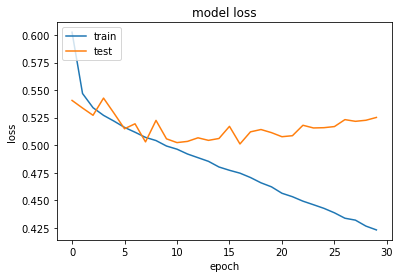

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 162us/sample - loss: 0.5988 - acc: 0.6944 - val_loss: 0.5492 - val_acc: 0.7311
Epoch 2/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5492 - acc: 0.7322 - val_loss: 0.5307 - val_acc: 0.7467
Epoch 3/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5357 - acc: 0.7430 - val_loss: 0.5289 - val_acc: 0.7460
Epoch 4/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5270 - acc: 0.7483 - val_loss: 0.5216 - val_acc: 0.7517
Epoch 5/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5208 - acc: 0.7525 - val_loss: 0.5410 - val_acc: 0.7459
Epoch 6/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5172 - acc: 0.7554 - val_loss: 0.5105 - val_acc: 0.7599
Epoch 7/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5123 

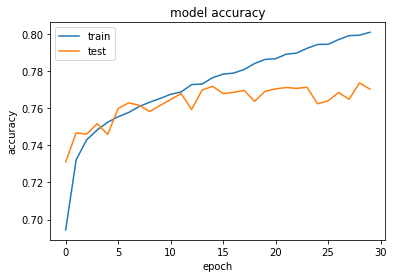

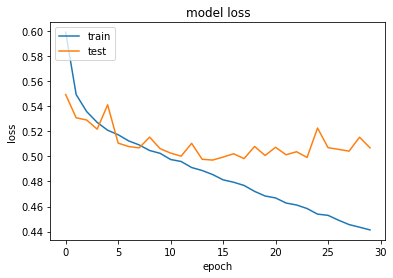

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 175us/sample - loss: 0.6156 - acc: 0.6896 - val_loss: 0.5495 - val_acc: 0.7289
Epoch 2/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5540 - acc: 0.7280 - val_loss: 0.5416 - val_acc: 0.7360
Epoch 3/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5423 - acc: 0.7364 - val_loss: 0.5276 - val_acc: 0.7489
Epoch 4/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5332 - acc: 0.7436 - val_loss: 0.5290 - val_acc: 0.7483
Epoch 5/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5268 - acc: 0.7478 - val_loss: 0.5278 - val_acc: 0.7532
Epoch 6/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5218 - acc: 0.7507 - val_loss: 0.5168 - val_acc: 0.7589
Epoch 7/30
80000/80000 [==============================] - 10s 127us/sample - loss: 0

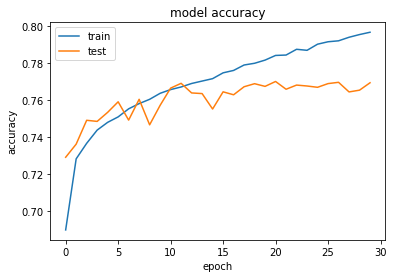

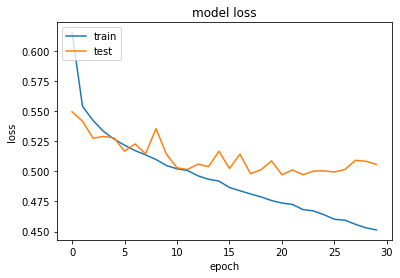

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.5978 - acc: 0.7006 - val_loss: 0.5470 - val_acc: 0.7359
Epoch 2/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5457 - acc: 0.7350 - val_loss: 0.5456 - val_acc: 0.7331
Epoch 3/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5326 - acc: 0.7440 - val_loss: 0.5330 - val_acc: 0.7398
Epoch 4/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5233 - acc: 0.7494 - val_loss: 0.5219 - val_acc: 0.7535
Epoch 5/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5185 - acc: 0.7545 - val_loss: 0.5116 - val_acc: 0.7587
Epoch 6/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5146 - acc: 0.7560 - val_loss: 0.5434 - val_acc: 0.7423
Epoch 7/30
80000/80000 [==============================] - 9s 107us/sample - loss: 0.5101 

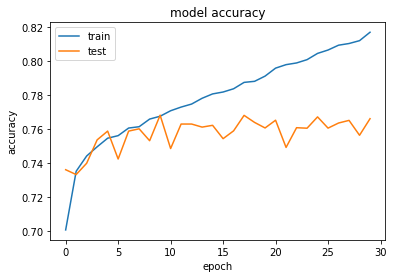

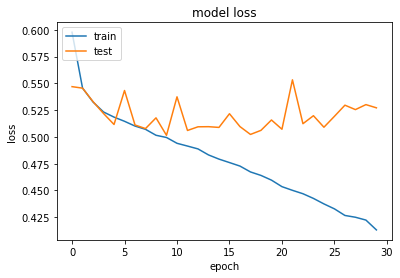

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 170us/sample - loss: 0.6077 - acc: 0.6935 - val_loss: 0.5466 - val_acc: 0.7329
Epoch 2/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5475 - acc: 0.7322 - val_loss: 0.5846 - val_acc: 0.7243
Epoch 3/30
80000/80000 [==============================] - 9s 117us/sample - loss: 0.5353 - acc: 0.7408 - val_loss: 0.5438 - val_acc: 0.7344
Epoch 4/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5288 - acc: 0.7481 - val_loss: 0.5238 - val_acc: 0.7533
Epoch 5/30
80000/80000 [==============================] - 9s 117us/sample - loss: 0.5225 - acc: 0.7520 - val_loss: 0.5220 - val_acc: 0.7528
Epoch 6/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5179 - acc: 0.7538 - val_loss: 0.5246 - val_acc: 0.7512
Epoch 7/30
80000/80000 [==============================] - 9s 117us/sample - loss: 0.5121 

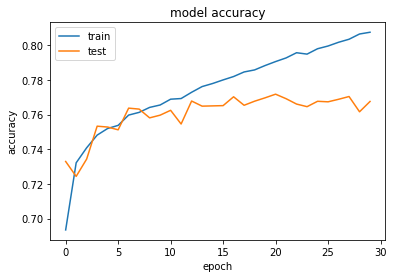

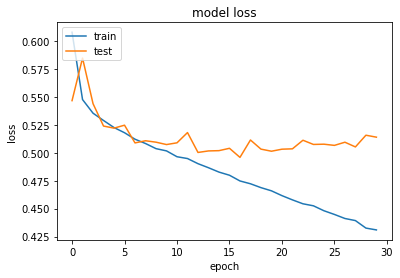

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.6081 - acc: 0.6922 - val_loss: 0.5468 - val_acc: 0.7332
Epoch 2/30
80000/80000 [==============================] - 10s 129us/sample - loss: 0.5486 - acc: 0.7317 - val_loss: 0.5418 - val_acc: 0.7357
Epoch 3/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.5350 - acc: 0.7432 - val_loss: 0.5205 - val_acc: 0.7553
Epoch 4/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.5258 - acc: 0.7485 - val_loss: 0.5262 - val_acc: 0.7507
Epoch 5/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.5215 - acc: 0.7521 - val_loss: 0.5229 - val_acc: 0.7501
Epoch 6/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0.5168 - acc: 0.7557 - val_loss: 0.5229 - val_acc: 0.7579
Epoch 7/30
80000/80000 [==============================] - 10s 128us/sample - loss: 0

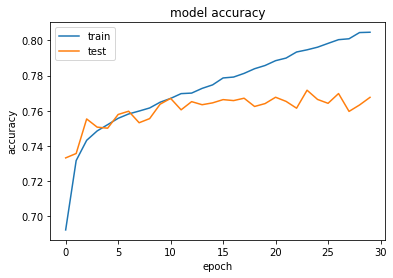

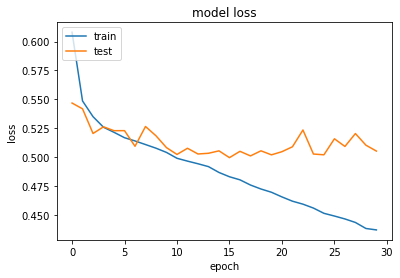

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 11s 143us/sample - loss: 0.5979 - acc: 0.6972 - val_loss: 0.5719 - val_acc: 0.7150
Epoch 2/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.5477 - acc: 0.7315 - val_loss: 0.5333 - val_acc: 0.7398
Epoch 3/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.5349 - acc: 0.7415 - val_loss: 0.5255 - val_acc: 0.7481
Epoch 4/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.5255 - acc: 0.7492 - val_loss: 0.5195 - val_acc: 0.7544
Epoch 5/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.5183 - acc: 0.7540 - val_loss: 0.5132 - val_acc: 0.7606
Epoch 6/30
80000/80000 [==============================] - 7s 91us/sample - loss: 0.5128 - acc: 0.7577 - val_loss: 0.5110 - val_acc: 0.7602
Epoch 7/30
80000/80000 [==============================] - 7s 92us/sample - loss: 0.5080 - acc:

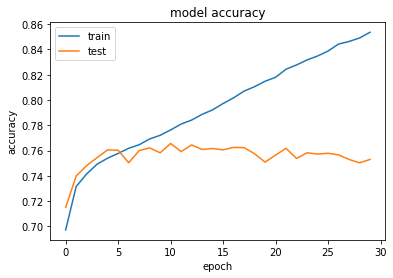

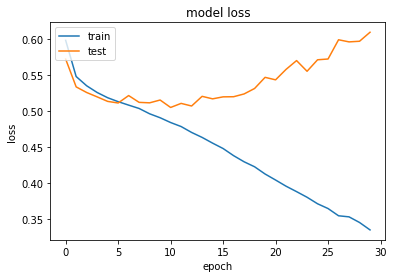

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.5890 - acc: 0.7041 - val_loss: 0.5433 - val_acc: 0.7333
Epoch 2/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5449 - acc: 0.7337 - val_loss: 0.5340 - val_acc: 0.7413
Epoch 3/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5333 - acc: 0.7431 - val_loss: 0.5288 - val_acc: 0.7473
Epoch 4/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5253 - acc: 0.7492 - val_loss: 0.5307 - val_acc: 0.7452
Epoch 5/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5186 - acc: 0.7533 - val_loss: 0.5141 - val_acc: 0.7557
Epoch 6/30
80000/80000 [==============================] - 8s 103us/sample - loss: 0.5110 - acc: 0.7593 - val_loss: 0.5255 - val_acc: 0.7505
Epoch 7/30
80000/80000 [==============================] - 8s 102us/sample - loss: 0.5051 

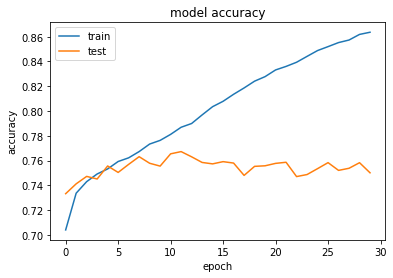

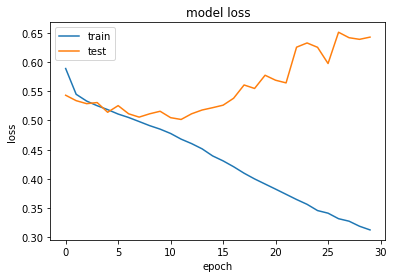

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 171us/sample - loss: 0.5947 - acc: 0.7023 - val_loss: 0.5561 - val_acc: 0.7222
Epoch 2/30
80000/80000 [==============================] - 9s 115us/sample - loss: 0.5472 - acc: 0.7323 - val_loss: 0.5450 - val_acc: 0.7323
Epoch 3/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5355 - acc: 0.7415 - val_loss: 0.5293 - val_acc: 0.7460
Epoch 4/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5277 - acc: 0.7467 - val_loss: 0.5207 - val_acc: 0.7499
Epoch 5/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5212 - acc: 0.7516 - val_loss: 0.5187 - val_acc: 0.7539
Epoch 6/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5136 - acc: 0.7579 - val_loss: 0.5180 - val_acc: 0.7522
Epoch 7/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5076 

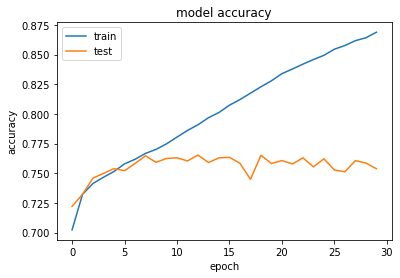

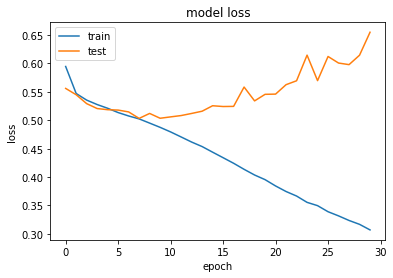

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 12s 149us/sample - loss: 0.5965 - acc: 0.6998 - val_loss: 0.5456 - val_acc: 0.7311
Epoch 2/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.5477 - acc: 0.7308 - val_loss: 0.5338 - val_acc: 0.7438
Epoch 3/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.5353 - acc: 0.7410 - val_loss: 0.5571 - val_acc: 0.7237
Epoch 4/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.5263 - acc: 0.7490 - val_loss: 0.5178 - val_acc: 0.7545
Epoch 5/30
80000/80000 [==============================] - 8s 94us/sample - loss: 0.5184 - acc: 0.7544 - val_loss: 0.5191 - val_acc: 0.7528
Epoch 6/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.5138 - acc: 0.7561 - val_loss: 0.5153 - val_acc: 0.7578
Epoch 7/30
80000/80000 [==============================] - 8s 95us/sample - loss: 0.5070 - acc:

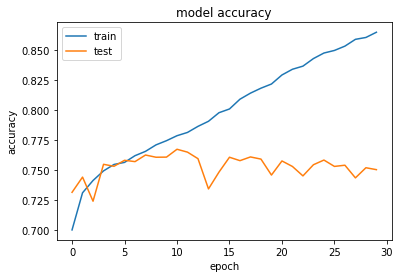

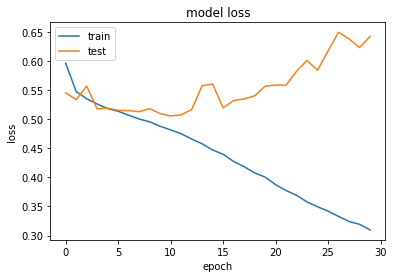

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 13s 166us/sample - loss: 0.5964 - acc: 0.7004 - val_loss: 0.5373 - val_acc: 0.7373
Epoch 2/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5431 - acc: 0.7352 - val_loss: 0.5344 - val_acc: 0.7416
Epoch 3/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5304 - acc: 0.7446 - val_loss: 0.5293 - val_acc: 0.7462
Epoch 4/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5236 - acc: 0.7504 - val_loss: 0.5178 - val_acc: 0.7550
Epoch 5/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5163 - acc: 0.7569 - val_loss: 0.5217 - val_acc: 0.7565
Epoch 6/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5085 - acc: 0.7608 - val_loss: 0.5167 - val_acc: 0.7564
Epoch 7/30
80000/80000 [==============================] - 9s 109us/sample - loss: 0.5021 

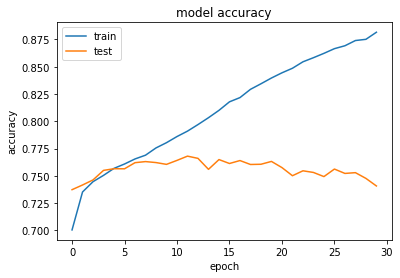

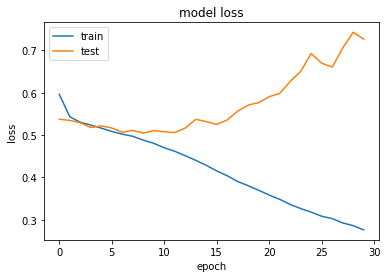

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 181us/sample - loss: 0.6073 - acc: 0.6970 - val_loss: 0.5408 - val_acc: 0.7360
Epoch 2/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5466 - acc: 0.7336 - val_loss: 0.5401 - val_acc: 0.7362
Epoch 3/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5318 - acc: 0.7436 - val_loss: 0.5294 - val_acc: 0.7429
Epoch 4/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5242 - acc: 0.7490 - val_loss: 0.5150 - val_acc: 0.7559
Epoch 5/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0.5160 - acc: 0.7556 - val_loss: 0.5213 - val_acc: 0.7519
Epoch 6/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5092 - acc: 0.7609 - val_loss: 0.5107 - val_acc: 0.7625
Epoch 7/30
80000/80000 [==============================] - 10s 120us/sample - loss: 0

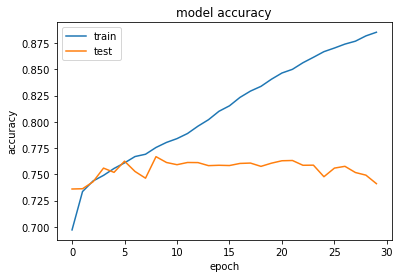

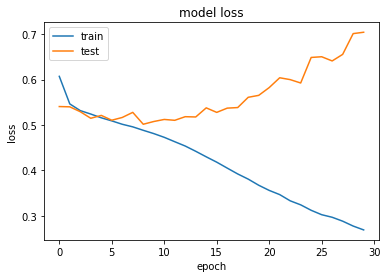

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 14s 173us/sample - loss: 0.5978 - acc: 0.7009 - val_loss: 0.5447 - val_acc: 0.7329
Epoch 2/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5475 - acc: 0.7316 - val_loss: 0.5349 - val_acc: 0.7426
Epoch 3/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5349 - acc: 0.7423 - val_loss: 0.5336 - val_acc: 0.7432
Epoch 4/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5250 - acc: 0.7497 - val_loss: 0.5405 - val_acc: 0.7374
Epoch 5/30
80000/80000 [==============================] - 9s 114us/sample - loss: 0.5173 - acc: 0.7552 - val_loss: 0.5214 - val_acc: 0.7547
Epoch 6/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5097 - acc: 0.7604 - val_loss: 0.5093 - val_acc: 0.7620
Epoch 7/30
80000/80000 [==============================] - 9s 113us/sample - loss: 0.5029 

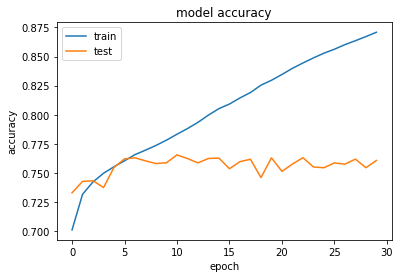

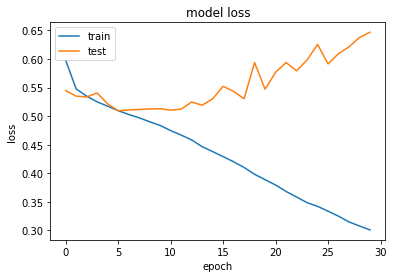

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 188us/sample - loss: 0.5933 - acc: 0.7015 - val_loss: 0.5463 - val_acc: 0.7340
Epoch 2/30
80000/80000 [==============================] - 10s 124us/sample - loss: 0.5458 - acc: 0.7329 - val_loss: 0.5673 - val_acc: 0.7223
Epoch 3/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5324 - acc: 0.7440 - val_loss: 0.5269 - val_acc: 0.7469
Epoch 4/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5232 - acc: 0.7508 - val_loss: 0.5259 - val_acc: 0.7518
Epoch 5/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5159 - acc: 0.7562 - val_loss: 0.5198 - val_acc: 0.7589
Epoch 6/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0.5091 - acc: 0.7613 - val_loss: 0.5458 - val_acc: 0.7418
Epoch 7/30
80000/80000 [==============================] - 10s 123us/sample - loss: 0

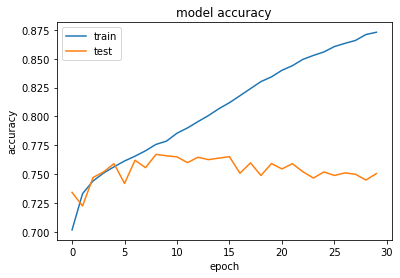

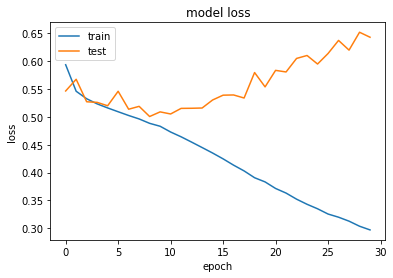

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 16s 203us/sample - loss: 0.5952 - acc: 0.7012 - val_loss: 0.5470 - val_acc: 0.7358
Epoch 2/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5463 - acc: 0.7328 - val_loss: 0.5434 - val_acc: 0.7301
Epoch 3/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5345 - acc: 0.7412 - val_loss: 0.5513 - val_acc: 0.7291
Epoch 4/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5265 - acc: 0.7478 - val_loss: 0.5316 - val_acc: 0.7482
Epoch 5/30
80000/80000 [==============================] - 11s 136us/sample - loss: 0.5190 - acc: 0.7544 - val_loss: 0.5156 - val_acc: 0.7564
Epoch 6/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5129 - acc: 0.7589 - val_loss: 0.5097 - val_acc: 0.7619
Epoch 7/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0

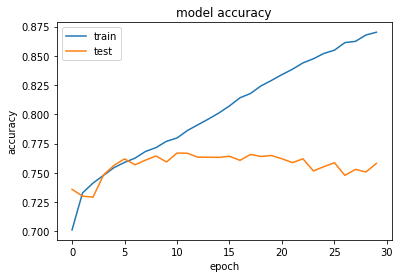

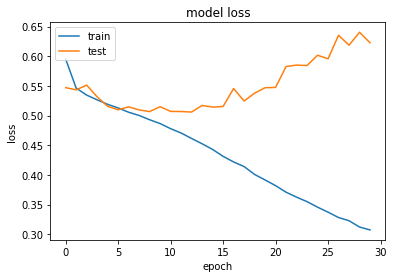

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 185us/sample - loss: 0.5932 - acc: 0.7026 - val_loss: 0.5416 - val_acc: 0.7373
Epoch 2/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5441 - acc: 0.7345 - val_loss: 0.5306 - val_acc: 0.7435
Epoch 3/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5318 - acc: 0.7444 - val_loss: 0.5249 - val_acc: 0.7495
Epoch 4/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5214 - acc: 0.7514 - val_loss: 0.5352 - val_acc: 0.7394
Epoch 5/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5141 - acc: 0.7588 - val_loss: 0.5101 - val_acc: 0.7618
Epoch 6/30
80000/80000 [==============================] - 9s 118us/sample - loss: 0.5080 - acc: 0.7614 - val_loss: 0.5161 - val_acc: 0.7558
Epoch 7/30
80000/80000 [==============================] - 10s 119us/sample - loss: 0.5021

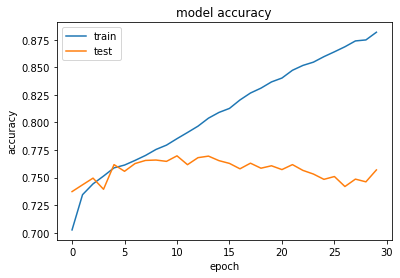

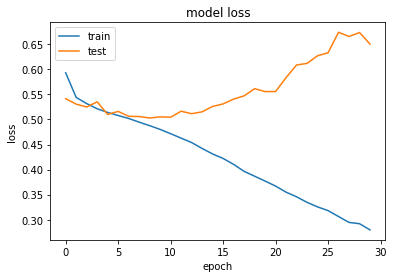

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 16s 203us/sample - loss: 0.5916 - acc: 0.7031 - val_loss: 0.5430 - val_acc: 0.7334
Epoch 2/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5439 - acc: 0.7353 - val_loss: 0.5650 - val_acc: 0.7194
Epoch 3/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5321 - acc: 0.7434 - val_loss: 0.5610 - val_acc: 0.7222
Epoch 4/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5232 - acc: 0.7506 - val_loss: 0.5302 - val_acc: 0.7469
Epoch 5/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5151 - acc: 0.7563 - val_loss: 0.5195 - val_acc: 0.7538
Epoch 6/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0.5085 - acc: 0.7605 - val_loss: 0.5347 - val_acc: 0.7424
Epoch 7/30
80000/80000 [==============================] - 10s 130us/sample - loss: 0

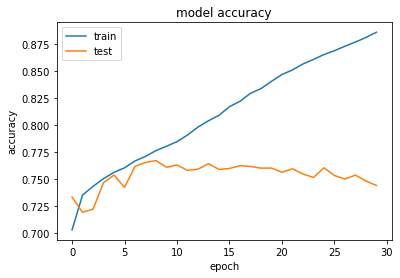

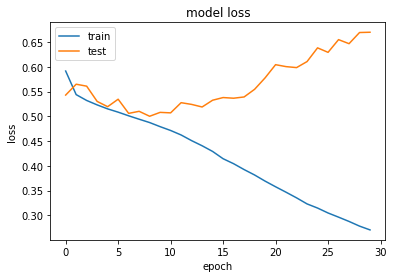

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 18s 221us/sample - loss: 0.6042 - acc: 0.6974 - val_loss: 0.5533 - val_acc: 0.7268
Epoch 2/30
80000/80000 [==============================] - 11s 142us/sample - loss: 0.5480 - acc: 0.7316 - val_loss: 0.5349 - val_acc: 0.7442
Epoch 3/30
80000/80000 [==============================] - 11s 142us/sample - loss: 0.5343 - acc: 0.7400 - val_loss: 0.5334 - val_acc: 0.7386
Epoch 4/30
80000/80000 [==============================] - 11s 143us/sample - loss: 0.5255 - acc: 0.7489 - val_loss: 0.5240 - val_acc: 0.7494
Epoch 5/30
80000/80000 [==============================] - 11s 143us/sample - loss: 0.5184 - acc: 0.7537 - val_loss: 0.5120 - val_acc: 0.7600
Epoch 6/30
80000/80000 [==============================] - 11s 142us/sample - loss: 0.5112 - acc: 0.7584 - val_loss: 0.5130 - val_acc: 0.7600
Epoch 7/30
80000/80000 [==============================] - 11s 143us/sample - loss: 0

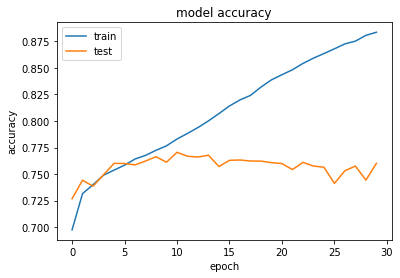

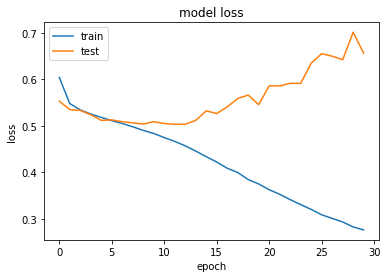

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 15s 184us/sample - loss: 0.5840 - acc: 0.7060 - val_loss: 0.5468 - val_acc: 0.7318
Epoch 2/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5464 - acc: 0.7331 - val_loss: 0.5402 - val_acc: 0.7375
Epoch 3/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5345 - acc: 0.7427 - val_loss: 0.5303 - val_acc: 0.7455
Epoch 4/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5250 - acc: 0.7481 - val_loss: 0.5218 - val_acc: 0.7523
Epoch 5/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5176 - acc: 0.7541 - val_loss: 0.5172 - val_acc: 0.7581
Epoch 6/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5091 - acc: 0.7606 - val_loss: 0.5253 - val_acc: 0.7498
Epoch 7/30
80000/80000 [==============================] - 9s 112us/sample - loss: 0.5042 

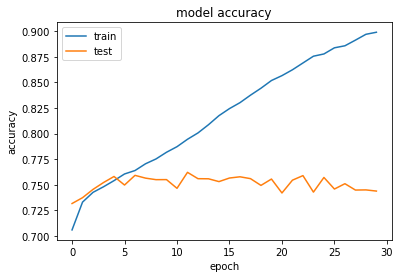

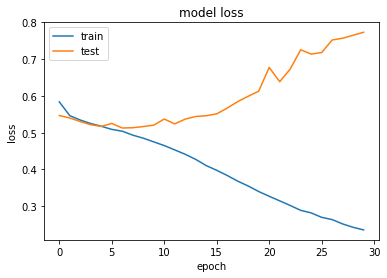

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 17s 207us/sample - loss: 0.6031 - acc: 0.6970 - val_loss: 0.6278 - val_acc: 0.6902
Epoch 2/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.5456 - acc: 0.7354 - val_loss: 0.5477 - val_acc: 0.7305
Epoch 3/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.5335 - acc: 0.7418 - val_loss: 0.5452 - val_acc: 0.7385
Epoch 4/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.5238 - acc: 0.7506 - val_loss: 0.5399 - val_acc: 0.7378
Epoch 5/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.5154 - acc: 0.7563 - val_loss: 0.5142 - val_acc: 0.7588
Epoch 6/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0.5072 - acc: 0.7625 - val_loss: 0.5103 - val_acc: 0.7574
Epoch 7/30
80000/80000 [==============================] - 11s 132us/sample - loss: 0

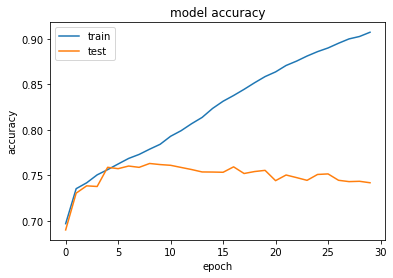

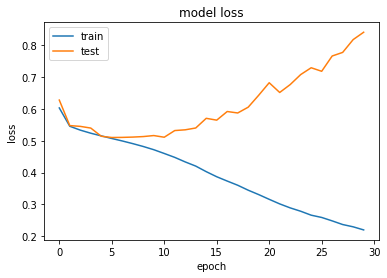

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 18s 227us/sample - loss: 0.5922 - acc: 0.7021 - val_loss: 0.6076 - val_acc: 0.6924
Epoch 2/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.5459 - acc: 0.7332 - val_loss: 0.5435 - val_acc: 0.7315
Epoch 3/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.5321 - acc: 0.7442 - val_loss: 0.5247 - val_acc: 0.7487
Epoch 4/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.5241 - acc: 0.7516 - val_loss: 0.5221 - val_acc: 0.7507
Epoch 5/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.5155 - acc: 0.7558 - val_loss: 0.5164 - val_acc: 0.7581
Epoch 6/30
80000/80000 [==============================] - 12s 146us/sample - loss: 0.5080 - acc: 0.7620 - val_loss: 0.5155 - val_acc: 0.7595
Epoch 7/30
80000/80000 [==============================] - 12s 147us/sample - loss: 0

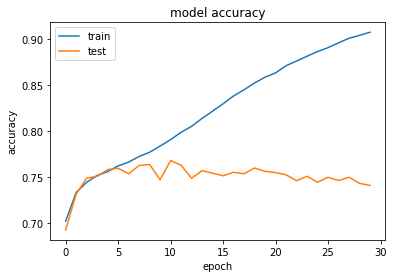

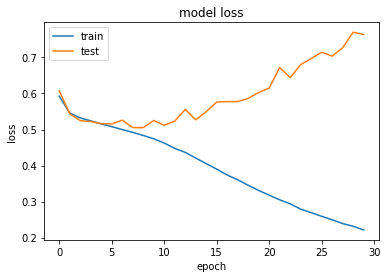

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 16s 199us/sample - loss: 0.6048 - acc: 0.6956 - val_loss: 0.5447 - val_acc: 0.7358
Epoch 2/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5488 - acc: 0.7319 - val_loss: 0.5466 - val_acc: 0.7318
Epoch 3/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5360 - acc: 0.7405 - val_loss: 0.5319 - val_acc: 0.7432
Epoch 4/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5272 - acc: 0.7470 - val_loss: 0.5649 - val_acc: 0.7136
Epoch 5/30
80000/80000 [==============================] - 10s 122us/sample - loss: 0.5193 - acc: 0.7536 - val_loss: 0.5311 - val_acc: 0.7444
Epoch 6/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0.5117 - acc: 0.7591 - val_loss: 0.5213 - val_acc: 0.7508
Epoch 7/30
80000/80000 [==============================] - 10s 121us/sample - loss: 0

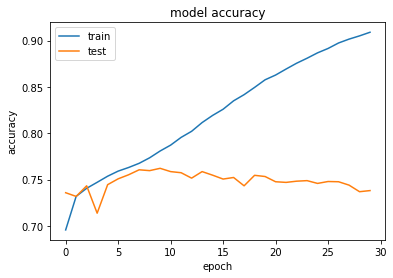

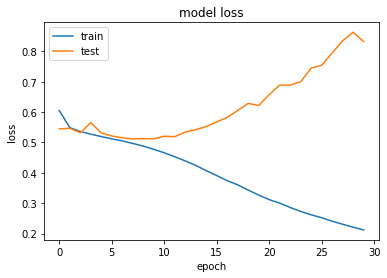

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 18s 225us/sample - loss: 0.5897 - acc: 0.7042 - val_loss: 0.5540 - val_acc: 0.7298
Epoch 2/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5451 - acc: 0.7327 - val_loss: 0.5437 - val_acc: 0.7354
Epoch 3/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5340 - acc: 0.7419 - val_loss: 0.5315 - val_acc: 0.7413
Epoch 4/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5250 - acc: 0.7485 - val_loss: 0.5369 - val_acc: 0.7417
Epoch 5/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5175 - acc: 0.7544 - val_loss: 0.5213 - val_acc: 0.7557
Epoch 6/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5083 - acc: 0.7599 - val_loss: 0.5152 - val_acc: 0.7575
Epoch 7/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0

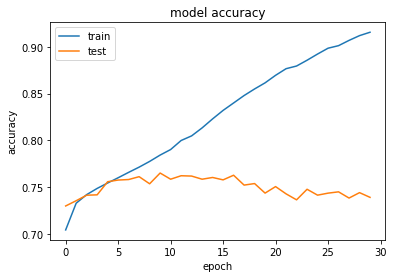

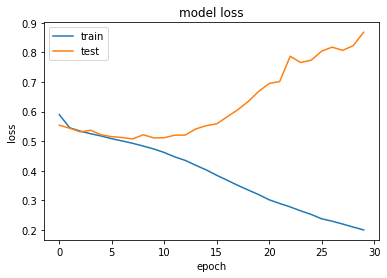

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 20s 245us/sample - loss: 0.5928 - acc: 0.7022 - val_loss: 0.5431 - val_acc: 0.7345
Epoch 2/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0.5460 - acc: 0.7337 - val_loss: 0.5358 - val_acc: 0.7426
Epoch 3/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0.5341 - acc: 0.7434 - val_loss: 0.5371 - val_acc: 0.7385
Epoch 4/30
80000/80000 [==============================] - 13s 157us/sample - loss: 0.5245 - acc: 0.7490 - val_loss: 0.5268 - val_acc: 0.7473
Epoch 5/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0.5158 - acc: 0.7577 - val_loss: 0.5442 - val_acc: 0.7372
Epoch 6/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0.5082 - acc: 0.7612 - val_loss: 0.5053 - val_acc: 0.7632
Epoch 7/30
80000/80000 [==============================] - 13s 158us/sample - loss: 0

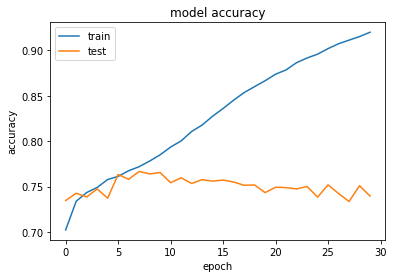

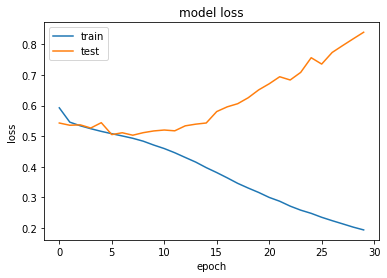

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 18s 220us/sample - loss: 0.5940 - acc: 0.7027 - val_loss: 0.5569 - val_acc: 0.7223
Epoch 2/30
80000/80000 [==============================] - 11s 135us/sample - loss: 0.5452 - acc: 0.7332 - val_loss: 0.5361 - val_acc: 0.7422
Epoch 3/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5349 - acc: 0.7407 - val_loss: 0.5480 - val_acc: 0.7327
Epoch 4/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5270 - acc: 0.7473 - val_loss: 0.5185 - val_acc: 0.7552
Epoch 5/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5178 - acc: 0.7539 - val_loss: 0.5221 - val_acc: 0.7537
Epoch 6/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0.5107 - acc: 0.7594 - val_loss: 0.5266 - val_acc: 0.7460
Epoch 7/30
80000/80000 [==============================] - 11s 134us/sample - loss: 0

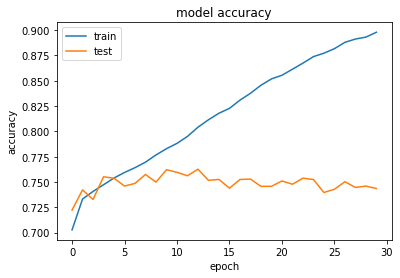

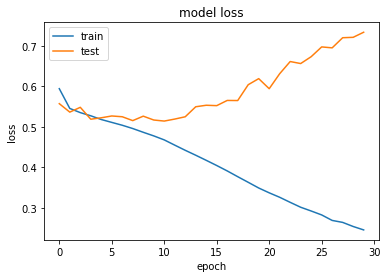

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 19s 241us/sample - loss: 0.5875 - acc: 0.7055 - val_loss: 0.5467 - val_acc: 0.7296
Epoch 2/30
80000/80000 [==============================] - 12s 153us/sample - loss: 0.5464 - acc: 0.7348 - val_loss: 0.5420 - val_acc: 0.7319
Epoch 3/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5342 - acc: 0.7422 - val_loss: 0.5269 - val_acc: 0.7484
Epoch 4/30
80000/80000 [==============================] - 12s 151us/sample - loss: 0.5252 - acc: 0.7497 - val_loss: 0.5142 - val_acc: 0.7580
Epoch 5/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5158 - acc: 0.7559 - val_loss: 0.5347 - val_acc: 0.7412
Epoch 6/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0.5095 - acc: 0.7612 - val_loss: 0.5156 - val_acc: 0.7559
Epoch 7/30
80000/80000 [==============================] - 12s 152us/sample - loss: 0

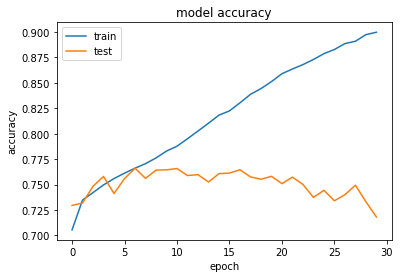

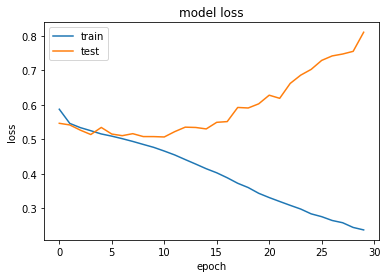

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 21s 260us/sample - loss: 0.5934 - acc: 0.7003 - val_loss: 0.5547 - val_acc: 0.7249
Epoch 2/30
80000/80000 [==============================] - 13s 166us/sample - loss: 0.5476 - acc: 0.7325 - val_loss: 0.5359 - val_acc: 0.7401
Epoch 3/30
80000/80000 [==============================] - 13s 167us/sample - loss: 0.5374 - acc: 0.7385 - val_loss: 0.5517 - val_acc: 0.7236
Epoch 4/30
80000/80000 [==============================] - 13s 166us/sample - loss: 0.5288 - acc: 0.7452 - val_loss: 0.5244 - val_acc: 0.7500
Epoch 5/30
80000/80000 [==============================] - 13s 166us/sample - loss: 0.5220 - acc: 0.7524 - val_loss: 0.5285 - val_acc: 0.7523
Epoch 6/30
80000/80000 [==============================] - 13s 166us/sample - loss: 0.5147 - acc: 0.7571 - val_loss: 0.5213 - val_acc: 0.7548
Epoch 7/30
80000/80000 [==============================] - 13s 166us/sample - loss: 0

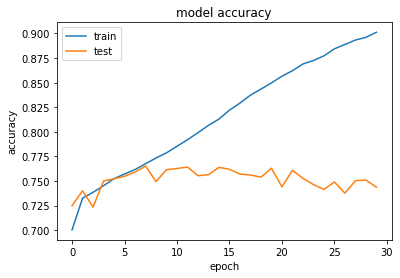

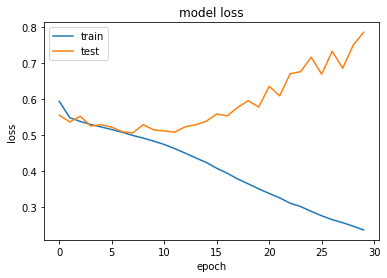

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 19s 236us/sample - loss: 0.5926 - acc: 0.7017 - val_loss: 0.5595 - val_acc: 0.7189
Epoch 2/30
80000/80000 [==============================] - 12s 145us/sample - loss: 0.5462 - acc: 0.7335 - val_loss: 0.5424 - val_acc: 0.7351
Epoch 3/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5345 - acc: 0.7421 - val_loss: 0.5563 - val_acc: 0.7301
Epoch 4/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5247 - acc: 0.7494 - val_loss: 0.5428 - val_acc: 0.7376
Epoch 5/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5182 - acc: 0.7561 - val_loss: 0.5396 - val_acc: 0.7384
Epoch 6/30
80000/80000 [==============================] - 12s 144us/sample - loss: 0.5099 - acc: 0.7604 - val_loss: 0.5130 - val_acc: 0.7587
Epoch 7/30
80000/80000 [==============================] - 11s 144us/sample - loss: 0

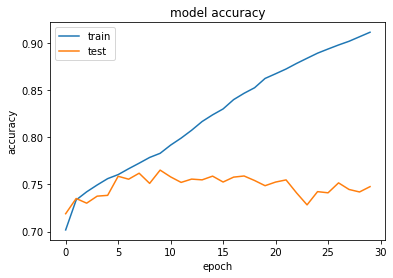

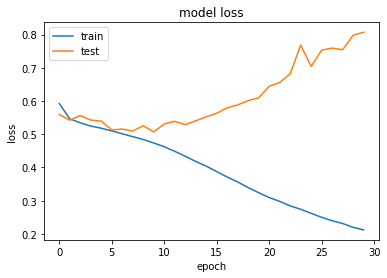

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 21s 263us/sample - loss: 0.5895 - acc: 0.7049 - val_loss: 0.5569 - val_acc: 0.7234
Epoch 2/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.5457 - acc: 0.7334 - val_loss: 0.5374 - val_acc: 0.7390
Epoch 3/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.5344 - acc: 0.7408 - val_loss: 0.5230 - val_acc: 0.7481
Epoch 4/30
80000/80000 [==============================] - 13s 163us/sample - loss: 0.5240 - acc: 0.7498 - val_loss: 0.5398 - val_acc: 0.7412
Epoch 5/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.5154 - acc: 0.7557 - val_loss: 0.5294 - val_acc: 0.7457
Epoch 6/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0.5074 - acc: 0.7615 - val_loss: 0.5063 - val_acc: 0.7628
Epoch 7/30
80000/80000 [==============================] - 13s 164us/sample - loss: 0

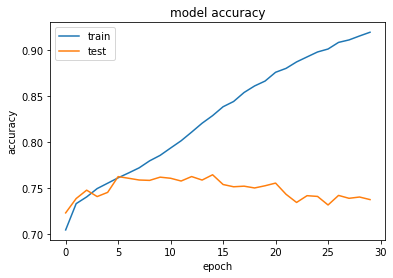

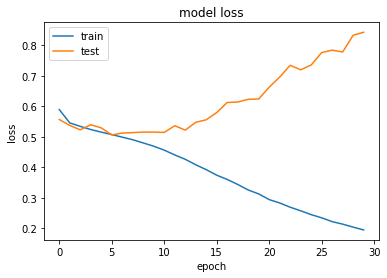

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0.5904 - acc: 0.7024 - val_loss: 0.5452 - val_acc: 0.7321
Epoch 2/30
80000/80000 [==============================] - 14s 181us/sample - loss: 0.5455 - acc: 0.7337 - val_loss: 0.5352 - val_acc: 0.7388
Epoch 3/30
80000/80000 [==============================] - 14s 181us/sample - loss: 0.5346 - acc: 0.7419 - val_loss: 0.5368 - val_acc: 0.7387
Epoch 4/30
80000/80000 [==============================] - 15s 181us/sample - loss: 0.5251 - acc: 0.7485 - val_loss: 0.5593 - val_acc: 0.7286
Epoch 5/30
80000/80000 [==============================] - 14s 181us/sample - loss: 0.5167 - acc: 0.7552 - val_loss: 0.5120 - val_acc: 0.7569
Epoch 6/30
80000/80000 [==============================] - 14s 181us/sample - loss: 0.5080 - acc: 0.7609 - val_loss: 0.5148 - val_acc: 0.7562
Epoch 7/30
80000/80000 [==============================] - 14s 181us/sample - loss: 0

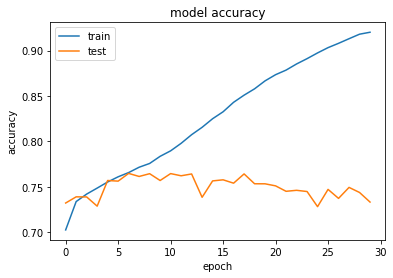

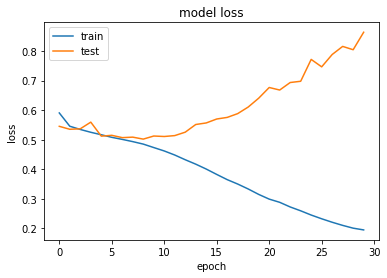

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 26s 325us/sample - loss: 0.6098 - acc: 0.6985 - val_loss: 0.5727 - val_acc: 0.7021
Epoch 2/30
80000/80000 [==============================] - 18s 223us/sample - loss: 0.5497 - acc: 0.7270 - val_loss: 0.5336 - val_acc: 0.7413
Epoch 3/30
80000/80000 [==============================] - 18s 223us/sample - loss: 0.5318 - acc: 0.7390 - val_loss: 0.5378 - val_acc: 0.7372
Epoch 4/30
80000/80000 [==============================] - 18s 223us/sample - loss: 0.5153 - acc: 0.7499 - val_loss: 0.6753 - val_acc: 0.6357
Epoch 5/30
80000/80000 [==============================] - 18s 222us/sample - loss: 0.4959 - acc: 0.7616 - val_loss: 0.5727 - val_acc: 0.7258
Epoch 6/30
80000/80000 [==============================] - 18s 223us/sample - loss: 0.4723 - acc: 0.7767 - val_loss: 0.5474 - val_acc: 0.7361
Epoch 7/30
80000/80000 [==============================] - 18s 223us/sample - loss: 0

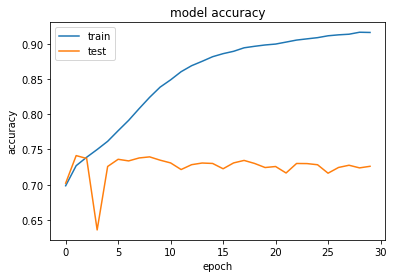

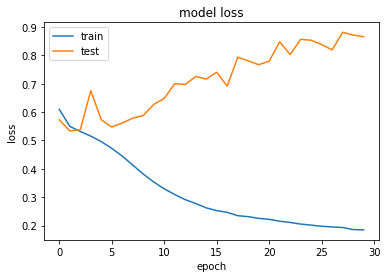

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 28s 354us/sample - loss: 0.6021 - acc: 0.7013 - val_loss: 0.5773 - val_acc: 0.7024
Epoch 2/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.5446 - acc: 0.7315 - val_loss: 0.5337 - val_acc: 0.7412
Epoch 3/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.5331 - acc: 0.7409 - val_loss: 0.6015 - val_acc: 0.6949
Epoch 4/30
80000/80000 [==============================] - 20s 251us/sample - loss: 0.5253 - acc: 0.7461 - val_loss: 0.5248 - val_acc: 0.7531
Epoch 5/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.5194 - acc: 0.7504 - val_loss: 0.5312 - val_acc: 0.7437
Epoch 6/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0.5103 - acc: 0.7564 - val_loss: 0.5334 - val_acc: 0.7459
Epoch 7/30
80000/80000 [==============================] - 20s 250us/sample - loss: 0

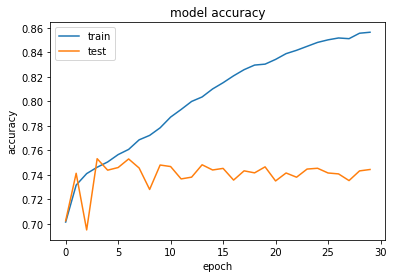

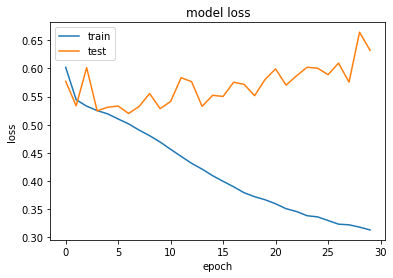

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 370us/sample - loss: 0.6051 - acc: 0.7039 - val_loss: 0.5489 - val_acc: 0.7370
Epoch 2/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.5452 - acc: 0.7316 - val_loss: 0.5297 - val_acc: 0.7454
Epoch 3/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.5340 - acc: 0.7390 - val_loss: 0.5313 - val_acc: 0.7467
Epoch 4/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.5296 - acc: 0.7424 - val_loss: 0.6180 - val_acc: 0.6811
Epoch 5/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.5253 - acc: 0.7461 - val_loss: 0.5192 - val_acc: 0.7539
Epoch 6/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0.5200 - acc: 0.7496 - val_loss: 0.5624 - val_acc: 0.7442
Epoch 7/30
80000/80000 [==============================] - 21s 262us/sample - loss: 0

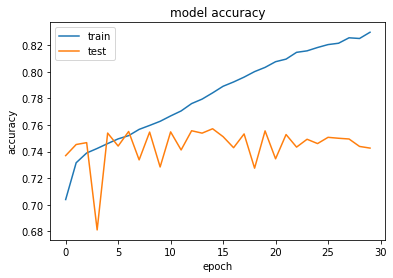

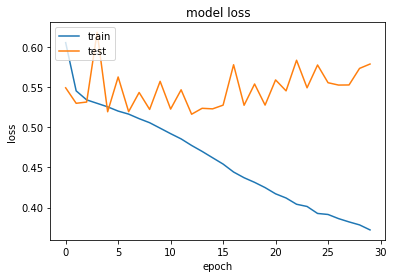

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 29s 361us/sample - loss: 0.6094 - acc: 0.7013 - val_loss: 0.5489 - val_acc: 0.7326
Epoch 2/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5442 - acc: 0.7303 - val_loss: 0.5429 - val_acc: 0.7329
Epoch 3/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5281 - acc: 0.7421 - val_loss: 0.5626 - val_acc: 0.7279
Epoch 4/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.5119 - acc: 0.7508 - val_loss: 0.5459 - val_acc: 0.7394
Epoch 5/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.4925 - acc: 0.7630 - val_loss: 0.5385 - val_acc: 0.7453
Epoch 6/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0.4671 - acc: 0.7760 - val_loss: 0.5563 - val_acc: 0.7402
Epoch 7/30
80000/80000 [==============================] - 20s 254us/sample - loss: 0

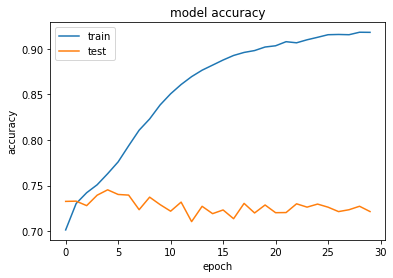

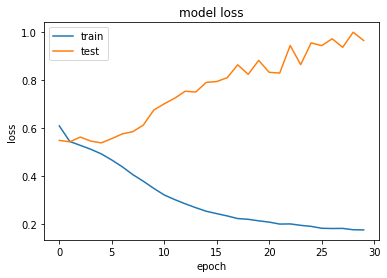

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 32s 396us/sample - loss: 0.5990 - acc: 0.7044 - val_loss: 0.6004 - val_acc: 0.6979
Epoch 2/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5446 - acc: 0.7312 - val_loss: 0.5290 - val_acc: 0.7477
Epoch 3/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5329 - acc: 0.7415 - val_loss: 0.5253 - val_acc: 0.7481
Epoch 4/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5260 - acc: 0.7465 - val_loss: 0.5238 - val_acc: 0.7528
Epoch 5/30
80000/80000 [==============================] - 23s 289us/sample - loss: 0.5179 - acc: 0.7507 - val_loss: 0.5250 - val_acc: 0.7497
Epoch 6/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5096 - acc: 0.7558 - val_loss: 0.5255 - val_acc: 0.7478
Epoch 7/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0

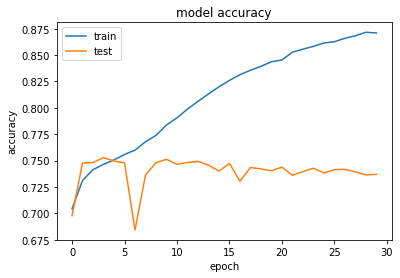

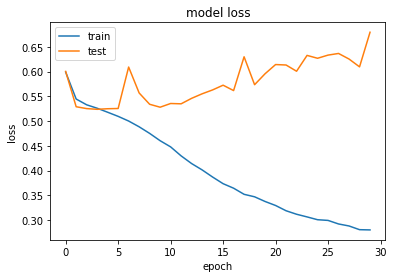

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 419us/sample - loss: 0.5856 - acc: 0.7074 - val_loss: 0.6145 - val_acc: 0.6785
Epoch 2/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0.5397 - acc: 0.7372 - val_loss: 0.5256 - val_acc: 0.7480
Epoch 3/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0.5334 - acc: 0.7406 - val_loss: 0.5217 - val_acc: 0.7513
Epoch 4/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0.5275 - acc: 0.7440 - val_loss: 0.5223 - val_acc: 0.7524
Epoch 5/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0.5226 - acc: 0.7485 - val_loss: 0.5209 - val_acc: 0.7528
Epoch 6/30
80000/80000 [==============================] - 24s 305us/sample - loss: 0.5181 - acc: 0.7514 - val_loss: 0.5394 - val_acc: 0.7411
Epoch 7/30
80000/80000 [==============================] - 24s 304us/sample - loss: 0

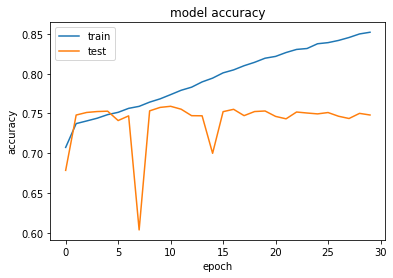

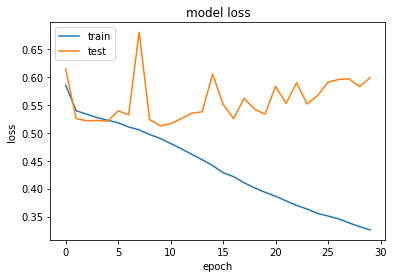

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 381us/sample - loss: 0.6042 - acc: 0.7009 - val_loss: 0.5347 - val_acc: 0.7321
Epoch 2/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0.5365 - acc: 0.7390 - val_loss: 0.5284 - val_acc: 0.7445
Epoch 3/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0.5164 - acc: 0.7514 - val_loss: 0.5630 - val_acc: 0.7128
Epoch 4/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0.4897 - acc: 0.7677 - val_loss: 0.5370 - val_acc: 0.7468
Epoch 5/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0.4580 - acc: 0.7847 - val_loss: 0.5412 - val_acc: 0.7455
Epoch 6/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0.4117 - acc: 0.8087 - val_loss: 0.5601 - val_acc: 0.7442
Epoch 7/30
80000/80000 [==============================] - 21s 268us/sample - loss: 0

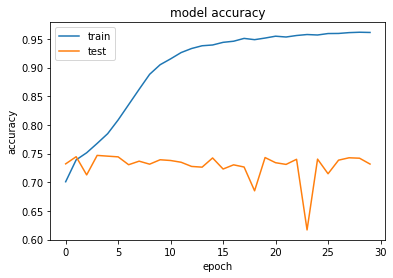

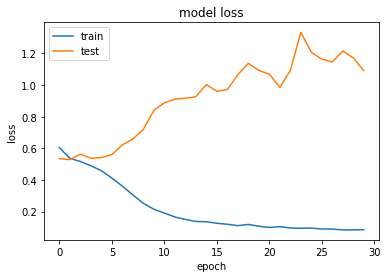

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 32s 403us/sample - loss: 0.5782 - acc: 0.7167 - val_loss: 0.5687 - val_acc: 0.7063
Epoch 2/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0.5360 - acc: 0.7392 - val_loss: 0.6115 - val_acc: 0.6634
Epoch 3/30
80000/80000 [==============================] - 22s 281us/sample - loss: 0.5241 - acc: 0.7469 - val_loss: 0.5169 - val_acc: 0.7542
Epoch 4/30
80000/80000 [==============================] - 23s 281us/sample - loss: 0.5150 - acc: 0.7538 - val_loss: 0.5307 - val_acc: 0.7489
Epoch 5/30
80000/80000 [==============================] - 23s 282us/sample - loss: 0.5046 - acc: 0.7605 - val_loss: 0.5175 - val_acc: 0.7535
Epoch 6/30
80000/80000 [==============================] - 23s 281us/sample - loss: 0.4922 - acc: 0.7688 - val_loss: 0.5154 - val_acc: 0.7552
Epoch 7/30
80000/80000 [==============================] - 23s 281us/sample - loss: 0

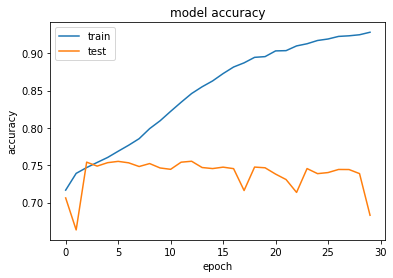

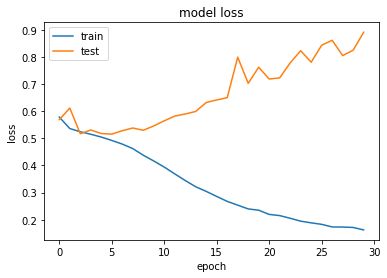

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 33s 416us/sample - loss: 0.6035 - acc: 0.7082 - val_loss: 0.5670 - val_acc: 0.7198
Epoch 2/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.5416 - acc: 0.7356 - val_loss: 0.5613 - val_acc: 0.7168
Epoch 3/30
80000/80000 [==============================] - 23s 289us/sample - loss: 0.5292 - acc: 0.7438 - val_loss: 0.5182 - val_acc: 0.7536
Epoch 4/30
80000/80000 [==============================] - 23s 289us/sample - loss: 0.5236 - acc: 0.7480 - val_loss: 0.5718 - val_acc: 0.7207
Epoch 5/30
80000/80000 [==============================] - 23s 289us/sample - loss: 0.5179 - acc: 0.7505 - val_loss: 0.5278 - val_acc: 0.7449
Epoch 6/30
80000/80000 [==============================] - 23s 289us/sample - loss: 0.5127 - acc: 0.7543 - val_loss: 0.5185 - val_acc: 0.7525
Epoch 7/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0

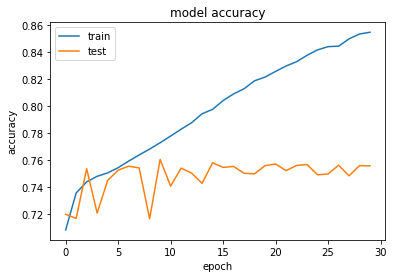

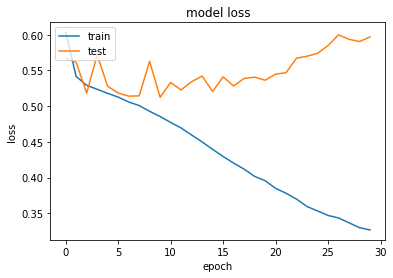

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 429us/sample - loss: 0.5857 - acc: 0.7144 - val_loss: 0.5389 - val_acc: 0.7304
Epoch 2/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.5304 - acc: 0.7426 - val_loss: 0.6156 - val_acc: 0.6679
Epoch 3/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.5092 - acc: 0.7556 - val_loss: 0.5652 - val_acc: 0.7365
Epoch 4/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.4846 - acc: 0.7709 - val_loss: 0.5306 - val_acc: 0.7456
Epoch 5/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.4458 - acc: 0.7935 - val_loss: 0.5559 - val_acc: 0.7354
Epoch 6/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.3938 - acc: 0.8202 - val_loss: 0.5879 - val_acc: 0.7419
Epoch 7/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0

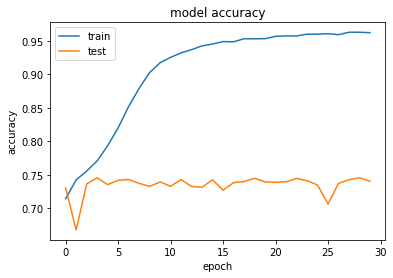

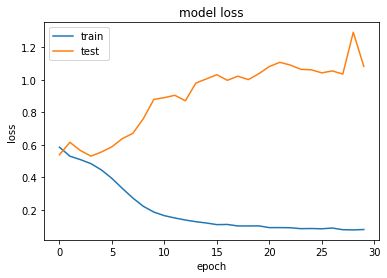

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 36s 454us/sample - loss: 0.5703 - acc: 0.7172 - val_loss: 0.7093 - val_acc: 0.5641
Epoch 2/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5317 - acc: 0.7411 - val_loss: 0.5552 - val_acc: 0.7296
Epoch 3/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5216 - acc: 0.7484 - val_loss: 0.6030 - val_acc: 0.6815
Epoch 4/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5127 - acc: 0.7536 - val_loss: 0.5918 - val_acc: 0.6903
Epoch 5/30
80000/80000 [==============================] - 26s 320us/sample - loss: 0.5018 - acc: 0.7626 - val_loss: 0.5268 - val_acc: 0.7474
Epoch 6/30
80000/80000 [==============================] - 26s 322us/sample - loss: 0.4878 - acc: 0.7704 - val_loss: 0.5201 - val_acc: 0.7545
Epoch 7/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0

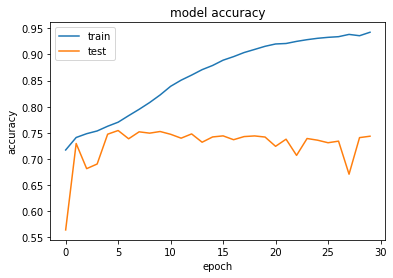

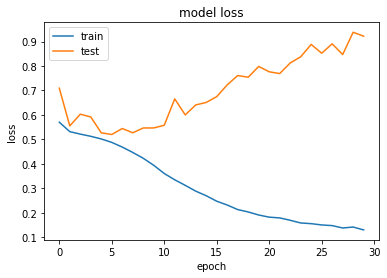

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 38s 471us/sample - loss: 0.5892 - acc: 0.7102 - val_loss: 0.5780 - val_acc: 0.7035
Epoch 2/30
80000/80000 [==============================] - 27s 334us/sample - loss: 0.5371 - acc: 0.7372 - val_loss: 0.5314 - val_acc: 0.7369
Epoch 3/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0.5277 - acc: 0.7435 - val_loss: 0.5263 - val_acc: 0.7445
Epoch 4/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0.5221 - acc: 0.7482 - val_loss: 0.5176 - val_acc: 0.7529
Epoch 5/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0.5166 - acc: 0.7534 - val_loss: 0.5140 - val_acc: 0.7579
Epoch 6/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0.5101 - acc: 0.7563 - val_loss: 0.5191 - val_acc: 0.7529
Epoch 7/30
80000/80000 [==============================] - 27s 333us/sample - loss: 0

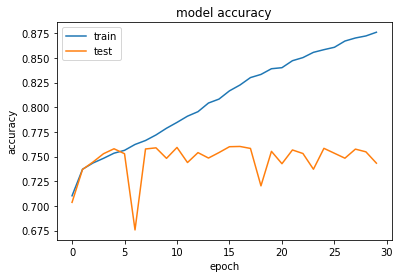

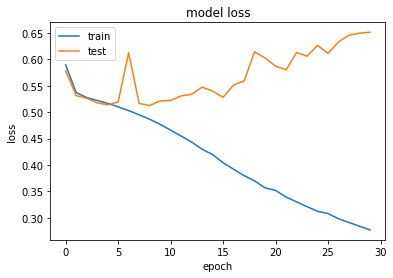

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 30s 377us/sample - loss: 0.5906 - acc: 0.7112 - val_loss: 0.5397 - val_acc: 0.7339
Epoch 2/30
80000/80000 [==============================] - 19s 242us/sample - loss: 0.5369 - acc: 0.7373 - val_loss: 0.5577 - val_acc: 0.7206
Epoch 3/30
80000/80000 [==============================] - 19s 242us/sample - loss: 0.5199 - acc: 0.7499 - val_loss: 0.5360 - val_acc: 0.7393
Epoch 4/30
80000/80000 [==============================] - 19s 242us/sample - loss: 0.4999 - acc: 0.7618 - val_loss: 0.5310 - val_acc: 0.7470
Epoch 5/30
80000/80000 [==============================] - 19s 242us/sample - loss: 0.4759 - acc: 0.7751 - val_loss: 0.5364 - val_acc: 0.7460
Epoch 6/30
80000/80000 [==============================] - 19s 242us/sample - loss: 0.4364 - acc: 0.7972 - val_loss: 0.5621 - val_acc: 0.7409
Epoch 7/30
80000/80000 [==============================] - 19s 241us/sample - loss: 0

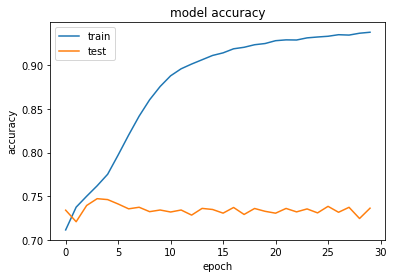

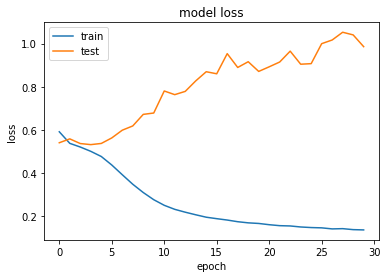

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 33s 409us/sample - loss: 0.5960 - acc: 0.7119 - val_loss: 0.5362 - val_acc: 0.7405
Epoch 2/30
80000/80000 [==============================] - 22s 271us/sample - loss: 0.5403 - acc: 0.7360 - val_loss: 0.5598 - val_acc: 0.7221
Epoch 3/30
80000/80000 [==============================] - 22s 270us/sample - loss: 0.5288 - acc: 0.7447 - val_loss: 0.5882 - val_acc: 0.7020
Epoch 4/30
80000/80000 [==============================] - 22s 271us/sample - loss: 0.5211 - acc: 0.7485 - val_loss: 0.5238 - val_acc: 0.7534
Epoch 5/30
80000/80000 [==============================] - 22s 270us/sample - loss: 0.5147 - acc: 0.7539 - val_loss: 0.5420 - val_acc: 0.7365
Epoch 6/30
80000/80000 [==============================] - 22s 270us/sample - loss: 0.5074 - acc: 0.7575 - val_loss: 0.5164 - val_acc: 0.7570
Epoch 7/30
80000/80000 [==============================] - 22s 271us/sample - loss: 0

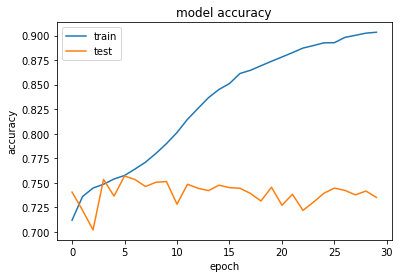

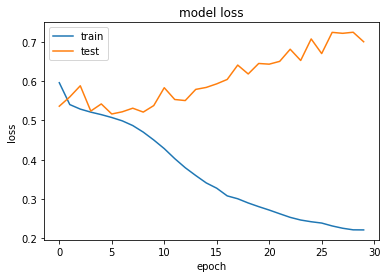

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 429us/sample - loss: 0.5834 - acc: 0.7138 - val_loss: 0.5383 - val_acc: 0.7435
Epoch 2/30
80000/80000 [==============================] - 23s 284us/sample - loss: 0.5345 - acc: 0.7408 - val_loss: 0.5275 - val_acc: 0.7393
Epoch 3/30
80000/80000 [==============================] - 23s 284us/sample - loss: 0.5258 - acc: 0.7467 - val_loss: 0.5257 - val_acc: 0.7479
Epoch 4/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0.5200 - acc: 0.7512 - val_loss: 0.5252 - val_acc: 0.7516
Epoch 5/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0.5133 - acc: 0.7547 - val_loss: 0.5304 - val_acc: 0.7506
Epoch 6/30
80000/80000 [==============================] - 23s 283us/sample - loss: 0.5077 - acc: 0.7594 - val_loss: 0.5173 - val_acc: 0.7566
Epoch 7/30
80000/80000 [==============================] - 23s 284us/sample - loss: 0

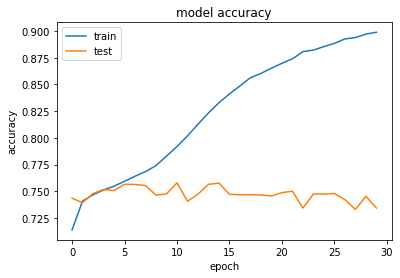

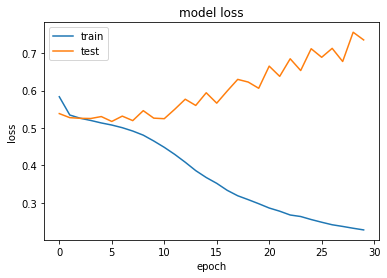

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 34s 419us/sample - loss: 0.5829 - acc: 0.7109 - val_loss: 0.5367 - val_acc: 0.7420
Epoch 2/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.5364 - acc: 0.7357 - val_loss: 0.5560 - val_acc: 0.7241
Epoch 3/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.5195 - acc: 0.7495 - val_loss: 0.5845 - val_acc: 0.6985
Epoch 4/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.5038 - acc: 0.7596 - val_loss: 0.5420 - val_acc: 0.7364
Epoch 5/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.4771 - acc: 0.7743 - val_loss: 0.5364 - val_acc: 0.7454
Epoch 6/30
80000/80000 [==============================] - 22s 275us/sample - loss: 0.4405 - acc: 0.7944 - val_loss: 0.5529 - val_acc: 0.7350
Epoch 7/30
80000/80000 [==============================] - 22s 277us/sample - loss: 0

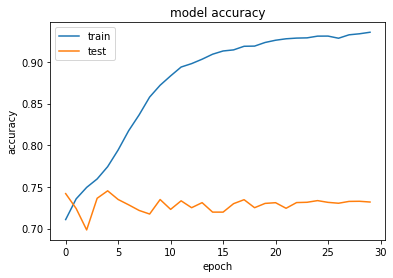

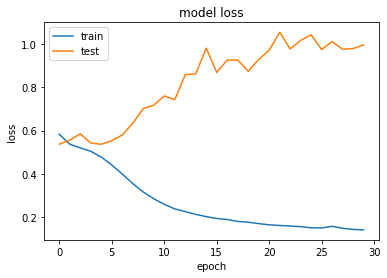

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 36s 454us/sample - loss: 0.5827 - acc: 0.7149 - val_loss: 0.5401 - val_acc: 0.7359
Epoch 2/30
80000/80000 [==============================] - 25s 306us/sample - loss: 0.5366 - acc: 0.7385 - val_loss: 0.6783 - val_acc: 0.6304
Epoch 3/30
80000/80000 [==============================] - 25s 307us/sample - loss: 0.5268 - acc: 0.7462 - val_loss: 0.5237 - val_acc: 0.7513
Epoch 4/30
80000/80000 [==============================] - 25s 307us/sample - loss: 0.5198 - acc: 0.7502 - val_loss: 0.5442 - val_acc: 0.7301
Epoch 5/30
80000/80000 [==============================] - 25s 307us/sample - loss: 0.5130 - acc: 0.7553 - val_loss: 0.5287 - val_acc: 0.7479
Epoch 6/30
80000/80000 [==============================] - 25s 307us/sample - loss: 0.5042 - acc: 0.7607 - val_loss: 0.5299 - val_acc: 0.7486
Epoch 7/30
80000/80000 [==============================] - 25s 307us/sample - loss: 0

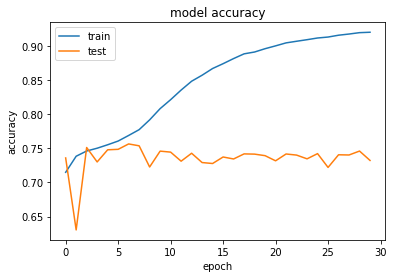

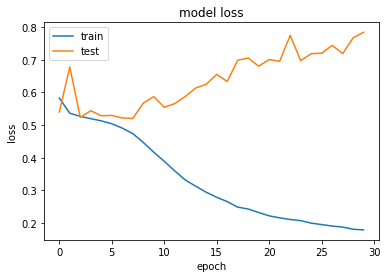

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 38s 473us/sample - loss: 0.5894 - acc: 0.7120 - val_loss: 0.5363 - val_acc: 0.7415
Epoch 2/30
80000/80000 [==============================] - 26s 325us/sample - loss: 0.5356 - acc: 0.7402 - val_loss: 0.5240 - val_acc: 0.7507
Epoch 3/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.5269 - acc: 0.7449 - val_loss: 0.5441 - val_acc: 0.7436
Epoch 4/30
80000/80000 [==============================] - 26s 325us/sample - loss: 0.5209 - acc: 0.7512 - val_loss: 0.5499 - val_acc: 0.7286
Epoch 5/30
80000/80000 [==============================] - 26s 325us/sample - loss: 0.5155 - acc: 0.7539 - val_loss: 0.5231 - val_acc: 0.7545
Epoch 6/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0.5089 - acc: 0.7585 - val_loss: 0.6745 - val_acc: 0.5813
Epoch 7/30
80000/80000 [==============================] - 26s 326us/sample - loss: 0

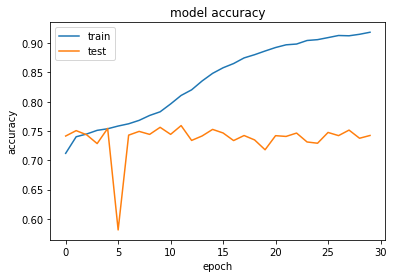

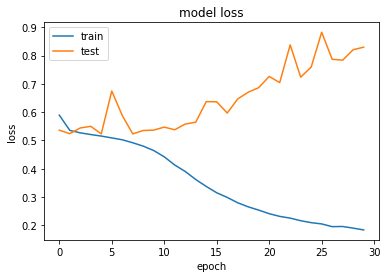

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 35s 439us/sample - loss: 0.5947 - acc: 0.7064 - val_loss: 0.5365 - val_acc: 0.7431
Epoch 2/30
80000/80000 [==============================] - 23s 287us/sample - loss: 0.5309 - acc: 0.7430 - val_loss: 0.5481 - val_acc: 0.7326
Epoch 3/30
80000/80000 [==============================] - 23s 287us/sample - loss: 0.5097 - acc: 0.7572 - val_loss: 0.5518 - val_acc: 0.7272
Epoch 4/30
80000/80000 [==============================] - 23s 289us/sample - loss: 0.4820 - acc: 0.7724 - val_loss: 0.5273 - val_acc: 0.7454
Epoch 5/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.4401 - acc: 0.7972 - val_loss: 0.5493 - val_acc: 0.7442
Epoch 6/30
80000/80000 [==============================] - 23s 288us/sample - loss: 0.3770 - acc: 0.8298 - val_loss: 0.5834 - val_acc: 0.7444
Epoch 7/30
80000/80000 [==============================] - 23s 287us/sample - loss: 0

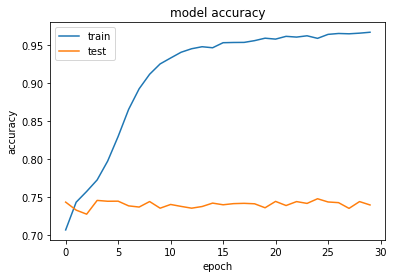

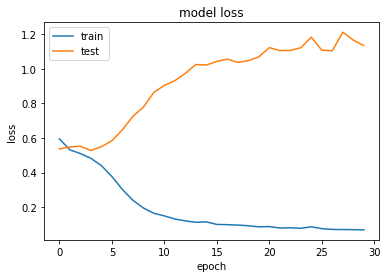

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 36s 451us/sample - loss: 0.5808 - acc: 0.7123 - val_loss: 0.7144 - val_acc: 0.6057
Epoch 2/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.5310 - acc: 0.7427 - val_loss: 0.5788 - val_acc: 0.7070
Epoch 3/30
80000/80000 [==============================] - 24s 302us/sample - loss: 0.5212 - acc: 0.7499 - val_loss: 0.5205 - val_acc: 0.7533
Epoch 4/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0.5133 - acc: 0.7555 - val_loss: 0.5319 - val_acc: 0.7383
Epoch 5/30
80000/80000 [==============================] - 24s 302us/sample - loss: 0.5040 - acc: 0.7619 - val_loss: 0.5301 - val_acc: 0.7458
Epoch 6/30
80000/80000 [==============================] - 24s 302us/sample - loss: 0.4937 - acc: 0.7674 - val_loss: 0.5230 - val_acc: 0.7533
Epoch 7/30
80000/80000 [==============================] - 24s 303us/sample - loss: 0

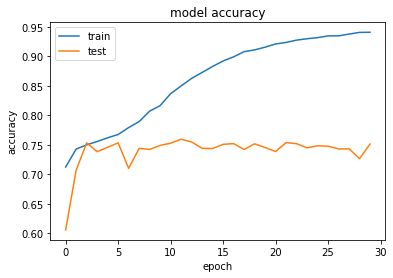

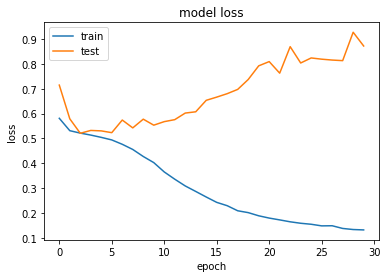

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 42s 520us/sample - loss: 0.5860 - acc: 0.7150 - val_loss: 0.5518 - val_acc: 0.7297
Epoch 2/30
80000/80000 [==============================] - 26s 320us/sample - loss: 0.5347 - acc: 0.7417 - val_loss: 0.5310 - val_acc: 0.7471
Epoch 3/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0.5227 - acc: 0.7493 - val_loss: 0.7844 - val_acc: 0.5623
Epoch 4/30
80000/80000 [==============================] - 25s 313us/sample - loss: 0.5162 - acc: 0.7542 - val_loss: 0.5208 - val_acc: 0.7480
Epoch 5/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0.5118 - acc: 0.7563 - val_loss: 0.5345 - val_acc: 0.7438
Epoch 6/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0.5056 - acc: 0.7606 - val_loss: 0.5165 - val_acc: 0.7563
Epoch 7/30
80000/80000 [==============================] - 25s 312us/sample - loss: 0

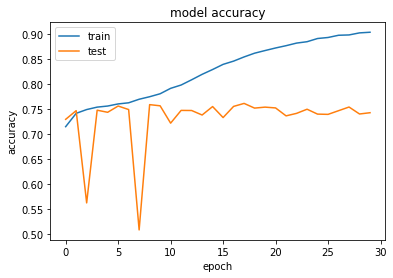

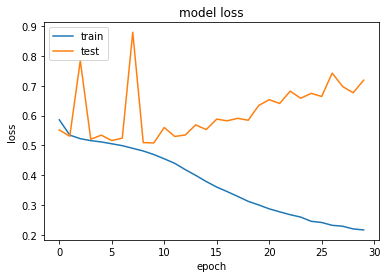

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 38s 475us/sample - loss: 0.5736 - acc: 0.7182 - val_loss: 0.5320 - val_acc: 0.7433
Epoch 2/30
80000/80000 [==============================] - 26s 322us/sample - loss: 0.5262 - acc: 0.7451 - val_loss: 0.5352 - val_acc: 0.7377
Epoch 3/30
80000/80000 [==============================] - 26s 321us/sample - loss: 0.5063 - acc: 0.7583 - val_loss: 0.5613 - val_acc: 0.7237
Epoch 4/30
80000/80000 [==============================] - 26s 322us/sample - loss: 0.4745 - acc: 0.7772 - val_loss: 0.5933 - val_acc: 0.7237
Epoch 5/30
80000/80000 [==============================] - 26s 323us/sample - loss: 0.4206 - acc: 0.8075 - val_loss: 0.5368 - val_acc: 0.7485
Epoch 6/30
80000/80000 [==============================] - 26s 322us/sample - loss: 0.3477 - acc: 0.8448 - val_loss: 0.6082 - val_acc: 0.7447
Epoch 7/30
80000/80000 [==============================] - 26s 322us/sample - loss: 0

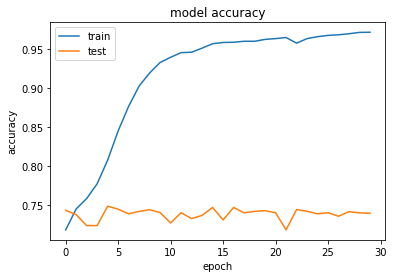

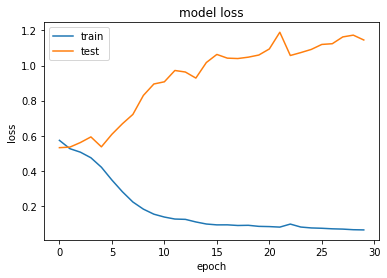

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 40s 500us/sample - loss: 0.5774 - acc: 0.7170 - val_loss: 0.8188 - val_acc: 0.5143
Epoch 2/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0.5325 - acc: 0.7427 - val_loss: 0.5827 - val_acc: 0.7000
Epoch 3/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0.5216 - acc: 0.7492 - val_loss: 0.5561 - val_acc: 0.7201
Epoch 4/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0.5116 - acc: 0.7545 - val_loss: 0.5197 - val_acc: 0.7547
Epoch 5/30
80000/80000 [==============================] - 27s 342us/sample - loss: 0.5030 - acc: 0.7623 - val_loss: 0.5227 - val_acc: 0.7464
Epoch 6/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0.4903 - acc: 0.7698 - val_loss: 0.5248 - val_acc: 0.7503
Epoch 7/30
80000/80000 [==============================] - 27s 341us/sample - loss: 0

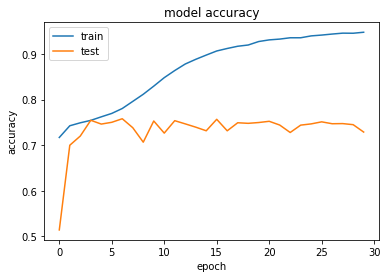

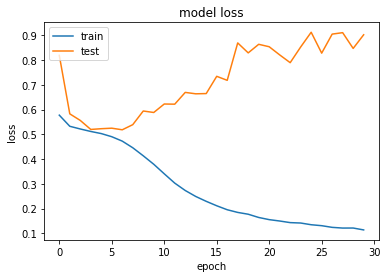

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 41s 513us/sample - loss: 0.5848 - acc: 0.7120 - val_loss: 0.5384 - val_acc: 0.7415
Epoch 2/30
80000/80000 [==============================] - 28s 352us/sample - loss: 0.5310 - acc: 0.7437 - val_loss: 0.5176 - val_acc: 0.7541
Epoch 3/30
80000/80000 [==============================] - 28s 355us/sample - loss: 0.5213 - acc: 0.7503 - val_loss: 0.5191 - val_acc: 0.7518
Epoch 4/30
80000/80000 [==============================] - 28s 353us/sample - loss: 0.5163 - acc: 0.7539 - val_loss: 0.5828 - val_acc: 0.7016
Epoch 5/30
80000/80000 [==============================] - 28s 353us/sample - loss: 0.5102 - acc: 0.7587 - val_loss: 0.5726 - val_acc: 0.7222
Epoch 6/30
80000/80000 [==============================] - 28s 354us/sample - loss: 0.5033 - acc: 0.7620 - val_loss: 0.5137 - val_acc: 0.7576
Epoch 7/30
80000/80000 [==============================] - 28s 353us/sample - loss: 0

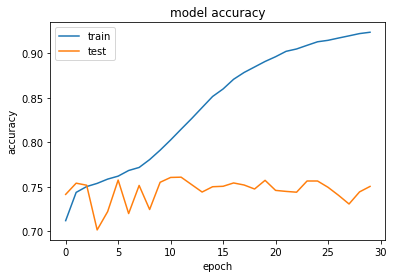

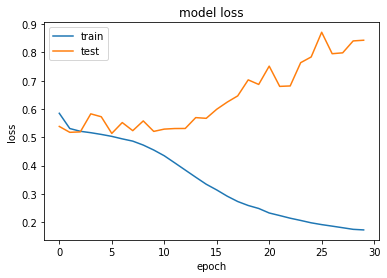

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 41s 516us/sample - loss: 0.5735 - acc: 0.7135 - val_loss: 0.5317 - val_acc: 0.7436
Epoch 2/30
80000/80000 [==============================] - 29s 357us/sample - loss: 0.5339 - acc: 0.7401 - val_loss: 0.5441 - val_acc: 0.7372
Epoch 3/30
80000/80000 [==============================] - 28s 356us/sample - loss: 0.5226 - acc: 0.7467 - val_loss: 0.5381 - val_acc: 0.7397
Epoch 4/30
80000/80000 [==============================] - 29s 357us/sample - loss: 0.5069 - acc: 0.7570 - val_loss: 0.5464 - val_acc: 0.7293
Epoch 5/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0.4839 - acc: 0.7699 - val_loss: 0.5266 - val_acc: 0.7519
Epoch 6/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0.4494 - acc: 0.7886 - val_loss: 0.5505 - val_acc: 0.7412
Epoch 7/30
80000/80000 [==============================] - 29s 358us/sample - loss: 0

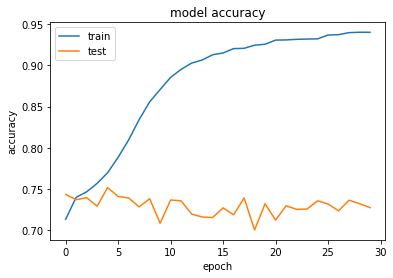

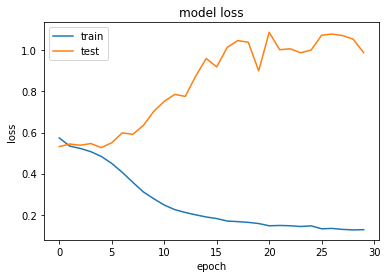

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 47s 588us/sample - loss: 0.5805 - acc: 0.7123 - val_loss: 0.5905 - val_acc: 0.7007
Epoch 2/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.5359 - acc: 0.7393 - val_loss: 0.5833 - val_acc: 0.6981
Epoch 3/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.5261 - acc: 0.7471 - val_loss: 0.5491 - val_acc: 0.7325
Epoch 4/30
80000/80000 [==============================] - 34s 421us/sample - loss: 0.5194 - acc: 0.7509 - val_loss: 0.5253 - val_acc: 0.7492
Epoch 5/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.5119 - acc: 0.7564 - val_loss: 0.5178 - val_acc: 0.7558
Epoch 6/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0.5031 - acc: 0.7620 - val_loss: 0.5195 - val_acc: 0.7574
Epoch 7/30
80000/80000 [==============================] - 34s 422us/sample - loss: 0

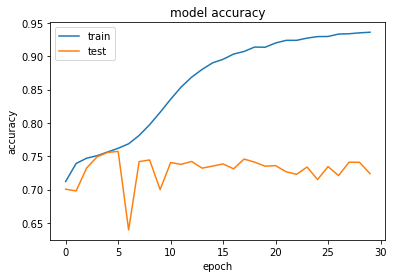

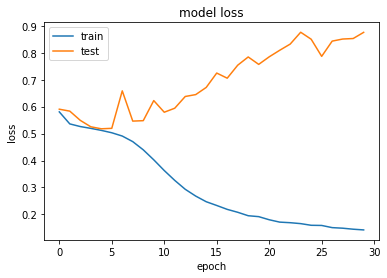

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 48s 602us/sample - loss: 0.5856 - acc: 0.7074 - val_loss: 0.5400 - val_acc: 0.7378
Epoch 2/30
80000/80000 [==============================] - 35s 439us/sample - loss: 0.5344 - acc: 0.7407 - val_loss: 0.5829 - val_acc: 0.7084
Epoch 3/30
80000/80000 [==============================] - 35s 440us/sample - loss: 0.5238 - acc: 0.7488 - val_loss: 0.5325 - val_acc: 0.7383
Epoch 4/30
80000/80000 [==============================] - 35s 439us/sample - loss: 0.5169 - acc: 0.7540 - val_loss: 0.5363 - val_acc: 0.7355
Epoch 5/30
80000/80000 [==============================] - 35s 440us/sample - loss: 0.5105 - acc: 0.7586 - val_loss: 0.5367 - val_acc: 0.7441
Epoch 6/30
80000/80000 [==============================] - 35s 440us/sample - loss: 0.5034 - acc: 0.7622 - val_loss: 0.5183 - val_acc: 0.7564
Epoch 7/30
80000/80000 [==============================] - 35s 440us/sample - loss: 0

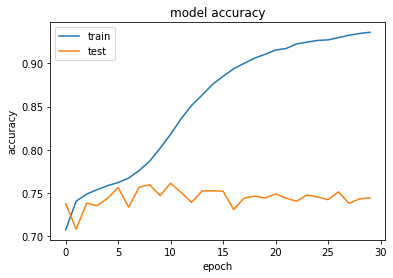

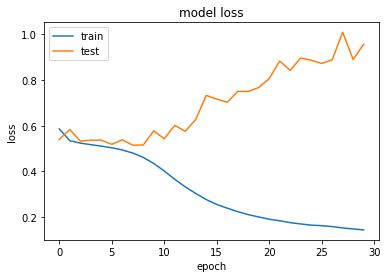

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 48s 601us/sample - loss: 0.5870 - acc: 0.7130 - val_loss: 0.6193 - val_acc: 0.6765
Epoch 2/30
80000/80000 [==============================] - 35s 437us/sample - loss: 0.5369 - acc: 0.7377 - val_loss: 0.5283 - val_acc: 0.7495
Epoch 3/30
80000/80000 [==============================] - 35s 437us/sample - loss: 0.5226 - acc: 0.7474 - val_loss: 0.5322 - val_acc: 0.7431
Epoch 4/30
80000/80000 [==============================] - 35s 437us/sample - loss: 0.5092 - acc: 0.7580 - val_loss: 0.6173 - val_acc: 0.6809
Epoch 5/30
80000/80000 [==============================] - 35s 437us/sample - loss: 0.4881 - acc: 0.7697 - val_loss: 0.5251 - val_acc: 0.7516
Epoch 6/30
80000/80000 [==============================] - 35s 437us/sample - loss: 0.4512 - acc: 0.7887 - val_loss: 0.5453 - val_acc: 0.7509
Epoch 7/30
80000/80000 [==============================] - 35s 438us/sample - loss: 0

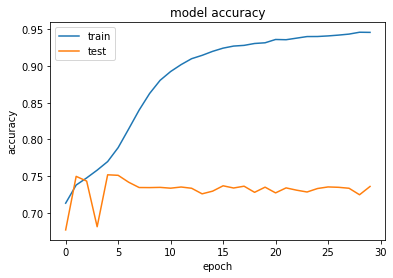

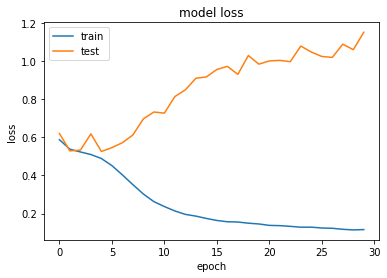

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 55s 690us/sample - loss: 0.6024 - acc: 0.7141 - val_loss: 0.5300 - val_acc: 0.7451
Epoch 2/30
80000/80000 [==============================] - 42s 525us/sample - loss: 0.5419 - acc: 0.7375 - val_loss: 0.5362 - val_acc: 0.7361
Epoch 3/30
80000/80000 [==============================] - 42s 528us/sample - loss: 0.5269 - acc: 0.7464 - val_loss: 0.5588 - val_acc: 0.7242
Epoch 4/30
80000/80000 [==============================] - 42s 525us/sample - loss: 0.5191 - acc: 0.7511 - val_loss: 0.5211 - val_acc: 0.7526
Epoch 5/30
80000/80000 [==============================] - 42s 526us/sample - loss: 0.5129 - acc: 0.7552 - val_loss: 0.5369 - val_acc: 0.7339
Epoch 6/30
80000/80000 [==============================] - 42s 528us/sample - loss: 0.5054 - acc: 0.7602 - val_loss: 0.5162 - val_acc: 0.7574
Epoch 7/30
80000/80000 [==============================] - 42s 526us/sample - loss: 0

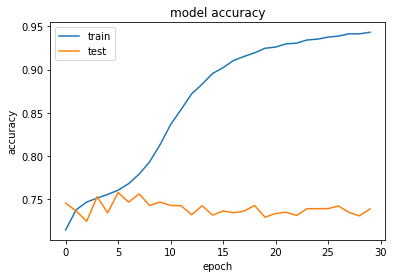

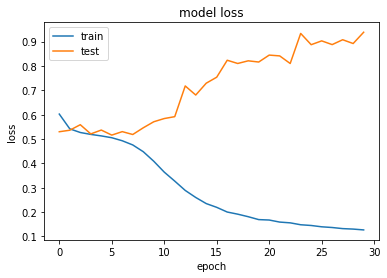

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 57s 714us/sample - loss: 0.5828 - acc: 0.7082 - val_loss: 0.5519 - val_acc: 0.7315
Epoch 2/30
80000/80000 [==============================] - 44s 553us/sample - loss: 0.5325 - acc: 0.7424 - val_loss: 0.6291 - val_acc: 0.6276
Epoch 3/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.5249 - acc: 0.7498 - val_loss: 0.7192 - val_acc: 0.6112
Epoch 4/30
80000/80000 [==============================] - 44s 556us/sample - loss: 0.5174 - acc: 0.7533 - val_loss: 0.5245 - val_acc: 0.7523
Epoch 5/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0.5084 - acc: 0.7590 - val_loss: 0.5532 - val_acc: 0.7451
Epoch 6/30
80000/80000 [==============================] - 45s 556us/sample - loss: 0.5014 - acc: 0.7629 - val_loss: 0.5309 - val_acc: 0.7517
Epoch 7/30
80000/80000 [==============================] - 44s 555us/sample - loss: 0

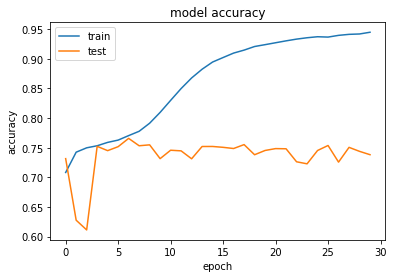

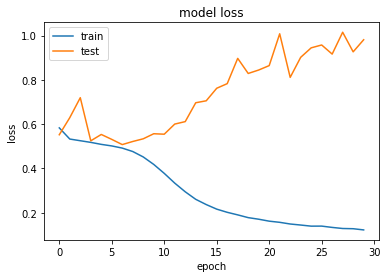

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 45s 560us/sample - loss: 0.5740 - acc: 0.7199 - val_loss: 0.6009 - val_acc: 0.6804
Epoch 2/30
80000/80000 [==============================] - 31s 393us/sample - loss: 0.5262 - acc: 0.7461 - val_loss: 0.6112 - val_acc: 0.6878
Epoch 3/30
80000/80000 [==============================] - 31s 393us/sample - loss: 0.5102 - acc: 0.7581 - val_loss: 0.5305 - val_acc: 0.7411
Epoch 4/30
80000/80000 [==============================] - 31s 393us/sample - loss: 0.4895 - acc: 0.7689 - val_loss: 0.5198 - val_acc: 0.7521
Epoch 5/30
80000/80000 [==============================] - 32s 395us/sample - loss: 0.4541 - acc: 0.7896 - val_loss: 0.5442 - val_acc: 0.7379
Epoch 6/30
80000/80000 [==============================] - 31s 394us/sample - loss: 0.4007 - acc: 0.8199 - val_loss: 0.5507 - val_acc: 0.7505
Epoch 7/30
80000/80000 [==============================] - 31s 393us/sample - loss: 0

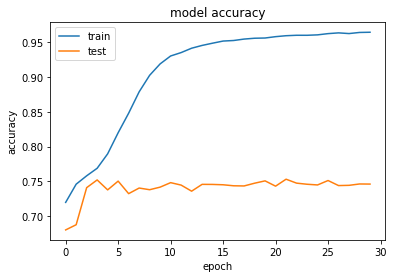

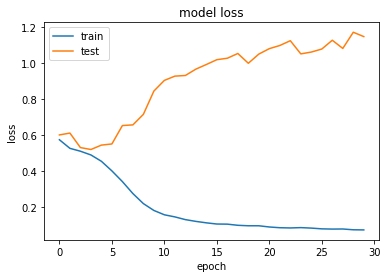

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 48s 595us/sample - loss: 0.5661 - acc: 0.7189 - val_loss: 0.5249 - val_acc: 0.7519
Epoch 2/30
80000/80000 [==============================] - 35s 436us/sample - loss: 0.5282 - acc: 0.7447 - val_loss: 0.6018 - val_acc: 0.7039
Epoch 3/30
80000/80000 [==============================] - 35s 436us/sample - loss: 0.5183 - acc: 0.7534 - val_loss: 0.5241 - val_acc: 0.7452
Epoch 4/30
80000/80000 [==============================] - 35s 438us/sample - loss: 0.5099 - acc: 0.7571 - val_loss: 0.5189 - val_acc: 0.7544
Epoch 5/30
80000/80000 [==============================] - 35s 437us/sample - loss: 0.5019 - acc: 0.7638 - val_loss: 0.5084 - val_acc: 0.7596
Epoch 6/30
80000/80000 [==============================] - 35s 437us/sample - loss: 0.4908 - acc: 0.7698 - val_loss: 0.5295 - val_acc: 0.7505
Epoch 7/30
80000/80000 [==============================] - 35s 438us/sample - loss: 0

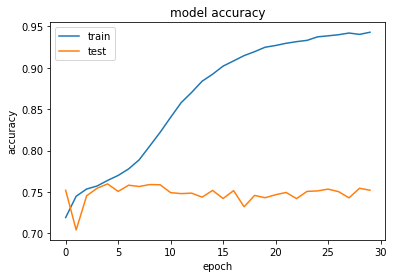

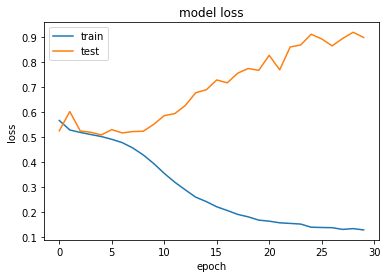

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 50s 624us/sample - loss: 0.6038 - acc: 0.7017 - val_loss: 0.6963 - val_acc: 0.5996
Epoch 2/30
80000/80000 [==============================] - 36s 452us/sample - loss: 0.5364 - acc: 0.7387 - val_loss: 0.5591 - val_acc: 0.7249
Epoch 3/30
80000/80000 [==============================] - 36s 453us/sample - loss: 0.5231 - acc: 0.7496 - val_loss: 0.5243 - val_acc: 0.7495
Epoch 4/30
80000/80000 [==============================] - 36s 455us/sample - loss: 0.5156 - acc: 0.7546 - val_loss: 0.6917 - val_acc: 0.5517
Epoch 5/30
80000/80000 [==============================] - 36s 454us/sample - loss: 0.5113 - acc: 0.7579 - val_loss: 0.5755 - val_acc: 0.7092
Epoch 6/30
80000/80000 [==============================] - 36s 454us/sample - loss: 0.5031 - acc: 0.7616 - val_loss: 0.5138 - val_acc: 0.7603
Epoch 7/30
80000/80000 [==============================] - 36s 454us/sample - loss: 0

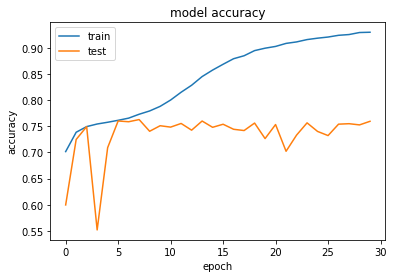

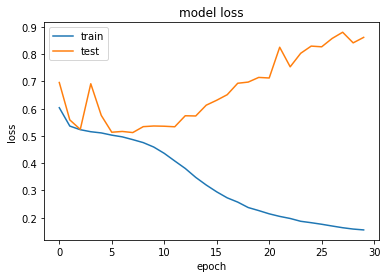

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 52s 645us/sample - loss: 0.5836 - acc: 0.7107 - val_loss: 0.5296 - val_acc: 0.7444
Epoch 2/30
80000/80000 [==============================] - 38s 472us/sample - loss: 0.5284 - acc: 0.7452 - val_loss: 0.5266 - val_acc: 0.7477
Epoch 3/30
80000/80000 [==============================] - 38s 473us/sample - loss: 0.5106 - acc: 0.7572 - val_loss: 0.5197 - val_acc: 0.7481
Epoch 4/30
80000/80000 [==============================] - 38s 473us/sample - loss: 0.4878 - acc: 0.7724 - val_loss: 0.5441 - val_acc: 0.7430
Epoch 5/30
80000/80000 [==============================] - 38s 473us/sample - loss: 0.4485 - acc: 0.7933 - val_loss: 0.5594 - val_acc: 0.7390
Epoch 6/30
80000/80000 [==============================] - 38s 473us/sample - loss: 0.3876 - acc: 0.8250 - val_loss: 0.5659 - val_acc: 0.7474
Epoch 7/30
80000/80000 [==============================] - 38s 474us/sample - loss: 0

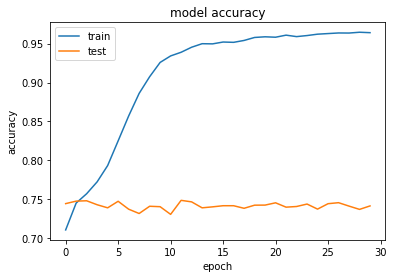

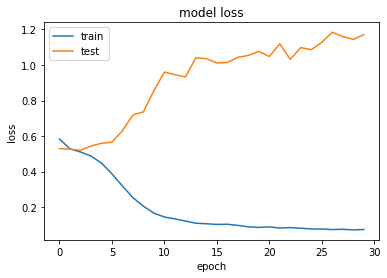

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 57s 716us/sample - loss: 0.5975 - acc: 0.7103 - val_loss: 0.5900 - val_acc: 0.6914
Epoch 2/30
80000/80000 [==============================] - 44s 544us/sample - loss: 0.5331 - acc: 0.7413 - val_loss: 0.5696 - val_acc: 0.7092
Epoch 3/30
80000/80000 [==============================] - 44s 545us/sample - loss: 0.5203 - acc: 0.7507 - val_loss: 0.5281 - val_acc: 0.7508
Epoch 4/30
80000/80000 [==============================] - 44s 544us/sample - loss: 0.5138 - acc: 0.7533 - val_loss: 0.5358 - val_acc: 0.7349
Epoch 5/30
80000/80000 [==============================] - 44s 545us/sample - loss: 0.5058 - acc: 0.7599 - val_loss: 0.5443 - val_acc: 0.7279
Epoch 6/30
80000/80000 [==============================] - 44s 546us/sample - loss: 0.4965 - acc: 0.7652 - val_loss: 0.5214 - val_acc: 0.7545
Epoch 7/30
80000/80000 [==============================] - 44s 545us/sample - loss: 0

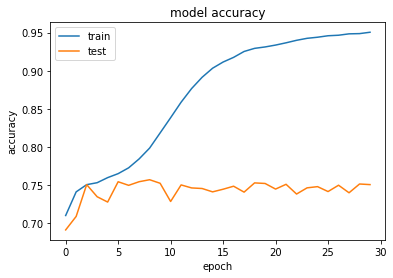

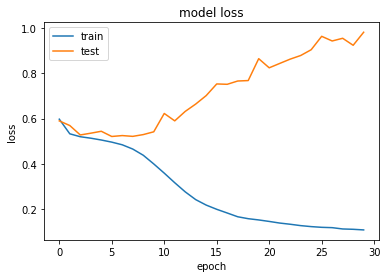

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 60s 747us/sample - loss: 0.5768 - acc: 0.7147 - val_loss: 0.5369 - val_acc: 0.7453
Epoch 2/30
80000/80000 [==============================] - 45s 568us/sample - loss: 0.5322 - acc: 0.7427 - val_loss: 0.5556 - val_acc: 0.7265
Epoch 3/30
80000/80000 [==============================] - 45s 568us/sample - loss: 0.5209 - acc: 0.7510 - val_loss: 0.5530 - val_acc: 0.7107
Epoch 4/30
80000/80000 [==============================] - 46s 569us/sample - loss: 0.5132 - acc: 0.7558 - val_loss: 0.5160 - val_acc: 0.7557
Epoch 5/30
80000/80000 [==============================] - 46s 570us/sample - loss: 0.5065 - acc: 0.7607 - val_loss: 0.5326 - val_acc: 0.7498
Epoch 6/30
80000/80000 [==============================] - 46s 569us/sample - loss: 0.5004 - acc: 0.7641 - val_loss: 0.5294 - val_acc: 0.7444
Epoch 7/30
80000/80000 [==============================] - 46s 569us/sample - loss: 0

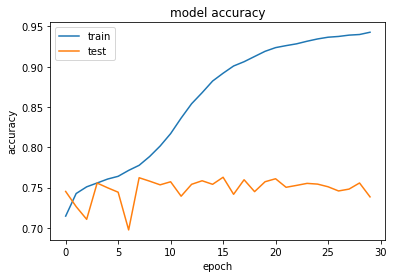

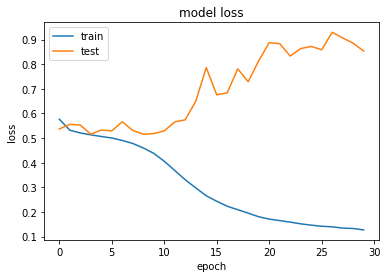

Ende des Versuchs: 


ValueError: A target array with shape (80000, 30, 80, 2) was passed for an output of shape (None, 2) while using as loss `binary_crossentropy`. This loss expects targets to have the same shape as the output.

In [10]:
dense_layers = [1,2]
layer_sizes = [160,200]
conv_layers = [1,2,3]
kernal_size = [(2,2),(3,3),(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="PMT24-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\PMT24sCNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= X.shape[1:],activation="relu", padding='same'))                                               
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
               # model.summary()
                history=model.fit(
                    
                    X[:80000],Y[:80000],

                 validation_data=(X[80000:100000],Y[80000:100000])   
                    
              ,batch_size=100,
                shuffle=True,
                class_weight='balanced',
                callbacks=[
                            #monitor,
                            #checkpoint,
                            tensorboard 
                ],
              epochs= 30)
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()

                print("Ende des Versuchs: ")
dense_layers = [1,2]
layer_sizes = [160,200]
conv_layers = [1,2,3]
kernal_size = [(2,2),(3,3),(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="LAPPD1x1-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\LAPPD1x1CNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= X2.shape[1:],activation="relu", padding='same'))                                               
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
                #model.summary()
                history=model.fit(
                    
                    X2[:80000],Y2[:80000],

                 validation_data=(X2[80000:100000],Y2[80000:100000])   
                    
              ,batch_size=100,
                shuffle=True,
                class_weight='balanced',
                callbacks=[
                            #monitor,
                            #checkpoint,
                            tensorboard 
                ],
              epochs= 30)
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()

                print("Ende des Versuchs: ")
dense_layers = [1,2]
layer_sizes = [160,200]
conv_layers = [1,2,3]
kernal_size = [(2,2),(3,3),(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="LAPPD5x5-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\LAPPD5x5CNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= X3.shape[1:],activation="relu", padding='same'))                                               
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
                #model.summary()
                history=model.fit(
                    
                    X3[:80000],Y3[:80000],

                 validation_data=(X3[80000:100000],Y3[80000:100000])   
                    
              ,batch_size=100,
                shuffle=True,
                class_weight='balanced',
                callbacks=[
                            #monitor,
                            #checkpoint,
                            tensorboard 
                ],
              epochs= 30)
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()

                print("Ende des Versuchs: ")
dense_layers = [1,2]
layer_sizes = [160,200]
conv_layers = [1,2,3]
kernal_size = [(2,2),(3,3),(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="LAPPD10x10-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\LAPPD10x10CNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= X4.shape[1:],activation="relu", padding='same'))                                               
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
                #model.summary()
                history=model.fit(
                    
                    X4[:80000],Y4[:80000],

                 validation_data=(X4[80000:100000],Y4[80000:100000])   
                    
              ,batch_size=100,
                shuffle=True,
                class_weight='balanced',
                callbacks=[
                            #monitor,
                            #checkpoint,
                            tensorboard 
                ],
              epochs= 30)
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()

                print("Ende des Versuchs: ")

W0620 23:29:34.513071 62084 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0620 23:29:34.826180 62084 deprecation.py:323] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 64s 803us/sample - loss: 0.6097 - acc: 0.6996 - val_loss: 0.5564 - val_acc: 0.7165
Epoch 2/30
80000/80000 [==============================] - 60s 752us/sample - loss: 0.5424 - acc: 0.7332 - val_loss: 0.5320 - val_acc: 0.7414
Epoch 3/30
80000/80000 [==============================] - 61s 758us/sample - loss: 0.5180 - acc: 0.7498 - val_loss: 0.5325 - val_acc: 0.7431
Epoch 4/30
80000/80000 [==============================] - 61s 759us/sample - loss: 0.4805 - acc: 0.7728 - val_loss: 0.5613 - val_acc: 0.7152
Epoch 5/30
80000/80000 [==============================] - 61s 760us/sample - loss: 0.4226 - acc: 0.8027 - val_loss: 0.6187 - val_acc: 0.7216
Epoch 6/30
80000/80000 [==============================] - 61s 760us/sample - loss: 0.3548 - acc: 0.8358 - val_loss: 0.6435 - val_acc: 0.7134
Epoch 7/30
80000/80000 [==============================] - 62s 772us/sample - loss: 0.3064 - acc: 0.8600 

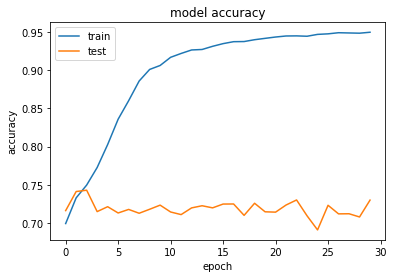

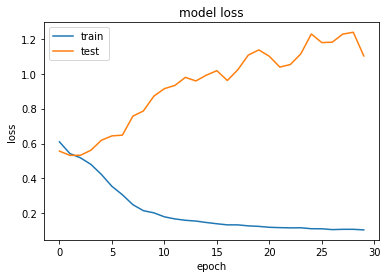

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 77s 958us/sample - loss: 0.5778 - acc: 0.7119 - val_loss: 0.5346 - val_acc: 0.7384
Epoch 2/30
80000/80000 [==============================] - 76s 946us/sample - loss: 0.5390 - acc: 0.7353 - val_loss: 0.5347 - val_acc: 0.7449
Epoch 3/30
80000/80000 [==============================] - 76s 945us/sample - loss: 0.5285 - acc: 0.7446 - val_loss: 0.5541 - val_acc: 0.7379
Epoch 4/30
80000/80000 [==============================] - 76s 945us/sample - loss: 0.5216 - acc: 0.7492 - val_loss: 0.5686 - val_acc: 0.7240
Epoch 5/30
80000/80000 [==============================] - 76s 944us/sample - loss: 0.5115 - acc: 0.7562 - val_loss: 0.7547 - val_acc: 0.6726
Epoch 6/30
80000/80000 [==============================] - 75s 943us/sample - loss: 0.5013 - acc: 0.7635 - val_loss: 0.6049 - val_acc: 0.7211
Epoch 7/30
80000/80000 [==============================] - 76s 944us/sample - loss: 0

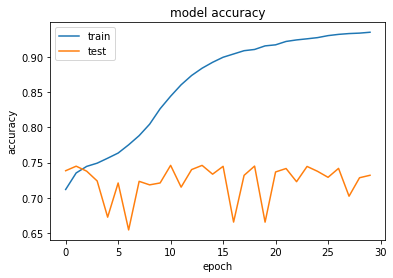

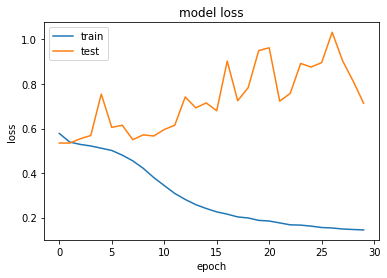

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.5902 - acc: 0.7112 - val_loss: 0.6299 - val_acc: 0.6596
Epoch 2/30
80000/80000 [==============================] - 81s 1ms/sample - loss: 0.5338 - acc: 0.7410 - val_loss: 1.9311 - val_acc: 0.4217
Epoch 3/30
80000/80000 [==============================] - 81s 1ms/sample - loss: 0.5249 - acc: 0.7480 - val_loss: 0.5157 - val_acc: 0.7567
Epoch 4/30
80000/80000 [==============================] - 81s 1ms/sample - loss: 0.5191 - acc: 0.7523 - val_loss: 0.7199 - val_acc: 0.6594
Epoch 5/30
80000/80000 [==============================] - 81s 1ms/sample - loss: 0.5126 - acc: 0.7575 - val_loss: 0.7492 - val_acc: 0.5534
Epoch 6/30
80000/80000 [==============================] - 81s 1ms/sample - loss: 0.5063 - acc: 0.7615 - val_loss: 0.5592 - val_acc: 0.7208
Epoch 7/30
80000/80000 [==============================] - 81s 1ms/sample - loss: 0.4990 - acc: 0

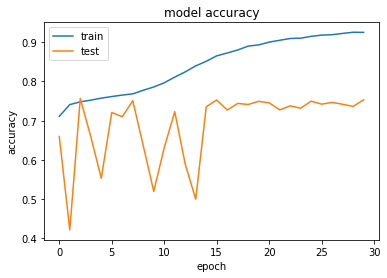

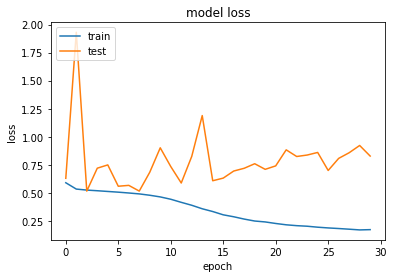

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 85s 1ms/sample - loss: 0.5956 - acc: 0.7076 - val_loss: 0.5441 - val_acc: 0.7303
Epoch 2/30
80000/80000 [==============================] - 83s 1ms/sample - loss: 0.5374 - acc: 0.7356 - val_loss: 0.5454 - val_acc: 0.7303
Epoch 3/30
80000/80000 [==============================] - 83s 1ms/sample - loss: 0.5129 - acc: 0.7519 - val_loss: 0.5570 - val_acc: 0.7209
Epoch 4/30
80000/80000 [==============================] - 83s 1ms/sample - loss: 0.4707 - acc: 0.7772 - val_loss: 0.5593 - val_acc: 0.7284
Epoch 5/30
80000/80000 [==============================] - 83s 1ms/sample - loss: 0.4058 - acc: 0.8128 - val_loss: 0.6153 - val_acc: 0.7121
Epoch 6/30
80000/80000 [==============================] - 83s 1ms/sample - loss: 0.3200 - acc: 0.8571 - val_loss: 0.6685 - val_acc: 0.7258
Epoch 7/30
80000/80000 [==============================] - 83s 1ms/sample - loss: 0.2468 - acc: 0

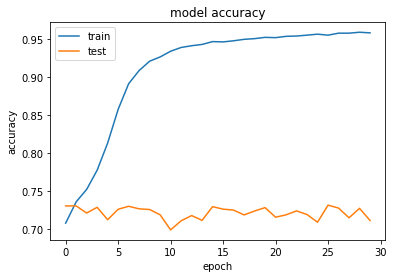

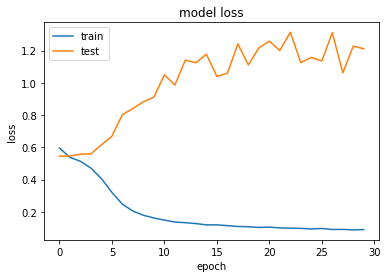

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 104s 1ms/sample - loss: 0.5836 - acc: 0.7107 - val_loss: 0.5862 - val_acc: 0.7007
Epoch 2/30
80000/80000 [==============================] - 103s 1ms/sample - loss: 0.5394 - acc: 0.7357 - val_loss: 0.6569 - val_acc: 0.5983
Epoch 3/30
80000/80000 [==============================] - 103s 1ms/sample - loss: 0.5292 - acc: 0.7444 - val_loss: 0.5545 - val_acc: 0.7354
Epoch 4/30
80000/80000 [==============================] - 103s 1ms/sample - loss: 0.5211 - acc: 0.7497 - val_loss: 0.5684 - val_acc: 0.7171
Epoch 5/30
80000/80000 [==============================] - 103s 1ms/sample - loss: 0.5107 - acc: 0.7562 - val_loss: 0.5354 - val_acc: 0.7412
Epoch 6/30
80000/80000 [==============================] - 103s 1ms/sample - loss: 0.4967 - acc: 0.7653 - val_loss: 0.5697 - val_acc: 0.7153
Epoch 7/30
80000/80000 [==============================] - 103s 1ms/sample - loss: 0.4748 -

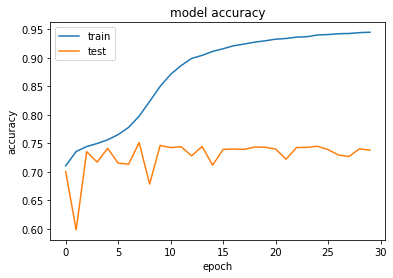

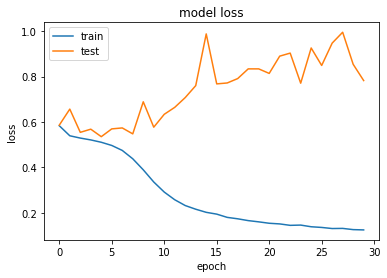

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 112s 1ms/sample - loss: 0.5680 - acc: 0.7207 - val_loss: 1.0676 - val_acc: 0.4728
Epoch 2/30
80000/80000 [==============================] - 111s 1ms/sample - loss: 0.5324 - acc: 0.7425 - val_loss: 0.6047 - val_acc: 0.6937
Epoch 3/30
80000/80000 [==============================] - 110s 1ms/sample - loss: 0.5248 - acc: 0.7482 - val_loss: 0.5405 - val_acc: 0.7321
Epoch 4/30
80000/80000 [==============================] - 110s 1ms/sample - loss: 0.5171 - acc: 0.7526 - val_loss: 0.5104 - val_acc: 0.7593
Epoch 5/30
80000/80000 [==============================] - 110s 1ms/sample - loss: 0.5111 - acc: 0.7575 - val_loss: 0.5116 - val_acc: 0.7616
Epoch 6/30
80000/80000 [==============================] - 110s 1ms/sample - loss: 0.5037 - acc: 0.7628 - val_loss: 0.5178 - val_acc: 0.7542
Epoch 7/30
80000/80000 [==============================] - 110s 1ms/sample - loss: 0.4957 -

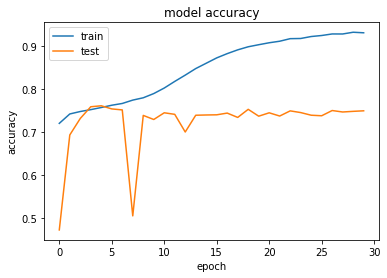

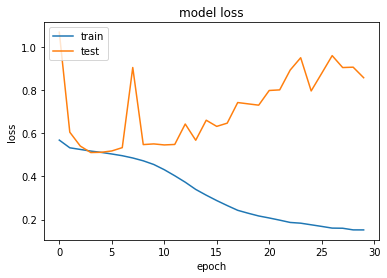

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 72s 900us/sample - loss: 0.5818 - acc: 0.7135 - val_loss: 0.5474 - val_acc: 0.7224
Epoch 2/30
80000/80000 [==============================] - 71s 889us/sample - loss: 0.5227 - acc: 0.7469 - val_loss: 0.5306 - val_acc: 0.7444
Epoch 3/30
80000/80000 [==============================] - 71s 886us/sample - loss: 0.4834 - acc: 0.7735 - val_loss: 0.5296 - val_acc: 0.7462
Epoch 4/30
80000/80000 [==============================] - 71s 886us/sample - loss: 0.4307 - acc: 0.8039 - val_loss: 0.5653 - val_acc: 0.7424
Epoch 5/30
80000/80000 [==============================] - 71s 885us/sample - loss: 0.3348 - acc: 0.8516 - val_loss: 0.6373 - val_acc: 0.7434
Epoch 6/30
80000/80000 [==============================] - 71s 885us/sample - loss: 0.2403 - acc: 0.8947 - val_loss: 0.7820 - val_acc: 0.7327
Epoch 7/30
80000/80000 [==============================] - 71s 885us/sample - loss: 0

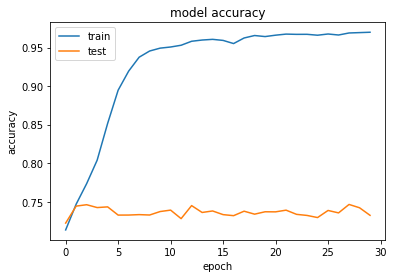

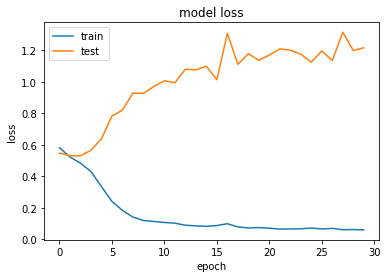

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 80s 1ms/sample - loss: 0.5743 - acc: 0.7158 - val_loss: 0.6206 - val_acc: 0.6431
Epoch 2/30
80000/80000 [==============================] - 79s 986us/sample - loss: 0.5315 - acc: 0.7412 - val_loss: 0.6701 - val_acc: 0.6801
Epoch 3/30
80000/80000 [==============================] - 79s 986us/sample - loss: 0.5212 - acc: 0.7501 - val_loss: 0.5147 - val_acc: 0.7532
Epoch 4/30
80000/80000 [==============================] - 79s 985us/sample - loss: 0.5115 - acc: 0.7571 - val_loss: 0.5515 - val_acc: 0.7332
Epoch 5/30
80000/80000 [==============================] - 79s 984us/sample - loss: 0.5036 - acc: 0.7612 - val_loss: 0.5763 - val_acc: 0.7314
Epoch 6/30
80000/80000 [==============================] - 79s 984us/sample - loss: 0.4852 - acc: 0.7730 - val_loss: 0.6754 - val_acc: 0.6454
Epoch 7/30
80000/80000 [==============================] - 79s 985us/sample - loss: 0.4

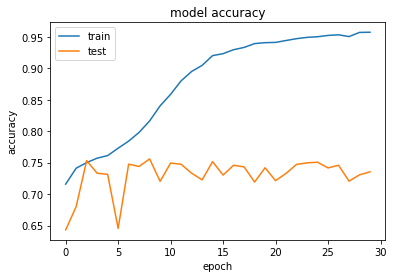

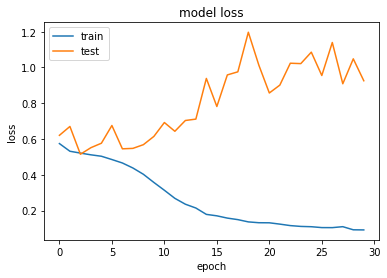

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 84s 1ms/sample - loss: 0.5859 - acc: 0.7174 - val_loss: 0.5464 - val_acc: 0.7332
Epoch 2/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.5296 - acc: 0.7447 - val_loss: 0.6430 - val_acc: 0.6773
Epoch 3/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.5195 - acc: 0.7515 - val_loss: 1.9621 - val_acc: 0.4217
Epoch 4/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.5130 - acc: 0.7565 - val_loss: 0.5205 - val_acc: 0.7582
Epoch 5/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.5047 - acc: 0.7602 - val_loss: 0.6428 - val_acc: 0.6337
Epoch 6/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.4971 - acc: 0.7663 - val_loss: 0.5900 - val_acc: 0.7149
Epoch 7/30
80000/80000 [==============================] - 82s 1ms/sample - loss: 0.4887 - acc: 0

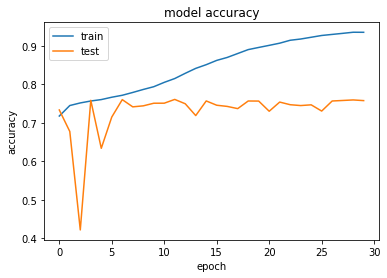

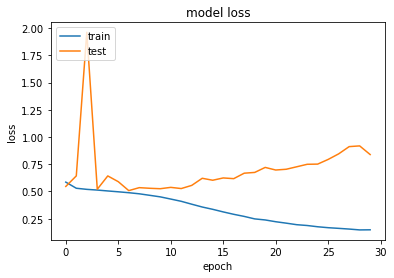

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 96s 1ms/sample - loss: 0.5898 - acc: 0.7095 - val_loss: 0.5819 - val_acc: 0.7044
Epoch 2/30
80000/80000 [==============================] - 94s 1ms/sample - loss: 0.5299 - acc: 0.7434 - val_loss: 0.5424 - val_acc: 0.7344
Epoch 3/30
80000/80000 [==============================] - 94s 1ms/sample - loss: 0.4975 - acc: 0.7627 - val_loss: 0.5379 - val_acc: 0.7460
Epoch 4/30
80000/80000 [==============================] - 94s 1ms/sample - loss: 0.4525 - acc: 0.7896 - val_loss: 0.5627 - val_acc: 0.7305
Epoch 5/30
80000/80000 [==============================] - 94s 1ms/sample - loss: 0.3741 - acc: 0.8304 - val_loss: 0.9449 - val_acc: 0.6155
Epoch 6/30
80000/80000 [==============================] - 94s 1ms/sample - loss: 0.2800 - acc: 0.8759 - val_loss: 0.6999 - val_acc: 0.7196
Epoch 7/30
80000/80000 [==============================] - 94s 1ms/sample - loss: 0.2314 - acc: 0

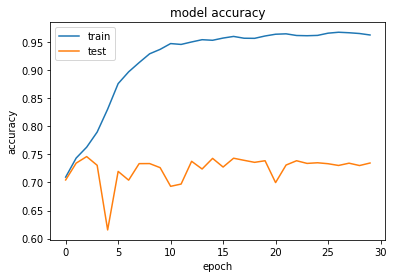

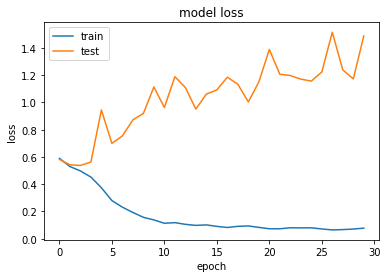

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 108s 1ms/sample - loss: 0.5757 - acc: 0.7133 - val_loss: 0.5804 - val_acc: 0.6971
Epoch 2/30
80000/80000 [==============================] - 107s 1ms/sample - loss: 0.5312 - acc: 0.7426 - val_loss: 0.5275 - val_acc: 0.7476
Epoch 3/30
80000/80000 [==============================] - 107s 1ms/sample - loss: 0.5190 - acc: 0.7501 - val_loss: 0.5317 - val_acc: 0.7412
Epoch 4/30
80000/80000 [==============================] - 107s 1ms/sample - loss: 0.5081 - acc: 0.7576 - val_loss: 0.6548 - val_acc: 0.6857
Epoch 5/30
80000/80000 [==============================] - 107s 1ms/sample - loss: 0.4979 - acc: 0.7650 - val_loss: 0.5255 - val_acc: 0.7488
Epoch 6/30
80000/80000 [==============================] - 107s 1ms/sample - loss: 0.4746 - acc: 0.7787 - val_loss: 0.5695 - val_acc: 0.7335
Epoch 7/30
80000/80000 [==============================] - 107s 1ms/sample - loss: 0.4373 -

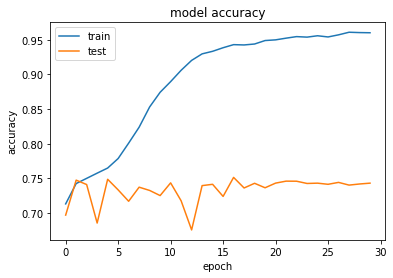

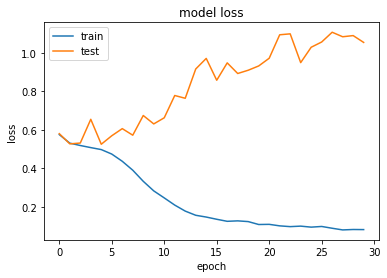

Ende des Versuchs: 
Train on 80000 samples, validate on 20000 samples
Epoch 1/30
80000/80000 [==============================] - 114s 1ms/sample - loss: 0.5671 - acc: 0.7183 - val_loss: 0.8571 - val_acc: 0.4913
Epoch 2/30
80000/80000 [==============================] - 112s 1ms/sample - loss: 0.5297 - acc: 0.7429 - val_loss: 0.5470 - val_acc: 0.7258
Epoch 3/30
80000/80000 [==============================] - 112s 1ms/sample - loss: 0.5193 - acc: 0.7511 - val_loss: 0.5932 - val_acc: 0.6923
Epoch 4/30
80000/80000 [==============================] - 112s 1ms/sample - loss: 0.5128 - acc: 0.7554 - val_loss: 1.0170 - val_acc: 0.4561
Epoch 5/30
80000/80000 [==============================] - 112s 1ms/sample - loss: 0.5040 - acc: 0.7614 - val_loss: 0.5250 - val_acc: 0.7459
Epoch 6/30
80000/80000 [==============================] - 113s 1ms/sample - loss: 0.4967 - acc: 0.7657 - val_loss: 0.5523 - val_acc: 0.7266
Epoch 7/30
80000/80000 [==============================] - 113s 1ms/sample - loss: 0.4886 -

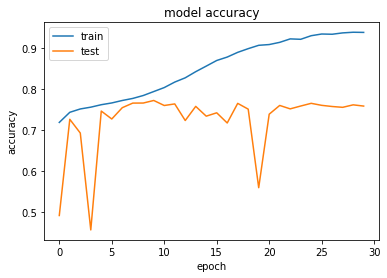

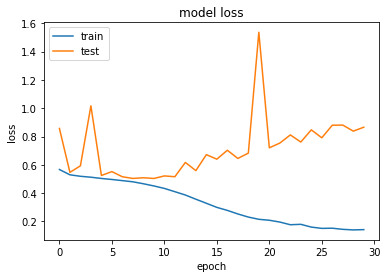

Ende des Versuchs: 


In [4]:
dense_layers = [1,2]
layer_sizes = [160,200]
conv_layers = [1,2,3]
kernal_size = [(4,4)]
for filter_size in kernal_size:
    for dense_layer in dense_layers:
        for layer_size in layer_sizes:
            for conv_layer in conv_layers:

                NAME ="LAPPD10x10-CNN-{}-filter_size-{}-conv-{}-nodes-{}-dense".format(filter_size,conv_layer+1, layer_size, dense_layer) #,int(time.time())
                tensorboard = TensorBoard(log_dir = 'logs\LAPPD10x10CNN\{}'.format(NAME))


                model = Sequential()
                model.add(Conv2D(layer_size,filter_size,strides=1, input_shape= X4.shape[1:],activation="relu", padding='same'))                                               
                model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))  
                model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                for l in range(conv_layer-1):                   
                    model.add(Conv2D(layer_size,filter_size,padding='same',activation="relu"))              
                    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))            
                #model.add(GlobalAveragePooling2D())
                model.add(Flatten())
                for l in range(dense_layer-1):
                    model.add(Dense(512-l*20 ,activation="relu" ))
                    model.add(BatchNormalization())
                    model.add(Dropout(0.2))
                model.add(Dense(32,activation="relu"))
                model.add(BatchNormalization())
                model.add(Dropout(0.2))
                model.add(Dense(2))
                model.add(Activation('softmax'))
                #adam = tf.keras.optimizers.Adam(learning_rate=0.01, beta_1=0.9, beta_2=0.999, amsgrad=True, epsilon = 0.001)
                model.compile(loss="binary_crossentropy",
                             optimizer="adam",
                              metrics=['accuracy']
                             )   
                filepath="LAPPD(1x1)_PID_120k-improvement-val-acc_{val_acc:.2f}.model"  
                checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
                #monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10, verbose=1, mode='auto', restore_best_weights=False)
                #model.summary()
                history=model.fit(
                    
                    X4[:80000],Y4[:80000],

                 validation_data=(X4[80000:100000],Y4[80000:100000])   
                    
              ,batch_size=70,
                shuffle=True,
                class_weight='balanced',
                callbacks=[
                            #monitor,
                            #checkpoint,
                            tensorboard 
                ],
              epochs= 30)
                print(history.history.keys())
                # summarize history for accuracy
                plt.plot(history.history['acc'])
                plt.plot(history.history['val_acc'])
                plt.title('model accuracy')
                plt.ylabel('accuracy')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()
                # summarize history for loss
                plt.plot(history.history['loss'])
                plt.plot(history.history['val_loss'])
                plt.title('model loss')
                plt.ylabel('loss')
                plt.xlabel('epoch')
                plt.legend(['train', 'test'], loc='upper left')
                plt.show()

                print("Ende des Versuchs: ")

In [11]:
X4.shape,Y4.shape

((110441, 30, 80, 2), (110441, 30, 80, 2))

### Unique Counts

In [10]:
unique, counts = np.unique(Y, return_counts=True, axis=0)
print("How much from one kind, how much from the other: \n",counts)
print("How do they look like? \n",unique)
print("Percentage of one kind: \n", 100/(counts[0]+counts[1])*counts[1])

How much from one kind, how much from the other: 
 [45697 64847]
How do they look like? 
 [[0 1]
 [1 0]]
Percentage of one kind: 
 58.6617093645969


# 6) Tensorboard

cd "Documents\Python\CNN_Masterarbeit"


tensorboard --logdir=logs/LAPPD10x10CNN --host localhost --port 8088

tensorboard --logdir=logs/LAPPD5x5CNN --host localhost --port 8088

tensorboard --logdir=logs/LAPPD1x1CNN --host localhost --port 8088

tensorboard --logdir=logs/PMT24sCNN --host localhost --port 8088



# 7) Evaluate

In [73]:
model = tf.keras.models.load_model("CNN_RC_LAPPD10x10-PMT-V2-Compersion_improvement-val-acc_0.84.model")

W0221 12:55:27.181114  8380 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\init_ops.py:97: calling GlorotUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0221 12:55:27.182114  8380 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0221 12:55:27.183115  8380 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared

In [4]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_17 (Conv2D)           (None, 100, 240, 1024)    347136    
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 50, 120, 1024)     0         
_________________________________________________________________
batch_normalization_23 (Batc (None, 50, 120, 1024)     4096      
_________________________________________________________________
dropout_23 (Dropout)         (None, 50, 120, 1024)     0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 50, 120, 500)      12800500  
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 25, 60, 500)       0         
_________________________________________________________________
batch_normalization_24 (Batc (None, 25, 60, 500)      

In [5]:
XTest= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/X_Testdata_Beam_RC_20k_globalnorm_PMT_Norm_PMTandLAPPD10x10_mitTopBottom.pickle","rb"))
YTest= pickle.load(open("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/pickle/Y_Testdata_Beam_RC_20k_globalnorm_PMT_Norm_PMTandLAPPD10x10_mitTopBottom.pickle","rb"))
###

In [5]:
score = model.evaluate(XTest, YTest, verbose=False) 
model.metrics_names
print('Test score: ', score[0])    #Loss on test
print('Test accuracy: ', score[1])

Test score:  1.0145620218873024
Test accuracy:  0.8024


In [21]:
# score = model.evaluate(XVal, Yval, verbose=False) 
# model.metrics_names
# print('Test score: ', score[0])    #Loss on test
# print('Test accuracy: ', score[1])

Test score:  0.34430509999264325
Test accuracy:  0.9534


In [23]:
# score = model.evaluate(XTraining, YTraining, verbose=False) 
# model.metrics_names
# print('Test score: ', score[0])    #Loss on test
# print('Test accuracy: ', score[1])

Test score:  0.3465932975390917
Test accuracy:  0.9552375


## 7.1) Confusion matrix


A)

In [34]:
y = Y[100000:]
prediction = model.predict(X[100000:])
print(prediction.shape,y.shape)
rounded_labels =np.argmax(y, axis=1)
y_prob = model.predict(X[100000:], batch_size=128, verbose=0)
y_classes = y_prob.argmax(axis=-1)
cm = confusion_matrix(rounded_labels, y_classes)
print(cm)

    #print('Confusion Matrix: \n\n', tf.Tensor.eval(cm,feed_dict=None, session=None))

(10441, 2) (10441, 2)
[[5705  400]
 [1375 2961]]


B)

In [74]:
y = YTest
prediction = model.predict(XTest)
print(prediction.shape,y.shape)
rounded_labels =np.argmax(y, axis=1)


y_prob = model.predict(XTest, batch_size=10, verbose=0)
y_classes = y_prob.argmax(axis=-1)
cm = confusion_matrix(rounded_labels, y_classes)
print(cm)

(20000, 2) (20000, 2)
[[10928   929]
 [ 3024  5119]]


In [137]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
 
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
 
    print(cm)
 
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
 
    fmt = '.3f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
 
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [83]:
plt.rcParams['figure.figsize'] = [17/1.8, 9/1.8]

In [96]:

font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

plt.rc('font', **font)


SMALL_SIZE = 13
MEDIUM_SIZE = 18
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE) # fontsize of the figure title
title_font = {'fontname':'Arial', 'size':'20', 'color':'black', 'weight':'bold',
              #'verticalalignment':'bottom'
             }

[[0.93447993 0.06552007]
 [0.31711255 0.68288745]]


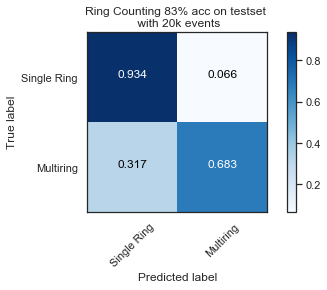

In [139]:
# Reshape into 2 x 2 matrix
cm = cm.reshape((2,2))
 
class_names = ["Single Ring", "Multiring"]
 
    
# Plot normalized confusion matrix
f=plt.figure()
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Ring Counting 83% acc on testset \n with 20k events')
#f.savefig("Confusion-CNN-81%-Ring Counting.png",format ="png", bbox_inches='tight')                    
#f.savefig("Confusion-CNN-81%-Ring Counting.pdf",format ="pdf", bbox_inches='tight') 
plt.show()

In [31]:
score = model.evaluate(X[90000:], Y[90000:], verbose=False) 
model.metrics_names
print('Test score: ', score[0])    #Loss on test
print('Test accuracy: ', score[1])

Test score:  0.5399368944148729
Test accuracy:  0.78680104


# 8) Visualize

In [13]:
from tensorflow import keras
import pydot_ng as pydot
from keras.utils.vis_utils import model_to_dot
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

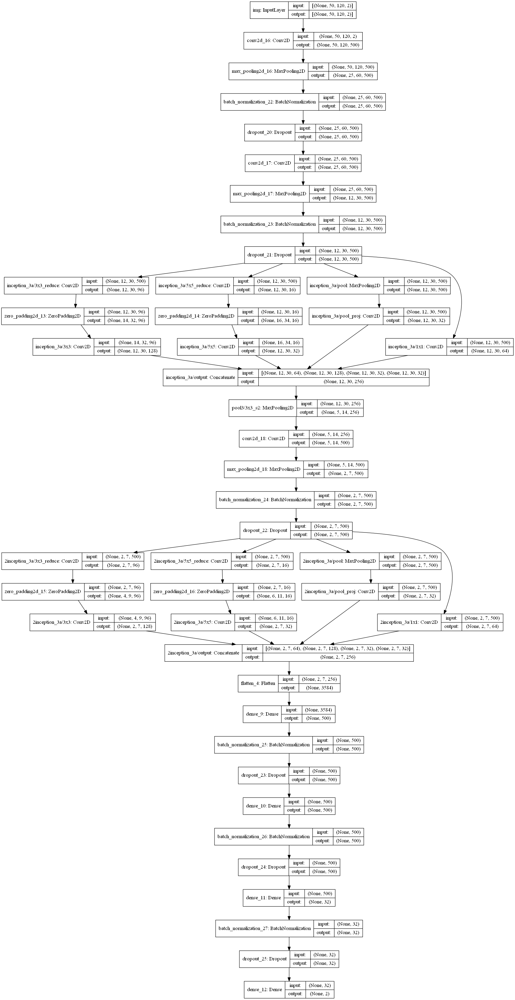

In [17]:
keras.utils.plot_model(model, 'löschen.png', show_shapes=True)

In [4]:
from matplotlib import pyplot

In [5]:
plt.rcParams['figure.figsize'] = [6.4, 30*4.8]

In [6]:
#model = tf.keras.models.load_model("PMTOnly_RingCounting-improvement-val-acc_0.81.model")
model = tf.keras.models.load_model("Testmodel RC 5x5 0.83acc.model")

W0120 20:13:49.465373 18908 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\init_ops.py:97: calling GlorotUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0120 20:13:49.465373 18908 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0120 20:13:49.465373 18908 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared

In [33]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_60 (Conv2D)           (None, 50, 120, 100)      33900     
_________________________________________________________________
max_pooling2d_60 (MaxPooling (None, 25, 60, 100)       0         
_________________________________________________________________
batch_normalization_88 (Batc (None, 25, 60, 100)       400       
_________________________________________________________________
dropout_88 (Dropout)         (None, 25, 60, 100)       0         
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 25, 60, 100)       250100    
_________________________________________________________________
max_pooling2d_61 (MaxPooling (None, 13, 30, 100)       0         
_________________________________________________________________
batch_normalization_89 (Batc (None, 13, 30, 100)       4

conv2d_11 (5, 5, 2, 200)


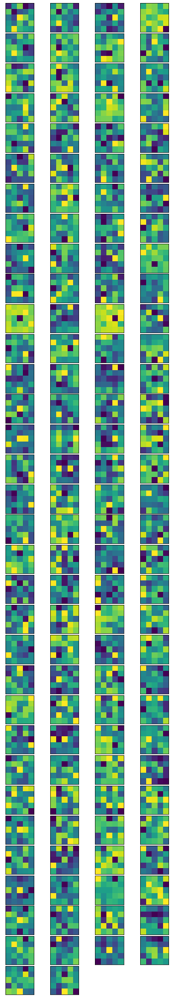

In [9]:
#summarize filter shapes
pyplot.subplots_adjust(wspace = 0.05 ,hspace = 0.05)
for layer in model.layers:
    #check for conv. layer
    if 'conv' not in layer.name:
        continue
    #get filter weights
    filters, biases = layer.get_weights()
    print(layer.name, filters.shape)
    f_min, f_max= filters.min(),filters.max()
    filters = (filters-f_min)/(f_max-f_min)
    # plot first few filters
    

    n_filters, ix = 130, 1


    for i in range(n_filters):
        #get the filter
        f = filters[:, :, :, i]
        # plot each channel separately

      


        ax = pyplot.subplot(n_filters, 4, ix)
        
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        pyplot.imshow(f[:,:, 1], cmap='viridis')
        ix += 1
    # show the figure
    #pyplot.savefig("Ringcounting PMT Model 85% layer0 ALL ConvFilters-Time.jpg",format ="jpg", bbox_inches='tight')
    pyplot.show()
    
    break

In [7]:
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    print(i, layer.name, layer.output.shape)

1 conv2d_11 (?, 10, 16, 200)
4 conv2d_12 (?, 5, 8, 200)
7 conv2d_13 (?, 2, 4, 200)


In [8]:
plt.rcParams['figure.figsize'] = [6.4, 10*4.8]

In [9]:
from tensorflow.keras.models import Model
from matplotlib import pyplot
from numpy import expand_dims

In [10]:
config = tf.compat.v1.ConfigProto() 
config.gpu_options.allow_growth = True

session = tf.compat.v1.Session(config=config)

In [15]:
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    print(i, layer.name, layer.output.shape)


1 conv2d_11 (?, 10, 16, 200)
4 conv2d_12 (?, 5, 8, 200)
7 conv2d_13 (?, 2, 4, 200)


In [14]:


model = tf.keras.models.load_model("PMTOnly_RingCounting-improvement-val-acc_0.81.model")
feature_maps = model.predict(X[9:10])

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
img (InputLayer)             [(None, 10, 16, 2)]       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 10, 16, 200)       10200     
Total params: 10,200
Trainable params: 10,200
Non-trainable params: 0
_________________________________________________________________
(1, 10, 16, 200)


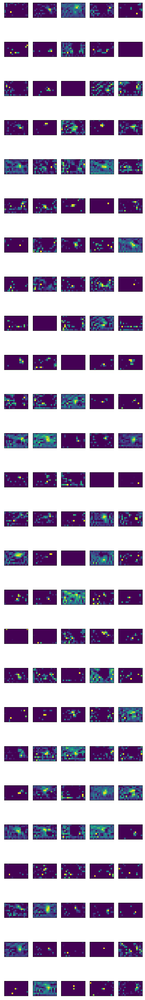

In [16]:

model = tf.keras.models.load_model("PMTOnly_RingCounting-improvement-val-acc_0.81.model")



ixs = [0]

outputs = [model.layers[i].output for i in ixs]



model = Model(inputs=model.inputs, outputs=model.layers[1].output)

model.summary()





# get feature map for first hidden layer

feature_maps = model.predict(X[9:10])
print(feature_maps.shape)
# plot all 64 maps in an 8x8 squares

#for fmap in feature_maps:
ix = 1
a=130
for _ in range(a):
    for _ in range(a):
        if ix==a+1:
            break
        # specify subplot and turn of axis
        ax = pyplot.subplot(26, 5, ix)
        ax.set_xticks([])
        ax.set_yticks([])

        # plot filter channel in grayscale
        pyplot.imshow(feature_maps[0, :, :, ix-1], cmap='viridis')
        ix += 1
    # show the figure
pyplot.savefig("Ring Couting PMT layer0 ALL Conv ElectronEvent9.jpg",format ="jpg", bbox_inches='tight')
pyplot.show()


# Plot Preditcion Matrix

In [3]:
from tensorflow.keras.models import Model
from matplotlib import pyplot
from numpy import expand_dims
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

In [8]:
def sigmoid(x):

    return 1 / (1 + np.exp(-x))


print(sigmoid(0.5))

0.6224593312018546


In [21]:
def normX(x):
    
    return abs((x-min(feature_maps[:,0]))/(max(feature_maps[:,0])-min(feature_maps[:,0])))
def normY(x):
    
    return abs((x-min(feature_maps[:,1]))/(max(feature_maps[:,1])-min(feature_maps[:,1])))

#print(normX(min(feature_maps[:,0])),min(feature_maps[:,0]))

In [4]:
model = tf.keras.models.load_model("Testmodel RC 5x5 0.83acc.model")

W0306 11:49:34.474789 22488 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\init_ops.py:97: calling GlorotUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0306 11:49:34.474789 22488 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\tensorflow\python\ops\init_ops.py:1251: calling VarianceScaling.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
W0306 11:49:34.474789 22488 deprecation.py:506] From C:\Program Files (x86)\Microsoft Visual Studio\Shared

In [38]:
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'dense' not in layer.name:
        continue
    print(i, layer.name, layer.output.shape)

25 dense_57 (?, 512)
28 dense_58 (?, 100)
31 dense_59 (?, 2)


In [18]:
ixs = [0]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=model.layers[31].output)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_60_input (InputLayer) [(None, 50, 120, 2)]      0         
_________________________________________________________________
conv2d_60 (Conv2D)           (None, 50, 120, 100)      33900     
_________________________________________________________________
max_pooling2d_60 (MaxPooling (None, 25, 60, 100)       0         
_________________________________________________________________
batch_normalization_88 (Batc (None, 25, 60, 100)       400       
_________________________________________________________________
dropout_88 (Dropout)         (None, 25, 60, 100)       0         
_________________________________________________________________
conv2d_61 (Conv2D)           (None, 25, 60, 100)       250100    
_________________________________________________________________
max_pooling2d_61 (MaxPooling (None, 13, 30, 100)       0     

In [5]:
feature_maps = model.predict(X[100000:])


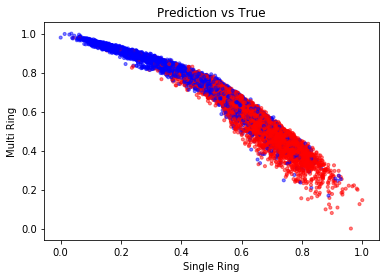

In [84]:
colors = y0colors = ['red' if value > 0.5 else 'blue' for value in Y[100000:,0]]#(0,0,0)
area = np.pi*3

# Plot
plt.scatter(normX(feature_maps[:,0]),normY(feature_maps[:,1]),s=area,  c=colors, alpha=0.5)
plt.title('Prediction vs True')
plt.xlabel('Single Ring')
plt.ylabel('Multi Ring')
plt.show()

In [6]:
t=1.1
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

plt.rc('font', **font)


SMALL_SIZE = 13/t
MEDIUM_SIZE = 18/t
BIGGER_SIZE = 18/t

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE) # fontsize of the figure title
title_font = {'fontname':'Arial', 'size':'20', 'color':'black', 'weight':'bold'}


NameError: name 'im' is not defined

W0228 13:13:28.616757  4920 font_manager.py:1282] findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


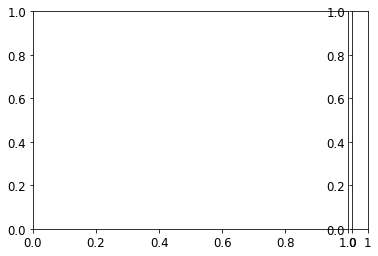

In [12]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# import numpy as np


# ax = plt.gca()


# # create an axes on the right side of ax. The width of cax will be 5%
# # of ax and the padding between cax and ax will be fixed at 0.05 inch.
# divider = make_axes_locatable(ax)
# cax = divider.append_axes("right", size="5%", pad=0.05)

# plt.colorbar(im, cax=cax)

In [7]:
y = Y[100000:]
prediction = model.predict(X[100000:])
print(prediction.shape,y.shape)
rounded_labels =np.argmax(y, axis=1)
y_prob = model.predict(X[100000:], batch_size=128, verbose=0)
y_classes = y_prob.argmax(axis=-1)
cm = confusion_matrix(rounded_labels, y_classes)
print(cm)

    #print('Confusion Matrix: \n\n', tf.Tensor.eval(cm,feed_dict=None, session=None))

(10441, 2) (10441, 2)
[[5705  400]
 [1375 2961]]


W0306 11:51:42.257036 22488 font_manager.py:1282] findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
W0306 11:51:42.341660 22488 font_manager.py:1282] findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


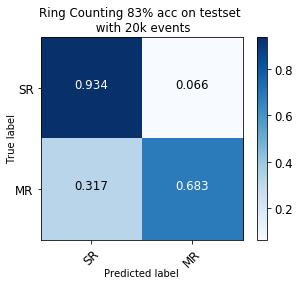

In [8]:
cm = confusion_matrix(rounded_labels, y_classes)
#print(cm)
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
 
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
 
    #print(cm)
 
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
 
    fmt = '.3f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
 
    plt.tight_layout()
    plt.ylabel('True label',style='normal', color='black',size =10,labelpad=0-2)
    plt.xlabel('Predicted label',size =10,labelpad=0-1)
    
    
    ax = plt.gca()

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    plt.colorbar(cax=cax)
    plt.show()
    
#cm = cm.reshape((2,2))
 
class_names = ["SR", "MR"]
 
    
# Plot normalized confusion matrix
f=plt.figure()
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Ring Counting 83% acc on testset \n with 20k events')
#f.savefig("Confusion-CNN-81%-Ring Counting.png",format ="png", bbox_inches='tight')                    
#f.savefig("Confusion-CNN-81%-Ring Counting.pdf",format ="pdf", bbox_inches='tight') 
#plt.show()

In [79]:
model = tf.keras.models.load_model("Testmodel RC 5x5 0.83acc.model")
ixs = [0]

outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=model.layers[31].output)
#model.summary()
feature_maps = model.predict(X[100000:])

In [9]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import matplotlib.patches as mpatches

colors = y0colors = ['red' if value[0] > value[1] else 'blue' for value in Y[100000:]]#(1,0)
area = np.pi

# Plot
# plt.scatter(normX(feature_maps[:,0]),normY(feature_maps[:,1]),s=area,  c=colors, alpha=0.5)
# plt.title('Prediction vs True')
# plt.xlabel('Single Ring')
# plt.ylabel('Multi Ring')
# plt.show()


x = normX(feature_maps[:,0])
y = normY(feature_maps[:,1])

#x = feature_maps[:,0]
x1=[]
x2=[]
for value in range(len(x)):
    if Y[100000+value,0] > Y[100000+value,1]:
        x1.append(x[value])
        x2.append(1-x[value])
    
#y = feature_maps[:,1]
y1=[]
y2=[]
for value in range(len(y)):
    if Y[100000+value,0] < Y[100000+value,1]:
        y1.append(y[value])
        y2.append(1-y[value])

fig = plt.figure(figsize=(8,8))
plt.title('Ring Counting 83% acc on testset with 20k events')
gs = gridspec.GridSpec(3, 3)
ax_main = plt.subplot(gs[1:3, :2])
ax_xDist = plt.subplot(gs[0, :2],sharex=ax_main)
ax_yDist = plt.subplot(gs[1:3, 2],sharey=ax_main)
tommy = plt.subplot(gs[0,2])


ax_main.scatter(x,y,marker='.', color=colors)
ax_main.set(xlabel="Probability Single Ring", ylabel="Probability Multi Ring")
red_patch = mpatches.Patch(color='red', label='True Single Rings')
blue_patch = mpatches.Patch(color='blue', label='True Multi Rings')
ax_main.legend(handles=[red_patch, blue_patch],loc='lower left')


ax_xDist.hist(x1 ,bins=100,align='mid', color='red',histtype='stepfilled', log=True)
ax_xDist.hist(y2,bins=100,histtype='step',normed=False,color='blue',align='mid',log=True)
ax_xDist.set(ylabel='count')
#ax_xDist.text(1, 1, 'Test', #style='italic',bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
#ax_xCumDist = ax_xDist.twinx()
#ax_xDist.hist(y1,bins=100,cumulative=False,histtype='step',normed=True,color='blue',align='mid')
#ax_xCumDist.tick_params('y', colors='r')
#ax_xCumDist.set_ylabel('Singlering',color='r')

ax_yDist.hist(y1,bins=100,orientation='horizontal',align='mid',histtype='stepfilled',log=True )
ax_yDist.hist(x2,bins=100,histtype='step',orientation='horizontal',normed=False,color='red',align='mid',log=True)
ax_yDist.set(xlabel='count')
#ax_yCumDist = ax_yDist.twiny()
#ax_yCumDist.hist(y,bins=100,cumulative=False,histtype='step',normed=True,color='blue',align='mid',orientation='horizontal')
#ax_yCumDist.tick_params('x', colors='r')
#ax_yCumDist.set_xlabel('Multiring',color='blue')

tommy.draw(plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Confusion Matrix'))
#tightfig()
plt.show()

NameError: name 'normX' is not defined

In [83]:
model = tf.keras.models.load_model("Testmodel RC 5x5 0.83acc.model")


feature_maps = model.predict(X[100000:])

C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\ipykernel_launcher.py:53: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
C:\Program Files (x86)\Microsoft Visual Studio\Shared\Anaconda3_64\envs\Tensorflow\lib\site-packages\ipykernel_launcher.py:62: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
W0306 11:52:11.327838 22488 font_manager.py:1282] findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


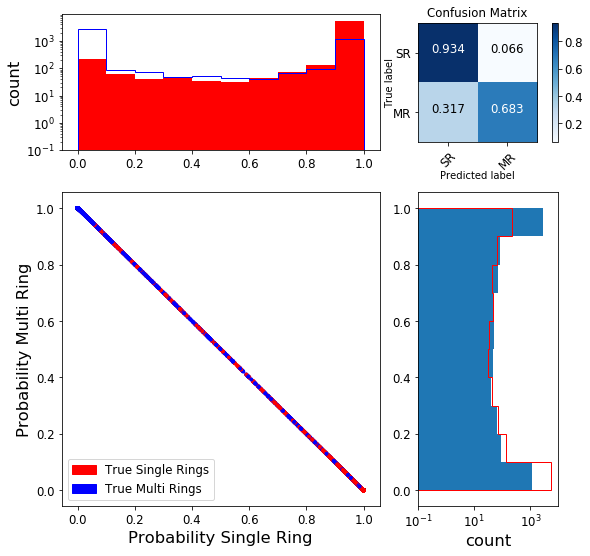

In [10]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import matplotlib.patches as mpatches

colors = y0colors = ['red' if value[0] > value[1] else 'blue' for value in Y[100000:]]#(1,0)
area = np.pi

# Plot
# plt.scatter(normX(feature_maps[:,0]),normY(feature_maps[:,1]),s=area,  c=colors, alpha=0.5)
# plt.title('Prediction vs True')
# plt.xlabel('Single Ring')
# plt.ylabel('Multi Ring')
# plt.show()


#x = normX(feature_maps[:,0])
#y = normY(feature_maps[:,1])

x = feature_maps[:,0]
x1=[]
x2=[]
for value in range(len(x)):
    if Y[100000+value,0] > Y[100000+value,1]:
        x1.append(x[value])
        x2.append(1-x[value])
    
y = feature_maps[:,1]
y1=[]
y2=[]
for value in range(len(y)):
    if Y[100000+value,0] < Y[100000+value,1]:
        y1.append(y[value])
        y2.append(1-y[value])

fig = plt.figure(figsize=(8,8))
plt.title('Ring Counting 83% acc on testset with 20k events')
gs = gridspec.GridSpec(3, 3)
ax_main = plt.subplot(gs[1:3, :2])
ax_xDist = plt.subplot(gs[0, :2],sharex=ax_main)
ax_yDist = plt.subplot(gs[1:3, 2],sharey=ax_main)
tommy = plt.subplot(gs[0,2])


ax_main.scatter(x,y,marker='.', color=colors)
ax_main.set(xlabel="Probability Single Ring", ylabel="Probability Multi Ring")
red_patch = mpatches.Patch(color='red', label='True Single Rings')
blue_patch = mpatches.Patch(color='blue', label='True Multi Rings')
ax_main.legend(handles=[red_patch, blue_patch],loc='lower left')


ax_xDist.hist(x1 ,bins=10,align='mid', color='red',histtype='stepfilled', log=True)
ax_xDist.hist(y2,bins=10,histtype='step',normed=False,color='blue',align='mid',log=True)
ax_xDist.set(ylabel='count')
#ax_xDist.text(1, 1, 'Test', #style='italic',bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
#ax_xCumDist = ax_xDist.twinx()
#ax_xDist.hist(y1,bins=100,cumulative=False,histtype='step',normed=True,color='blue',align='mid')
#ax_xCumDist.tick_params('y', colors='r')
#ax_xCumDist.set_ylabel('Singlering',color='r')

ax_yDist.hist(y1,bins=10,orientation='horizontal',align='mid',histtype='stepfilled',log=True )
ax_yDist.hist(x2,bins=10,histtype='step',orientation='horizontal',normed=False,color='red',align='mid',log=True)
ax_yDist.set(xlabel='count')
#ax_yCumDist = ax_yDist.twiny()
#ax_yCumDist.hist(y,bins=100,cumulative=False,histtype='step',normed=True,color='blue',align='mid',orientation='horizontal')
#ax_yCumDist.tick_params('x', colors='r')
#ax_yCumDist.set_xlabel('Multiring',color='blue')

tommy.draw(plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Confusion Matrix'))
#tightfig()
plt.show()

In [44]:
p=0
liste=[]
cut=0.7
cut2=0.7
for event in range(len(y)):
    if x[event]>cut and y[event]<cut:
        p=p+1
        liste.append(event)
#print(len(x),len(liste))

wrongliste=[]
trueliste=[]
for event in liste:
    if Y[100000+event,0]<0.5:
        wrongliste.append(event)
    else:
        trueliste.append(event)
print("Anzahl an Events überhalb 70% Wahrschinlichkeit für Singlering: {} \n".format(len(liste)),"Verschmutzung: {} \n".format( len(wrongliste)),"Prozentualer korrekter Anteil: ",round((len(liste)-len(wrongliste))*100/len(liste),2),"%")

#p=0
liste2=[]

for event in range(len(y)):
    if y[event]>cut2 and x[event]<cut2:
        #p=p+1
        liste2.append(event)
#print(len(x),len(liste))

wrongliste2=[]
trueliste2=[]
for event in liste2:
    if Y[100000+event,1]<0.5:
        wrongliste2.append(event)
    else:
        trueliste2.append(event)
print("\n \n")
print("Anzahl an Events überhalb 70% Wahrschinlichkeit für Multiringe: {} \n".format(len(liste2)),"Verschmutzung: {} \n".format( len(wrongliste2)),"Prozentualer korrekter Anteil: ",round((len(liste2)-len(wrongliste2))*100/len(liste2),2),"%")

print("\n \n")
print("Verlorene Events: ", len(x)-(len(liste)+len(liste2)))
print("Prozentualer Anteil (Verlust an Events): ", round((len(x)-(len(liste)+len(liste2)))*100/len(x),2),"%")

Anzahl an Events überhalb 70% Wahrschinlichkeit für Singlering: 2473 
 Verschmutzung: 244 
 Prozentualer korrekter Anteil:  90.13 %

 

Anzahl an Events überhalb 70% Wahrschinlichkeit für Multiringe: 3867 
 Verschmutzung: 664 
 Prozentualer korrekter Anteil:  82.83 %

 

Verlorene Events:  4101
Prozentualer Anteil (Verlust an Events):  39.28 %


In [78]:
Schnitt = np.arange(0.5 ,1, 0.05)

SRPKA = []
MRPKA = []
for cut in Schnitt:
    
    print( "Selected Cut: ", round(cut,2))
    liste=[]
    liste2=[]
    
    for event in range(len(x1)):
        if x1[event] > round(cut,2):# and y[event] < round(cut,2):
            liste.append(event)
    for event in range(len(y1)):      
        if y1[event] > round(cut,2):# and x[event] < round(cut,2):
            liste2.append(event)
    #print(len(x),len(liste))

    wrongliste=[]
    trueliste=[]
    
    
    
    for event in y2:
        if event > round(cut,2):
            wrongliste.append(event)
        else:
            trueliste.append(event)
            
    SRPKA.append(round((len(liste)-len(wrongliste))/len(liste),2))
    print("Anzahl an Events überhalb {}% Wahrschinlichkeit für Singlering: {} \n".format(round(cut*100,2) ,len(liste)),"Verschmutzung: {} \n".format( len(wrongliste)),"Prozentualer korrekter Anteil: ",round((len(liste)-len(wrongliste))*100/len(liste),2),"%")


    wrongliste2=[]
    trueliste2=[]
    for event in x2:
        if event > round(cut,2):
            wrongliste2.append(event)
        else:
            trueliste2.append(event)
            
    MRPKA.append(round((len(liste2)-len(wrongliste2))/len(liste),2))
    
    print("\n ")
    print("Anzahl an Events überhalb {}% Wahrschinlichkeit für Multiringe: {} \n".format(round(cut*100,2),len(liste2)),"Verschmutzung: {} \n".format( len(wrongliste2)),"Prozentualer korrekter Anteil: ",round((len(liste2)-len(wrongliste2))*100/len(liste2),2),"%")

    print("\n")
    print("Verlorene Events: ", len(x)-(len(liste)+len(liste2)))
    print("Accurency: Prozentualer Anteil (Verlust an Events): ", round((len(x)-(len(liste)+len(liste2)))*100/len(x),2),"%")#Anteil der korrekten SR im SR-Vorhersagen_Liste
    print("Übrig gebliebene Events: ",len(liste)+len(liste2) )
    print("Purity: ")#Alle Ture Single Ringe im Predicted Single Ring sample 1-Verschmutzung durch True Mutliringe )
    print("Purity: ")#Alle Ture Single Ringe im Predicted Single Ring sample 1-Verschmutzung durch True Mutliringe )
    print("Prozentualer Anteil (Noch Übrig): ", round((len(liste)+len(liste2))*100/len(x),2),"%")
    
    print("----------------------------------------","\n \n \n \n ","----------------------------------------")

Selected Cut:  0.5
Anzahl an Events überhalb 50.0% Wahrschinlichkeit für Singlering: 5706 
 Verschmutzung: 1375 
 Prozentualer korrekter Anteil:  75.9 %

 
Anzahl an Events überhalb 50.0% Wahrschinlichkeit für Multiringe: 2961 
 Verschmutzung: 399 
 Prozentualer korrekter Anteil:  86.52 %


Verlorene Events:  1774
Prozentualer Anteil (Verlust an Events):  16.99 %
Übrig gebliebene Events:  8667
Prozentualer Anteil (Noch Übrig):  83.01 %
---------------------------------------- 
 
 
 
  ----------------------------------------
Selected Cut:  0.55
Anzahl an Events überhalb 55.0% Wahrschinlichkeit für Singlering: 5690 
 Verschmutzung: 1345 
 Prozentualer korrekter Anteil:  76.36 %

 
Anzahl an Events überhalb 55.0% Wahrschinlichkeit für Multiringe: 2932 
 Verschmutzung: 382 
 Prozentualer korrekter Anteil:  86.97 %


Verlorene Events:  1819
Prozentualer Anteil (Verlust an Events):  17.42 %
Übrig gebliebene Events:  8622
Prozentualer Anteil (Noch Übrig):  82.58 %
---------------------------

In [69]:
y2[1]

0.6177762448787689

# Seaborn Graph

In [130]:
import seaborn as sns
sns.set(style="white", color_codes=True)

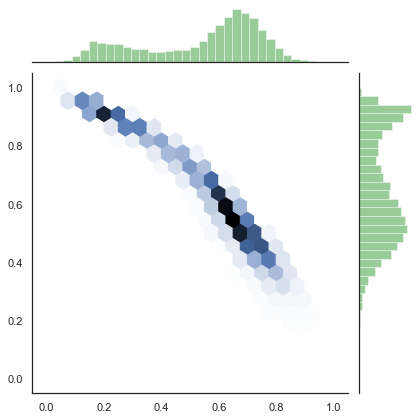

In [131]:
g = sns.jointplot(x=x, y=y, kind="hex", stat_func=None, marginal_kws={'color': 'green'},gridsize=20)

#plt.setp(g.ax_marg_y.patches, color="r")

## Energy Graph

In [2]:
NeutrinoEnergy= np.load("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/Temp/EnergyNeutrino.npy")
NeutronNumber= np.load("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/Temp/NN.npy")
PionE=np.load("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/Temp/EnergyPion.npy",allow_pickle=True)
MuonE=np.load("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/Temp/EnergyMuon.npy",allow_pickle=True)
KaonE=np.load("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/Temp/EnergyKaon.npy",allow_pickle=True)
EE=np.load("C:/Users/Deep Thought/Documents/Python/CNN_Masterarbeit/BeamRingCounting/Temp/EnergyElectron.npy",allow_pickle=True)
###

In [3]:
PionEn=[]
MuonEn=[]
KaonEn=[]
EEn=[]
dummyindex=[]
for event in range(len(feature_maps)):
    if PionE[100000+event] ==0:
        dummyindex.append(0)
        continue
    else:
        dummyindex.append(1)
        if len(PionE[100000+event])==1:
            PionEn.append((float(PionE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
        if len(PionE[100000+event])==2:
            PionEn.append((float(PionE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
            PionEn.append((float(PionE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
        if len(PionE[100000+event])==3:
            PionEn.append((float(PionE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
            PionEn.append((float(PionE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
            PionEn.append((float(PionE[100000+event][2]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
PionEn=np.array(PionEn)

for event in range(len(feature_maps)):
    if MuonE[100000+event] ==0:
        continue
    else:
        if len(MuonE[100000+event])==1 and dummyindex[event]==1:
            MuonEn.append((float(MuonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
        if len(MuonE[100000+event])==2 and dummyindex[event]==1:
            MuonEn.append((float(MuonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
            MuonEn.append((float(MuonE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,0],Y[100000+event,:]))
        if len(MuonE[100000+event])==3 and dummyindex[event]==1:
            MuonEn.append((float(MuonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
            MuonEn.append((float(MuonE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
            MuonEn.append((float(MuonE[100000+event][2]),NeutrinoEnergy[100000+event],feature_maps[event,0],feature_maps[event,1],Y[100000+event,0],Y[100000+event,1]))
MuonEn=np.array(MuonEn)

pyplot.hist(PionEn[:,0], bins=100, alpha=0.4,log=True, label='Pion Energieverteilung')
pyplot.hist(PionEn[:,1], bins=100, alpha=0.4,log=True, label='Neutrino Energieverteilung')
pyplot.hist(MuonEn[:,0], bins=100, alpha=0.5,log=True, label='Muon Energieverteilung',histtype='step', stacked=True)
#pyplot.hist(PionEn[:,0]-130, bins=100,histtype='step', stacked=True, fill=False, alpha=0.5,log=True, label='Pion Energieverteilung')
#pyplot.hist(PionEn[:,3], bins=100, alpha=0.5,log=True, label='Multiring Wahrscheinlichkeit')
pyplot.legend(loc='upper right')
pyplot.title('Pion Ereignisse')
pyplot.show()

NameError: name 'feature_maps' is not defined

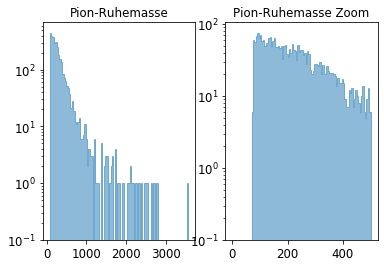

In [141]:
plt.subplot(1, 2, 1)
pyplot.hist(PionEn[:,0]-130, bins=100,histtype='step', stacked=True, fill=True, alpha=0.5,log=True, label='Pion Energieverteilung Minus Ruhemasse')
#pyplot.hist(PionEn[:,3], bins=100, alpha=0.5,log=True, label='Multiring Wahrscheinlichkeit')
#pyplot.legend(loc='upper right')

pyplot.title('Pion-Ruhemasse')

...

plt.subplot(1, 2, 2)
pyplot.hist(PionEn[:,0]-130, bins=100,histtype='step',range=(0,500), stacked=True, fill=True, alpha=0.5,log=True, label='Pion Energieverteilung Minus Ruhemasse')
#pyplot.hist(PionEn[:,3], bins=100, alpha=0.5,log=True, label='Multiring Wahrscheinlichkeit')
#pyplot.legend(loc='upper right')

pyplot.title('Pion-Ruhemasse Zoom')

fig.tight_layout()
pyplot.show()

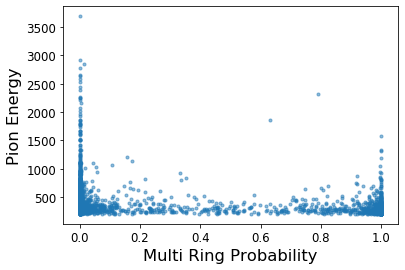

In [145]:
plt.scatter(PionEn[:,2],PionEn[:,0],s=area,  alpha=0.5)#
#ax.title('Single Ring Prediction vs Energy')
plt.xlabel('Multi Ring Probability')
plt.ylabel('Pion Energy')

plt.show()

In [169]:
print(len(NeutronNumber),len(X),len(dummyindex))


110441 110441 10441


In [173]:
print(len(NeutronNumberPion),len(PionEn))


2965 3103


In [172]:
NeutronNumberPion=[]
index=0

for event in dummyindex:
    if event==1:
        NeutronNumberPion.append(NeutronNumber[100000+index],Neutri)
        index=index+1  
    if len(PionE[100000+event])==1 and dummyindex[event]==1:
        NeutronNumberPion.append(NeutronNumber[100000+index])
    if len(PionE[100000+event])==2 and dummyindex[event]==1:
        NeutronNumberPion.append(NeutronNumber[100000+index])
    if len(PionE[100000+event])==3 and dummyindex[event]==1: 
        NeutronNumberPion.append(NeutronNumber[100000+index])
print(index)

2965


In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt


In [178]:
plt.rcParams['figure.figsize'] = [17, 9]

In [293]:
Z.shape

(120, 120)

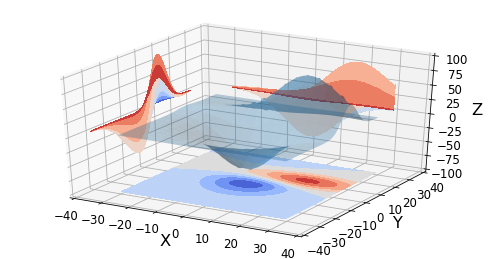

In [295]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from matplotlib import cm

fig = plt.figure()
ax = fig.gca(projection='3d')
X, Y, Z = axes3d.get_test_data(0.05)

# Plot the 3D surface
ax.plot_surface(X, Y, Z, rstride=8, cstride=8, alpha=0.3)

# Plot projections of the contours for each dimension.  By choosing offsets
# that match the appropriate axes limits, the projected contours will sit on
# the 'walls' of the graph
cset = ax.contourf(X, Y, Z, zdir='z', offset=-100, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Z, zdir='x', offset=-40, cmap=cm.coolwarm)
cset = ax.contourf(X, Y, Z, zdir='y', offset=40, cmap=cm.coolwarm)

ax.set_xlim(-40, 40)
ax.set_ylim(-40, 40)
ax.set_zlim(-100, 100)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()

In [307]:
print(feature_maps[:,1].shape,NeutronNumber[100000:].shape,NeutrinoEnergy[100000:].shape)

(10441,) (10441,) (10441,)


In [308]:
# from mpl_toolkits.mplot3d import axes3d
# import matplotlib.pyplot as plt
# from matplotlib import cm

# fig = plt.figure()
# ax = fig.gca(projection='3d')


# colors = y0colors = ['red' if value > 0.5 else 'blue' for value in Y[100000:,0]]#(0,0,0)
# area = np.pi*3


# ax.scatter(feature_maps[:,1],NeutronNumber[100000:],NeutrinoEnergy[100000:],s=area,c=colors,alpha=0.5)
# #ax.hist(x1 ,bins=10,zs=0, zdir='z',align='mid', color='red',histtype='stepfilled', log=True)
# #ax.hist(y1,bins=10,zs=0, zdir='y',orientation='horizontal',align='mid',histtype='stepfilled',log=True )

# ax.set_xlabel('Multi Ring Probability',labelpad=20)
# ax.set_ylabel('Neutron Number' ,labelpad=20)
# ax.set_zlabel('Neutrino Energy',labelpad=20)




fig = plt.figure()


ax = fig.add_subplot(111, projection='3d')

colors = y0colors = ['red' if value > 0.5 else 'blue' for value in Y[100000:,0]]#(0,0,0)
area = np.pi*3

# Plot
ax.scatter(feature_maps[:,1],NeutronNumber[100000:],NeutrinoEnergy[100000:],s=area,c=colors,   alpha=0.5)#


red_patch = mpatches.Patch(color='red', label='True Single Rings')
blue_patch = mpatches.Patch(color='blue', label='True Multi Rings')
ax.legend(handles=[red_patch, blue_patch],loc='upper right')
#ax.title('Single Ring Prediction vs Energy')
ax.set_ylabel('Neutron Number',labelpad=20)
ax.set_xlabel('Multi Ring Probability',labelpad=20)
ax.set_zlabel('Neutrino Energy',labelpad=20)

plt.tight_layout()
plt.show()

ValueError: operands could not be broadcast together with remapped shapes [original->remapped]: (0,4) and requested shape (10441,4)

<Figure size 612x324 with 1 Axes>

# Neutron Corelation to accurency SINgle Ring

In [237]:
N0=[]
N1=[]
N2=[]
N3=[]
N4=[]
N5=[]
N6=[]
N7=[]
N8=[]
i0=0
i1=0
i2=0
i3=0
i4=0
i5=0
i6=0
i7=0
i8=0
for event in range(len(feature_maps)):
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==0 and feature_maps[event,0]>0.5:
        N0.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==0:
        i0=i0+1
        
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==1 and feature_maps[event,0]>0.5:
        N1.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==1:
        i1=i1+1
        
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==2 and feature_maps[event,0]>0.5:
        N2.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==2:
        i2=i2+1
        
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==3 and feature_maps[event,0]>0.5:
        N3.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==3:
        i3=i3+1

    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==4 and feature_maps[event,0]>0.5:
        N4.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==4:
        i4=i4+1
        
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==5 and feature_maps[event,0]>0.5:
        N5.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==5:
        i5=i5+1
        
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==6 and feature_maps[event,0]>0.5:
        N6.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==6:
        i6=i6+1
        
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==7 and feature_maps[event,0]>0.5:
        N7.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==7:
        i7=i7+1
        
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==8 and feature_maps[event,0]>0.5:
        N8.append((feature_maps[event,0],feature_maps[event,1]))
    if Y[100000+event,0] >0.5 and NeutronNumber[100000+event]==8:
        i8=i8+1
        
        
Neutron_AccSR=[len(N1)/i1,len(N2)/i2,len(N3)/i3,len(N4)/i4,len(N5)/i5,len(N6)/i6,len(N7)/i7,len(N8)/i8]
        

In [227]:
Neutron_Acc

[0.9248505550811272,
 0.8975069252077562,
 0.9224489795918367,
 0.9016393442622951,
 0.9029850746268657,
 0.89,
 0.8805970149253731,
 1.0]

In [256]:
N0=[]
N1=[]
N2=[]
N3=[]
N4=[]
N5=[]
N6=[]
N7=[]
N8=[]
i0=0
i1=0
i2=0
i3=0
i4=0
i5=0
i6=0
i7=0
i8=0
for event in range(len(feature_maps)):
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==0 and feature_maps[event,1]>0.5:
        N0.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==0:
        i0=i0+1
        
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==1 and feature_maps[event,1]>0.5:
        N1.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==1:
        i1=i1+1
        
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==2 and feature_maps[event,1]>0.5:
        N2.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==2:
        i2=i2+1
        
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==3 and feature_maps[event,1]>0.5:
        N3.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==3:
        i3=i3+1

    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==4 and feature_maps[event,1]>0.5:
        N4.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==4:
        i4=i4+1
        
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==5 and feature_maps[event,1]>0.5:
        N5.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==5:
        i5=i5+1
        
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==6 and feature_maps[event,1]>0.5:
        N6.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==6:
        i6=i6+1
        
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==7 and feature_maps[event,1]>0.5:
        N7.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==7:
        i7=i7+1
        
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==8 and feature_maps[event,1]>0.5:
        N8.append((feature_maps[event,1],feature_maps[event,1]))
    if Y[100000+event,1] >0.5 and NeutronNumber[100000+event]==8:
        i8=i8+1
        
        
Neutron_AccMR=[len(N1)/i1,len(N2)/i2,len(N3)/i3,len(N4)/i4,len(N5)/i5,len(N6)/i6,len(N7)/i7,len(N8)/i8]
        

In [229]:
Neutron_Acc

[0.6910197869101978,
 0.698051948051948,
 0.6710526315789473,
 0.6915887850467289,
 0.6853932584269663,
 0.7627118644067796,
 0.6,
 0.6818181818181818]

In [233]:
print(len(N8),len(N7),len(N6),len(N5),len(N4))

15 30 45 61 74


In [257]:
Neutron_AccMRError=(1/sqrt(i1),1/sqrt(i2),1/sqrt(i3),1/sqrt(i4),1/sqrt(i5),1/sqrt(i6),1/sqrt(i7),1/sqrt(i8))

In [254]:
from numpy import sqrt

In [255]:
Neutron_AccSRError=(1/sqrt(i1),1/sqrt(i2),1/sqrt(i3),1/sqrt(i4),1/sqrt(i5),1/sqrt(i6),1/sqrt(i7),1/sqrt(i8))

In [278]:
print(Neutron_AccSRError[7],Neutron_AccSR[7],Neutron_AccSRError[7]*Neutron_AccSR[7])


1.0 1.0 1.0


In [276]:
errorSR=[]
errorMR=[]
for i in range(8):
    errorMR.append(Neutron_AccMRError[i]* Neutron_AccMR[i])
    errorSR.append(Neutron_AccSRError[i]* Neutron_AccSR[i])

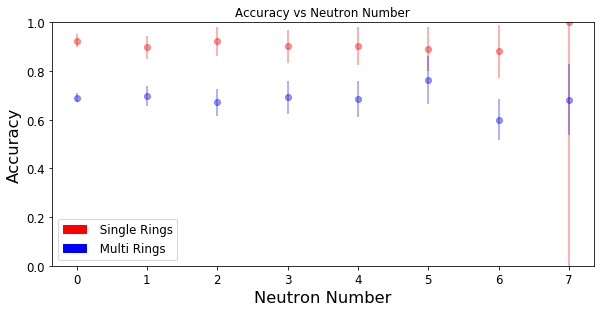

In [277]:
# plotting the points 
plt.rcParams['figure.figsize'] = [17/2, 9/2]
x=range(0,8)
plt.errorbar(x, Neutron_AccSR,errorSR,c='red', fmt='o',alpha=0.4,) 
plt.errorbar(x, Neutron_AccMR,errorMR,c='blue', fmt='o',alpha=0.4)
plt.ylim(0, 1)
red_patch = mpatches.Patch(color='red', label=' Single Rings')
blue_patch = mpatches.Patch(color='blue', label=' Multi Rings')
plt.legend(handles=[red_patch, blue_patch],loc='best')
#plt.legend()
# naming the x axis 
plt.xlabel('Neutron Number') 
# naming the y axis 
plt.ylabel('Accuracy') 
  
# giving a title to my graph 
plt.title('Accuracy vs Neutron Number') 
  
# function to show the plot 
plt.tight_layout()
plt.show() 

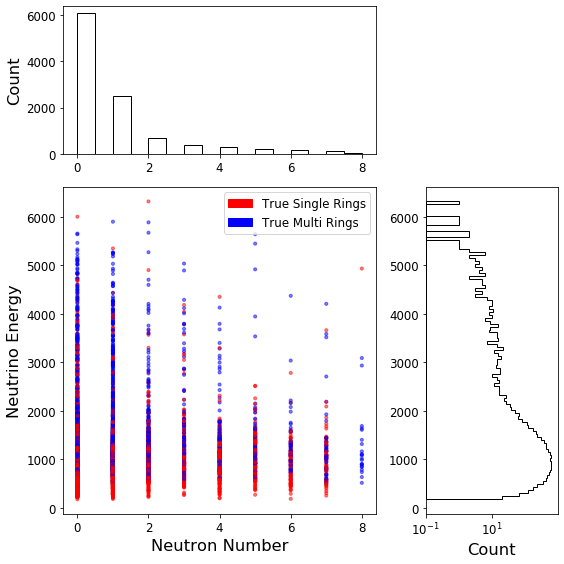

In [218]:
colors = y0colors = ['red' if value > 0.5 else 'blue' for value in Y[100000:,0]]

fig = plt.figure(figsize=(8,8))
plt.title('Ring Counting 83% acc on testset with 20k events')
gs = gridspec.GridSpec(3, 3)
ax_main = plt.subplot(gs[1:3, :2])
ax_xDist = plt.subplot(gs[0, :2],sharex=ax_main)
ax_yDist = plt.subplot(gs[1:3, 2],sharey=ax_main)


ax_main.scatter(NeutronNumber[100000:],NeutrinoEnergy[100000:],s=area, c=colors, alpha=0.5)#
ax_main.set(xlabel="Neutron Number", ylabel="Neutrino Energy")
#ax.title('Single Ring Prediction vs Energy')


red_patch = mpatches.Patch(color='red', label='True Single Rings')
blue_patch = mpatches.Patch(color='blue', label='True Multi Rings')
ax_main.legend(handles=[red_patch, blue_patch],loc='upper right')


ax_xDist.hist(NeutronNumber[100000:] ,bins=16, align='mid', color='green',histtype='stepfilled',fill=False, log=False)
#ax_xDist.hist(y2,bins=10,histtype='step',normed=False,color='blue',align='mid',log=True)
ax_xDist.set_ylabel('Count')
#ax_xDist.text(1, 1, 'Test', #style='italic',bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
#ax_xCumDist = ax_xDist.twinx()
#ax_xDist.hist(y1,bins=100,cumulative=False,histtype='step',normed=True,color='blue',align='mid')
#ax_xCumDist.tick_params('y', colors='r')
#ax_xCumDist.set_ylabel('Singlering',color='r')

ax_yDist.hist(NeutrinoEnergy[100000:],bins=100,orientation='horizontal',color='black', align='mid',fill=False,histtype='stepfilled',log=True )
#ax_yDist.hist(x2,bins=10,histtype='step',orientation='horizontal',normed=False,color='red',align='mid',log=True)
ax_yDist.set(xlabel='Count')


plt.tight_layout()
plt.show()

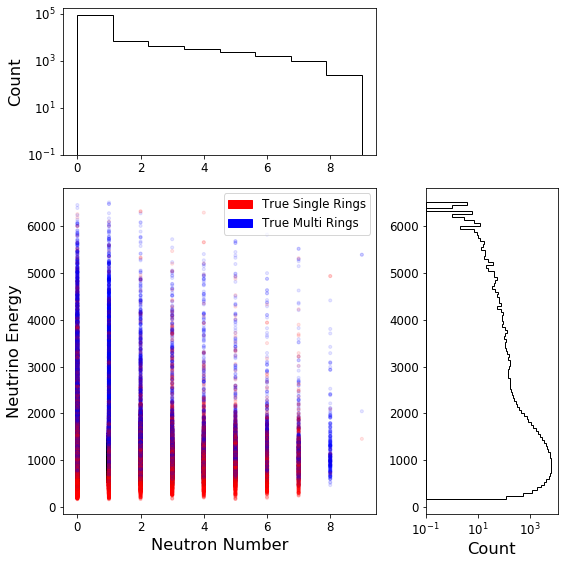

In [212]:
colors = y0colors = ['red' if value > 0.5 else 'blue' for value in Y[:,0]]

fig = plt.figure(figsize=(8,8))
plt.title('Ring Counting 83% acc on testset with 20k events')
gs = gridspec.GridSpec(3, 3)
ax_main = plt.subplot(gs[1:3, :2])
ax_xDist = plt.subplot(gs[0, :2],sharex=ax_main)
ax_yDist = plt.subplot(gs[1:3, 2],sharey=ax_main)


ax_main.scatter(NeutronNumber[:],NeutrinoEnergy[:],s=area, c=colors, alpha=0.1)#
ax_main.set(xlabel="Neutron Number", ylabel="Neutrino Energy")
#ax.title('Single Ring Prediction vs Energy')


red_patch = mpatches.Patch(color='red', label='True Single Rings')
blue_patch = mpatches.Patch(color='blue', label='True Multi Rings')
ax_main.legend(handles=[red_patch, blue_patch],loc='upper right')


ax_xDist.hist(NeutronNumber[:] ,bins=8, align='mid', color='green',histtype='stepfilled',fill=False, log=True)
#ax_xDist.hist(y2,bins=10,histtype='step',normed=False,color='blue',align='mid',log=True)
ax_xDist.set(ylabel='Count')
#ax_xDist.text(1, 1, 'Test', #style='italic',bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5})
#ax_xCumDist = ax_xDist.twinx()
#ax_xDist.hist(y1,bins=100,cumulative=False,histtype='step',normed=True,color='blue',align='mid')
#ax_xCumDist.tick_params('y', colors='r')
#ax_xCumDist.set_ylabel('Singlering',color='r')

ax_yDist.hist(NeutrinoEnergy[:],bins=100,orientation='horizontal',color='black', align='mid',fill=False,histtype='stepfilled',log=True )
#ax_yDist.hist(x2,bins=10,histtype='step',orientation='horizontal',normed=False,color='red',align='mid',log=True)
ax_yDist.set(xlabel='Count')


plt.tight_layout()
plt.show()

## Kaon

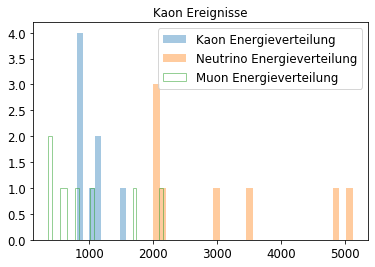

In [116]:

MuonEn=[]
KaonEn=[]

dummyindex=[]
for event in range(len(feature_maps)):
    if KaonE[100000+event] ==0:
        dummyindex.append(0)
        continue
    else:
        dummyindex.append(1)
        if len(KaonE[100000+event])==1:
            KaonEn.append((float(KaonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
        if len(KaonE[100000+event])==2:
            KaonEn.append((float(KaonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
            KaonEn.append((float(KaonE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
        if len(KaonE[100000+event])==3:
            KaonEn.append((float(KaonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
            KaonEn.append((float(KaonE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
            KaonEn.append((float(KaonE[100000+event][2]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
KaonEn=np.array(KaonEn)

for event in range(len(feature_maps)):
    if MuonE[100000+event] ==0:
        continue
    else:
        if len(MuonE[100000+event])==1 and dummyindex[event]==1:
            MuonEn.append((float(MuonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
        if len(MuonE[100000+event])==2 and dummyindex[event]==1:
            MuonEn.append((float(MuonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
            MuonEn.append((float(MuonE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
        if len(MuonE[100000+event])==3 and dummyindex[event]==1:
            MuonEn.append((float(MuonE[100000+event][0]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
            MuonEn.append((float(MuonE[100000+event][1]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
            MuonEn.append((float(MuonE[100000+event][2]),NeutrinoEnergy[100000+event],feature_maps[event,:],Y[100000+event,:]))
MuonEn=np.array(MuonEn)

pyplot.hist(KaonEn[:,0], bins=8, alpha=0.4, label='Kaon Energieverteilung')
pyplot.hist(KaonEn[:,1], bins=30, alpha=0.4, label='Neutrino Energieverteilung')
pyplot.hist(MuonEn[:,0], bins=30, alpha=0.5, label='Muon Energieverteilung',histtype='step', stacked=True, fill=False)

pyplot.legend(loc='upper right')
pyplot.title('Kaon Ereignisse')
pyplot.show()


In [108]:
KaonEn [:,0]

array([1572.68, 809.283, 887.41, 799.162, 1009.34, 887.758, 1106.48,
       1103.99], dtype=object)

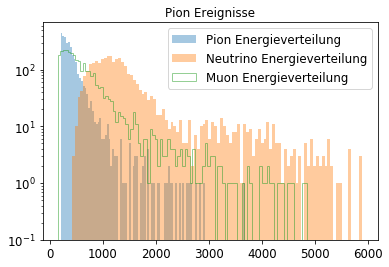

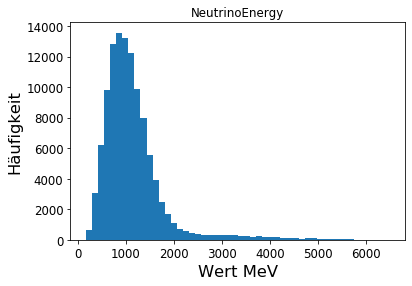

In [19]:


plt.hist(NeutrinoEnergy, bins=50)
plt.title("NeutrinoEnergy")
plt.xlabel("Wert MeV")
plt.ylabel("Häufigkeit")
plt.show()

In [26]:
EnerglisteSR=[]
RightEventsSR=[]
EnerglisteMR=[]
RightEventsMR=[]
for event in range(len(feature_maps)):
    if Y[100000+event,0]>0.5 and feature_maps[event,0]>0.5:
        RightEventsSR.append(feature_maps[event,0])
        EnerglisteSR.append(NeutrinoEnergy[100000+event])
    if Y[100000+event,1]>0.5 and feature_maps[event,1]>0.5:
        RightEventsMR.append(feature_maps[event,0])
        EnerglisteMR.append(NeutrinoEnergy[100000+event])

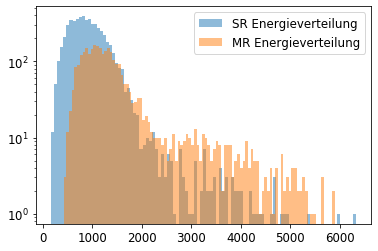

In [36]:
pyplot.hist(EnerglisteSR, bins=100, alpha=0.5,log=True, label='SR Energieverteilung')
pyplot.hist(EnerglisteMR, bins=100, alpha=0.5,log=True, label='MR Energieverteilung')
pyplot.legend(loc='upper right')
pyplot.show()

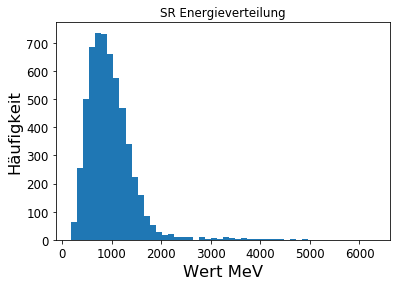

In [33]:
plt.hist(EnerglisteSR, bins=50)
plt.title("SR Energieverteilung")
plt.xlabel("Wert MeV")
plt.ylabel("Häufigkeit")
plt.show()

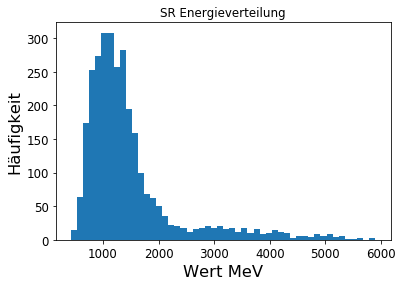

In [34]:
plt.hist(EnerglisteMR, bins=50)
plt.title("SR Energieverteilung")
plt.xlabel("Wert MeV")
plt.ylabel("Häufigkeit")
plt.show()

In [32]:
plt.scatter(EnerglisteSR,RightEventsSR,s=area,log=True  alpha=0.5)#
#ax.title('Single Ring Prediction vs Energy')
plt.ylabel('Single Ring Probability')
plt.xlabel('Energy [MeV]')

plt.show()

SyntaxError: invalid syntax (<ipython-input-32-9e86fe9b1164>, line 1)

In [ ]:
plt.scatter(RightEventsSR,EnerglisteSR,s=area,  alpha=0.5)#
#ax.title('Single Ring Prediction vs Energy')
plt.xlabel('Multi Ring Probability')
plt.ylabel('Energy')

plt.show()

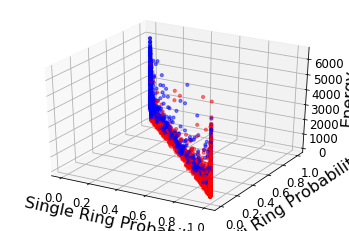

In [24]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt



fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

colors = y0colors = ['red' if value > 0.5 else 'blue' for value in Y[100000:,0]]#(0,0,0)
area = np.pi*3

# Plot
ax.scatter(feature_maps[:,0],feature_maps[:,1],NeutrinoEnergy[100000:],s=area,c=colors,   alpha=0.5)#
#ax.title('Single Ring Prediction vs Energy')
ax.set_xlabel('Single Ring Probability')
ax.set_ylabel('Multi Ring Probability')
ax.set_zlabel('Energy')
plt.show()